In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd 
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
import pickle

In [2]:


# Read in the data
df=pd.read_excel("shuffled_gunlaw.xlsx")
df.columns=['i','date','Tweet','label']        
print (f"Shape of dataframe is {df.shape}")
df.head()
X=df['Tweet']



Shape of dataframe is (13685, 4)


In [3]:
import re  

import spacy

nlp = spacy.load('en_core_web_sm')

processed_tweets=[]

for tweet in range(0, len(X)):  
    processed_tweet = re.sub(r'\W', ' ', str(X[tweet]))

            
    # Remove all the special characters
    
    processed_tweet = re.sub(r'http\S+', ' ', processed_tweet)
    
    #processed_tweet = re.sub(r'https?:\/\/+', ' ', processed_tweet)
    
    #processed_tweet=re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', ' ',processed_tweet)
    
    processed_tweet=re.sub(r'www\S+', ' ', processed_tweet)
    
    processed_tweet=re.sub(r'co \S+', ' ', processed_tweet)
    # remove all single characters
    processed_tweet = re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_tweet)
 
    # Remove single characters from the start
    processed_tweet = re.sub(r'\^[a-zA-Z]\s+', ' ', processed_tweet) 
 
    # Substituting multiple spaces with single space
    processed_tweet= re.sub(r'\s+', ' ', processed_tweet, flags=re.I)
 
    # Removing prefixed 'b'
    processed_tweet = re.sub(r'^b\s+', ' ', processed_tweet)
    
    processed_tweet = re.sub(r'\d','',processed_tweet)
    
    processed_tweet= re.sub(r'\s+', ' ', processed_tweet, flags=re.I)

 
    # Converting to Lowercase
    processed_tweet = processed_tweet.lower()
    
    processed_tweets.append(processed_tweet)
    
print (processed_tweets)    


 

[' sensanders bernie promoting federal tax on anyone improving and selling dilapidated homes bernie is competing with fellow socialist maduro to see who can crush their populations quickest drainthedeepstate fridayfeeling election democraticdebate guncontrol', 'rt mcjovy wonder how fetus lovers defend khidrs cold blooded murder of some brat al kahf what would they say if khidr was around ', 'rt chronovarience texas mass shooting survivor lobbies congress for less gun control notonemore enough bullym ', 'the next time you hear an elite or wealthy democrat call for guncontrol please remind them that guncontrol was founded to disarm freed slaves an excellent interview below mrcolionnoir dloesch stacyontheright nra', ' olofsdotterk royarahmani nzambassadorus marshablackburn emilyslist repspanberger rephoulahan repelaineluria yoyo_ma speakerpelosi jeffreygoldberg speakerpelosi says trump called today about gunviolence theatlanticfest ukraine', 'arizona state representative jen longdon is gu

In [20]:
import csv
a=df['i']
d=df['date']
l=df['label']
i=0
for entry in processed_tweets:
    with open ('f_a1.csv','a', encoding="utf-8") as res:        
        writer=csv.writer(res)           
        s="{},{},{},{}\n".format(a[i],d[i],entry,l[i])
        res.write(s)
        print (s)
    i+=1     
        

0,2019-09-20, sensanders bernie promoting federal tax on anyone improving and selling dilapidated homes bernie is competing with fellow socialist maduro to see who can crush their populations quickest drainthedeepstate fridayfeeling election democraticdebate guncontrol,for

1,2019-09-28,rt mcjovy wonder how fetus lovers defend khidrs cold blooded murder of some brat al kahf what would they say if khidr was around ,against

2,2019-09-23,rt chronovarience texas mass shooting survivor lobbies congress for less gun control notonemore enough bullym ,for

3,2019-09-27,the next time you hear an elite or wealthy democrat call for guncontrol please remind them that guncontrol was founded to disarm freed slaves an excellent interview below mrcolionnoir dloesch stacyontheright nra,for

4,2019-09-24, olofsdotterk royarahmani nzambassadorus marshablackburn emilyslist repspanberger rephoulahan repelaineluria yoyo_ma speakerpelosi jeffreygoldberg speakerpelosi says trump called today about gunviolenc


50,2019-09-25,if you are going to fight for guncontrol please educate yourself first people are laughing at you ,for

51,2019-09-22,shame on him for coming to colorado to expound upon our tragedies election betoorourke colorado guncontrol massshooting secondamendment ,for

52,2019-09-21,since the gop like using the term radical islamic terrorists propose we now use the term radical nra terrorists in our campaign against weapons of war come to think of it assault weapons are weapons of mass destruction banassaultweapons guncontrol gun,for

53,2019-09-25,rt arcom what is binary trigger how the franklinarmory bfs iii works franklinarmory bfsiii binarytrigg ,against

54,2019-09-21, notacentrist iansams neeratanden jrubinblogger and bernie voted against the brady bill times marchforourlives will never support someone who was such tool for the nra ,for

55,2019-09-19,rt ktnv breaking colt will stop making ar rifles for consumers ,against

56,2019-09-19, essenviews well it looks like blood a


97,2019-09-27,rt jmdaumeyer mary mother of the unborn prolife praytoendabortion praytherosary ,against

98,2019-09-26,this popped up on my memories today of the time my wife dressed up fancy to fundraise to defend helpless babies and they left storm trooper helmet laying around her true colors came out quick charlyrowe prolife ,against

99,2019-09-22,new hi cap assault mag for revolvers on sale at your lgs and wallmarts everywhere gunsense guncontrol guncontrolnow a ,for

100,2019-09-20,it a start ar ,against

101,2019-09-25,he supports redflag gun confiscation orders and has indicated he is open to supporting ban on semi automatic firearms the so called assaultweapons ban guncontrol guncontrolnow ndamendment shallnotbeinfringed,for

102,2019-09-22,rt gunvictimsact we re done asking elliot fineman ceo of national gun victims action council joined tim farley on the morning briefin ,for

103,2019-09-23,rt proa_tactical new uppers in stock inch uppers featuring ballistic advantage inch n


146,2019-09-21,rt dstroyr_ub how to buy guns ammo and more at wholesale gunsense guncontrol molonlabe nra ammunition ,for

147,2019-09-25,more proof america must impeachbarr this is blatant corruption in the open is barr also arguing that an attorney general cant be investigated we americans dont like kings the adefender patriots fought against this tyranny before it wont go well now ,against

148,2019-09-19,it a trick by the rich trump maga democrats libertarian conservatives meme conservativememes usa ,against

149,2019-09-24,stay ready so aint got to get ready guncontrol guncontrolnow guns gun impeachtrump enoughisenough marchforourlives gunreform freedom gunrights endgunviolence resist gunlaws ,for

150,2019-09-20,beto says the federal government will pass law to confiscate selective firearms and americans will comply nys just tried to get people to admit they owned them americans will not comply thank god ar beto bethe ,against

151,2019-09-20,as of september have contracted lung


191,2019-09-27,if devin nunes were in congress in the s we would ve heard about how seat belts are an affront to legal driving citizens everywhere and how accidents only happen in urban areas gunviolence pathetic,for

192,2019-09-22, will the fbi be going door to door who will feel safer after mandatorybuyback is complete sundaygunday guncontrol openborders antifa democrat beto fakenews army lgbt college berniesanders elizabethwarren socialism trump california joebudden ,for

193,2019-09-20,rt boreguru lol wait until robert francis finds out that citizens own tanks and nfa class iii belt fed crew served machine guns beto ,against

194,2019-09-27, gateway pundit news trump attorney rudy giuliani is quickly becoming the deep state slayer video maga a prolife,against

195,2019-09-21,rt mattbc senatedems sensherrodbrown brianschatz chrismurphyct leading senate dems on gunviolence took to the floor of the us se ,for

196,2019-09-23,when realdonaldtrump finally goes to jail rudygiuliani sho


237,2019-09-23, breakingnews gunviolence whatyouchoosetodowithaweapon texastech star and nba player andreemmett killed in dallas texas dallaspd asking for any information on incident prayers and condolences to family friends via robertwilonsky ,for

238,2019-09-27,rt texastweetybird guncontrol is not protection for you but protection from you wakeupamerica a iamthenr ,for

239,2019-09-21, am here to say hell no you re not lauren boebert business owner colorado resident what compelling interview this patriotic woman this morning on foxandfriends the last thing she said was glory to god amp to that say amen betoorourke guncontrol a ,for

240,2019-09-21,the sad thing about justintrudeau proposed ar ban is that is he about to make lot of honest gun owners and good people criminals if that goes through thanks to lame publicity stunt aimed at deflecting his recent stupidity blackface ar,against

241,2019-09-19,rt boreguru betoorourke youre getting offshore account deposits from all the ar m


284,2019-09-27, arpistolshooter repost from androidsnyder good day to clean ar arpistol bcm bcmgunfighter lmt trijicon primaryarms arpistol arpistolshooters ftactical ftacticaltraining ftactical f ,against

285,2019-09-27,well done to the garda commissioner drew harris for straight up telling simonharristd what us prolife people have been saying all along have the nwci orlanwci any comment on this devastating statement that completely exposes their blatant lies,against

286,2019-09-27,rt zelmanpartisans dems traded gun control for chance to hurt gop a ndamendment guns gunowners gunlaws ,against

287,2019-09-19,rt fraser__mooney this piece from erinlschumaker about the funding challenges faced by gunviolence researchers is an essential read fo ,for

288,2019-09-22,the homeowner was retired los angeles firefighter crime guncontrol losangeles secondamendment selfdefense ,for

289,2019-09-27,former cop tells congress will not comply if assault weapons are banned ndamendment constitution g


333,2019-09-19,rt larashockley men if she doesnt like milton friedman keep moving liberalismisamentaldisorder libertarian conservative,against

334,2019-09-27, wwgwga_ww just retweeted and followed him trump wwgwga maga kag buildthewall prolife backtheblue veteransoverillegals neverforgetbenghazhi draintheswamp womenfortrump freegeneralflynn ,against

335,2019-09-27, jimpethokoukis thats what happens when you want stuff so bad that you ignore the consequences of empowering the unqualified am predicting more worse fallout hope not a prolife taxcuts trump,against

336,2019-09-27,when did walmart grow conscience the boston globe good piece re sustainability guncontrol and csr ,for

337,2019-09-26,dear anti guncontrol amp ndamendment enthusiasts no one wants to take away all firearms ve never heard democrat suggest taking everyone guns away so stop being hysterical amp accept that we need commonsensegunlaws to keep ppl safe in america gunsense sandyhook,against

338,2019-09-27,rt righttol


378,2019-09-26, warnerbros responds to joker gunviolence concerns from aurora victims families variety ,for

379,2019-09-26,there is no cause for jubilation in nsw today when the death knell has sounded in parliament for unborn children this bill unlocks floodgates to late term abortions amp will increase the tide of abortions in australia today remember every abortion kills baby nswpol prolife,against

380,2019-09-26,rt mab by comparing the guncontrol movement to the civil rights movement sen richard blumenthal is demonstrating his ignorance ,for

381,2019-09-23,a conservatives view of the constitution nd amendment that is all guncontrol guncontrolnow momsdemand everytown activeshooter massshooting sandyhook,for

382,2019-09-27, betoorourke buy them back you never owned them in the first place ndamendment constitution,against

383,2019-09-19,rt tribulationthe democrats voted against red flagging known gang members choosing instead to use the controversial gun control method ,for

384


427,2019-09-27,rt whippenz resisterforever lizliotti namasteawake ruizsweet hooshy tactlessmike lifeformzero geezerwalker samwitchredtent ,for

428,2019-09-21, newtownaction fbi amandachaseva brilliant example of how red flag laws will be abused bawn banassaultweaponsnow allguncontrolisracist guncontrolnow commonsense gunreformnow a gunsense guncontrol guns expectus nullify willnotcomply allhoplophobesarebad wearorange repealthenfa freemendontask ,for

429,2019-09-25,rt lastchanceusa as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within th ,against

430,2019-09-25,rt scooterbraun cameron we heard your call on march we march if the kids can do it so can the adults this isn about citizens ,for

431,2019-09-26, kayleighmcenany realdonaldtrump lol we are all parodies now can we get some parity ilovewomen prolife momsneedmoney,against

432,2019-09-21,rt westjournalism if gun grabbers had gotten their way the residents might now be 


476,2019-09-25,chinese groups debate supporting us gun ban activists says report communism gunrights guncontrol freedom via amermilnews,for

477,2019-09-24, senategop are you cowardly people really prepared to leave fractured country to your children and grandchildren just to save your silly little jobs impeachtrump usa tfa cnn gop senate foxnews msnbc marchforourlives nytimes moscowmitch,for

478,2019-09-27, gateway pundit news shadow government deep state intel community secretly altered rules on whistleblowers this past year to include operatives upset with hearsay and fake news reports video maga a prolife,against

479,2019-09-21, mattwalshblog mondays we skip school to protest climatechange tuesdays lgbtqrights wednesdays guncontrol thursdays studentloandebt fridays freechoice day how does that sound to everyone,for

480,2019-09-23, realcanadian tinayazdani citynews canborder rcmp wanted to point out that guncontrol laws in this country are and should be matter for the parliament


524,2019-09-20,rt broadandliberty as congress comes close to debating the first substantive guncontrol measures in decades one man has been at the fo ,for

525,2019-09-22, nycgov who ultimately pays the price for giving them this govt mandated paid time off its the customers of these companies that wind up paying for it hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

526,2019-09-24,rt arnold_ventures finding the root cause as to why gunviolence takes place should be top of mind among politicians in washington ab ,for

527,2019-09-23,rt gott_arun hilltvlive aclu im nm gunviolence survivor vet ptsd hiv mmj hindu ampreported nmstatepolice sierracountynm deputies ,for

528,2019-09-25,lot of libertarian facebook drama today jesus christ,against

529,2019-09-19, freedomfirstent a nra walkaway kag maga kag guncontrol opencarry scares away derangedliberalshooters ,for

530,2019-09-27, the real agenda destroy the economy take


567,2019-09-27, betoorourke naral translation for half century naral has never stopped killing babies and focusing its efforts in particular on black communities and if trustafarianbeto has his way theyll keep on killing for more prolife abortion,against

568,2019-09-28,go get em rudy realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder saveourbabies walkaway ,against

569,2019-09-25,are you pro a a handgun mm acp glock gunsdaily weaponsdaily guns pewpewlife armandgun eh molonlabe m ma ar firearm blackrifle semiauto machinegun gunscanada nra ammo pewpewpew pewpewandchill pew weapons mk weapon guns secondamendment ,against

570,2019-09-22,rt stacos last hrs gun death ferry st everett ma gun inj shot cherry st fall river ma gun inj shot silsbee st ,for

571,2019-09-20,rt act_america tuckercarlson spoken like true clueless libertarian lancesilverback ,against

572,2019-09-21,if youre 


617,2019-09-22,these people want guncontrol polish poet wat wrote the loss of freedom tyranny abuse hunger would all have been easier to bear if not for the compulsion to call them freedom justice for the good of the people ,for

618,2019-09-20,back to school essentials sandy hook promise ban assault weapons gunreformnow guncontrolnow guncontrol via youtube,for

619,2019-09-25, the logic of anti gun people never cease to amaze me a ndamendment ruger ar gunrights guncontrol banassaultweapons ,for

620,2019-09-19,rt battleofever coltfirearms coltlkl please attempt to humor adefenders with an explanation of why youll no longer be making the ,against

621,2019-09-22, spudlovr wisconsinstrong there are no constitutional rights there are inherent rights and the only limit to rights is they do not infringe upon the rights of others guncontrol is tyranny gunsense is nonsense,for

622,2019-09-22, kimberly_fern rosenstand betoorourke melbuns imagine having this amount of paranoia and fear this 


664,2019-09-19, we need to see lot more of yall showing up to vote in thank you for all youre doing climatechange guncontrol provaccines ,for

665,2019-09-19,tw school shootings that this is in any way necessary is utterly insane the number of pro gun idiots in america is staggering especially considering that they should be better educated than this generation given their schools werent potential warzones guncontrol gunreform ,for

666,2019-09-23,luke wenke signs luke wenke signs everywhere libertarian votelibertarian nypolitics ,against

667,2019-09-23,rt sharpe_way when you have conversation with someone and start bullying them and making personal attacks you ve lost any chance to ,against

668,2019-09-19, cspan secelainechao she lies the one national program will ensure that there is one and only one set of gun safety regulations no state has the authority to opt out of the nations rules and no state has the right to impose its policies everybody else guncontrol ,for

669,2019-09-


710,2019-09-26,imo thesquad should rethink their thoughts along with betoorourke you will never take our guns period adefender ilhanomar aoc betoorourke nra news unitedstates unitedstatespoliticsandgovernment ,against

711,2019-09-20,rt conserv_tribune shes exactly right and more innocent people will die if the left gets its way on gun control assault betoorourke ,for

712,2019-09-19,wow this is amazing gunmaker doing the right thing before the weak ass republicans in the senate could finally step up and do it themselves weapons like the ar have no place on our streets ,against

713,2019-09-20, dudleywbrown tell them to shove their guncontrol up their ass thank you,for

714,2019-09-23, disrupt amp occupy steamingpileoftrump properties impeachtrumpnow then lockhimup resist resistance veteransresist metoo alllivesmatter marchforourlives veteransagainsttrump ,for

715,2019-09-26, adamantanarchy all major political parties are socialist in my beloved socialist canada there is one libertar


759,2019-09-26,being men they may not talk about it but they are just as likely as women to suffer ptss post traumatic stress syndrome after an abortion votenotoabortion prolife ,against

760,2019-09-27,cowards and spin doctors vs square shooters abortion prolife medicine science lies co,against

761,2019-09-26,if prolife person supports autismspeaks they are hypocrite autism peaks wants to find and abort foetuses that show autistic genetics which havent even been proven to exist can the pro life movement stand up for us too autism actuallyautistic,against

762,2019-09-26,outstanding mr president thank you for asserting the god given unalienable right to life of all human beings and for defending our nations sovereignty unga prolife ,against

763,2019-09-20,smith amp wesson ampp sport ii semi automatic rifle ar nato barrel shop now your online tactical superstore becausewerenotdicks pewpewlife pewpew pdw ar ar ,against

764,2019-09-26,thank you as prolife american thank you secpompeo 


802,2019-09-27,heartbreaking and right now in mexi liberal left and the circus of godless politicians are parroting the same mistakes americans have commited abortion transformaciondecuarta prolife antiabortion ,against

803,2019-09-26,foreign leaders no need to go far from usa to get dirt on trump stormydaniels incometax mueller bolton bordersecurity kremlin daca lobbyists manafort guncontrol and the list goes on impeach potus impeachdonaldtrumpnow ,for

804,2019-09-20,once again scheer displays his two faced positions by associating with alt right activists on important public policy issues of concern to canadians like gun control and banning military designed automatic weapons guncontrol ,for

805,2019-09-22, mmflint why would you erase the years of work gunviolence prevention activists have done on this issue think even betoorourke himself would be first to admit that he has stood on the shoulders of anonymous red shirted giants,for

806,2019-09-21,rt ishat_reza scheer we have to 


849,2019-09-27,rt tenthamendment they sure didnt mince words back then constitution thamendment treason founders liberty libertarian quote quotes qotd truth politics wisdom tlot tcot p ctl ,against

850,2019-09-20,rt tenthamendment we agree with walter williams nullify nullification constitution resist thamendment liberty libertarian quo ,against

851,2019-09-23,check out can_libertarian awesome vids great libertarian content ppc ppc ppc berniernation cbcanso ,against

852,2019-09-19,rt theextremista customs union is not free trade agreement and libdem is not libertarian thank you guy to show the real ,against

853,2019-09-20,look at prestonjbyrne with the opening slot si_week the most difficult slot at any eventhe likes bitcoin cryptotwitter libertarian am libertarian so my clients tend to be libertarian ,against

854,2019-09-28,wth these stupid americans have no regard for life realdonaldtrump what are you doing to stop violence in your country violence gunviolence ,for

855,2019-09


896,2019-09-21, americans should be taking to the streets screaming for realdonaldtrump to stop preventing oversight of his corrupt administration impeachtrump tfa usa cnn msnbc dems senate moscowmitch marchforourlives nytimes wapo treasonoustrump,for

897,2019-09-26,in common interest politics we with all min wage socialhousing mortgagedistress relief homelesscrisis tradeunion rights etc amp where differ we have respectful debate on issues prolife unitedireland eu or whichever wish paulmurphy_td all the best ,against

898,2019-09-25,rt gbprezt was jesus socialist trump maga democrats libertarian conservatives meme conservativememes usa ,against

899,2019-09-19,rt danegerus guncontrol still the wrong solution to the wrong problem democrats want to hide the slaughter in ,for

900,2019-09-25,rt maryruwart the waronterror kills many times more innocents than terrorists labeling these deaths collateral damage doesnt bring ,against

901,2019-09-20, woman confronts beto on guncontrol confis


939,2019-09-19,a one person airplane crashes or coli shows up in one bag of spinach and team of federal employees rushes to diagnose the problem rework regulations amp provide solutions yet daily gunviolence amp school shootings no such response congress is failure ,for

940,2019-09-19,popular gun maker colt will be suspending production of civilian market rifles including ar s ktvonews colt guncontrol,for

941,2019-09-28,rt diablo_aod charowen gtpnv suckmymod andrewyang realdonaldtrump berniesanders have you guys seen the list of politicians th ,against

942,2019-09-28,god trusts every mother and gives the right to life to every unborn child abortion everychildmatters prolife feticide infanticide againstabortion childrenmatter probirth prochoice postbirthabortion bible plannedparenthood unplannedpregnancy bansoffmybody ,against

943,2019-09-20,we can play this game too dont buy anything from colt ar colt,against

944,2019-09-28,rt lynnhackett nutopiarocks tomsuz thebradfordfile inthe


987,2019-09-22,rt bigfatdave updated again nice little animation of guncontrol nonsense aka gunsense losing ground gun grabbers amp hoplophobes ,for

988,2019-09-19,get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

989,2019-09-23, donaldjtrumpjr so shes ok with firearms that weigh less than boxes and fire rounds smaller than cal im good with that its commonsense guncontrol ,for

990,2019-09-26,rt ilagibbs as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

991,2019-09-28,rt realomarnavarro am officially running for congress as republican against maxine waters in please spread the message follow ,against

992,2019-09-21,rt stairdel_usmcr when democrats push for universal background checks the danger of national gun registry looms ,for

993


1034,2019-09-27, gateway pundit news the hits keep coming another glaring mistake in cia official whistleblower report maga a prolife,against

1035,2019-09-20,how about instead of our political leaders focusing on data with facebook they work on guncontrol and vaping and actually get something done soannoyed hawley congress platformuse change,for

1036,2019-09-26,rt lawyersforjesus tune in today to hope as we discuss the strategy and road ahead for overturning roe wade with clarkeforsythe ,against

1037,2019-09-27,in return for financial support for president trumps defense amid an impeachment inquiry nra ceo wayne lapierre asked the white house to stop the games over gun control legislation gunviolence,for

1038,2019-09-23,rt la_the_bogen m pretty chill about most things but was deeply disturbed hearing small child desperately asking his mother to buy hi ,for

1039,2019-09-27,rt synchrinity urge everyone reading this to read about canadas gun laws they are very strict and very compre


1079,2019-09-27,rt meganranney the public health approach works to help prevent epidemics and it works quickly and it works often in unexpected way ,for

1080,2019-09-19,rt daniellehaynes the report from democrat repmaloney points to the direct income healthcare and indirect quality of life costs of ,for

1081,2019-09-23,one problem with us politics sports team culture with win lose tribal thinking no candidate is perfect what do you disagree on with the candidate you support am bernie love him disagree on record on guncontrol nra vs abolishfilibuster courtpacking,for

1082,2019-09-26,now that a really fascinating exchange history ndamendment ,against

1083,2019-09-19,living in sweden this seems like dark description of frightening but imaginary future if we didn have our tough restrictions concerning gun control but this is usa years ago nohope guncontrol supervised murders kids nochildhood columbine yrs ,for

1084,2019-09-28,trump meets with lapierre to discuss how nra could support


1122,2019-09-19,rt sonslibertytees consider this a ndamendment billofrights constitution defendthesecond donttreadonme firearms gun guncont ,against

1123,2019-09-27, rtr morganisawizard disagree this drooling idiot should continue to shout from the rooftops the real goal of lefties they want to take away our ndamendment rights and confiscate our guns at least he is honest a,against

1124,2019-09-19,one thing you can do to stop gun violence child abductions amp racism from happening is to spread awareness how can you spread awareness keyarah lausdmagnets laschools kmcb gunviolence racism childabductions spreadawareness askaquestion ,for

1125,2019-09-19,once the madness of the unconstitutional oppression the democrats are promising passes as it will there will be an accounting before the law a gunsense guncontrol maga tcot uniteblue,for

1126,2019-09-26, breaking motivation for homicide not robbery not gang violence not mass shootings arguing arguing is the number one motivation for m


1166,2019-09-21,for your consideration grammy voters take the guns away by nicolette aubourg categories american roots song amp performance record amp song of the year addresses the epidemic of mass shootings and gun violence produced by erikeldenius fycamericanroots grammy guncontrol ,for

1167,2019-09-23,is now the time to talk about gunviolence,for

1168,2019-09-23,colt ends sales of civilian ar msm lies about it ar guncontrol fakenews coltmanufacturing epicfail ndamendment nra msm daybydaycartoon realdonaldtrump thediplomad tomkratman ,against

1169,2019-09-25, senrobportman this american would like you to identify your plan to address gunviolence in ohio dosomething senrobportman,for

1170,2019-09-19, berniebros are berniesistas seniorsforbernie medicareforall cannabis sun grown in texas gardens as god said genesis bernie is about freedom justiceforall scares democrats republicans libertarian donorschoose laws passed wethepeople are berniedonors ,against

1171,2019-09-21, mzambre


1215,2019-09-26, presssec they have they passed common sense guncontrol legislation hr separate civil rights bills separate health care bill mainly aimed at protecting preexisting conditions and lowering prescription drug costs election protection bills moscowmitch keeps killing ,for

1216,2019-09-25, jonahnro they will ban some already have thus creating demand for black market vaping products which are the cause of much the health problems to begin with and return to actual smoke in the form of cigarettes and weed again not very healthy guncontrol,for

1217,2019-09-28,rt alaskawatchman alaska prolife advocates overcome fears insults to publicly pray outside abortion clinic htt ,against

1218,2019-09-19,as the subtitle to the article already states guess that betos plan to create governmental buyback program on ar s might have fired back on him gunreformnow gunviolence guncontrol guncontrolnow us usa news breaking trump ,for

1219,2019-09-25,rt donhuffines texas elected know it all l


1257,2019-09-25,pelosi still hopes trump will work with her after pointed impeachment attempt congress democrats donaldtrump guncontrol guns nancypelosi politics trumpadministration ukraine usnews worldnews ,for

1258,2019-09-20,one person was killed and five others wounded on thursday in shooting on the streets of washington dc not far from the white house police said gunviolence ,for

1259,2019-09-26,washington congress wasn doing much legislatively in this polarized environment president trump wasn exactly tearing through his policy to do list either drugspharmaceuticals enmnews guncontrol impeachment northamericanfreetradeagreement ,for

1260,2019-09-24,follow this account for up to date canadian guncontrol information statistics and facts were the gun control experts in canada cdnpoli elxn cdnhealth triggerchange toronto vancouver montreal ottawa,for

1261,2019-09-20, beto democratsaredestroyingamerica guncontrolnow guncontrol akfull betothegunsalesman betoorourke ar after betos 


1303,2019-09-20,rt wildpalmsltd is it just me trump has passed like two bills otherwise changing the law by fiat aka executive order he has otherwise ,for

1304,2019-09-27,found the criminal sympathizing pos gunsense a molonlabe guncontrol ,for

1305,2019-09-27, rohansuth samcaruth thomas_young bloviate_barbie benrondeau rokthunderpunch gooseycheeks how is that manipulated we have places where they have the guncontrol you need they are the most violent places no more explanation needed for the educated,for

1306,2019-09-20,shooting in dc in columbia heights area and person was killed gunviolence ,for

1307,2019-09-26,whether you vote for democrats or republicans you get the same substance more government in slightly different form instead of ripples and waves why not go for smooth sailing and less government and vote libertarian bet you can vote for just one libertarian ,against

1308,2019-09-19,rt kevintaylorit an illegal immigrant that is also on his security team and owns an ar gun


1356,2019-09-20, remember there is more than options when it comes to voting libertarian unlikelyreminders lpnational ,against

1357,2019-09-20,rt mahamosa another mass shooting in dc sigh guncontrolnow ammocontrolnow guncontrol,for

1358,2019-09-20,rt texastweetybird danpatrick_tx gregabbott_tx guncontrol wrong solution to the wrong problem mentalillnesscontrol ,for

1359,2019-09-28,rt noznews are you listening republicans libertarian ,against

1360,2019-09-26,video frankie darcell and journalist flood the drummer are talking trumpimpeachment inquiry legalizingmarijuana gunviolence frankiedarcell ,for

1361,2019-09-27,inspired by youth worldwide like autumn peltier amp takaiya blaney raising awareness about issues that matter to them most from climateaction to cyberbullying from gunviolence to animalprotection these activists have brought about real change ,for

1362,2019-09-27, ar do you think we should ban ar rifles ak fridaythought,against

1363,2019-09-21, realdonaldtrump you are


1402,2019-09-20,we are grateful to maria for her loving spirit and constant devotion to others and look forward to celebrating her hard work at the harvesting hope gala harvestinghope gala chicago chicagosurvivors survivors gunviolence stoptheviolence foundersaward thankyou,for

1403,2019-09-25,rt lourdesoverall scottleish coxeanne kossilar elbototheface kaijakat rainmirron whiskeysrevenge xplosivetweets kalikid samd ,against

1404,2019-09-20,just think of the impact on guncontrol if young americans took the same stance as climate control protesters imagine every school kid going on strike guncontrolnow gunreformnow,for

1405,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more crowdstrike kag ndamendment ,against

1406,2019-09-25, gateway pundit news boom president trump surges ahead of slimy joe biden by points in latest poll maga a prolife,against

1407,2019-09-21,rt scottguy need this sign gu


1450,2019-09-27,a regressive leftists understanding of guns a guncontrol ,for

1451,2019-09-26,designed with the customer in mind every time design art handmade style create paint custommade classic unique beautiful handcrafted designer gunsdaily igmilitia ar merica ,against

1452,2019-09-26, kamalaharris senkamalaharris aoc dnc speakerpelosi senfeinstein markwarnerva markwarner gee all of you being hypocrites amp liars over guncontrol gunviolence amp redflaglaws when the gop calls your bluff shocker realdonaldtrump ,for

1453,2019-09-26,volunteers across the state continue collecting signatures to end dismemberment abortions one church fair and house at time prolife,against

1454,2019-09-27,rt tactical_review the ndamendment does not grant rights it is not directed at the people it is directed at those who rule over us as ,against

1455,2019-09-20,rt tenthamendment stop relying on the federal government to limit itself that includes the federal courts too truth politics liber ,agains


1500,2019-09-27,rt waysmeanscmte heads up tomorrow at am ways amp means will hold hearing on the public health consequences of gunviolence in am ,for

1501,2019-09-19,ohio republican state senator turns her back on second amendment gunsense guncontrol maga,for

1502,2019-09-27,many people long ago would sacrifice children for the gods to produce optimal weather today many people sacrifice their children so that mother nature will not be harmed and produce optimal weather prochoice prolife abortion climatechange justredpills ,against

1503,2019-09-26,rt bremaininspain boris johnson could bypass key law blocking no deal brexit john major warns stopbrexit stopboris marchforourlives ,for

1504,2019-09-26,i believe in you guys marchforourlives ,for

1505,2019-09-20,wanna get ban on guns ll tell you the trick get bunch of black people to apply to legally carry guns thats it thanks for coming to my ted talk blacktwitter guncontrol activist myfirsttweet ,for

1506,2019-09-28,rt jaysekulow the


1543,2019-09-21,inside deadly american summer many were shot indoors america gun control now there is no other solution guncontrol trump,for

1544,2019-09-27,rt trmpsugly hey massacremitch time to get the ar off of our streets and out of the hands of civilians now how many babies need to ,for

1545,2019-09-25, senschumer leaving the gun violence prevention rally he says he on mission for better guncontrol ,for

1546,2019-09-21, carolvernon mikelevinca fred_guttenberg senatemajldr housedemocrats mikeforky mike has shown up across kentucky and attended spoke at the march for our lives gunviolence rally in louisville amy did not attend neither did she attend the first meeting of the newly formed kentucky democrat veterans group kydemvets kyblueblood kypatriot heathen,for

1547,2019-09-25,well you have gotten the ostrichs head out of the sand now can you get them to listen if this is where we are going like it teammuskox marchforourlives via zhirji,for

1548,2019-09-20,so interesting to w


1591,2019-09-23,rt kengreenberg watch jeromehudson calls out the left climate hypocrisy guncontrol hysteria on wattersworld draintheswamp ,for

1592,2019-09-22,rt ny_runaway the forgotten murders of the osage people for the oil beneath their land you think that after all these years of gun mi ,for

1593,2019-09-19,does colt firearms think that their stopping manufacturing ar is going to stop mass shooting then they are crazy there are m assaultstyle weapons out there if youre worried about people getting killed then stop producing guns maybe you can produce bow and arrows,against

1594,2019-09-27,tas prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun,against

1595,2019-09-20, breaking colt suspends production of ar for civilian market hats down colt ,against

1596,2019-09-25,rt stevebermel everyone this nys ban on vape juice is ridiculous the mph sp


1642,2019-09-21,police recover assorted guns from militias in zamfara millwall militaryhistory guncontrol zamfaratwitterconnect nigeria ,for

1643,2019-09-26,rt sheepdogsecurit as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within ,against

1644,2019-09-23,rt cdrake startribune discusses our finding in amjprevmed that less than of firearms listings on armslist displayed evidence of ,for

1645,2019-09-22,rt escapedmatrix thank you ben stiller for supporting our saveflintchallenge campaign but we have so much more work to do please tweet ,for

1646,2019-09-25,as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeunthank you for defending the babies,against

1647,2019-09-19,rt ladyredwave interesting report colt to cease ar production for the civilian market ,against

1648,2019-09-20,rt gott_arun 


1690,2019-09-21,we are proud to be longtime funder of harvard professor davidhemenways work addressing gunviolence in america follow the below link to hear his podcast on americas gun culture and how you can become gunviolenceprevention advocate ,for

1691,2019-09-22,our passion amp organization was on full display in iowa this shot tells the story our movement is spreading daily lets keep building the momentum beto votebluenomatterwho momsdemandaction marchforourlives climatechange ,for

1692,2019-09-25,rt stacy_redvirgo flashyred roxxxygurl armmid gmanfan wvufanagent trumpstertrump mo_an dananamama _goz patriot ,against

1693,2019-09-26, hobbie_vk nonchalahnt betoorourke being law abiding is well regulated shall not be infringed is the statement here in question taking the arms from the regulated the law abiding citizens against our constitutional right shall allow criminals and people to have these tools molonlabe ndamendment wakeup,against

1694,2019-09-19,reflecting on mass viole


1736,2019-09-23,rt sventruenorth keeping our communities safe is top priority it isn for the cpc leader who opposes tougher guncontrol mesures de ,for

1737,2019-09-25,rt heytootssweet friendlyjmc marshapatriot amp humanity never surrender your gun to liberal scum cause this party just getting start ,against

1738,2019-09-27,rt peacedove confirmed floridas red flag laws are used five times day to confiscate firearms report says ,against

1739,2019-09-20, betoorourke goes off on guncontrol at debate hell yes we re going to take your ar your ak demdebate democraticdebates demsdebate betohasabanforthat dems a ashallnotbeinfringed enemieswithin guncontrol gunrights ndamendment,against

1740,2019-09-26,wouldn it be nice if all that concern about vaping would be directed to stop gunviolence ,for

1741,2019-09-19, shouts to legend jeep lover kendrick castillo jeep should do kendrickcastillo edition jeep wrangler usa america noguns evolve unity peace love guncontrolnow guncontrol art streetar


1786,2019-09-26, homicide rate has fallen over the last three decades as gun sales have increased guncontrol ,for

1787,2019-09-26,basic income is more about the trust that people know what to do with it as opposed to being told by the government what is best for them libertarian conservative democrat independent humanityfirst notleftnotrightbutforward yanggang ,against

1788,2019-09-22,rt escapedmatrix the most heartbreaking part about the flint water crisis is people were poisoned and died at the hands of their own gov ,for

1789,2019-09-23,for those of you pushing gun control maybe you forgot all the little kids that died during confiscation proceedings never forget these men were christians too murdered with tear gas fires by tank guncontrol ,for

1790,2019-09-27, chris_l_park dclascelle shannonrwatts nra we can have sensible gun laws that protect the public while allowing people to protect their homes and families self better red flag reporting better background checks reduce mag


1835,2019-09-21,rt bremaininspain well done edinburgh peoplesvote stopbrexit marchforourlives ,for

1836,2019-09-20, jackposobiec simple concept put americafirst and american voters will respond with their support trump cuts through the msm fakenews by working hard for americans and producing tangible results the democrats respond with the greennewdeal guncontrol and racial division maga ,for

1837,2019-09-23,cons and rs seem to struggle with the idea that boy everything is marketed to them its okay for someone to specifically say will help community theyre marketing its okay for you not to be the target market libertarian,against

1838,2019-09-24,are we one step closer to civil war in america again what are your thoughts nra dnc rnc libertarian reason ar impeachment speakerpelosi liberty livefreeordie civilwar civilwarthesequel,against

1839,2019-09-21,thick white men kool aid drinking fascist racists endtimers righteous thumping hypocrits would be amusing it they werent heavily arme


1877,2019-09-27,ant to switch up from the ordinary plinking take the mag out of your glock and drop it right into one of our glock compatible pistols glockinc mm mmpistol mmglock arpistol arpistolshooters plinking yankeehillmachine gunsdaily g pistol ndamendment a ,against

1878,2019-09-27,rt prolifetexans we in america believe that every child born and unborn is sacred gift from god potus speaks out against atte ,against

1879,2019-09-22,rt freeblackman share this story with the assaultweaponsban crowd this homeowner described as good man by his neighbors used an ,against

1880,2019-09-25,rt nichola truth_thumper xplosivetweets my biological father rapped her daughter im product of incest dont deserve my lif ,against

1881,2019-09-28,how the world thinks we eat breakfast here in texas wait minute that is how we eat breakfast here in texas in fact thats my breakfast kaga prolife vegan texas style ,against

1882,2019-09-27,what the heck is an ar brownellsinc brn upper for ar lowers bro


1924,2019-09-22, arastest eurodre andrewyang absolutely like guncontrol debate am not gun owner but realize st amp ndamendment most important founders to ensure by the ppl for the ppl if guns are restricted the wealthy elite will always have guns amp armed guards laws mainly applied to poor middle class nra,for

1925,2019-09-25,in april cgc president wendy cukier submitted petition to parliament calling for ban guncontrol canada cndpoli ,for

1926,2019-09-19,the paris based research body said it now expects world output of goods and services to increase by this year the smallest annual rise since protectionism tradewar tariffs econ libertarian,against

1927,2019-09-27, oectaprov any march for life tweets from you in last yrs nope why not prolife ocsb tcdsb oecta catholicteachers archtoronto,against

1928,2019-09-24,the fact that this is what pretty much all governments do doesnt make it right truth wisdom politics government liberty libertarian founders constitution resist nullify nul


1968,2019-09-19,watch rep thomas massie says guncontrol democrat fundraiser via breitbartnews,for

1969,2019-09-26,rt frcdc global bureaucrats have absolutely no business attacking the sovereignty of nations that wish to protect innocent life potus ,against

1970,2019-09-25,rt lauraklassen prayers for canadian woman who is planning to go to colorado to abort her month old baby why because she cha ,against

1971,2019-09-19,this leader has more spine with the princess bride remake then he does with stopping the gunviolence that is killing so many innocent americans sad gunreformnow guncontrol ,for

1972,2019-09-26,not enough imho neverenough moreammo ndamendment hellyeah kimber ,against

1973,2019-09-19,not sure we re gonna be able to role with this one making light of of someone making light of children being killed by gunfire is not in good taste missedthemark guncontrol ,for

1974,2019-09-23,poll twgrps twgrp twgrp trump should ar type rifles be banned ,against

1975,2019-09-24,rt la


2016,2019-09-21,most punctually written compassionate heavy track ever gunviolence enoughisenough peace love charity amandapalmer neilhimself pulse parkland orlandostrong orlandounited ceasefire ,for

2017,2019-09-20,f ck your guncontrol tucker tuckercarlsontonight,for

2018,2019-09-20, commonsense guncontrol gunmaker colt suspends production of ar for civilian market pbs newshour ,for

2019,2019-09-27,rt dredf statement orgs across disabilityrights civilrights education amp privacy concerns incl dredf affirm mentalhealth disabi ,for

2020,2019-09-26,rt ofirearms kidinacandystore psa summerville nc a firearms ar hunting homeprotection fishing outdoorlife morethanjustagun ,against

2021,2019-09-28,part of my video series of how mass shootings are similar to the black plague part via youtube massshooting guncontrol gunreform,for

2022,2019-09-23,unlike other mass protests in the last few years but just like the marchforourlives the youth understand these crises disproportionately impact


2067,2019-09-20, senatordurbin im much more concerned with guncontrol and getting the traitor out of the wh impeachtrumpnow,for

2068,2019-09-26,rt nuuzfeed bizpac review news portland bans urinals in public buildings maga a prolife,against

2069,2019-09-23,so let me get this straight liberal democrats thewall won stop criminal drug dealers and human traffickers from crossing the border but guncontrol will disarm them,for

2070,2019-09-19,rt gott_arun unm govmlg aclunm kunmnews letstalknm its our duty as human beings what we can do for othersim nm gunviolence ,for

2071,2019-09-21,rt cbdquickfacts senschumer garyzettle chuck manipulating children to advance your party communist agenda is disgraceful amp twisted cl ,for

2072,2019-09-22,rt darkman stand with president trump and jim lower now wethepeople redwave redtsunami rednation rednationrising a ashalln ,against

2073,2019-09-20,reprise de mes ff sandyhook amp shfnj pour commencer fighting gunviolence of course im teacher,for

2074


2120,2019-09-23, jacksonleetx thanks for the comic relief cnn will probably add this it to their fake news line up ar ak ndamendment ,against

2121,2019-09-27,rt iii_means_free you cant say we werent warned about many things including the danger of factions aka todays major political pa ,against

2122,2019-09-26,rt thomas_young some might think this is joke but after guns knives will be next gunsense guncontrol ban sales of pointed kitch ,for

2123,2019-09-22,that is because the democrats made it impossible for poor people to get in on the green wave legally they went with their rich cronies and thought they could control everybody they still throw people in jail for something that is legal for others to do libertarian ,against

2124,2019-09-19,hello striiker x repost from conwayconcealedcarry no range day till at least sunday will have videos then until then gunnation ar delton atibal gunsdaily gunsfantastic beto guns ,against

2125,2019-09-26,joker director responds to concerns comp


2166,2019-09-23,rt bamafanaticfan tedcruz gregabbott_tx kenpaxtontx clueless democrats want remove guns have zero gun knowledge it ,against

2167,2019-09-22, sundaythoughts sundaymorning sundayfunday guncontrol climatestrike immigration whenever the left resorts to using children to make emotion based appeals it because they can back up whatever they re selling with truth and logic ,for

2168,2019-09-27,rt benediktamrhein lapd to boost visibility for joker opening weekend wow imagine the headlines nra if ,for

2169,2019-09-19,a very tangible example of how the publichealth approach can solve gunviolence now ,for

2170,2019-09-26,excited to hear my friend and colleague laurie_punch testify today in front of the waysmeanscmte the public health perspective on gunviolence in america is critical for americans to understand thisisourlane thisisourlane ,for

2171,2019-09-26, bizpac review news watters dems want to nail trump for exposing biden corruption maga a prolife,against

2172,2019-09-


2210,2019-09-23, thehill the same way senatemajldr gop politicized merrickgarlands scotus nomination the same way moscowmitch politicized our healthcare repeal the same way he and his senategop politicize the guncontrol debate sure mitch,for

2211,2019-09-24,just reminder of the society we accept gunviolence ,for

2212,2019-09-25,at the pacapitol today gunviolence survivors had to endure verbal attacks profanity and chanting usa as they tried to speak for commonsense like the red flag bill paleg momsdemand pamoms ,for

2213,2019-09-20,gutless wonder fears nra so much the only public health problem he will take on is vaping guncontrolnow gunviolence gunreform impeachtrump putinpuppet saveaca releasethereturns immigrationraids whatshehiding trumplies resist racistinchief impeachdonaldtrump ,for

2214,2019-09-23, nra youre really overthinking this whole why does everyone keep calling us terrorists thing gt its because you encourage lt gt gunviolence and promote lt gt domesticterrorism lt


2253,2019-09-20,colt has significant financial issues but landed military contracts and they now work for the government colt to stop producing ar rifles for civilian use a guns america maga kag republicans democrats molonlabe ,against

2254,2019-09-25,thank youas prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun,against

2255,2019-09-23,dumb and dumber making national gun control policy ivankatrump donaldjtrumpjr insanity guncontrolnow guncontrol,for

2256,2019-09-26,thanks as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun,against

2257,2019-09-23,in case anyone asks what guncontrol looks like here you go nyt a defense tyranny protection control constitution rights liberty ,for

2258,2019-09-19,i stand with 


2302,2019-09-24,how will leftists react when weapons evolve from bullets to light amp sound the very same way they react to guns now expect sound amp light to be the next potential weapon of mass destruction set phasers to kill a gunsense guncontrol maga tcot,for

2303,2019-09-22, wounded in northeast wichita shooting including year old girl endgunviolence guns gunviolence gunlife,for

2304,2019-09-27,rt richarddalet govtstheproblem you mean you want democrats to ask democrats something like how their guncontrol laws are complete ,for

2305,2019-09-25,rt nuuzfeed gateway pundit news five year old tennessee boy with autism branded sex offender for hugging classmates ,against

2306,2019-09-19, libertarian is codeword for billionairescontrolledgovernment which we already have in america,against

2307,2019-09-20,rt azws rads_arms adefenders glad to see such genius response to this ridiculous statement guns gunpolicy glock ,against

2308,2019-09-20,interesting that when colt decided to sus


2351,2019-09-19,me is calling everyone pedo the rightwing anarchist libertarian equivalent of calling everyone racist everyone shut up pedo,against

2352,2019-09-26,rt nuuzfeed bizpac review news shepard smith throws first punch at tucker carlson in on air fox news host war and it ugly ,against

2353,2019-09-20, ny the issue with the new license plate was not the design it was being forced to change what you already had and pay for it hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

2354,2019-09-27,so the nra met realdonaldtrump today amp the nra asked him how much would it take to donate to his campaign for him to back off on guncontrol so much for cleaning up that swamp trumptrain doesn matter that it might be for something you support it the damn swamp,for

2355,2019-09-23,everyone seems to be losing their shit about everything labour tories snp lib dem brexit climate change doomporn iran saudi arabia usa warporn g


2400,2019-09-21,i believe in you guys marchforourlives ,for

2401,2019-09-27, bizpac review news giuliani ingraham call romney out for response to trump ukraine call like bitter child maga a prolife,against

2402,2019-09-26,what sir is the use of militia it is to prevent the establishment of standing army the bane of liberty elbridge gerry aug tlot p ctl founders qotd thamendment constitution peace liberty freedom libertarian ,against

2403,2019-09-19,rt epochtimes colt confirmed it was ending production of long guns for the civilian market in order to shift to selling to military and ,against

2404,2019-09-27, realdonaldtrump vp is liar lordy hope there is hell russianasset no senatemajldr mitchmcconnell opioids drugprices guncontrol infrastructure climatechange healthcare veterans maternityleave uniteamerica russianmeddeling puertorico drugabuse lgbtq,for

2405,2019-09-24,rt andersonrifles now that how you start build andersonmade products provide extraordinary durability and unmatc


2447,2019-09-20,rt tammy_sager gun maker coltfirearms is suspending production of rifles for the civilian market including the ar ,against

2448,2019-09-22, joshuapotash brilliant vision to behold america wish was there with you hands across the pond my friends there in spirit and will continue to support you on here and keep the rolling strong vigilfordemocracy marchforourlives marchtoridusafromtrump beproudusa,for

2449,2019-09-20,rt maryruwart politicians create poverty through regulations that keep the disadvantaged out of the workplace they then solve the pov ,against

2450,2019-09-27,what are your plans to remove guns from criminals amp other prohibitive possessors rather than confiscating from lawabidingcitizens gunsafety ndamendment a guncontrolisoppression democratfascism governmenttyranny shallnotbeinfringed righttobeararms election ,against

2451,2019-09-28,a tragic story the problems loser can cause but would it justify banning vans see also guncontrol ,for

2452,2019-09-1


2490,2019-09-23,should we tell him gunsense guncontrol ,for

2491,2019-09-27,a majority of american voters support banning assault style rifles and mandatory buyback poll gunviolence,for

2492,2019-09-27,rt yhwhuniversity nra nrafamily guncontrol to maga folk like me is the nra who speak for responsible gun owners in america yet wh ,for

2493,2019-09-21,rt amjpublichealth the san francis covers new ajph study that found an innovative firearm violence prevention program in ca ,for

2494,2019-09-25,share the gun rules firearm firearms gun guns revolver rifle pistol pistols shotgun handgun handguns mm ak ak ar ccw sponsored by ,against

2495,2019-09-28,alcohol should be schedule drug according to the deas own rules hypocrisy endthedrugwarnow decriminalize legalizealldrugsnow alcohol schedule liberty civilrights libertyforall libertarian psychoactivesubstances prohibition drugspolicy drugs endthedrugwar ,against

2496,2019-09-25,rt cas pwrfulwomantoo fantastic song loved it adefender asha


2537,2019-09-27, how does this still happen in ar guncontrolnow machinegun ,against

2538,2019-09-21, newsbreaking who can we send around america to protect us from all the gunviolence,for

2539,2019-09-22,we need to respectfully have conversations with others and truly listen to them we can then respectfully share our ideas and views nothing is gained and much is lost by being self righteous sharpeway larrysharpe libertarian sundaythoughts ,against

2540,2019-09-20,im all for an assault weapons ban we dont need things to deteriorate to the arsenal of weapons americans have been allowed to amass handgun ban in cities may do less to stop shootings but is balance being struck with rural owners cdnpoli guncontrol ,for

2541,2019-09-26, gateway pundit news breaking whistleblower complaint declassified waiting on release maga a prolife,against

2542,2019-09-25,building new ar on budget im going to call it the beto special betoorourke ndamendment ar,against

2543,2019-09-26,rt mattquigleyil


2584,2019-09-21,taking down the biggest lies of gun control ndamendment constitution guncontrol dumbocrats lies ,for

2585,2019-09-22,rt yugeyats schumer gets thousands in donations from jeffrey epstein clintonbodycount epstein trump maga democrats libertarian ,against

2586,2019-09-20,interesting article by justinvicory on the dixie pipeline mississippi as the major source for guns on the streets of chicago gunviolence ,for

2587,2019-09-27,rt sharpe_way we must have mutually respectful conversations with people after listening to their viewpoint then we can share our views ,against

2588,2019-09-19,right out the gate writer makes light of betoorourke saying he will force weapons surrender not peaceful buyback like most say comeandtakeit why we turning blind eye rightwing incitement of violence guncontrol ashallnotbeinfringed ,for

2589,2019-09-24,if you are sick and tired of the lies and corruption of realdonaldtrump speak up and let thedemocrats know that they have your support for


2632,2019-09-26,rt aliciastarr attention all democrats take note this is how you become salesman of the month beto rourke hell yes we re ,against

2633,2019-09-20,another good old guy with gun gunviolence democrats and republicans work for lobby interests not for wethepeople ,for

2634,2019-09-19,colt announces end of ar production for civilian market nra usa ar maga ,against

2635,2019-09-26,rt heytootssweet repmattgaetz liberalism is an ideological fungus that must be eradicated from planet earth amp ucan trump that neve ,against

2636,2019-09-26,after watching senategop senatedems housegop housedemocrats all democrats running for potus ive concluded none of yall mature or mentally stable to take control of my guns adefender ashallnotbeinfringed amendment democratsaredestroyingamerica guncontrol ,for

2637,2019-09-26,rt dogmcnamara as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

2638,2019-09-27,middle sch


2680,2019-09-27,rt cherylrichman thank you stevescalise for stopping nancy pelosi and house democrats from hijacking the budget to force taxpayer fundi ,against

2681,2019-09-21,rt alexmerced for your consideration healthcare libertarian ,against

2682,2019-09-23,for my pittsburgh fellows trying to understand what it means to be libertarian ,against

2683,2019-09-20,rt abbeludwig gunviolence two killed and seven wounded in washington dc shootings police seek suspects this too is on you ,for

2684,2019-09-21,cops accused of stealing over cant be sued thanks to qualified immunity libertarian,against

2685,2019-09-27, gateway pundit news white house knew of deep state cia whistleblower allegations shortly after trump call with zelensky maga a prolife,against

2686,2019-09-21, its non of my business because live in canada and we dont have to worry about fear based propaganda guncontrol ads brainwashing our future ,for

2687,2019-09-26,tune in ways amp means is live right now for hearing o


2732,2019-09-21,from the gun stock reviews video channel on getzone take look at the new classic colt ma coltma colt ar ,against

2733,2019-09-27, johnstossel betoorourke is willful liar like the rest of the dems or complete willfully ignorant man for the sake of power when dems cnn on camera show how wrong they are about guns they show how incompetent they are in legislating fully semi automatic ar cal rnds,against

2734,2019-09-19, guncontrolnow colt stops making ar for civilian market ,against

2735,2019-09-24, realdailywire do you have room for my ar ,against

2736,2019-09-26,im disappointed had dentist appointment this morning and no one asked why ive apparently started clenching my jaw in my sleep impeachment climatechange gunviolence metoo,for

2737,2019-09-24,rt xiancorleone americans m watching the guncontrol protests from italy take european advice last century our governments disa ,for

2738,2019-09-27,we already knew the nra isnt in any way prolife but now we also know tha


2778,2019-09-25,let us march for an end to currency yellowvests brexit qanon resistance resist india trump maga btc anonymous marchforourlives medicareforall occupy protest usa un climate climatestrike climatechange news politics peace tokyo hongkong climateaction ,for

2779,2019-09-22,the fakenews machine is at it again pushing its antigun narrative based on false assumptions it just shows once again that without misinformation myth and downright lies guncontrol wouldnt survive abc this is embarrassing ,for

2780,2019-09-20,rt azws repost risearmament follow our elite industrypartners double tap if youve got some nickel boron installed on ,against

2781,2019-09-21,rt allegiance_jeff hogstrike is the put em down round hunting hogs ar ar rifle nra deer ammunition ,against

2782,2019-09-19,wonder if the nra and foxnews fans will now boycott colt and what the hell does it say when the freaking manufacturer thinks there are too many ar rifles out there guncontrol gunreform ,for

2783,2019


2822,2019-09-26, cnnpolitics first do no harm humanrights womensrights equalityday prolife ,against

2823,2019-09-21,i think gods sending msg to beto ar in the clouds scottfisherfox chelseafoxwx zackshieldsfox foxaustin ,against

2824,2019-09-28,rt nuuzfeed gateway pundit news trump releases scorched earth campaign ad accusing democrats of trying to steal election ,against

2825,2019-09-27,rt donwestley grayconnolly abcthedrum yknow im sure that simon benson was complaining about the dearth of theipa members on thedr ,against

2826,2019-09-23,no need for civilians to own an ar hey big history has been never ending horror show for civilians govts nazis civil wars drug cartels crusades terrorists colonialism holocausts revolutions trail of tears mass executions kkk communism inquisitions etc ,against

2827,2019-09-19,citing changing market never mentioning mass shootings the most famous of us gun manufacturers colt will stop making the ar semi automatic rifle for the consumer market abc


2870,2019-09-21, reason dear reason you are confusing amp conflating your corporatarian view with the actual human liberty based libertarian this article only understands the former and has no recognition of the latter,against

2871,2019-09-21,sign it now stopthemadness guncontrol now ,for

2872,2019-09-20, ycoc marcgarneau cathmckenna this is canada youve no such right to own gun you get privilege through legislation guncontrol,for

2873,2019-09-20, amarchourlives guncontrol is major scam ,for

2874,2019-09-23,amazon answer to gun violence ban ads for books about ending gun violence notanaccident notonemore enough bullymoms gunbullies endgunviolence shootback gunsense gunsensemajority gunbigots votegun expectus guncontrol guncontrolnow,for

2875,2019-09-25,rt thekypatriot most pro choice and ppfa would abort babies with physical disabilities like my grandson but my son amp daughter in law ,against

2876,2019-09-27,great attending the texas alliance for life forum prolife maggianos ,a


2916,2019-09-19,discussing guncontrol on thelauracoates show following the release of schoolshooting themed hoodies ,for

2917,2019-09-19,rt derricknaacp revjjackson is asking simple but profound question can america break its gun addiction kudos to walmart krog ,for

2918,2019-09-27,rt arnold_ventures after the mass shootings in odessa el paso and dayton millions of americans have yet again come together in resou ,for

2919,2019-09-19,holy shit colt is showing some leadership with this move guncontrol ,for

2920,2019-09-27,rt bmacdrums yeah about gun safety we law abiding gun owners will not abide an iota more of the governments infringements on our a ,against

2921,2019-09-27,rt flakingbaking charles_gaba as us senators who say national security is so important they have not yet read the whistleblower report ,for

2922,2019-09-26, nra di_gungirl america now is the time for guncontrol realdonaldtrump should hereby order those who did not vote for him to surrender all firearms in thei


2961,2019-09-27,rt coastalcndn marchforourlives he really doesn care he will trade your lives for quick cash ,for

2962,2019-09-24,rep sheila jackson lee claims ar s weigh as much as boxes and fire caliber bullets ar caliber via theblaze ,against

2963,2019-09-27, randpaul republicans once upon time opposed big government and high deficits change parties libertarian,against

2964,2019-09-19,but remember there is no censorship agenda and libertarian bootlickers will tell you statism and tyranny are alright if private actors are the ones doing it ,against

2965,2019-09-19,comrade chuckyou lies don know of single democrat who supports bobby rourke on gun confiscation maga uniteblue democrats millennials a gunsense guncontrol ,for

2966,2019-09-24,your spurious false equivalencies makes you appear as though integrity has no value to you is there any wonder then that the us senate majority sits inert in response to americans being shot daily with guns amp day dying thru gunviolence you oug


3008,2019-09-20,rt dmrider mayor johntory wants to hear more on guncontrol from all the federal party leaders including stopping guns from us and toug ,for

3009,2019-09-28,the only morality being ignored are the rights of the unborn prolife pelosi abortion bans ignore basic morality ,against

3010,2019-09-23,rt gun_control_ca should the ar be banned in canada this is trick question all guns are legislatively banned already every gun ,against

3011,2019-09-19,the problem lies with how progressives categorize firearms for example ar s are utilized for hunting small medium game as well as self defense so betoorourke is in fact proposing confiscation of firearms he claims to exclude thursdaythoughts betoorourke guncontrol ,for

3012,2019-09-21,no shame on this incredibly ignorant woman for thinking any civilian needs an ak or an ar we used to have an assault rifle ban amp it worked she should educate herself before making such blatant fool of herself guncontrol commonsense ,for

3013,201


3054,2019-09-19,horrifying but must watch for anyone and everyone as we go back into back to school season this cant continue to be the norm gunviolence schoolshootings sandyhook advertising trauma ,for

3055,2019-09-20,rt thereal_rebel think we are going to have to marchforimpeachment as we seem to have to for every obvious thing gov should be doing ,for

3056,2019-09-20,rt brownellsinc all the brownells builds from bureau of propaganda field agent baba_yaga_ brownells guns ar ,against

3057,2019-09-27,rt moviescommons mix com christian movie commons via youtube twitter twitterchristians christianmovies ,against

3058,2019-09-27, august realdonaldtrump prolifeliving prolife ndamendment percent kag qanonarmy follow back ,against

3059,2019-09-20,rt cronkitenews the state by state report said that gunviolence nationwide costs the economy billion year in direct and indirect ,for

3060,2019-09-20,rt bob_ballinger where do arkansans stand on the a your answer was provided today by arleg w


3100,2019-09-25, prolife message on nbcthisisus unplanned pregnancy saved me thisisus ,against

3101,2019-09-19, thomas_young mattcipollone_ hillbillyjillyy betoorourke guncontrol also happens in almost every european country what are we missing out on that you guys have x higher armed homicide rate,for

3102,2019-09-26,my second exclusive for dketoys for nycc the nd amendment essential weapons pack rycapharmaceuticals guns ndamendment satire art dketoys dealwithdov weapons ,against

3103,2019-09-24,ahead of the release of the latest batman movie families of aurora shooting victims asked warner bros to actively lobby for gun reform gunviolence,for

3104,2019-09-20, reuters geez thought they had extra strict guncontrol laws up there ,for

3105,2019-09-27,rt hyltonrobin reneecarrollaz potus babies are god precious gifts always chooselife prolife savethebabies abortionismurd ,against

3106,2019-09-27,those who voted trump am angry that dont care if trump amphis buddies grab ur wife daugh


3148,2019-09-28,rt nytimes photos from the marchforourlives protests around the world ,for

3149,2019-09-25,rt nadinerbe any significant change we have ever won in this country has been because of you says betoorourke to students beto ,for

3150,2019-09-26,i cant wait til retire and can tell people what the fuck is really going on without fear of losing my job like your children are doing activeshooter drills because you refuse to fucking amend the ndamendment gop teacherlife reallife,against

3151,2019-09-26,group photo of everyone bernie sanders has lifted from poverty baltimore bernie trump maga democrats libertarian conservatives meme capitalism conservativememes usa wheresthemoney ,against

3152,2019-09-23, donaldjtrumpjr truly hope you can keep your ar may you have great luck in using yours to shoot some elephants sorry am not inferring you shoot any politicians just some wild game who may attack you banassaultweapons ar gunviolence,for

3153,2019-09-22,natural born killers gunc


3196,2019-09-25,rt richardalengi as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

3197,2019-09-22,it was pleasure speaking on the gareth seward show earlier podcast libertarian composer radio currentaffairs trending ,against

3198,2019-09-28,we can make coffee focus on trumpimpeachment walk the dogs stay loud about crimesagainsthumanity go to work demand guncontrol climateaction kavanaughresign register voters and knit pussy hats all at the same time because we can multitask ,for

3199,2019-09-23,more regulations on this toy than real weapons guncontrol ,for

3200,2019-09-27,all ers need to realize what is happening bills are being passed to take our rights away do not stand for it we need to hold on to our rights and values ashallnotbeinfringed guncontrol stopcorruption militia,for

3201,2019-09-19,almost all of the deaths on iamakiller skyvision were caused by shooting this is perfect example of why guns s


3242,2019-09-28,rt vandersee_grant sad sad day of course jackietrad turning her back on any christian values is celebrating devaluing human life ,against

3243,2019-09-21,rt epochtimes the cost of gun control was my parents and other innocent lives suzanna gratia hupp has advocated for less restricti ,for

3244,2019-09-19,today thedemocrats will try to make guncontrol the trending issue remember law abiding gun owners are not the cause of gunviolence theyre fixin the wrong problem rt ,for

3245,2019-09-27,the nra flooded facebook with progun ads after the el paso and dayton massacres ,against

3246,2019-09-26, complete lack of logic or basic understanding of history beto guncontrol comeandtakeit notturninginadamnthing ,for

3247,2019-09-20,rt battleofever coltfirearms coltlkl please attempt to humor adefenders with an explanation of why youll no longer be making the ,against

3248,2019-09-21, awful guncontrol ,for

3249,2019-09-25,i believe in you guys marchforourlives ,for

3250,2019


3291,2019-09-24,rt szemler betoorourke realdonaldtrump so combatting the outrageous gun violence consuming america introducing sensible gun law to pr ,for

3292,2019-09-26,brits fighting to retain their eu passports and their citizens rights stopboris stopbrexit marchforourlives ,for

3293,2019-09-22, people shot in downtown indianapolis indiana indianapolis downtown gunviolence stoptheviolence,for

3294,2019-09-21,rt cjdloughran sharing powerful message from iansa friends amp youth campaigners on peaceday guns fuel conflict and crime imagine ,for

3295,2019-09-26,good people guns stop crime amp save innocent lives gt guncontrol davidhogg emmachange tyra_hemans everytown momsdemand shannonrwatts teddeutch betoorourke democratshateamerica nra molonlabe a tcot ccot pjnet beheard beheardbeseen,for

3296,2019-09-21,rt cornellwbrooks history will look back on today and conclude young activists conducted master class on moral leadership while pres ,for

3297,2019-09-26,fr nicholas napolitan


3340,2019-09-25,rt kriscolvin so betoorourke is in pittsburgh and not sure where but what can tell you is this crowd went nuts over mandatorygunbuyb ,for

3341,2019-09-20, coltfirearms suspends their production of ar rifles and admits that the country is saturated with the rifle ndamendment ,against

3342,2019-09-21,dz nuts weekly gunsense guncontrol fails courtesy of abeylane damari and kccraig molonlabe nra guns a ,for

3343,2019-09-20,so now youre admitting ars sold to the public are not the same as the models sold to the military progress coltfirearms colt nra ,against

3344,2019-09-20,whos minding america dagsnotes knows grab your copy now thriller northkorea terrorism blackops guncontrol nra itunes kindle nook kobo walmart audiobook print bookboost indiebookspromo bookbangs snrtg iartg authorrt ,for

3345,2019-09-20,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas 


3385,2019-09-21,yes tougher guncontrol if you are megal what does it matter if our communities are safer ,for

3386,2019-09-27,thank god for the ndamendment would have held him at gunpoint until police arrived hopefully he would be wise enough to not make sudden move ,against

3387,2019-09-25, shot fatally tuesday in chicago enoughisenough stopchicagoshootings gunviolence blacktwitter,for

3388,2019-09-24, bettemidler resistprofessor trumps past that already its crowd with an ar now guncontrolnow,against

3389,2019-09-22, shannonrwatts ill give up my finger when they pry it from my cold dead hands or something think seriously ty for all youre doing to change the debate change the laws amp change the culture to cut gunviolence,for

3390,2019-09-22,frank meyer united libertarian and traditional values in his philosophy of fusionism ,against

3391,2019-09-20,rt aredheadrants surprisingly good article about guncontrol matt gurney toronto doesnt have gun control problem ,for

3392,2019-09-


3434,2019-09-26,as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun god bless you ,against

3435,2019-09-20,when you are thinking about improving safety by creating gunfreezones think of it this way guncontrolnow guncontrol ,for

3436,2019-09-25,rt mcguirefilm bubbagump we will have great nominee lets all votebluenomatterwho in and party like its womensmarch ,for

3437,2019-09-25, betoorourke he was doing his job as commander in chief there was nothing illegal said or did once again no collusion thank you demorats for helping build that red carpet for our president reelection in maga comeandtakeit ar,against

3438,2019-09-24,national voter registration day register to vote at marchforourlives mfolofficial,for

3439,2019-09-24,whether joeysalads nmalliotakis or maxroseny none of them support all of your rights all of the time like do hargroveforcon


3479,2019-09-26,rt cookushouse this is what is going to happen to betoorourke when he starts going door to door confiscating guns shallnotbeinfringed ,against

3480,2019-09-20,finally gunviolence manufacturer corporate responsibility colt_technology suspends ar rifle production for civilians because feckless cowards senategop senatemajldr owned by mass murder accomplice nra sandyhook ,for

3481,2019-09-20,rt artbyemme mm from the wilderness artbyemme humanity beasts gunviolence america statueofliberty monarchbutterfly targets ,for

3482,2019-09-21,apparently the gop is going to try linking democratically run cities with homelessness and conservative voters will eat it up democrats need to continue pushing the fact that gunviolence amp the nra have much more serious consequences voteblue,for

3483,2019-09-21,a couple of more pics from the mclean avenue fall festival special thank you to the momsdemand advocates who were there am honored to have partners like you in ny together we will 


3521,2019-09-23,rt jackpolakoff ivankatrump potus it is ironic that president trump is at un religious freedom meeting his anti migrant anti minority ,for

3522,2019-09-23,okay wow so either jacksonleetx is lying about holding ar or she was holding barrett cal this is why we don trust dems on gun issues ndamendment guncontrol ,for

3523,2019-09-21,rt wrmclain believe in you guys marchforourlives ,for

3524,2019-09-19,rt starjonesesq oh my godi hope the hairs on the back of your neck are at full attention guncontrolnow stop gunviolence ,for

3525,2019-09-27,colt to suspend production of ar rifles for consumers ar ,against

3526,2019-09-28,why jut why can honestly say im surprised the school didnt implement lockdown other than the article said this was shortly after dismissal gunreform guncontrol ,for

3527,2019-09-23,guns save lives trump maga democrats libertarian conservatives meme conservativememes usa ,against

3528,2019-09-26, of democrats agree if baby is born alive during an abo


3563,2019-09-19, andrewpollackfl you are dishonoring meadow by not recognizing that gunviolence played its part in this tragedy you should be demanding banassaultweapons,for

3564,2019-09-19,rt allsidesnow fromthecenter colt to end production of ar rifles for personal use reporting by thehill guns ar ,against

3565,2019-09-25, speakerpelosi norecess impeachment can wait we learned from the august recess that we missed an opportunity for guncontrol legislation let not let this opportunity pass,for

3566,2019-09-19,us gunmaker colt to stop making rifles including ar for civilians it a start guncontrol ,for

3567,2019-09-20, oz government mind control is available this week only at silver silvercoin silvercoins mindcontrol conspiracy conspiracytheory libertarian ,against

3568,2019-09-22,i find it interesting that conservatives especially are worried about swat teams raiding killing them for their guns they had no problems with it when it black brown children and grandmothers being murde


3607,2019-09-19,sad fact the next perpetrator of mass shooting already has his guns backgroundchecksnow backgroundchecks guncontrolnow guncontrol,for

3608,2019-09-26,another deep state bolshevik whore realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder saveourbabies walkaway ,against

3609,2019-09-27,there was mass confiscation by the government in venezuela couple of years ago how that working out secondamendment america woke a liberty libertarian ,against

3610,2019-09-26,you did it thank you nelson and nelson at its best heard youlets keep talking libertarian reverseforum election cdnpoli,against

3611,2019-09-27,rt tenthamendment they sure didnt mince words back then constitution thamendment treason founders liberty libertarian quote ,against

3612,2019-09-24,rt blumpkindinner guncontrol is like trying to reduce drunk driving by making it harder for sober people to own cars s


3656,2019-09-22,antifa has diversity problem trump maga democrats libertarian conservatives meme conservativememes usa ,against

3657,2019-09-26,lord please protect those that can speak for themselves every heartbeat matters prolife defundpp savethebabies prayfortheunborn donotkillaheartbeat abortionisnothealthcare chooseadoptionnotabortion god precious gift chooselife ,against

3658,2019-09-27, renato_mariotti realdonaldtrump now do the ndamendment,against

3659,2019-09-22,it was this kind of transformative day beto resist marchforourlives voteblue ,for

3660,2019-09-19, tygahshark acebanditkilla tiffanymosess vetsap nrpuffnstuf betoorourke proof that taking your ar and your ak is not enough for guncontrol advocates but armed police state with disarmed citizens is that is the main reason the a is part of the bill of rights to prevent such tyranny a rkba gunsense guncontrolnow ,for

3661,2019-09-27,rt lourdesoverall truth_thumper bobbiejean pastorjoefletch hellcheez christielea arachn


3708,2019-09-21,damn well not everyone is afraid of badge and gun stoppoliceviolence karma warfare us standup hiphop boomdoggottie blucollahhustla lifegoesonent ghettogourmet actor rapper gunviolence ,for

3709,2019-09-25,rt deplorablegrits of democrats agree if baby is born alive during an abortion attempt they should be given medical care repluc ,against

3710,2019-09-20,rt daily_defender video trump unleashes on democrats pushing gun buybacks guncontrol guns trump primary democrats ,for

3711,2019-09-21, beto the furry is less amusing when he calls for violence against american citizens guncontrol confiscation election ndamendment rkba,for

3712,2019-09-21,my first blog post from getting sober to coaching basketball in west philly then ultimately losing player to gunviolence there really is no playbook for life ,for

3713,2019-09-28,rt gunowner why is the director of the atf always constitution hating anti bill of rights citizens should not have firearm bigot ,against

3714,2019-09


3754,2019-09-26,rt tactical_review your feelings have no bearing on my rights get it a ndamendment ,against

3755,2019-09-23,meanwhile chicago was peaceful over last weekend only killed wounded in weekend shootings across chicago usually its three times that number of course all the chicago shooters wore maga hats amp carried nra membership cards this is why we need guncontrol ,for

3756,2019-09-21,ok sheila ill agree to ban all guns that weigh over pounds dem rep describes terrifying experience holding an ar its as heavy as moving boxes jacksonleetx guncontrol,for

3757,2019-09-19,breaking news colt will stop manufacturing ar assault rifle for consumer market secondamendment guncontrol ar ,against

3758,2019-09-21,ill give you my gun when you pry it from my cold dead hands charlton heston a ar beto betoforamerica ,against

3759,2019-09-27, lanikaiduck scottwo phil_luttazi lizyohnrn drjengunter potus naral ppfa natabortionfed reprorights nationalnow rewire_news ultraviolet thedemocrat


3798,2019-09-25, aoc you sounds also include stamp act libertarian btc,against

3799,2019-09-19,rt rightwingjewess bowing to pressure presumably colt is suspending manufacture of its ar ,against

3800,2019-09-25,shipping now get the mag and have the ultimate pcc pistol combination for sig p owners matadorarms magx p sigp rifleholics shooting pcc pistolcalibercarbine mm ar gunsofinstagram igmilitia pewpew pistol sigsauer si ,against

3801,2019-09-19,rt therealbp sheep being led around by the nose lambs to the slaughter newzealand is finishedsad guncontrol secondamendment ,for

3802,2019-09-26, senamyklobuchar amyklobuchar ewarren senwarren corybooker senbooker senblumenthal gee all of you being hypocrites amp liars over guncontrol gunviolence amp redflaglaws when the gop calls your bluff shocker realdonaldtrump ,for

3803,2019-09-23,oh my lord gunviolence ignored by congress for years bipartisan corruption in congress ,for

3804,2019-09-23,get rid of homelessness for good christopher o


3844,2019-09-25, impeachthemf impeachmentparty trumpimpeachment marchforourlives elpasostrong wednesdaythoughts longhorns betoorourke ewarren once again hypocrisy is the opiate of the gop you sir defended michael truncale who is an unabashed partisan ,for

3845,2019-09-27,pandering robert francis betoorourke pay very close attention ndamendment iwillnotcomply kag trump ,against

3846,2019-09-22,rt conserv_tribune evan todd may have been wounded in columbine but he is now very outspoken supporter of the second amendment e ,for

3847,2019-09-20,surprisingly good article about guncontrol matt gurney toronto doesnt have gun control problem ,for

3848,2019-09-25,my parents didn raise victim infatuatedwithguns ar xdmm ,against

3849,2019-09-20,carson ca mayor anti gun plan blocked by gun rights activists gunsense guncontrol maga,for

3850,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more crowdstrike


3893,2019-09-24,somrtrudeau says allowing smaller carriers to compete will bring cell bills down waityou saying freemarket economics works yupvote libertarian ,against

3894,2019-09-25,orange ribbons torn in honor of gunviolence victims ,for

3895,2019-09-27,one for those that voted yes to repealtheth ireland repealedtheth prochoice prolife abortion thenorthmustprotect notinourname thenorthisnext thenorthisnow ,against

3896,2019-09-21, katiet so one mentally man goes on rampage and everyone turns in the only thing that can protect themselves from the very same thing now that blows my mind adefender,against

3897,2019-09-19,rt tenthamendment on sept pres millard fillmore signed the fugitive slave act into law setting the stage for wildly successful ,against

3898,2019-09-20, chrismurphyct dems no one needs an ar dems no one needs handgun dems no one needs hunting rifle dems no one needs shotgun me we need more republicans so vote dems out guncontrolnow,against

3899,2019-09-23,the stu


3940,2019-09-19, dead injured after west garfield park shooting chicagomassshooting guncontrol democrats guncontroldoesntwork chicago democratsaredestroyingamerica,for

3941,2019-09-25, trump had two years to start on infrastructure guncontrolanything at all hes done nothing but have jealous rage against presidentobama trumps only agenda was and remains sticking money is his pocket and cozying up to dictators he will be impeached for cause,for

3942,2019-09-19, thehill guncontrol ashallnotbeinfringed selfdefenseisagodgivenright itsnotaboutgunsitsaboutcontrol godgivenright must watch the history of gun control ,for

3943,2019-09-20,walmart doing the right things these days if public pressure in the media can sway monolith like walmart why can it convince the senate espec mitch mcconnell to act on gun control jourmru journalismmatters dotherightthing guncontrol ,for

3944,2019-09-19,gun manufacturer colt decides that thoughts amp prayers are not enough to stop people misusing their prod


3990,2019-09-19, gunviolence is reality that our children shouldn have to face it our responsibility to do something about it ,for

3991,2019-09-28,rt joehnewyorka mikebloomberg mike bloomberg wishes he was of his guards all armed to the teeth a ndamendment gunsense guns ,against

3992,2019-09-27, libertarian jet pack maga chud incel apliberty thinks it a ok for the state to lock brown kids in concentration camps and deny women their agency because that freedom ,against

3993,2019-09-26, betoorourke horace_badun you are either delusional or corrupted plant ve ceased to feel sorry for high functioning idiots or traitors attacking my constitutional rights leave our republic guarantees and inalienable rights alone ndamendment shallnotbeinfringed,against

3994,2019-09-21,rt onrishta this is the reason asked whether or not the protagonist of the show should be portraying this type of thing have never ,against

3995,2019-09-19,i am victor not victim christopher oldcorn on patreon tcot conse


4033,2019-09-20,the media hounds biden over trump criminal activity in bribing the ukrainian gov and instead of focusing on trump activity they hound biden abt his son get ready ppl the media is asshole stupid trumpcrimefamily kidsincages whitesupremacistterrorism gunviolence,for

4034,2019-09-28,rt ladyredwave good lord never thought d see such evil in my life savethebabies prolife stopmurderofbabies abortionist testifi ,against

4035,2019-09-24,columbine survivor says reporters didn want to hear why he opposes beto rourke proposed gun ban corruptmedia bias vetobeto gungrabbers ashallnotbeinfringed adefender ,against

4036,2019-09-23,rt craznar when us adults forget how to adult im all for the young people to take up action howdareyou marchforourlives gretathun ,for

4037,2019-09-26,here is positive take for me today maybe the impeachment stuff will scare some rep reps into doing what is actually in peoples best interest in terms of legislation maybe guncontrol immigrants trying to b


4075,2019-09-26,rt arttakingback we in america believe that every child born and unborn is sacred gift from god president trump speaks out ag ,against

4076,2019-09-25,maybe consumers should avoid guns during gunviolence outbreak also consumers should avoid cigarettes amid vaping illness outbreak cdc says cnbc ,for

4077,2019-09-26,we need activists to get better world be for climatecrisis like gretathunberg be for guncontrol like say thealanvargas emmachange cameron_kasky or davidhogg be for hongkonghumanrights like nathanlaw or joshuawongcf you all deserve the nobelprize ,for

4078,2019-09-26, chiggin tomthunkitsmind bravery isnt measured by the number of antityrannyguns you can stockpile to battle imagined ustyranny if the usmilitary comes to confiscate your arsenal you will just be increasing their arsenal with your guns nra ammosexuals guncontrol trump ,for

4079,2019-09-27,daily reminder that women are never obligated to carry pregnancy to term no matter what prolife prochoice,a


4121,2019-09-27,rt mthawk once saw cuccinelli speak at prolife fundraiser the pro life movement is first about ending abortion on demand but the ,against

4122,2019-09-22,rt wilkowmajority every person who has ever been told you dont need an ar for home defense needs to read this story georgia hom ,for

4123,2019-09-19, gop thedemocrats housegop housedemocrats senategop senatedems far more american youth have been killed as result of gunviolence yet yall cant seem to agree on bipartisan solution to combat that crisis but vaping hmmm talk about ass backwards priorities ,for

4124,2019-09-21,rt pyodeplays perfect evidence for the slippery slope of guncontrol the us is constantly compared to canada for why we need more gun ,for

4125,2019-09-21, betoorourke agree with her beto in fact we should repeal the nfa from all guncontrol is unconstitutional by definition shallnotbeinfringed,for

4126,2019-09-21, betoorourke goes off on guncontrol at debate hell yes we re going to take your ar you


4163,2019-09-26,rt vandersee_grant more humans will be killed nswpol qldpol abortion prolife humanrights righttolife ,against

4164,2019-09-27, gateway pundit news wayne allyn root the deep state plot to destroy trump maga a prolife,against

4165,2019-09-19,colt to end production of ar rifles for personal use guncontrol ,for

4166,2019-09-20, anncoulter how does pro life politician justify supporting mass shooting weapons guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump ,for

4167,2019-09-24,member rd largest unofficial army in the world armed american citizen patriot oooooo well regulated militia being necessary to the security of free state the right of the people to keep and bear arms shall not be infringed ashallnotbeinfringed adefender iii er ,against

4168,2019-09-21,really this is what we have come to aaron needs some serious help mentalhealthawareness guncontrol ,for

4169,2019-09-26,a


4208,2019-09-21,like many promises the last election justintrudeau makes alot of fuss about guncontrol but will take little action if re elected he spouts band aid solution that will do little to address the root problem all talk no action trudeau it his legacy cdnpoli elxn ,for

4209,2019-09-20,rt davepowersg beto mandatorybuyback of weaponsofwar ar and ak ,against

4210,2019-09-20,tamika mallory honors the mothers of the movement for their activism at black girls rock please watch this amazing and empowering video these woman are rising up to fight back against injustice blacklivesmatter gunviolence ,for

4211,2019-09-21,rt eytansternweber bullets dont care if youre democrat or republican they dont care about your age how much money you have or how ,for

4212,2019-09-25, washtimes hollywood is in such denial of the part they play in promoting gunviolence,for

4213,2019-09-27,if became president id reverse the nd amendment guncontrol nra,for

4214,2019-09-27,rt drdigipol this is why 


4256,2019-09-25, scoop lmao anyways my country have guncontrol laws so cant relate already have tickets for opening night for me and my friends ,for

4257,2019-09-21,it is useless to talk of rolling back washington empire without confronting the mindset that drives it empires are first and foremost constructs of the mind and it is there that they must first be overthrown robert hawes tlot libertarian ,against

4258,2019-09-22,rt bremaininspain saturdaysatire thank you banburyeurope peoplesvote marchforourlives stopbrexit ,for

4259,2019-09-27, speakerpelosi will not talk guncontrol with trump house to take two week recess vacation after beginning impeachment inquiry via breitbartnews,for

4260,2019-09-20,rt nahbabynah hows that guncontrol working in democratic cities ,for

4261,2019-09-21, realdonaldtrump is it too much to ask pro life president to take action to save lives from shooting deaths gunviolence gunreformnow gunsense impeachtrump putinpuppet saveaca releasethereturns immigr


4302,2019-09-20, betoorourke if you legalize bazookas and tanks might actually vote for you just saying progun,against

4303,2019-09-20,if its war between iran and saudi top gun fighter jock princes assisted by the us then my money is on iran libertarian,against

4304,2019-09-20,rt upmhpm lets go florida get behind this pro a candidate greg musselwhite gregmusselwhit statedistrict fl and turn the country ,against

4305,2019-09-19, mmoore betoorourke again bs here civilians dont have guns so of homicides are commited by criminals nra ar colt,against

4306,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more we must get rid of rinos crowdstrike kag ndamendment ,against

4307,2019-09-27,how is this even reality where you try to stop gay man from speaking rubinreport this is why wont join group think they want power only they dont care about what matters liberty cancelculture libertarian liberty free


4348,2019-09-26,natural born killers guncontrol nra guns themyscira_blog read more ,for

4349,2019-09-23,get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

4350,2019-09-25,so this impeachment move will make you vote electionpolitic trumplandslide independent rdparty libertarian,against

4351,2019-09-22,rt ourbestbeto betoorourke continues to lead all presidential candidates in supporting down ticket democrats beto is model team play ,for

4352,2019-09-21,rt softspokn remember seeing bjoewolf the st time he appeared on amjoyshow and im tearing up watching him become one of our greate ,for

4353,2019-09-22,rt daemondave lpcpressbox gmbutts attention ethnic vote banks criminals dont register any firearms and dont care what gmbutts think ,for

4354,2019-09-27,president trump has introduced marta avila of heartbeat of mi


4391,2019-09-19,rt templestream speakerpelosi senatemajldr nancy even fake news chriscuomo called you out for your armedguards and gunhypocrisy th ,for

4392,2019-09-19, itridpm elviraofoz gualcojodie philippodd trishbeme dudeklinda gaymcmillen timterminator shercosherrill gstar janwithay restlessnews valkyrry racistshithole rbrtpnc smp reflectingman kim_f msgargoyle moooingdncow gilsav_becky karolcummins rno tigerli sarahgould_sa smartalek bezerkson marilynhallett dwajkhul steinbeckfan billh_itguy wizardofhaase douglasreber newpatriotman rbw poppij mtnmd actdontreact chholte mommamia allybolour sshawnessy danmonaghan msmariablack susanleigh co_rapunzel citizensfedup cherokeesher mooncatadams so this is priority for moscowmitch yet we have nothing going on with guncontrol gunreform,for

4393,2019-09-24,this almost seems like satire few thoughts the pointy part of knife is useful in cooking the slicey part of knife is still dangerous point could be put on that knife using file in about


4438,2019-09-27, hobbie_vk nonchalahnt betoorourke as we did not yet have full military at the time well regulated meant that people were well regulated or versed in how their firearms worked how to work as unit how to strategize against their enemy tyrannicalgovernment they fought to be free from a ndamendment,against

4439,2019-09-23,rt smacktuna strange but americans don care about these war massacres any longer we have lost our moral compass because we don want ,against

4440,2019-09-26,rt patriotmobile moto z play only month promo code five support conservative values our country was founded upon by switching ,against

4441,2019-09-27,rt realbradbrewer this is an older story but still makes me incredibly angry every time see it how can people especially doctors su ,against

4442,2019-09-27, proxcee side by side will not abide a adefender ashallnotbeinfringed,against

4443,2019-09-26,libertarian professors open letter to potus on immoral trade policy libertarian trump donaldtrump 


4484,2019-09-23,rt bermanndp najmadoc justintrudeau thejagmeetsingh andrewscheer elizabethmay thejagmeetsingh has been very clear about his positio ,for

4485,2019-09-20, mattwalshblog never agree to search so what if they try to bully you or say it makes you look suspicious stand up for your rights illegalsearch libertarian,against

4486,2019-09-21,rt gmbutts mr scheer said he couldn wait to win the cpc_hq leadership and go shoot something with faith goldy then he invited peopl ,for

4487,2019-09-27,rt oldmanstonezone my favorite part of the constitution ndamendment armed citizens are the key to all freedoms if you could ask ,against

4488,2019-09-24, dailycaller want to see my ar,against

4489,2019-09-20,rt patrioticmonday nra_rifleman nra coltfirearms arcom thank you coltfirearms for putting our american children ahead of greed ,against

4490,2019-09-19,why this school shooting psa from sandyhookpromise is so extreme now via youtube guncontrolnow guncontrol gunviolence gunreformnow


4533,2019-09-21,rt nge shannonrwatts flyoverstatemom poor gun regulation in indiana gets d grade more here gt endgun ,for

4534,2019-09-19,all these anti gunners running around cheering that they got colt to stop manufacturing ars with over manufacturers producing the rifle and them having better things to worry about seems like good business sense fakenews ar ndamendment,against

4535,2019-09-20,where do we draw the line when is too much too much who are the real terrorists guns gunviolence ,for

4536,2019-09-20,if justintrudeau were conservative liberals would be roasting him over blackface but they wont cuz hes one of theirs just as conservatives were once against lying until god emperor trump came around happy to be libertarian where consistancy matters,against

4537,2019-09-21,rt waysmeanscmte for brandon that night was like so many others it was filled with dancing amp laughing with his two best friends then ,for

4538,2019-09-22,rt letsgetupsidedn davidhogg david you and yours 


4578,2019-09-20,rt counterwar bye comrade felicia will miss your blatant arrogance and honesty and im sure will still see you on tv the only ,for

4579,2019-09-24,rt rallyrights betos town halls are not going as planned evanmtodd bulletsbothways a secondamendment gunrights guncontrol bet ,for

4580,2019-09-21,so he had dwi and still gets to drive but were innocent gun owners who have to give up their arms what joke election betoorourke democratprimary guncontrol guns secondamendment tdrunkdriving ,for

4581,2019-09-21,rt proxcee can you think of single gun law that has prevented murder with gun just one a ashallnotbeinfringed guncon ,for

4582,2019-09-26, bizpac review news wenstrup rips schiff outrageous hearing shenanigans maga a prolife,against

4583,2019-09-26,love this photo thank you for sharing this papa prolife ,against

4584,2019-09-23, repswalwell senschumer sengillibrand gop speakerpelosi shannonrwatts fred_guttenberg kamalaharris betoorourke ewarren joebiden please end thi


4626,2019-09-22,rt henricoblue va gop sen chase says shes not afraid to shoot down gun groups plz support her opponent amanda pohlforvirginia ,for

4627,2019-09-27,rt snooper about that whistleblower complaint realdonaldtrump americafirst usa kag maga maga tcot ,against

4628,2019-09-24,rt cas every fascist dictator in world history amp every communist country has fully removed the the rights of their citizens to own gu ,against

4629,2019-09-28,more lives to be lost to abortion we must remain strong and fight for the rights of those who cannot be the voice of those who cannot speak voiceforthevoiceless prolife catholic fifthcommandment ,against

4630,2019-09-25,our banquet each year offers investment opportunities can you reserve table for your family businessor sponsor one for young adults from our local prolife chapters ,against

4631,2019-09-25,rt lourdesoverall prolife scott is ready to fly planes into buildings for the cause but the prolife movement rejects violence donc ,agains


4671,2019-09-27,for all ya that are against guns gunviolence banguns proguns prondamendment prochoice promedicalrights ndamendment constitution rightstobeararms freedom to protect against the tyranny of any ,against

4672,2019-09-20,rt jackpolakoff bjoewolf fred_guttenberg it will take continual pressure to get this pro death president to act on gunviolence guns ,for

4673,2019-09-26,rt glennbeck monsters this abortion doctor is clear serial killer they are killing more children than guns do by far but the le ,against

4674,2019-09-27,clear and cut the prolife movement does not see women as people they prioritize fetuses and embryos over actual living people when it comes down to abortion it simple as this women are people who own their bodies and are free to choose what done with it prochoice,against

4675,2019-09-22,one day after fridaysforfuture climatestrike internationaldayofpeace nytimes on its front page has photos victims gunviolence killed from memorial day to labour day take


4720,2019-09-26,rt epochtimes they are working on coming up with proposal that the president will sign senatemajldr mitchmcconnell confirmed the ,for

4721,2019-09-26,rt oliver as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

4722,2019-09-24,omg faganator the new af looks even deadlier the af stand for auto focus and the shutter speed has been increased so you can really light it up how many shots of poor children is this thing going to take make it stop gunpoliciesthatwork guncontrol stopthewar ,for

4723,2019-09-28,rt klrnradio new podcast hcp the lies and hypocrisy of the democrats and the left are reaching new heights on spreaker ar ,against

4724,2019-09-23,rt mshilary m in the nation capitol newseum learning from publichealth national experts about policies they say work to reduce gun ,for

4725,2019-09-22,rt traderstef sallymayweather breitbartnews futureoffreedom libertynation mises josealnino kri


4762,2019-09-26,rt greennomad rt louisianagov why are you not stopping gunviolence backfireedwards louisiana backfirea gunskill ,for

4763,2019-09-21,rt daniellehaynes the report from democrat repmaloney points to the direct income healthcare and indirect quality of life costs of ,for

4764,2019-09-25, edmarkey markey is repulsive banchbencher who hates the us wanting open borders trump impeachment green new deal etc this is not who represents our values adefender trump usa,against

4765,2019-09-23,these are the imbeciles who want to take guns off the street anyone who says an ar fires caliber round and weighs as much as boxes should not be within miles of legislating anything about it ,against

4766,2019-09-21, beto if you think the ar equals bazooka you are dumber then thought ,against

4767,2019-09-27,rt sowshul bossy_leah son dad why do us civilians need ar s dad well why do many us police carry ar s son to prote ,for

4768,2019-09-23,who wants to win this stt receiver set go to t


4806,2019-09-22,the gun grabber schemes ashallnotbeinfringed a gunreformnow gunsense guncontrolnow guncontrol gunowners nra ,for

4807,2019-09-20,boom must see mother of four with glock blasts beto at campaign stop im here to tell you hell no youre not taking my gun a molonlabe guncontrol america maga kag republicans democrats nra iamthenra ,for

4808,2019-09-27, jvan_ impeachmenthour thomasholleran if people are intentionally disrupting his meal being jerks if were him id make sure to display my ndamendment rights by opencarrying on full display maybe carry mac and im not talking about the burger wokeupquickataboutnoon,against

4809,2019-09-28, gateway pundit news he can be trusted tom fitton urges president trump to cut adam schiff off from any classified information video maga a prolife,against

4810,2019-09-26,rt paulcarp lets just assume they are on record as against them unless there is vote moscowmitch gunviolence presciptiondrugs ,for

4811,2019-09-27,hey vancouver yvr here we


4853,2019-09-27,rt lourdesoverall lapnadler angelinachapin huffpost all the prolife nuts in this thread telling people to drop dead tells you everyth ,against

4854,2019-09-20, marcgarneau proportional representation would ensure an ar ban justintrudeau reneging on fptps repeal made possible the only means forgiving andrewscheer falsemajority nottrustinjustin in elxn simcoenorth bsom cdnpoli ndp ndp npd orillia midland ramara severn,against

4855,2019-09-24,rt ammlife stand with these combat veterans who are marching to get weapons of war off our streets thank you for your continued serv ,for

4856,2019-09-20,thoughts lauren boebert is decidedly progun so much so that she runs restaurant with servers who exercise their opencarry rights called shootersgrill its located where else in rifle ,against

4857,2019-09-19,rt guntruth oh hell no guns guncontrol gunsense registration ,for

4858,2019-09-25,rt iamregulator election belongs the greatest president in usa history realdonaldtrump trum


4902,2019-09-28,rt gmbutts mr scheer said he couldn wait to win the cpc_hq leadership and go shoot something with faith goldy then he invited peopl ,for

4903,2019-09-24, abshirdsm trump promised to drain the swampthe swamp still remains away with himget with dem which candidate will go toe toe blow blow for our country shutdowndc whistleblowergate democraticdebate climatechange deficit tariffs guncontrol ,for

4904,2019-09-27, opiningminneso she_brings_joy lnenriquez repreaux obianuju herbgeraghty deliberatinglif welshmarc bryankemper became actively prolife when became christian the didference between beliver amp non believer is exactly this what value do give to human life god values human life eternal life so much he died us anything but prolife is culture of death amp that is not me,against

4905,2019-09-26,the anti gunners say we need less guns in the hands of citizens to stop these shootings what they fail to mention is that we ve had this many guns for long time in the us but 


4949,2019-09-26,rt kathyskats as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

4950,2019-09-19, kylegriffin amazing but still not enough we need buyback now guncontrolnow ar,against

4951,2019-09-19, gop too bad you didnt do it you could have come off like heroes gotten few new voters nope the manufacturer did it ar guncontrolnow ,against

4952,2019-09-20, kennedyvirgil fxp nevertheless thank you moscowmitch now act responsibly and help pass guncontrol legislation we don want to start murderermitch hashtag,for

4953,2019-09-20,meanwhile while everyone is talking about trudeau choice of costumehe banning guns in canada guncontrol globalism ,for

4954,2019-09-27,rt sharszone as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

4955,2019-09-27,the second amendment of the united states constitution reads well regulated militia being necess


5001,2019-09-24,rt mqsullivan when politicians say that voters who oppose guncontrol and similar measures simply don have all the facts what they ,for

5002,2019-09-27, rantyamycurtis by banning the legitimate vapes they only give more market share to the bootleg counterfeit market just like they want to do with guncontrol,for

5003,2019-09-26,rt matthew of democrats agree if baby is born alive during an abortion attempt they should be given medical care repfletch ,against

5004,2019-09-25,dear republican socialists childfree is not free we have yr publicschool taxes stolen per year when dont have healthcare is theft we want to optout not make it easier thus encourage breeding free birthcontrol saves defund farmbill too libertarian hypocrites,against

5005,2019-09-19,i was in high school from we had emergency drills bell would ring slowly we lined up and walked out of the building single file to wait on the grass annoyed for it to be over it would have been firing squad no active shoo


5047,2019-09-26,i am dying in slow motion jenlongdon testifies to congress about the cost of gunviolence ,for

5048,2019-09-26, libertyhangout we cant care about both progun and proson that was very punny of me wasnt it oh god here am using these hashtags like the teenagers,against

5049,2019-09-26,this is what brainwashing looks like taxationistheft ancap libertarian thunberg climategate carbonscam ,against

5050,2019-09-21,rt cronkitenews while the house goes back and forth the gop controlled senate has yet to take action on guncontrol bills passed by the ,for

5051,2019-09-27,rt abundant_more opiningminneso she_brings_joy lnenriquez repreaux obianuju herbgeraghty deliberatinglif welshmarc bryankemper ,against

5052,2019-09-27,i am victor not victim christopher oldcorn on patreon tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty anarchy anarchism liberty economics freemarkets ethics austrianeconomics mises ,against

5053,2019-09-21,rt traderstef sallymay


5093,2019-09-23,indiana indiana man accused of pointing gun at motorist while driving on indiana chicago illinois westside gunviolence stoptheviolence,for

5094,2019-09-20,the colt homer thinks for barrel and lower is cutting corners because it cheap just because get the gun want for under doesn mean corners were cut gunsense a ar ,against

5095,2019-09-26,please put yourself in the shoes of year old afraid of going to school because theres no guncontrol in the us live in the united states dont know if it was kickball hitting wall or gunshot in the hallway when im in school but shouldnt have to fear it ,for

5096,2019-09-22,i believe in you guys marchforourlives ,for

5097,2019-09-19,rt upmhpm lets go florida get behind this pro a candidate greg musselwhite gregmusselwhit statedistrict fl and turn the country ,against

5098,2019-09-21, sencorygardner childrenscolo but of course protecting kids from gunviolence familyseparation fracking and climatedisruption crickets copolitics,for

50


5142,2019-09-19,please solve this using the fbi table of murder weapons please point out the assault weapons then using the same table point out the non assault weapons thanks gunsense banassaultweapons enoughisenough gunreformnow gunviolence guncontrolnow thursdaythoughts ,for

5143,2019-09-19, million people dying each year as result of being overweight or obese but no one is taking their french fries away guncontrol colt,for

5144,2019-09-25, daverich christielea timetraveldaver vixmcintyre xplosivetweets more prolife misogyny,against

5145,2019-09-21,rt aliciastarr some say that the only reason to own an ar is for sport say that bs tell me again how disarming the good gu ,against

5146,2019-09-26, moscowmitch should get senate to vote on guncontrol amp electionsecurity now chrislhayes maddow allinwithchris maddowblog please don let these get lost inners maddow msnbc,for

5147,2019-09-22,rt annie_fox kharyp putin isnt the only trump puppet master banassaultweapons enoughisenough ma


5184,2019-09-26,rt heytootssweet realcandaceo democrats are even more desperate then they are despicable amp you can trump that never surrender your ,against

5185,2019-09-20,rt chrisoldcorn get rid of homelessness for good christopher oldcorn homeless poverty charity housing news politics government ,against

5186,2019-09-20,arguing with this maga who thinks we need more ar on our streets she most upset that thought she is he not that americans are being murdered by the russian sponsored nra and brainwashed teenagers guncontrolnow banassaultweapons ar ,against

5187,2019-09-27,life comes from life it is gift from our heavenly father it is eternal as he is eternal innocent life is not sent by him to be destroyed this doctrine is not of me but is that of the living god and of his divine son russell nelson churchofjesuschrist prolife,against

5188,2019-09-25,one month from today stanton healthcare has their incredible gala as they prepare to open their new clinic right across the parkin


5233,2019-09-19,gun maker colt is suspending its production of rifles for the civilian market including the popular weapon of white terrorist mass murderers ar they attributed to changes in consumer demand and market already saturated with similar weapons ,against

5234,2019-09-21,ca sheriff gets big donation issues rare carry permit gunsense guncontrol maga,for

5235,2019-09-19, breakingnews colt is suspending production of the ar for the civilian market p p momsdemand guncontrol elpasostrong ,for

5236,2019-09-22,join us tomorrow at pm et for the next live call in episode of the sharpe way show larry having convo with someone respect and admire mattwelch watch it on the sharpe way youtube channel m so excited sharpeway larrysharpe libertarian ,against

5237,2019-09-24,rt thinktanktime episode is about the followinng whistleblower scam gunviolence gunreform walmart imeld ,for

5238,2019-09-26,rt ronaldjhansen am dying in slow motion jenlongdon testifies to congress about the cost of 


5282,2019-09-27,rt tea_party_chris amerdailyindy explain how these background checks have prevented murder via guns all keep going down the same rabb ,against

5283,2019-09-27,rt weaponworksllc eye catching yet simple design art handmade style create paint custommade classic unique beautiful handc ,against

5284,2019-09-26,rt heytootssweet fpgateam timenout lol if were dem d be bit restless tonight amp you can trump that never surrender your ,against

5285,2019-09-19,should democrats remove the word people from the second amendment gunban gunviolence guncontrolnow gunsense gunsinamerica gunreformnow gunsinamerica,for

5286,2019-09-27,i once saw cuccinelli speak at prolife fundraiser the pro life movement is first about ending abortion on demand but the coherent ethic extends to all spheres of life including the plight of refugees here cuccinelli and the administration are utterly incoherent ,against

5287,2019-09-25,rt sagewithage trumpimpeachment is important but just as important is


5327,2019-09-25,who watches the watchmen tlot libertarian ,against

5328,2019-09-26,another daily defensive gun use ω 一 share with the tags dgu gunssavelives a gunrights guns firearms selfdefense shallnotbeinfringed rights life liberty property voluntaryism ancap libertarian ,against

5329,2019-09-20,a firearms manufacturer stopped the civilian sale of ar s and it has nothing to do with guncontrol ,for

5330,2019-09-19, dougterborg kylegriffin dude what are you talking about these gun manufacturers aren our friends they produce weapons of war that are continuously used to kill people these guns should not only be discontinued but should be confiscated yes taken away from people ar,against

5331,2019-09-24,but not the proliferation of gunviolence that has killed so many people especially children momsdemand,for

5332,2019-09-19, davidbegnaud bencjacobs actually greet that with great caution suspension is not the same as abolishment this may be desperate attempt to dull guncontrol point


5371,2019-09-26, emersenlee senatorsinema tulsigabbard have never in my life seen congress that does absolutely nothing but hunt for dirt to undermine sitting president that are all useless and need to be voted out termlimits maga trumppence christian a prolife realdonaldtrump vp we are behind you,against

5372,2019-09-25,as anyone who has ever seen comic book movie can tell you with great power comes great responsibility some relatives of victims wrote copolitics colorado politics aurora guncontrol ,for

5373,2019-09-28,rt emmamurphy well done to the garda commissioner drew harris for straight up telling simonharristd what us prolife people have be ,against

5374,2019-09-21,rt thedamanifelder hola betoorourke this will only take minute ve done my research and have some questions for you beto fak ,against

5375,2019-09-27,sucking straws is out marchepourleclimat marchforourlives ,for

5376,2019-09-23,cleaning out the car gun guns gunsofinstagram guncontrol gunsdaily ammo shooting a pi


5418,2019-09-20,rt alabamaskunkape when guns start pulling their own triggers only then will believe guns are problem no to guncontrolnow no to ,for

5419,2019-09-21, northkorea policy failure china policy failure putinspuppet iran policy disaster climatecrisis incomeinequality obamacare guncontrol obstructionofjustice impeachment racism losing polls,for

5420,2019-09-26, nifla president thomasglessner joined frfrankpavone at priestsforlife today along with other prolife leaders to support the born alive abortion protection act alvedacking sbalist bradmattes lifeissuesusa goodcounselhome joelangfeld humanlife day_gardner ,against

5421,2019-09-21,not fan of randpaul though as libertarian don really like him or his ideology ironically he is quite leftist leaning gary johnson justinamash type which despised ,against

5422,2019-09-24,rt childrensinstla children exposed to gunviolence are likely to experience learning health emotional and behavioral issues after the ,for

5423,2019-09-21,


5463,2019-09-27,democrats won include gang members in red flag laws democrats redflag laws gangs members guncontrol guns,for

5464,2019-09-23,rt slyngcartoons the weapons have changed maybe the amendments should too secondamendment guncontrolnow guncontrol gunsafety gunla ,for

5465,2019-09-22,rt independentinst the federal law banning semiautomatic rifles was allowed to expire because the data showed it had no effect on cr ,for

5466,2019-09-22,rt bobsmith so when saw mackinac island trending thought it was another massshooting were used to seeing gunviolence were ,for

5467,2019-09-21, bbspd awaken_to_maga realdonaldtrump doesnt matter will not support his unless he reverses course on guncontrol and the vapeban and dont think im alone if you want trump then call him out on his bs you wont convince single issue voters,for

5468,2019-09-19, bstroy is perfect example of what happens when you forget that art is more than just being offensive for offenses sake and that context matters gr


5509,2019-09-26,tomorrow on detroitpublictv wkar at am amp pm jmludes amp gwaynemiller discuss guviolence as publichealth crisis with trauma surgeon and survivor of gunviolence josephsakran on story in the public square pubstory ,for

5510,2019-09-26,i find it odd that the bolsheviks whine about our constitution in which they hate it realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder ,against

5511,2019-09-27,rt lourdesoverall bobbiejean truth_thumper sexxxtinaaaqua christielea pastorjoefletch hellcheez arachne naral and you are en ,against

5512,2019-09-27, gateway pundit news failing presidential candidate beto rourke calls on president trump to resign over ukraine phone call maga a prolife,against

5513,2019-09-21, melaniejoly pattyhajdu ban on assault rifles while handguns are dime dozen on our streets and used in the gunviolence btwn gangs organized crime groups in cities ac


5551,2019-09-27, california is wakingup letters on governors desk against sb veto sb prolife no to chemicalabortions on collegecampuses pray ,against

5552,2019-09-20,rt grassrootsnc pro a columbine survivor evanmtodd suckered betoorourke into committing more candor hes willing to ban all guns ,for

5553,2019-09-23,where would one get one of these ar that shoot caliber rounds asking for friend a ndamendment gunrights ,against

5554,2019-09-24,rt giantprepper atf has admitted in court filings that it lacked the authority to ban bump stocks bumpstock bumpstockban bumpstocks ,for

5555,2019-09-26,rt zf vote gop in trump maga kag conservative patriot republican buildthewall draintheswamp nra a a ,against

5556,2019-09-23, howroute more of this impeachtrumpnow then lockhimup steamingpileoftrump melaniatrump firstlady stormydaniels resist resistance veteransresist metoo alllivesmatter marchforourlives veteransagainsttrump ,for

5557,2019-09-19,banning the ar would be very anti woman thing t


5597,2019-09-22,rt alexmerced zoning laws hurt people libertarian,against

5598,2019-09-21, dennisoverskov petermccormack people need to focus on the issue mental illness if the same people doing mass shootings used knives bombs grenades would you still be crying no guns you are contributing to the problem ill say again this is mental illness and not guncontrol issue,for

5599,2019-09-25, kimkbaltimore repcummings hey m kind of good on politicians making laws we have enough already yeah we know congress can make laws but they really don have to when do they start researching amp reviewing the old laws on the books give power back to the people not politicians libertarian,against

5600,2019-09-22,rt navman_cando didnt want to get on twitter really even deactivated my account twice but then the godless filthy leftist scum ,against

5601,2019-09-19,rt sharpe_way if we want to actually solve any of our problems it will require impactful conversations with people we may not talk to of ,aga


5642,2019-09-27, junemsanders here here well said fellow patriot well said constitutionalist ndamendment trumplandslide kag,against

5643,2019-09-20,not only we are ever so passionate about fighting the climate crisis we are ever so resilient to saving childrens lives everylifematters childrenmatter gunviolence bettertogether nancyskinnerca speakerpelosi gavinnewsom cagovernor realdonaldtrump ,for

5644,2019-09-26,congrats robincogan thanks for all that you do for the health of our children to prevent gunviolence and to help schoolnurses ,for

5645,2019-09-25, betoorourke goes off on guncontrol at debate hell yes we re going to take your ar your ak demdebate democraticdebates demsdebate betohasabanforthat dems a ashallnotbeinfringed enemieswithin guncontrol gunrights ndamendment ,against

5646,2019-09-26,marriage is between man amp woman for babies amp bonding amp to help each other get to heaven prolife nfp sacramentalmarriage,against

5647,2019-09-24,we need to mobiliz to vote all t


5688,2019-09-25,rt katherineclark mitch trump amp the rest of the gop are betting that the pathetic nra is more powerful than the american people they ,for

5689,2019-09-26,rt libertarianism new from buildtmrw gabrielle_okun shares her experience in the uniquely libertarian republic of užupis in her lates ,against

5690,2019-09-25,rt cheritrump amen wth is wrong with people if you re old enough to have sex then you are certainly old enough to use protection ,against

5691,2019-09-22,rt cleflore you can buy back something you never own in the first a guncontrol ,for

5692,2019-09-20,in rfm this month read about the work of be smart rva to keep kids safe from gun violence at home and reduce teen suicide by firearm gunviolence take the family safety pledge ,for

5693,2019-09-27,rt cowards_are_us our nations vp is coward amp an obedient bobble head tool trump pence is potted plant resist resistance the ,for

5694,2019-09-24,rt ishat_reza scheer we have to take the power out of the hands o


5737,2019-09-25, truth about gun control crime up in australia big time yes they gave up their guns guncontrol patriotsunited trump,for

5738,2019-09-19,about right me thinks jeremycorbyn liberalismisamentaldisorder libertarian conservatives brexit britishindependance ,against

5739,2019-09-25, corybooker fred_guttenberg the apathy is on everything not just this thank you corybooker for your stand against gunviolence thank you too for cosponsoring which if passed would direct the usps to continue sales of the alzheimersstamp which to date has raised over k for research,for

5740,2019-09-20,gun control wrong solution to the wrong problem guncontrol,for

5741,2019-09-26,rt eagleedmartin check out emily labontes book and website why do you think so many christians even today choose abortion the christ ,against

5742,2019-09-21,rt drbisa tameramowrytwo thank you for grieving out loud on therealdaytime crying wearing black sharing the need for grief counseli ,for

5743,2019-09-20,if the de


5786,2019-09-19,rt districtmanny want to thank the mayor my colleagues on council and those who tuned in to the final town hall last night my goal ,for

5787,2019-09-23,everyone loves to boogaloo and everyone loves to make fun of francis so why not do both shirts will be available for weeks ar ak guns firearms ,against

5788,2019-09-22,you see this stuff disney as corporation is extremely anti gun but they will air two humans beating the blood sweat and tears out of each other because it makes money violence is the problem seeing this makes me sick jacobsevere jasoninthehouse mittromney gunviolence,for

5789,2019-09-21,as test run for guncontrol liberals as well the thedemocrats politicians like betoorourke senfeinstein and others as well dancrenshawtx since hes for the redflaglaws should try to take away guns from criminals and see how that works out a usa constitution wwgwga,for

5790,2019-09-24, sheilajacksonlee knows nothing ars they do not use caliber bullet what size boxes does 


5831,2019-09-20, chriscuomo is slick lol playing on the things ego guncontrol impeachtrump,for

5832,2019-09-20,rt warrior_xii responsible for more new ar owners than any other person this year ar ar betosucks protectthesecond ndamendme ,against

5833,2019-09-24,we dont live in vacuum ignore human nature the right to self defense history amp durable studies on guncontrol if so well face civilwar opinion beto rourke buyback proposal pushes the envelope that doesn mean it isn logical ancap,for

5834,2019-09-23,laile vang was killed july in chippewa county wisconsin three other people were killed and two injured during shooting rampage gunviolence victim namethem ,for

5835,2019-09-28,rt snooper the once great democratic party is kaput realdonaldtrump americafirst usa kag maga maga ,against

5836,2019-09-26,tune in to story in the public square pubstory as jmludes and gwaynemiller host trauma surgeon and survivor of gun violence josephsakran to talk ending gunviolence in america find air


5882,2019-09-25, abc npr cnn barackobama cnnbrk msnbc pbs nbcnews cbsnews speakerpelosi senschumer sensanders marchforourlives resist putinpuppet trumpcrimefamily votethemallout the brain dead incredibly treasonous gop rip all trumpublicans out dumptrump amp the goprip ,for

5883,2019-09-23,the whistleblower story is yet another gift for the talkercult for the fakecons glennbeck amp later today stevedeaceshow absolutely perfect they have story thats going nowhere but on their platforms its going all the way cult avoiding real issues like guncontrol,for

5884,2019-09-28, repadamschiff shut up you don speak for patriots oh wait you obviously were using parody because something this stupid is satirical yousuck getlost ndamendment patriotsrnotyou,against

5885,2019-09-20,string of child shootings cast light on texas shocking gun violence endgunviolence guns gunviolence gunlife,for

5886,2019-09-20, a progun if you are pro gun support gun rights this is pro gun discord please follow the ru


5931,2019-09-27,kicking off my day on nantucket juliancyr and repdylan discussing mentalhealth substanceuse recovery and gunviolence first stop discussing mental health and substance use with leaders and stakeholders in the community ,for

5932,2019-09-27,thanks broadway world new book school of errors exposes unsustainable school safety industry schoolsafety parentingtips survival activeshooter backtoschool gunviolence k teachers principals wellness colorado ptsd sandyhook authors ,for

5933,2019-09-21,if thedemocrats really were serious about using redflaglaws to keep guns out if the hands of people who might use them to senselessly murder others amp therefore are danger to society a gunsense guncontrol maga tcot uniteblue,for

5934,2019-09-27,house intel committee releases whistleblower complaint realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder walkaway ,against

5935,2019-0


5976,2019-09-20,rt jackpolakoff realdonaldtrump if president trump helped americans he would get higher approval rating guncontrol gunsense gunc ,for

5977,2019-09-19,rt ne betoorourke great mug shot robert ar ,against

5978,2019-09-26, rightwingwatch its impossible to argue with ndamendment fanatics they are extremists and are incapable of logical thought their right to carry killing machine trumps everything,against

5979,2019-09-20,personally do my best amp will go out of my way to not shop at any of the stores listed or others that support the left agenda adefender ashallnotbeinfringed revealing msnbc poll backfires shows americans are overwhelmingly pro a nrn ,against

5980,2019-09-19,just to put things in perspective ar round vs mm handgun round the idea that ar rifles are inherently better at killing and more destructive than other guns is fallacy if they take the ar your standard handguns are next a ar nra ,against

5981,2019-09-24,rt americanhealth dr georges benjamin when it


6024,2019-09-25,i just listed lil humpy ck beto nd amendment trump anti beto shirt for via amazon beto ndamendment adefender ashallnotbeinfringed gunrights militaryhistory adefenders ar guns selfdefense percent,against

6025,2019-09-26,i believe in you guys marchforourlives ,for

6026,2019-09-24,rt bluecollar young people march about gun control old people attack young people march about climate change old people attack ch ,for

6027,2019-09-20, colt suspends production of ar for civilian market guns gunviolence massshooting,for

6028,2019-09-21,my administration was scandal free trump maga democrats libertarian conservatives meme conservativememes usa ,against

6029,2019-09-26, jessica_pucci sandyhook evan sandy hook promise sandyhookpromise gunviolence,for

6030,2019-09-25,the dali lama on guns gun culture and personal protection bwhahahahaha dalilama guncontrol lol personalsafety secondamendment sonsofliberty sonsoflibertytees toofunny ,for

6031,2019-09-21,crime in canada hit reco


6070,2019-09-22, colt will stop making ar rifles for consumers here is detailed video breaking down their decision and why they are loser company to begin with gunrights guncontrol ashallnotbeinfringed a gunowners ndamendment astrong,against

6071,2019-09-22, betoorourke maybe uh try not to contribute to the health epidemic in this country while you try to take my ar,against

6072,2019-09-23, gun violence is an epidemic emory adjunct professor degutislc says she recommends congress fund gunviolence research comparable to public health funding for other epidemics like the opioidcrisis opioidepidemic gunpoliciesthatwork publichealth ,for

6073,2019-09-19, realdonaldtrump yep slipping in the polls are we stop your harassment of americans dont forget to call moscowmitch so the senate can vote on guncontrol bit more useful that just thoughtsandprayers perhaps also vot on electionsecurity resign dimwit,for

6074,2019-09-26, guncontrol nra a beto gun policy based on lies realsamfaddis ,for




6118,2019-09-21,no worries pp abortionismurder guncontrol ,for

6119,2019-09-26, daysforlife campaign has started prolife abortion ,against

6120,2019-09-23,rt chrisoldcorn am victor not victim christopher oldcorn on patreon tcot conservative biggovsucks socialismsucks tlot lib ,against

6121,2019-09-27,nine years ago recorded on my blackberry an assurance by justintrudeau that the government would never take guns away from canadians so much for that cdnpoli guncontrol,for

6122,2019-09-24,rt cocrowe countrytexasgal defendressofsan unlike aussies americans will not comply its built into our dna history and constitution ,for

6123,2019-09-24,rt maryruwart politicians create poverty through regulations that keep the disadvantaged out of the workplace they then solve the pov ,against

6124,2019-09-26,many not aware pharma industry convinced congress to release it from liability for injuries deaths caused by its vaccine products in pre we vaxxed for diseases post diseases progressive cons


6162,2019-09-20, wethepeople would like it if candidates worked for us donorschoose climatecrisis ignored by congress just like education wages publichealth gunviolence bipartisan look for someone not taking lobby darkmoney fund endorsements for centrist gaslighting whiteterror ,for

6163,2019-09-20,devastating that this is needed merica gunviolence guncontrolnow ,for

6164,2019-09-27,planned parenthood confirms each pregnant woman fears to ease her decision she won finish school will lose her job her mom will kill her ironic her boyfriend will leave her she be destitute pp doesn support choice but woman belief she has no choice prolife,against

6165,2019-09-22,police suspect longstanding beef led to deadly shooting at south carolina bar racism sexism guns and violence are all just part of the night out every day is just minutes or more of such news stories no thank you gunviolence onevoice ,for

6166,2019-09-22,rt ladyredwave maybe some of you ar gun owners want to tell geraldorivera


6208,2019-09-21,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

6209,2019-09-27, wrenetwork that why live in south carolina prolife abortionismurder,against

6210,2019-09-21,rt tenthamendment thank you for the reminder samuel adams constitution thamendment congress politics founders quote quotes ,against

6211,2019-09-26,rt trump_gays im voting in for the party that supports lawenforcement legalimmigration prolife a capitalism lowert ,against

6212,2019-09-20,rt miriamniles the media hounds biden over trump criminal activity in bribing the ukrainian gov and instead of focusing on trump ,for

6213,2019-09-26,as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun thank you,against

6214,


6252,2019-09-24,rt dalvajulia drvox senatedems housedemocrats housejudiciary they want to look like they re right more than they want to save the pla ,for

6253,2019-09-27,rt feministslife you ll be hearing more and more about women like alice paul as we approach the th anniversary of women suffrage ,against

6254,2019-09-23,great to see so many friends last week at cagvnews breakfast of champions thanks for all you do to fight gunviolence and congratulations to josh koskoff on the well deserved honor ,for

6255,2019-09-23,hello my name is jacksonleetx and im here to confirm the recent reporting on cnnbrk cnn that am as dumb as box of caliber bullets shot out of an ar thank you and god bless deep reverent buddha bow guncontrol guns ,against

6256,2019-09-28,rt davidyogabro retweet picket day how long must we wait for pro life democrat to run prolife dems voteblue prolifedem ,against

6257,2019-09-26, prolife messages in thisisus support women motherhood education career equality human


6298,2019-09-24,rt swampysth anyone promoting guncontrol is ignorant of world history people in the past years were murdered by th ,for

6299,2019-09-22, cairnational pittsburgh fundraising banquet with repmovita muslimvote cair islamophobia inspiring speech about about improving and making positive changes in our communities gunviolence philadelphia,for

6300,2019-09-25,retweet picket day how long must we wait for pro life democrat to run prolife dems voteblue prolifedem prolifedem iowademocratsf demsforlife demslifeco repkjackson louisianagov mayorbroome socaldemslife prolifesf prolifelabor nightshiftnews ,against

6301,2019-09-25,rt ourbestbeto the senate upholding house move to impeach would unify the country the ball would be in their court clearly where the ,for

6302,2019-09-19,the attorney general spent yesterday trying to convince gop lawmakers to support his universal background check proposal but the white house quickly clarified that it wasnt an official document gunviolen


6344,2019-09-26,rt shootymcbeard dick blumenthal guncontrol is justlike the civil rights movement yeah if the by civil rights ,for

6345,2019-09-27,rt msannaclark my five year old just had an active shooter drill at her elementary school unacceptable wake up politicians we want gun ,for

6346,2019-09-25,rt socadeplorable member rd largest unofficial army in the world armed american citizen patriot oooooo well regulated militia be ,against

6347,2019-09-23,rt proxcee if the gov comes to take ar s away from americans theyre going to need guns to do it this is the exact reason why the ,against

6348,2019-09-21,rt peterdaou the second amendment does not prohibit guncontrol the second amendment does not prohibit gunregulation the second amen ,for

6349,2019-09-26,free concert this sunday come enjoy the music and support the cause for life for more info go to prolife chooselife welovebabies babiesareablessing legacyoflifefoundation ,against

6350,2019-09-20,rt politicaltrut click post to vi


6392,2019-09-27, bizpac review news reporter fired for past tweets ultimate karma for digging up old tweets on carson king maga a prolife,against

6393,2019-09-19,interesting the corruptgop wont let us talk guncontrol because now is not the time blah blah blah but one of their talking heads finds it appropriate to bash cokie roberts on the day of her death about trivial stuff from decades ago even after being told its gross ,for

6394,2019-09-27,why are americans surprised that each party panders and pushes their agenda with everything stop being fooled by party hacks libertarian,against

6395,2019-09-24, finding the root cause as to why gunviolence takes place should be top of mind among politicians in washington about veterans day commit suicide with gun federal funding for research into the why is critical ,for

6396,2019-09-22,non partisan statement on whether or not the ar should be banned the overwhelming amount of gun violence is done via handgun not rifles even knife attacks a


6439,2019-09-19,the risk of home invasion and active war zones in the us dont actually exist anywhere near the extent that the gun lobby claims they do realistically the demand is limited to collectors gun nuts and mass murders ergo no reason not to band them altogether guncontrol ,for

6440,2019-09-22,rt johnbauters dear fred_guttenberg m sorry that the senate is playing games with guncontrol would stay and listen to you throug ,for

6441,2019-09-26, betoorourke it a bummer for you that we have that pesky ndamendment in our contract would you feel the same way if someone was trying to take your stamendment rights asking for few million friends hypocrite wontbepresident timetodropout,against

6442,2019-09-27,rt camelonerin prolife is misnomer its never been about life its about the punishment and control of women quit pushing your puri ,against

6443,2019-09-25,rt archerthylo so this impeachment move will make you vote electionpolitic trumplandslide independent rdparty libertarian,aga


6487,2019-09-27, joeybts cpc_hq billblair that is literally the only thing liberals have on sheer video from and how much shit is there on trudeau basically from to trudeaumustgo trudeaucorruption trudeaumustgotojail sheerpm repealbillc ar nogunban wearenottheproblem triggerchange,against

6488,2019-09-23,if you want to understand what an absolute enormous scandal epstein death is epstein trump maga democrats libertarian conservatives meme capitalism conservativememes usa ,against

6489,2019-09-23,if you saw our politics show and you liked hated or had something to say then feel free to follow the mad libertea_party twitter account and join us over in our a discord server the more the merrier you dont have to be libertarian to join ,against

6490,2019-09-27, lourdesoverall sexxxtinaaaqua christielea pastorjoefletch truth_thumper hellcheez arachne naral the child conceived in rape is still human that deserves rights abortionismurder prolife trump,against

6491,2019-09-19,all guns shoul


6533,2019-09-27,rt veritas no need for civilians to own an ar hey big history has been never ending horror show for civilians govts naz ,against

6534,2019-09-26,abortion orgs say babies will have birth defects if women dont complete abortion pill process research says otherwise abortionpillreversal prolife selfmanagedabortion abortionpill pregnancy,against

6535,2019-09-24, chsommers too late rashidatlaib is far left wing radical who doesn believe in personal liberty she has unfortunately made herself the face of the democratic party which is shell of its former self walkawayfromdemocrats libertarian,against

6536,2019-09-20,you are right coachscorner thank you for calling this out we do need more guncontrol in toronto that what you were getting at right cdnpoli diversity ,for

6537,2019-09-26,obgyn there is absolutely no medically justifiable reason for abortion omarhamada prolife ,against

6538,2019-09-28, realjuliasong could not love someone who was ok killing child in and after b


6577,2019-09-19, foxnews what coltlkl isnt telling the media is their ar sales were very slow because they charge more for the name colt they have been behind in the times for years goodriddance ar,against

6578,2019-09-20,rt larryblainfby if you believe djt maga please mute unfollow block or reportme im running grassroots campaign to be th ,against

6579,2019-09-27,a special edition of felony friday criminal justice forum with majtoure sharpe_way revcharlesboyer rufocongress johnodermatt criminaljustice enddrugwar libertarian progressive solutionary felons prisonindustrialcomplex ,against

6580,2019-09-19,rt kausikdatta just saw this video of an impassioned amp reasoned plea from ilhan asking her fellow congressmembers to take definitive ,for

6581,2019-09-19, guncontrol senategop senatemajldr senatedems thehill speakerpelosi gun control talks have been ongoing since obama still nothing get something together that dems reps can agree on that doesnt violate rights then send it up once


6624,2019-09-23,good riddance guncontrol ,for

6625,2019-09-27,rt or_rtl ruff happy friday from winter the pro life pup fridayfeels prolife prolifepup dogsofinstagram ,against

6626,2019-09-20,rt daemondave ccfr_ccdaf liberal_party guncontrol plan take guns away from innocent law abiding citizens instead of admitting they al ,for

6627,2019-09-21,rt mapatriot and guncontrol advocates wonder why we dont believe them gunsense a rkba notonemore guncontrolnow dloesch htt ,for

6628,2019-09-26, benefitworkout robinbullock koaa yet handguns are the weapon of choice in mass shootings even guncontrol advocates admit it the worse us school mass shooting was done with two handguns with round magazines vtech ,for

6629,2019-09-24,rt tajcruz monopolies and guncontrol talk during episode of breakbarrierpod breakbarrierpod therealryals applepodcasts ,for

6630,2019-09-26,rt pubstory trauma surgeon and survivor of gunviolence josephsakran joins jmludes amp gwaynemiller to discuss gun violence as pub


6672,2019-09-26, speakerpelosi says moscowmitch does not want to do his job and know why because moscowmitchhatesamerica moscow mitch do your job or go back hometo moscow period gunviolence ,for

6673,2019-09-27, ireland now is the time to fight set up crisis pregnancy centres pray outside abortion clinics kudos to irish doctors for resisting the new abortion law who do you obey god or man prolife canadians are in prison for handing out roses ,against

6674,2019-09-23,dear lt gov danpatrick disagreements over gunrights and publicizing the bonnen scandal are not destroying the texasgop but republican electeds who push guncontrol and who ignore corruption amp deceit from within their own party are certainly not helping txlege,for

6675,2019-09-22,true truthbombs libertarian ,against

6676,2019-09-28,i see this thread and all the unhinged sore losers impeachtrumppencebarr revolutionnow revolution vivalarevolucion and its clear why they want us disarmed ashallnotbeinfringed adefender,agai


6719,2019-09-21,rt picardonhealth nut_graf tom_cardoso globeandmail docsguncontrol ajsomerset globedebate liberals pledge to ban buy back assault ,for

6720,2019-09-28,rt adagioforstring trumptrain tomab breitbartnews god forbid catholics should work with protestants to stop abortion trcot ,against

6721,2019-09-25,and here was skeptical that he was actually libertarian while he was flirting with the lpnational ,against

6722,2019-09-27,rt earlee as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to ,against

6723,2019-09-25,rt thedamanifelder hola betoorourke this will only take minute ve done my research and have some questions for you beto fak ,against

6724,2019-09-22, nytimes realdonaldtrump gop senatemajldr speakerpelosi how many more people must die because of your inaction on tougher gun control measures this is happening on your watch laxing of gun control rules working for you donthecon askingforafriend gun


6765,2019-09-20,rt lpnational we the members of lpnational challenge the cult of the omnipotent state and defend the rights of the individual are you ,against

6766,2019-09-21,mass shooting of the day die every day bc of gunviolence senatemajldr doyourjob pass gunreformnow one killed and five injured after shooting in northwest washington dc ,for

6767,2019-09-22,i wanted to share our episode on cancel culture with you really enjoyed your episode talking about dave chapelle cancelculture libertarian werlibertarians please retweet,against

6768,2019-09-25, bizpac review news whistleblower team included dem operative who worked for clinton schumer maga a prolife,against

6769,2019-09-27,rt dogslovebeto sign up here if you like to meet marcelmcclinton on saturday feel free to send me any questions you have for him if ,for

6770,2019-09-20,police hunt for two armed with assault rifle in fatal shooting in washington dc reuters gunviolence guncontrol,for

6771,2019-09-24,rt thedamanifelder 


6813,2019-09-25, tobac how many year gunviolence kills how many year vapingban months ,for

6814,2019-09-28,bam robertjeffress hoppin mad righteousindignation prolife prochrist ,against

6815,2019-09-20, kylegriffin msm demonizes the ar for years and colt says get this due to lack of demand not public pressure do you think the lack of demand has anything to do with the all out demonization omg my dear america what has become of thee ar coltfirearms ktp ndamendment,against

6816,2019-09-27,rt debeauxos youre known for hate posting racist homophobic misogynist screeds you flaunt yr ownership of an ar the assault weap ,against

6817,2019-09-28,rt vandersee_grant sad sad day weep for the children who are having their dreams denied their lives extinguished their very exist ,against

6818,2019-09-24, s is an actual bill with teeth and im sure the groups involved would let sentoomey and sen_joemanchin put their names on it somewhere if they wanted to its time for real action amp anyone serio


6858,2019-09-25,mcafee hints institutional money wont bring bitcoin revolution bitcoin news aynrand bakkt cryptocurrency financialinstitutions geopolitics government johnmcafee libertarian mcafee regulation voluntaryism ,against

6859,2019-09-20, gunviolence maybe now and congress will now take stand on gun violence since it had struck close to the wh capital hill this should be the wakeup call to stop coddling the nra and put ban on assault weapons of mass destruction and imposing stiffer gun laws,for

6860,2019-09-19,rt waysmeanscmte no parent should ever have to bury their child but sadly jeff has experienced this pain first hand he here at the ,for

6861,2019-09-21,rt sahara of_a marnierose jainiandcats catcar mikedsr judithlplusluna grampahollywood dorothy sunnicindy tiger_re ,for

6862,2019-09-24,trauma surgeon and survivor of gunviolence josephsakran joins jmludes amp gwaynemiller to discuss gun violence as publichealth crisis on story in the public square pubstory on wyestv at


6902,2019-09-20,rt alexmerced how to govern well don bomb things don tax things and don treat people as pawns in creating the imaginary social ,against

6903,2019-09-20,while still less than half of what the other side spends guncontrol groups look set to spend more on federal lobbying this year than ever before in terms of political spending gun control groups outspent gunrights groups for the st time in ,for

6904,2019-09-20,rt tribulationthe democrats voted against red flagging known gang members choosing instead to use the controversial gun control method ,for

6905,2019-09-20, cnn chriscuomo youre wasting time on russian asset like rudygiuliani yaking about ukraine who didnt hack our election looks like colt announced that it will no longer make consumer grade ar s this is excellent and huge news for guncontrol ,for

6906,2019-09-21,beto in blackface trudeau calls for sweeping gun bans buyback in canada gunsense guncontrol maga,for

6907,2019-09-23, ryanafournier nra stolen clich


6950,2019-09-24,trump put irans revolutionary guard in charge and so in the middle east where grudges are held forever its going to be hell forever libertarian investor,against

6951,2019-09-26,as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun thank you for standing up for the importance of saving all babies world wide,against

6952,2019-09-19,i might disagree with something you say but will never suppress your right to say it freedom of speech sharpeway larrysharpe liberty freedom libertarian freedomofspeech tolerance respect rights thursdaythoughts ,against

6953,2019-09-20, helengilson_ rebootken sourayafaas eli ballparkfrank pdog ruffphillips cololibertarian adamkokesh marknoble frycook libertarianred azrael stoogenumber werlibertarians sojoiner vetlibertarian thank you helen libertarian ff keep up the good tweets thanks for including me hag


6997,2019-09-22, cgtnofficial indiana police in manhunt for shooter who wounded six people two critically in downtown indianapolis media reports gun violence crime or psychological disorder crime guncontrol gunowners gunviolence nra us usa,for

6998,2019-09-27,why should we the people let liberations who choose not to even use our presidents title the right to bash our second amendment sounds like load of garbage to me adefender ,against

6999,2019-09-19, betoorouke for america announces campaign wide action to activate next wave of gunsafety advocates nhpolitics fitn momsdemand gvp gunviolence,for

7000,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more crowdstrike kag ndamendment ,against

7001,2019-09-26,rt lilygreenbergc was relieved when my sister graduated high school in may because she made it out alive how screwed up is that we do ,for

7002,2019-09-24,rt greennomad fakemalfunction wjmx


7043,2019-09-28, sallyqyates comes out as prolife finally ,against

7044,2019-09-22,historic house vote approves broad marijuana federalism libertarian,against

7045,2019-09-27, gateway pundit news dem chairs schiff cummings engel subpoena pompeo as part of impeachment investigation maga a prolife,against

7046,2019-09-26,rt refugeesontheru should be shocked gunviolence usa ,for

7047,2019-09-26,rt cherry thank ypuas prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts ,against

7048,2019-09-26,how is this prochoice it absolutely demeaning to women she was forced what sick industry abortion kills how can anyone support this prolife ,against

7049,2019-09-20,rt frcdc will more gun laws restrict gunviolence the tppatriots held press conference this week on gun rights and tperkins offere ,for

7050,2019-09-22, abc npr cnn barackobama cnnbrk msnbc pbs nbcnews cbsnews speakerpelosi senschumer sensanders marchforourlives resist putinpuppet t


7090,2019-09-25,rt judy_taya plannedparenthoods holocaust on the most innocent disgusting abortionisnothealthcare prolife ,against

7091,2019-09-25,my granddaughter at weeks days in some states its legal to abort at this age does she look like clump of cells chooselife prolife saynotoabortion savethebabies protecttheunborn ,against

7092,2019-09-20, centschange quizzicalrepub dphickman nh amarchourlives davidhogg you just made an excellent case for not passing any more guncontrol laws and great one for rigorously enforcing existing laws which arent maybe we should do that for ten years and see how it goes but then gunsense is afraid that might work,for

7093,2019-09-20,rt brutalpublicist meghan mccain responds but the ar is the most popular gun in america how can colt claim that demand for it is ,against

7094,2019-09-28, suicide womensrights prolife prochoice so want to spark discussion not flame war why is abortion ok and about woman doing what she wants with her body yet suicide is

7137,2019-09-27, beenaroundhere bradlmurphy hobbie_vk nonchalahnt betoorourke the ndamendment is directed towards the security of free state not just the security of individuals as individuals exclusively a,against

7138,2019-09-27, beenaroundhere bradlmurphy hobbie_vk nonchalahnt betoorourke atomized individuals with guns in their homes cannot secure free state as the ndamendment admonishes us,against

7139,2019-09-19,current inventory off shelves and destroyed asap its okay to feel small sense of relief but lets keep moving forward nraisaterroristorganization ar gunreformnow,against

7140,2019-09-20,our culture has left us with having to nd guess everything we say or do in case it perceived as offensive we need humor now more than ever hope this brings you laugh enjoy sharpeway larrysharpe libertarian lightenup lol freedom ,against

7141,2019-09-27, lifenewshq hillaryclinton congratulations all of you priests who voted for her that is called voting politics over religion prolife defu


7184,2019-09-20,good but can see it flying between the whitesupremacists gop admin guncontrol battle connections aren going to welcomed nor revealing the of weapons this klan has amassed dhs unveils new counter terrorism strategy the atlantic ,for

7185,2019-09-20,rt chrisknox_az thomas_young authorsingh the slippery slope is not fallacy in the guncontrol argument it is historically real,for

7186,2019-09-27,it is so messed up that the nra has tax exempt status guns guncontrol ,for

7187,2019-09-19,we need to have military medicinal capabilities and skills to treat the automatic rifle wounds that are becoming the norm in incidents across america dont wait to prepare install bleeding control stations and learn stopthebleed skills gunviolence ,for

7188,2019-09-26,watch who exploits mass shootings more david hogg or beto orourke open phones on youtube betoorourke guncontrol fakenews podcast talkradio talkshow,for

7189,2019-09-27,rt allison this is sad and so infuriating another life lo


7227,2019-09-19, elflas chrysaiism_ are you implying that werewolves would be good guncontrol alternative about whole pigs,for

7228,2019-09-20,if you dont already have one you dont need it now good job coltfirearms country over violence amp massshootings guncontrol gunreformnow a ,for

7229,2019-09-22, ivankatrump six weeks after the el paso and dayton shootings president trump has taken no action to save lives guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump ,for

7230,2019-09-24,the usual suspects flatbush ny no guncontrol people on it they know the problem is illegally possessed weapons and not veterans defending liberty they just wont admit it,for

7231,2019-09-26,stab me in the heart no one should have to face this baby with down syndrome was aborted amp left alone to suffer amp die in the utility room nurse comforted baby until death catholictwitter prolife ,against

7232,2019-09-26,rt 


7274,2019-09-24,do you guys not relize that juuling has killed k people and the goverment wants to make it illigal but guns have killed millions of innocent kids and adults and all the goverment does is goverment thoughts and prayers like bitch what gunviolence schoolshooting,for

7275,2019-09-26, nra shame on you nra trying to villainies our only representatives in congress doing the right thing to ensure there is guncontrol you re all corrupt and money hungry you don care about the american people,for

7276,2019-09-25,rt ginahartsock as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

7277,2019-09-20, colt suspends ar rifle production for civilians us gun manufacturer colt has said it will suspend the production of sporting rifles which have been used in several recent us massshootings gunviolence guncontrol,against

7278,2019-09-26, prolife message on nbcthisisus unplanned pregnancy saved me thisisus ,agains


7315,2019-09-19,rt jennybethm rt tppatriots what do you think is the best way to reduce gunviolence comment below teaparty a antiguncontrolforum,for

7316,2019-09-27, betoorourke not gonna happen francis ndamendment trumplandslidevictory,against

7317,2019-09-22,rt tactical_review what is she polling at did she suck up swallowswells fraction of percentage ar ,against

7318,2019-09-28,trump met in the white house on friday with nra wayne lapierre to coordinate money guns and protection from impeachment via nytimes trumpnra nrarussia putinspuppet trumpcorruption guncontrol gunviolence ukrainegate resist resistance trump,for

7319,2019-09-25,rt noreenmccann please continue to pray for our nation most prolife president ever realdonaldtrump here is potus defending inno ,against

7320,2019-09-20, guncontrol is healthcare issue cripthevote ,for

7321,2019-09-26,rt goinglike adamcbest repealthend then write gun laws to stem gunviolence ,for

7322,2019-09-27,looks like we are in cold civil war


7363,2019-09-20,custom build strong island armory fixed mag ar free float handguard vortex red dot the copper cerakote goes very well with the snow camo another happy customer nycompliant ar customguns ,against

7364,2019-09-23, gretathunberg the two most powerful inspiring speeches of amp emma gonzalez amp greta thunberg and for all the wrong reasons gretathunberg marchforourlives,for

7365,2019-09-25,rt feministslife one in five undergraduate students is parent mothers are also at highest risk of abortion per the guttmacher instit ,against

7366,2019-09-22,rt dsdamato in other words the percentage of natives who steal damage burn assault kidnap rape and kill is about as large as the ,against

7367,2019-09-19, thebasedpluto everyone is libertarian they just don know it yet,against

7368,2019-09-26,rt lala_lou_ya this is beckham she is weeks old gave birth early due to medical condition called preeclampsia she had ri ,against

7369,2019-09-27,rt emilysvoice unplanned is probably one o


7411,2019-09-27,law abiding citizens use firearms for lawful purposes far more often than criminals use them to commit crimes dailysignal cc betoorourke repaoc momsdemand a adefender,against

7412,2019-09-28,rt venetiaspencer where are the prolife people now oh thats right they only care about the fetus not actual children white house ,against

7413,2019-09-27,when being prolife gets wild messy ,against

7414,2019-09-25,erin is big part of beto betoorourke beto momsdemandaction marchforourlives ,for

7415,2019-09-20,rt dapholosopher principled stand for liberty denounces tyranny whether it stems from the dictates of one person or the mob violence of ,against

7416,2019-09-22,oh troll you must have the blues loving the guns afraid you ll lose you rhyme and you link you re incorrect and stink do research and ignore fake news post and profile guncontrol ,for

7417,2019-09-21, justintrudeau own five ar rifles just one of my rifles is worth the day you try to take them is the day make them


7456,2019-09-23,high school football games have turned dangerous off the field as more are teens shot outside stadium make americans think again philadelphia gunviolence ,for

7457,2019-09-19, katy_milkman dangerous weapons or dangerous people the temporal associations between gun violence and mental health academictwitter academicchatter gunviolence publichealth mentalhealthawareness,for

7458,2019-09-20,pretty powerful video gunreformnow gunviolence sandyhookpromise via youtube,for

7459,2019-09-25,rt supportamerica when the ukrainian transcript shows nothing the democrats had better disband dont know if they understand that th ,against

7460,2019-09-23,rt wqbelle editorial cartoon by drew sheneman dorian hurricanedorian hurricanedorian thewall buildthewall tradewar tradewars ,for

7461,2019-09-23,rt jackpolakoff vp realdonaldtrump will president trump do anything about guncontrol that might make it safer for americans to worship ,for

7462,2019-09-27, elenchos ilhanmn keep dreaming


7503,2019-09-24,the harrowing us backtoschool psa thats got people talking via abcnews gunviolence,for

7504,2019-09-27,don tell me you value life liberty or the pursuit of happiness if you support this unrepentant narcissistic abuser as means to prolife end death threats are not freedom nomorelies stopabuse,against

7505,2019-09-27,progressives assume we dont have free healthcare free college etc because the electorate is dumb uneducated and or evil conservatives tend to assume their opponents are misinformed and or ideologically possessed maybe fighting for consensus is dumb libertarian,against

7506,2019-09-23,rt gsl_news some of americas most notorious mass shootings have targeted students but why what do students think of guncontrol and ,for

7507,2019-09-26, bizpac review news how late night hosts celebrated impeachment holy crap is this finally happening maga a prolife,against

7508,2019-09-24,antifa has diversity problem trump maga democrats libertarian conservatives meme cons


7554,2019-09-21,rt mountsplus avlable at mountspluscom mesatactical high tube adapters have comb height equivalent to an ar and include ,against

7555,2019-09-21,rt salyers_maryana just gonna leave that right here betoorourke guncontrolnow guncontrol a ,for

7556,2019-09-26,wh gun control talks stop with launch of impeachment inquiry gunsense guncontrol maga,for

7557,2019-09-25,full auto is always fun chl ltc defense warddefense houston texas houstontx concealedcarry training safety range gunrange gun guns firearm firearms mm ar ak sheepdog ,against

7558,2019-09-20,rt bangbanghouston cp don understand anymore what going on gunviolence,for

7559,2019-09-27,rt lwn_ senatorbraun lordy if only we could get gop senators to act this fast on gun violence legislation our born children wouldnt ,against

7560,2019-09-27,paying for political power with the lives of mass shooting victims this where we are at guncontrol trump nra ,for

7561,2019-09-23, franklin_graham potus realdonaldtrump vp un


7602,2019-09-19,this is heartbreaking this is not the reason we send our children to school act now guncontrol ,for

7603,2019-09-20,which members of congress want to protect the second amendment find out or add which ones you think deserve those funds guns secondamendment guncontrol nra nra,for

7604,2019-09-21,rt nvoiceapp as the news of fatal shooting in columbia heights in northwest washington breaks colt announces that theyll stop making ,for

7605,2019-09-20,rt sharpe_way if we want to actually solve any of our problems it will require impactful conversations with people we may not talk to of ,against

7606,2019-09-25,rt censoredc if you are going to fight for guncontrol please educate yourself first people are laughing at you ,for

7607,2019-09-20,thanks foxnews for the misleading article the ar is not military rifle and is not produced for the military misleading crap like this only serves to further cloud the gun issue ,against

7608,2019-09-27,for those who love guns amp fre


7648,2019-09-21,rt amrak us has some of the highest rates of gun violence in the world especially when compared against the wealthiest nations gunre ,for

7649,2019-09-27,rt arcom everyone loves to boogaloo and everyone loves to make fun of francis so why not do both shirts will be available for we ,against

7650,2019-09-20,rt revolutionwifi that our leaders and many of our fellow citizens actively refuse to do anything meaningful about gunviolence has me ,for

7651,2019-09-20,the founders didnt just support the right to own military weapons they considered the public having them as an important feature protection against the danger of large standing armies constitution gunrights a tlot libertarian thamendment ,against

7652,2019-09-19,wow didn see this coming kinda see this as sales tactic that colt is using to boost sales kinda like how betoorourke is salesman of the year for the firearms industry ar guncontrol a ashallnotbeinfringed comeandtakeit,for

7653,2019-09-19, colt ar colt 


7688,2019-09-20,shes exactly right and more innocent people will die if the left gets its way on gun control assault betoorourke campaign concealedcarry congress conservatives crime dallas democrats guncontrol guns law liberal massshooting police ,for

7689,2019-09-26,gpm mayor nanwhaley of dayton ohio calls on leaders to dosomething on gun violence the gpm is proud to welcome nan whaley as urban security panelist at the annual gpm summit in durban ethekwinim on november daytonstrong gunviolence guncontrolnow ,for

7690,2019-09-27,i believe in you guys marchforourlives ,for

7691,2019-09-23,rt alexparker politics is sure getting sophisticated beto guncontrol ar biden beto jedi knights his way toward victor ,for

7692,2019-09-22,i sorry but if you are cool with disarming the public while continuing to militarize and arm the police don think we are on the same page guncontrol policefirst demilitarize,for

7693,2019-09-20, democrats devised throw everyone into mix who can stopbernie bern


7733,2019-09-25,rt laureenm appealing to your fiscal conservative side gun violence cost the us billion each year according to new report ,for

7734,2019-09-19,heartbreaking in every way guncontrol ,for

7735,2019-09-27,rt mattbc in return for nras support mr lapierre asked that the white house stop the games over gun control legislation agre ,for

7736,2019-09-19,i ve never seen tweet that brought me to tears before guncontrolnow gunreformnow gunviolence ,for

7737,2019-09-25,rt ourbestbeto beto orourke is the gun sense candidate we need beto resist momsdemandaction marchforourlives ,for

7738,2019-09-25,rt gott_arun dcexaminer philipwegmann potus aclu past worked teaching ampim disabled veteran amp usa gunviolence survivor ampwas unarme ,for

7739,2019-09-28,rt soaronthewings here is human being at weeks imo abort this at any stage is murder god have mercy of usa prolife ,against

7740,2019-09-25, video dedicated to the well crafted replica by lantre du dingo eng subtitles korth prs


7780,2019-09-25, fred_guttenberg works so diligently to prevent gunviolence because he knows the results of it first hand fred is hero and my inspiration the president is despicable and monster and by trump doing nothing lives are being lost ,for

7781,2019-09-19,rt ilanasorokin the demonstrable outcome of guncontrol is less deterrence for criminal activity resulting in more organised crime syndi ,for

7782,2019-09-20, the cost of gun control was my parents and other innocent lives suzanna gratia hupp has advocated for less restrictive guncontrol laws since surviving massshooting in that killed people including both her parents ,for

7783,2019-09-26,i believe in you guys marchforourlives ,for

7784,2019-09-19,world news sept edn colt announces end of ar production for civilian market peter schiff the next crash will bring down the fiat money system breakingnews guns ar collapse ,against

7785,2019-09-19, ramburner gatewaypundit it cannot be said enough how important it is for the rest


7820,2019-09-27, kellyannepolls facts trump blacksfortrump maga ndamendment,against

7821,2019-09-19,rt nancylevine hey bstroy founder brickowens families of school shooting victims are asking you to stop selling sweatshirts that make ,for

7822,2019-09-25,rt puggiesue as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

7823,2019-09-25,sooo about adam lanza david hogg and the agenda concerning guncontrol ,for

7824,2019-09-19,does libertarian ideology rejection of collectivism preclude racist ideologies,against

7825,2019-09-25,this beto resistance votebluetoendthisnightmare momsdemandaction marchforourlives projectamplify ,for

7826,2019-09-26,rt protrumpuk prolife nramember pastorcharleslawson theyre trying to change the meaning of words words are how we communicate the ,against

7827,2019-09-22,evan todd may have been wounded in columbine but he is now very outspoken supporter of the second amendment elec


7870,2019-09-27,rt intelligentcan the term personhood is nothing more than concept used to denote what someone believes to be an elevated lower me ,against

7871,2019-09-28,hey abbyjohnson anyway you could retweet this and help out sarah she is strong and active prolife voice and is in need of some help in getting through rough patch am sure some attention from you would be blessing ,against

7872,2019-09-25,thank you to everyone involved in the life program in milwaukee these people are doing the incredibly important and difficult work of countering gunviolence in our communities and they deserve to be recognized ,for

7873,2019-09-27,rt martyrsproject our new song flags is now on four spotify playlists check it out or watch listen here no more thoughts and ,for

7874,2019-09-24, blackcanary dont get why some people wish to blame amp violate the rights property self preservation to keep and bear arms privacy of others the rights of everyone are to be protected even in the face of cri


7913,2019-09-26,rt thephiloshirt dad some guy shared staredad meme rand libertarian libs nerd struggle philosophy trolling internet ,against

7914,2019-09-23, killed wounded in weekend shootings across chicago enoughisenough stopchicagoshootings gunviolence blacktwittermovement,for

7915,2019-09-27,did trump just say he wants to regulate guns ndamendment ,against

7916,2019-09-23,rt kim still waiting for moscowmitch congressmanruiz amp speakerpelosi to issue statement regarding the needtoimpeach resentment do ,for

7917,2019-09-21,rt jarogiesbrecht gun crime is on the rise in canada it time for tougher guncontrol not weaker gun laws like the conservatives want ,for

7918,2019-09-20, ibringbalance davekrakatoa guncontrol is all about feelz and being ignorant of facts guncontrol that gun scares me we must ban it reality it never been used in crime tho guncontrol why do you hate children so much ,for

7919,2019-09-20,beto gets put in his place after cuomo says gun confiscation wont happe


7962,2019-09-20,rt tenthamendment the foundation of the constitution thomas jefferson in his opinion against the national bank constitutionday ,against

7963,2019-09-20,its amazing to see so many activists politicians news orgs either willfully or ignorantly seizing on the news that colt is suspending production of their ar and fitting it to their anti gun narrative when colt is just doing it to focus on fulfilling military police orders,against

7964,2019-09-21, women in medicine whose lane is preventing gun violence via amermedicalassn meganranney thisisourlane gunviolence,for

7965,2019-09-22,rt jhcgpr heres where to watch mondays forum policies that work to reduce gun violence tune in for special presentations that highli ,for

7966,2019-09-20,rt teddyventus oh really betoorourke oh really a gunsense guncontrol guncontrolnow banassaultrifles repeala nrabloodmoney ,for

7967,2019-09-25,rt newlp would you vote adamkokesh for the lpnational nomination for potus poll bethespark libert


8012,2019-09-26, gateway pundit news watch china releases details of next week massive th anniversary military parade video maga a prolife,against

8013,2019-09-26, speakerpelosi democratsarecorrupt socialismkills unitedwestand trumplandside wwgwga a adefender godblessamerica pray daily for our potus realdonaldtrump ,against

8014,2019-09-25,rt jawja inside deadly american summer how many gun deaths too many we demand background checks red flag laws ban of assaul ,for

8015,2019-09-19,anything that someone claims isnt protected by the nd amendment is certainly protected by the th amendment government powers are enumerated our rights are unlimited alllibertynews lpohio lpnational thursdaythoughts libertarian nsarwark adamkokesh ruffphillips,against

8016,2019-09-25,take action noguncontrol guns ar nope iwillnotcomply prepare fight voice legalcitizen house congress stop ,against

8017,2019-09-24, jaubergine lindseygrahamsc cr fanofsc realdonaldtrump senatemajldr washtimes ajchwick gop b


8060,2019-09-22,evan todd may have been wounded in columbine but he is now very outspoken supporter of the second amendment election betoorourke guncontrol guns secondamendment usnews ,for

8061,2019-09-20, robbiclairesord momsdemand talk about how children are being traumatized by lockdown drills in my book lockdown talking to your kids about school violence help parents understand what is really happening to kids and how to help kids cope parenting enoughisenough lockdown gunviolence,for

8062,2019-09-19,rt dailygundeaths yesterday americans were killed by gunviolence we must do better demand gunreformnow from your legislators ,for

8063,2019-09-27,rt plumremson have watched in awe as the nytimes has utterly failed at investigative journalism in this topic arena ,against

8064,2019-09-19,rt natebellar if ar s are military assault weapons then why ban bump stocks etc why would anyone buy expensive add ons to make an ,against

8065,2019-09-26,rt scarlet as prolife american thank you s


8105,2019-09-23,rt moiskd momsdemand volunteers in columbia sc made care cards that will be sent to survivors of gunviolence join us text ready to ,for

8106,2019-09-19,americans really need to wake the fuck up kids are dying at schools because you all want your silly little murder toys guncontrol ,for

8107,2019-09-26, bizpac review news schiff opens hearing ad libbing trump ukraine call with improvised fake dialogue maga a prolife,against

8108,2019-09-23,yes as libertarian would volunteer all my taxationistheft saved going toward ampd make muh roads hv sensors detect when im tooling around in my tank amp thus nano level change traction for better control nanotechnology could do that hypersonicmissiles cannot ,against

8109,2019-09-26, chiggin tomthunkitsmind nothing says patriotic like walking around in public with your antityrannygun hanging out nra ammosexuals guncontrol trump ,for

8110,2019-09-23,rt michaeljstarry don think it would happen like that you also said nobody wants t


8151,2019-09-27,rt paulaintulsaok after reading the ridiculous comments about marchforourlives propose we rename mass shootings they are now secon ,for

8152,2019-09-26,rt georgegmitro prolife thursdaythoughts thursdaymotivation sex selection abortion is real so let end abortion and ppfa so more bab ,against

8153,2019-09-26,in americans trusted media media then turned into pseudo celebrities now trust level is only correlation hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

8154,2019-09-25, ireland larryjwoolfolk meekalawyer retrosher reisamiller vsm ritahisgenboone tenaciouseye dash_bandy jenksedever bitchymommy debdlun jones wouldnt guncontrol laws be great all followed cheers denise,for

8155,2019-09-26,rt karicaresu as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

8156,2019-09-21,can get an amen gunviolence guncontrol gunsense gunright


8195,2019-09-21,get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

8196,2019-09-19,could recent mass shootings spur action to reduce gunviolence maybe says harvard chans david hemenway although most likely from entities other than the federal government ,for

8197,2019-09-26,did you hear what trump said about baltimore trump maga democrats libertarian baltimore conservatives meme capitalism conservativememes usa wheresthemoney ,against

8198,2019-09-25,true female empowerment gt female empowerment womensinspire gunsafety guncontrol ladies lock amp load rack and pack time to tighten those shot groups amp discipline that trigger finger you are getting out done by year old who is now,for

8199,2019-09-26,republican rep wrong to blame video games for gun violence gunsense guncontrol maga,for

8200,2019-09-24, realdonald


8244,2019-09-19,rt jesseoshow best minutes on gun control have ever seen via youtube look what one of my friends had posted ,for

8245,2019-09-27,this is libertarian follow train if you are libertarian like and retweet and follow others who do the same lets connect and network ,against

8246,2019-09-21,rt shashatheitch gunviolence kills how many daily gunreformnow ,for

8247,2019-09-24,i cant help but to notice this being reported as tragedy no guncontrol media panels amp protests is betoorourke cursing why not ,for

8248,2019-09-19,rt johnrlottjr trump questioned on whether hell stand up to nra vows gun reform will not hurt second amendment ,for

8249,2019-09-26, steve_des thx following prolife kaga conservative amp freeing minds from liberal matrix influencer speaker ceo splashdwcom edm music maker husband amp proud daddy of teen speaker author girlpreneur actress afoxauthor,against

8250,2019-09-21,show your colours people ccfr firearmrights ar comeandtakeit liberalismisamentaldiso

8289,2019-09-27,it wonderful to have your support as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un to create so called international right to abortion on demand prolifeun,against

8290,2019-09-19, colt suspending production of ar why not because theyre going pc but because the market is flooded uppers lowers complete rifles are half what they were during obamas reign also when one gets ready for the fifth or tenth ar one rarely thinks about colt,against

8291,2019-09-23,rt bearcreekar giveaway time enter this weeks giveaway for your chance to win this complete upper ar ar ar rifle ,against

8292,2019-09-24,explore latest research from orgs working to curb gunviolence in issuelab special collection ,for

8293,2019-09-21,rt jennybethm did you get chance to watch the tea party patriot news conference on opposing guncontrol yesterday if not that oka ,for

8294,2019-09-24,people with no knowledge of issues do not need to


8337,2019-09-28,wonder how fetus lovers defend khidrs cold blooded murder of some brat al kahf what would they say if khidr was around today tummy kicking aborting all the naughty kids with his foresight maybe curb that insane birthrate prolife islam islamteacheslovepeace ,against

8338,2019-09-20, senatemajldr realdonaldtrump watch this video this is what kids lives are like now never knowing when it will happen in their school gunreformnow guncontrol banassaultweaponsnow banassaultweapons ,for

8339,2019-09-22, guncontrol mass shootings are in gun free zones duh ,for

8340,2019-09-27,rt nifla nifla president thomasglessner joined frfrankpavone at priestsforlife today along with other prolife leaders to support th ,against

8341,2019-09-27,but still the term libertarian is less misused and abused than liberal which is straight up infiltrated by marxist into just another code word for communism just like democrat ic which means socialism with western characteristics,against

8342,2019


8379,2019-09-26,who do you know that runs roofkoreans deep freedomthefuckon hitup gunsnbitcoin to get yourself some of this awesomeness nostep donttreadonme ndamendment lariot rooftopready a pewpewlife joinordie whyyouneedrounds ,against

8380,2019-09-26,rt waysmeanscmte arizona state representative jen longdon is gunviolence survivor and real leader in the fight to end this epidemic ,for

8381,2019-09-24,horrific year old homeowner kills of armed home intruders with ar one was wearing jason mask guncontrol liberals furious victim defended himself liberalhypocrisy democratshateamerica ndamendment afightit adefenders dems,against

8382,2019-09-23,rt nyclibertarians we had great day with devinbalkind candidate for public advocate speaking to voters at the lexington ave street ,against

8383,2019-09-22, sifuedition luisbaram lesterbrown sciam having studies economics last years suggest caution reciting frermarket slogan suggest reviewing late economist discussing market failures his book


8428,2019-09-27, vote will be epic republicans will turn out in historic numbers they are bringing everything they have we must bring more crowdstrike kag ndamendment ,against

8429,2019-09-28,and just like that everyone is talking about greta instead of biden scandal trump maga democrats libertarian conservatives meme conservativememes usa ,against

8430,2019-09-26,its beautiful thing a guns gunrights firearms shallnotbeinfringed selfdefense life liberty property voluntaryism ancap libertarian propertyrights ,against

8431,2019-09-25,solar tactical featureless grip wraps ca allows you to use reg mag release button amp pre ban hi cap mags ak ar,against

8432,2019-09-19,you are protected we the american people we are not moscowmitch moscowmitch senatemajldr mcconnellpress speakerpelosi repjerrynadler chuckschumer gunreformnow guncontrolnow guncontrol enoughisenough ,for

8433,2019-09-27,as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against ef


8478,2019-09-22, tedcruz gregabbott_tx kenpaxtontx clueless democrats want remove guns have zero gun knowledge it like wanting get rid of cars but never driven realdonaldtrump adefender ,against

8479,2019-09-22,rt libertypoet watch tulsi gabbard wipe the floor with well known war hawk zero hedge dems uspoli tcot tl ,against

8480,2019-09-20, colt announced it will no longer make ar ar s for civilian use sales massshootings gop republicans cnn abc ,against

8481,2019-09-27,rt lynncamp as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

8482,2019-09-20, rednationrising when the fascist teachersunion thugs have to cancel school if the kids attend rally in order to present phony illusion of popular movement you know that climatechange amp guncontrol are both fake causes not real movement like realdonaldtrumps maga rallys,for

8483,2019-09-26,pray for prolife federal district courts around the country,against

8


8526,2019-09-24,rt rykerstephenson local news showed firefighters cutting up old hoses so teachers can keep them in classrooms to slip over door hinges ,for

8527,2019-09-20,an amazing albeit disturbing video but unfortunately the body count is not high enough for murica to do anything sandyhook massshooting schoolshootings school gunviolence guns gop dnc cnn foxnews foxny donlemon ac ,for

8528,2019-09-26,it ironic that some can see nuance when it them but not when it others massshooting gunrights a ndamendment terrorist thug whiteterrorism whiteterrorists ,against

8529,2019-09-26,contraception is not manna from heaven the jews ate that amp they died praytoendabortion vote prolife ,against

8530,2019-09-26, hope usa mentalillness racism whitesupremacy kkk removed hoods gop postal white christian nationalist terrorism massshootings wmds ar as amend russia divideandconquer teaparty freedomcaucus in congress whitesupremacy post potus ,against

8531,2019-09-20,rt cloutonthest new podcas


8572,2019-09-27,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

8573,2019-09-19,rights vs benefits a guncontrol ,for

8574,2019-09-22, byronbrown call in the fbi gunviolence andrewcuomo kingofcorporatewelfare vapeban vapingsaveslives how much money do you receive from thenra andrewcuomo gunviolence ,for

8575,2019-09-27, realdonaldtrump flotus what try to say you need much to learn to get an occupation it takes lesson after lesson to get your drivers licence to sail boat you need permit but to buy an ar with bullet magazine no questions asked,against

8576,2019-09-25,rt prochoiceforal just give it up for adoption women are not obligated to go through nine months of unwanted pregnancy the horribl ,against

8577,2019-09-27,what or who is going to bullet from entering the home of an innocent year old sitting by her compute


8619,2019-09-20,you mess with the bull you get the horns schumer is vindictive beto more than likely just put an end to what little was left of his career election betoorourke guncontrol ,for

8620,2019-09-22,maybe we don have to look at our phones every second freedom ar firearms shooting everydaycarry glock pewpew gun a mm concealedcarry edc weaponsdaily tactical gunporn igmilitia ,against

8621,2019-09-26,advocacy update steps to rein in gunviolence in acp impact for medicalstudents ,for

8622,2019-09-28,if people are so ignorant that they still dont understand why the government wants our guns dont try explaining it to them theyre so brainwashed nothing you say is going to penetrate nra ndamendment neversurrender,against

8623,2019-09-25,trump wants to work pelosi to do something about guncontrol to hide his treason have to see this,for

8624,2019-09-22,the idiots at the ccfr_ccdaf got thier name wrong there is no nd amendment in canada no gun rights gun ownership is privilege and


8670,2019-09-24, steampunkflyer daddybrianmc julie_smythe markweb thetruth_tx lumpylemon oooooo_donna nysafeact subeiwoo squidman boknowsnews maltomash betoorourke cbsnews again with the cognitive bias read my last sentence there is no prior restraint to prevent someone from doing it though now please explain how guncontrol is not prior restraint to exercising right,for

8671,2019-09-20,moms young people amp more rip republican gov sununu for vetoes of gun safety legislation via portsmouth herald endgunviolence gunviolence gunviolenceprevention hb hb hb gunsafety nhpolitics ,for

8672,2019-09-20,two fronts of the war on the family libertarian catholic ,against

8673,2019-09-21,rt prochoice_woman you know im really glad theyre banning vaping so kids dont die before getting shot in school guncontrol guncon ,for

8674,2019-09-26,rt maryjulianna the right of the people to keep and bear arms shall not be infringed shallnotbeinfringed adefender a ,against

8675,2019-09-28,they can cry impea


8715,2019-09-20,fyi while politicians are blaming the gunviolence problem on mentalhealth cms is proposing another cut to mental health medicare rates which will decrease availability marcorubio senatorcollins realdonaldtrump momsdemand,for

8716,2019-09-20, dc has some of the strictest guncontrol laws in us it illegal to possesscarry or transport firearms o registration amp permit or even buy ammo for cal other than your registered firearms so why does dc have so much violencedon lawless criminals obey guncontrol laws a ,for

8717,2019-09-27, lisawinslow gingermaneditor jonas_salt rb_libertarian yknow wonder if any these men have taken the steps to adopt one of these children with lifetime medical issues which werent aborted because of rwnj religious libertarian bullshit laws,against

8718,2019-09-21,rt meganranney this story is messed up former med student hit man an illegal ar dean boyfriend of an ex girlfriend ,for

8719,2019-09-27,rt jameswa awesome new song release a rights nra 


8760,2019-09-27, hillaryclinton naral you still havent looked up the definition of reproductive ine would need to not kill their unborn child to reproduce prolife votered trump kag,against

8761,2019-09-27,important to remember that abortions are happening in the hospitals in your community here in ireland there are now abortion on demand hospitals ireland worldtourismday prolife abortion daysforlife ,against

8762,2019-09-27, samstein they actually don need any democrats to do guncontrol ,for

8763,2019-09-22, tomthunkitsmind this judge should be disbarred amp removed obviously doesnt have temperment to be on bench aarp veterans p metoo millenials marchforourlives blm lgbtq judges police,for

8764,2019-09-23,rt kellywaering cnn msnbc cnnbrk barackobama abc nbcnews cbsnews votethemallout the brain deadchild cagingttly immoral ampincredib ,for

8765,2019-09-28, guncontrol just fking try to take our guns we will defend the a to the death ,for

8766,2019-09-19,are you sheep or sheep dog 


8806,2019-09-19,rt gott_arun nmpoliticsnet soljourno highcountrynews haussamen aclunm nmdoh martinheinrich replujangrisham gov_martinez thejust ,for

8807,2019-09-26,sothis includes pretty much all of them nullify nullification resist founders constitution thamendment decentralize liberty libertarian quote quotes qotd truth politics advice tlot p ctl tcot ,against

8808,2019-09-22,rt ljshaw fred_guttenberg mattdizwhitlock senatorcollins yesterday massshooting wasn even covered on the news it is an every ,for

8809,2019-09-28,rt thomashburchet serremmy ltrug laearle rn_jb kbhlmh dorrie rodhillis cotten paquilter patti_sc joeteedoff cyber ,against

8810,2019-09-20, sencortezmasto this will be more effective at preventing violence then guncontrol ever would bravo,for

8811,2019-09-22, no one wants to take your guns gun a nra gunsense alyssadotcom guncontrol guncontrolnow hunting secondamendment silencers suppressor ,for

8812,2019-09-25,not one but two announcements on donald trump hey h


8851,2019-09-27,rt cocofritz we want to protect all unborn children never considered the possibility of parents aborting based on their babies genet ,against

8852,2019-09-24,rt marcus_noland todays not theonion moment gop staffer afraid to traverse maryland without handgun compares himself to survivors of ,for

8853,2019-09-26,epic day for this paradigm shifting campaign at kent state university in ohio beto resist marchforourlives momsdemandaction ,for

8854,2019-09-23, vp realdonaldtrump will president trump do anything about guncontrol that might make it safer for americans to worship gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump ,for

8855,2019-09-28,rt karenrenepryor protect yourself from all that harms it your own right to carry arms adefender nra karenrenépryorpoems htt ,against

8856,2019-09-25,rt savvyconsumer tyllink time boycott mattel mattel sells vehicle toys under brand names barbie hot


8900,2019-09-19,rt todddlyle just wow gunviolence children terror unconscienciable ,for

8901,2019-09-26,rt trumpwarroom kamala harris is gun owner because she wants to be able to protect herself but she wants to force you to turn over ,against

8902,2019-09-27,our prez joekral discusses the prolife case for born alive infant protection acts in light of the case involving daviddaleiden of ctrmedprogress amp the recently enacted ny abortion law in this prolifeuniversity weekly update humanlifeaction ,against

8903,2019-09-27,cu fresh start aims to reduce gunviolence in cu by helping people with history of gun related crimes turn their lives around and now the program is hoping to intervene even sooner to have greater impact walkas ,for

8904,2019-09-27,nmed cited the city for failure to properly train employees in electrical safe work practices failure to institute safe procedures and failure to properly de energize lock out and verify de energization of the circuits libertarian,agains


8945,2019-09-22,rt andreacervone next up on the reading list marchforourlives everytown ,for

8946,2019-09-25,since of all mass public shootings occur in gun free zones what does this tell you about guncontrol pragerforce ,for

8947,2019-09-21,rt hrc watch live pulse survivor bjoewolf delivers powerful testimony at waysmeanscmte on gunviolence the sad reality is that my ,for

8948,2019-09-26,quick lesson to the nra the american people have lost too many family members to ar amp other assaullt rifles amp see through your desperation we all see you lied in the tweet below ,against

8949,2019-09-27,rt georgethesparti one of the most important elections of our time is upon us we either vote for justintrudeau who supports womensr ,for

8950,2019-09-27,rt senrubiopress close to unborn human beings were killed last year before they even had chance to do anything to even have ,against

8951,2019-09-26,here at fenix we love what we do manufacturing high quality ammunition for freedom loving am


8992,2019-09-26,rt realomarnavarro am officially running for congress as republican against maxine waters in please spread the message follow ,against

8993,2019-09-21,keenan wallace dunham for president libertarian party decentralize freedom out of the control of the government dunham ancap anarchist voluntaryist libertarian liberty,against

8994,2019-09-20,told it unlikely andrewscheer will pledge any kind of ban on any gun mayor johntory says he keeping an open mind wants to hear guncontrol policies from all federal parties before october election,for

8995,2019-09-26,next up our october meeting will focus on matters related to sensible guncontrol and january will focus on the upcoming census ,for

8996,2019-09-24,the sky is falling ok fibbed but what is falling is prices at we have dropped prices and ready to ship products check out the great deals nra a guns firearms ar ,against

8997,2019-09-23,rt jmb danieladonijah well here is another inconvenient truth for you dt is socialist


9039,2019-09-22,complete blackout upper assembly giveaway giveaway time ar ar rifle gun guns giveaway blackout madeinamerica proa tactical hunting use ndamendment pewpew shooting blackout ,against

9040,2019-09-22, philipmarks ellenatlarge garydmares ilenemann bdl rabbijill kneches andreao delizdear jujujudge mc_bosh orangebabybird hipper blackfog jentinohio anniesongs sassilittleone sweetteahayley slsm dkraelmozo ladewd thelovely_bella thanks for the shout out strongertogether keepconnecting marchforourlives,for

9041,2019-09-21,many not yet aware that the mmr does not give life time antibody protection and does not produce antibody production in significant minority research progressive conservative liberal libertarian green independent voluntaryist ,against

9042,2019-09-26,a shooting in northeast dc wednesday made at least one bullet fly into classroom and led to crash that shut down power for dozens of residents dc shootings guncontrol washingtondc,for

9043,2019-09-27,rt navarre


9089,2019-09-27,rt citizengo lawmakers in new south wales australia voted thursday to overturn year old law criminalizing abortion drawing cri ,against

9090,2019-09-27,we need to ban chicken noodle soup right now ban resist marchforourlives enoughisenough enough metoo ,for

9091,2019-09-23,politics is sure getting sophisticated beto guncontrol ar biden beto jedi knights his way toward victory tremendous condemnation over gun confiscation only proves he doing something right ,for

9092,2019-09-21, diegofortexas per dc heller and caetano massachusetts you cant ban them buy them back etc stay in school kid gunsense guncontrol is stupidity a trumps your feelz,for

9093,2019-09-20,way to go mom ashallnotbeinfringed adefender ,against

9094,2019-09-27, of democrats agree if baby is born alive during an abortion attempt they should be given medical care repcindyaxne as prolife iowan call on you to sign the discharge petition to allow vote on the born alive bill to endinfanticide,against

90


9135,2019-09-22, scottsarty saragminocha truenorthcentre andrewlawton tell me whats legal about those how will handgun ban stop that nobody in canada ever gets shot with an ar but theyre outlawing them too pointless stupid badpolicy freesociety democracy guncontrol elxn trudeaumustgo,for

9136,2019-09-26,rt palmettoarmory our line of ar rifles weigh approximately of jacksonleetx ar and the ammo is lot cheaper because it ,against

9137,2019-09-21, cancelledapod foxnews gop gopchairwoman housegop gopleader senategop pagop the libertarian to altright pipeline ,against

9138,2019-09-26, _rob_ dems are corrupt scum amp repubs are pussies amp you can trump that never surrender your gun to fascist liberal scum checkout new nra song pls share jewelsjones wednesdaythoughts wednesdaymotivation adefender kag kag,against

9139,2019-09-28,rt darhar nancyjkoch realdonaldtrump vp this is heartbreaking and disgusting the democrats and left are disgraceful and coul ,against

9140,2019-09-27,rt cryingn


9179,2019-09-24,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

9180,2019-09-28,today in hhm news the largest part of the electorate in texas latinx voters responded saying intend to vote next year want stricter guncontrol notonemore stoptheviolence hispanicheritagemonth ,for

9181,2019-09-21,is the leadership of the libertarian party doing good job in promoting liberty polloftheday polls,against

9182,2019-09-27,rt rectitudeusa mepolitics maine mepress radiofreemaine conservative america freedom liberty reality truth prolife ,against

9183,2019-09-24,beto ar s and lies hell yes your proposal is nonsensical betoorourke nra gunsense gun secondamendment gop ar ,against

9184,2019-09-27,last chance only hours left to enter the giveaway for stt receiver set go to the link in our bio giveaway gaw santantactical ar cmctrigger


9225,2019-09-24,reminder similar to climatechange hysteria democrats have been trying hard to make you fear guns for years ericholder amp dems have been brainwashing kids say no to guncontrol a votered realdonaldtrump no redflaglaws kag gunrightsarewomensrights molonlabe ,for

9226,2019-09-23,alexis andrade shot and killed by carjacker in logan square chicago guncontrol democrats crimeinfested chicagomassshooting democratsaredestroyingamerica,for

9227,2019-09-25,rt utherjohn heritage jim_jordan amyswearer housejudiciary every other country in the world is safer than america when it comes to gu ,for

9228,2019-09-20,rt huffmanfornc you have to ask yourself where was rep richard hudson before this did he write letter in support of students taking ,for

9229,2019-09-20, sean_m_maguire sandyhook momsdemand this ad sent chill up my spineworking in schooli see everyday how fear of gunviolence is impacting the classroomsince school started weve had safety drills ampall teachers were require


9273,2019-09-24, freiesde never disarm gunssavelives guncontrol is about islam,for

9274,2019-09-20,rt nictsteinbach today brave students who have survived gunviolence in their schools spoke to committee at the colorado capitol co ,for

9275,2019-09-21,please liberals use those brain cells little more guncontrol guncontrolnow ndamendment abortion abortionrights women trump ,for

9276,2019-09-19,no to gun yes to food whistleblower thursdaythoughts blackface guncontrolnow guncontrol gunreformnow cnn foxnewsalert strongertogether foodforthought foodtruckbattleseason foodsecurity foodsafetymonth,for

9277,2019-09-27,rt missny our youth but what about the adult that moved her drink there were other people there that could have gone against the ,against

9278,2019-09-19, dloesch also see it as consequence of dozens of additional manufacturers manufacturing ar platformed weapons along with colt rifles and pistols with the prices im seeing there is certainly glut a our constitutional right to


9319,2019-09-22,rt dapholosopher im tired of their propaganda im going to do something about it by producing my own video shorts to counter their mani ,against

9320,2019-09-21,funny trump says he wont start war but he never claimed to take us out of existing wars either he might have cared if it was one of his kids but doubt it guncontrol bernie ,for

9321,2019-09-22, tootsiefringe truth mollyjongfast and even then it would still be lie as the government never owned them as well as attempted bribery with our own money to violate our rights gunconfiscation is war guncontrol is tyranny gunsense is nonsense,for

9322,2019-09-25, days for life campaign begins today through november these advocates peacefully pray for the women walking into abortion clinics will you join them dayslife prolife togetherweadvocate ,against

9323,2019-09-20,check out this preview of next mondays amazing episode with jakenassau nassaucounty jakenassau liberty hope libertarian millenials,against

9324,2019-09-2


9361,2019-09-20, keithcolby thehill tell moscowmitch to secure the election and pass some guncontrol legislation oh thats right hes owned by the russians and the nra,for

9362,2019-09-23,sheila jackson lee takes the cake for being well spoken amp and completely ignorant at the same time jacksonleetx betoorourke adefenders wakeup walkaway socialismkills gunviolence ,for

9363,2019-09-25,rt pubstory today on story in the public square whuttv at am jmludes amp gwaynemiller host trauma surgeon josephsakran to discu ,for

9364,2019-09-27, emmablu impeachmenthour mendez_alese if people are intentionally disrupting his meal being jerks if were him id make sure to display my ndamendment rights by opencarrying on full display maybe carry mac and im not talking about the burger wokeupquickataboutnoon,against

9365,2019-09-27,rt inclusionchick national disgraceany catholic who claims to be prolife must speak up and stand against this cruelty standwith ,against

9366,2019-09-26, realmagasteve nda


9410,2019-09-28,ecm you may be correct if only he would let us all pile on the pressure impeachtrumppencebarr climateaction ukraine chickennoodlesoup marchforourlives enoughisenough fbrparty resist ,for

9411,2019-09-21, guncontrolnow guncontrol gunviolence without gun these same people could to bad things with molotovcocktails large bread knives xs large blunt objects etc and probably have ending it is social problem regardless you cant legislate all manner of bad things,for

9412,2019-09-19,rt jonjaytweets we need your help busph bu_computing we ve made the finals of solvemit healthycities challenge for shapeup too ,for

9413,2019-09-20,i wish could see this as anything other than marketing gimmick to boost slumping sales numbers colt ar,against

9414,2019-09-26,rt heytootssweet charliekirk equal justice amp you can trump that never surrender your gun to fascist liberal scum checkout new nra ,against

9415,2019-09-22,rt jasminegolden_ why cant the nra and their supporters just live 


9450,2019-09-24,we ve released two brand new books in the past couple weeks and have another dozen available subjects include libertarian history solutions to increase personal freedom the secondrealm cryptoanarchy and much more visit coupon selfliberate,against

9451,2019-09-28, mikepence karenpence steamingpileoftrump impeachtrumpnow then lockhimup resist resistance veteransresist metoo alllivesmatter marchforourlives veteransagainsttrump ,for

9452,2019-09-25,rt lgwiz as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

9453,2019-09-24, sethturfdaddy and yet in america it bearable momsdemandaction marchforourlives notonemore ,for

9454,2019-09-27, vote will be epic republicans will turn out in historic numbers crowdstrike kag ndamendment ,against

9455,2019-09-24, corybooker that a perfect example so you re saying that the same effect that having driver license had had on stopping dui deaths so shall gun l


9498,2019-09-20,connecticut based company has received some criticism from gun rights advocates for moving away from the civilian market guncontrol ,for

9499,2019-09-25,rt kevwarmhold will justinamash run for potus as libertarian subscribenow poll unga steffi cole talks justin amash on the am ,against

9500,2019-09-26,rt realcedricdark the nra says universal background checks won save lives from mass shootings they re right according to the data ,for

9501,2019-09-26, bilingualmomof socrates_daemon bobglomorrison andrewyang if you want to understand where science gives way to assumptions as foundation for current vaccine policy read vaccinologist dr stanley plotkins enlightening sworn deposition progressive conservative liberal libertarian green independent voluntaryist civilrights,against

9502,2019-09-22,rt mercifulangel nice try moscowmitch massacremitch massacremoscowmitch senatemajldr you need to bring meaningful legislation to ,for

9503,2019-09-27,rt righttolifeto before our a


9542,2019-09-24, giacomozuc bitcoin community should stand up amp join the climate movement libertarian economics are the solution to unsustainable capitalism we should join forces otherwise this positive movement will be lost to the socialists we are in this together help educate not fud,against

9543,2019-09-19,rt elliotthaut strong talk at aast by johnshopkinssph mph grad kickasana scientific approach to some socialmedia the thisis ,for

9544,2019-09-26,bitterfruitofselfishchoices emptywombs emptycoffers rt ipraytoendabortion prolife ,against

9545,2019-09-20,as the news of fatal shooting in columbia heights in northwest washington breaks colt announces that theyll stop making ar rifles for civilians guncontrol gunsense gunreform ,for

9546,2019-09-26, seattle_dave fuckthe_nra why we fight to keep guns so called guncontrol at work all she has now is to plead for her life on facebook the law took her only defense left her defenseless and in fear of her life send prayers she can stay


9588,2019-09-26,rt isihpodcast ucdaviss dr amybarnhorst says antisocial behavior isnt treatable mentalillness the distinction is important le ,for

9589,2019-09-23, guncontrol is poison placebo,for

9590,2019-09-23, we will make them hear us greta thunbergs speech to newyork climate video emmys emmy weather golfer climatestrike marchforourlives meditate parent ,for

9591,2019-09-27,rt sharonc magagwen slapprich open carry ndamendment,against

9592,2019-09-23, jncarpender dloesch if you support guncontrol then you are antiwoman because guns are the best weapons of self defense to level the playing field for women,for

9593,2019-09-28,pro abortionists will tell you this indisputably living human being in the womb still isn enough to deny women their right to necessary medical procedure to them say remove roe wade frm the equation amp look again it the law but it wrong ticktock prolife ,against

9594,2019-09-20,ariz gun store sells ar s via beto special ndamendment ar beto gunrights guns


9638,2019-09-21, s_mcbroski omega_young sandyhook innocent bystanders are being indiscriminately mown down with high powered trucks in the uk banning trucks will not prevent murder innocent bystanders are stabbed in the uk banning knives will not work banning guns does not work prohibition never works guncontrol,for

9639,2019-09-26,its beginning to feel like fall here at bca and with new season comes new products and projects we are sure youll love what we have planned ar ar ar rifle gun guns pewpew madeinamerica proa shooting fall new bca shooting tactical hunting a ,against

9640,2019-09-27,documentary shows the horror of chinas forced abortion policy prolife,against

9641,2019-09-25,just in trump maga democrats libertarian conservatives meme conservativememes usa ,against

9642,2019-09-25, shall not be infringed hell no show your stance with this limited edition tee at today hellno ar comeandtakeit kayajones dloesch nrawomen julieg tomilahren kathyfowlerusa grahamallen_ realannapa


9685,2019-09-19,colt suspends production of ar rifle for civilian market cbc news ar guncontrol gunviolence massshooting,against

9686,2019-09-21,rt stevebenjaminsc amazing crowd at jubilee amp wonderful time to celebrate young leadership our youth are leading globally on cli ,for

9687,2019-09-20,no joke am always afraid to go to the eaton centre gunviolence ,for

9688,2019-09-27,rt bronaghhayes ahh glorious ireland so woke that we can celebrate the killing of babies of colour funding abortion of black babies ,against

9689,2019-09-27,rt ctrlpew step design printable frame v moar printing it never ends so very many revisions and tweaking mm there mm here ,against

9690,2019-09-26, betoorourke im female and refuse to become victim to rape alwayscarry gunsprotect ndamendment shallnotbeinfringed,against

9691,2019-09-27,rt lourdesoverall bobbiejean sexxxtinaaaqua christielea pastorjoefletch truth_thumper hellcheez arachne naral but not the ,against

9692,2019-09-21, sandbagger_one cnn w


9731,2019-09-19, colt coltfirearms to suspend production of ar rifles for consumers ,against

9732,2019-09-27, alexmerced free markets thrive on being able to understand the problems of others and solving them in efficient ways why wouldn we want more of that amliberty libertarian ,against

9733,2019-09-25, marklevinshow meanwhile repub cowards continue entertain democrat bs as if it were gospel amp ucan trump that never surrender your gun fascist liberal scum new nra song pls share jewelsjones wednesdaythoughts wednesdaymotivation adefender kag kag,against

9734,2019-09-26,rt jimmaso horrific year old homeowner kills of armed home intruders with ar one was wearing jason mask guncontr ,against

9735,2019-09-21,rt realdlhughley damn this is our reality this is powerful sadly this is america thisisamerica teamdl backtoschool schoolsh ,for

9736,2019-09-27,rt theblackcaucus today housejudiciary is hosting hearing about community responses to gunviolence in our cities we want to re remi ,


9782,2019-09-20,rt georgethesparti one of the most important elections of our time is upon us we either vote for justintrudeau who supports womensr ,for

9783,2019-09-21,rt paintedredwave facts only guncontrol ,for

9784,2019-09-27,man this guy is so dense he tells citizens he will take away their arms at place where wait for it the ppl shot in were murdered by wait for it the government ndamendment betoodork libtards ,against

9785,2019-09-23,rt plumremson if you want to hear actual concerns of the vaccine risk aware you will have to independently research our corporate funde ,against

9786,2019-09-22,rt nicolettesongs for your consideration grammy voters take the guns away by nicolette aubourg categories american roots song amp perfo ,for

9787,2019-09-24,rt sharpe_way when you have conversation with someone and start bullying them and making personal attacks you ve lost any chance to ,against

9788,2019-09-26,rt savethestorks we are living in day and age when mothers and their own 


9827,2019-09-28, of democrats agree if baby is born alive during an abortion attempt they should be given medical care repspanberger as prolife virginian call on you to sign the discharge petition to allow vote on the born alive bill to endinfanticide,against

9828,2019-09-19,like it or not this is the reality of this and future generations of school children in this country disgusting gop and moscowmitch are and should be ashamed of themselves gunviolence ,for

9829,2019-09-20,new mg series suppressors on some fun hosts have great weekend tag someone who loves guncontrol relentlesslyquiet silencer suppressor nfa magdump fullautofriday friday gunsofinstagram silence ,for

9830,2019-09-25,rt arttakingback we in america believe that every child born and unborn is sacred gift from god president trump speaks out ag ,against

9831,2019-09-19,rt tppatriots guncontrol doesn work example chicago il teaparty standforthend,for

9832,2019-09-24,rt lonniekevnclark stonecold zynr the only good gun


9870,2019-09-20, betoorourke is right about the need for the us govt to do mandatory gun buyback of ar s amp senschumer has sided with the nra amp the gun industry by coming out against that schumer is wrong to think that dems can win via half measures less when it comes to guncontrol ,for

9871,2019-09-25,nobody is above the law impeachtrump impeachment impeach guncontrol ,for

9872,2019-09-27,join us for our monthly meeting pm tonight at the downtown des moines panera meeting agenda libertarian iapolitics ,against

9873,2019-09-24,rt pubstory trauma surgeon and survivor of gunviolence josephsakran joins jmludes amp gwaynemiller to discuss gun violence as publi ,for

9874,2019-09-27, hot mess express stopped by sheetz to get my energy fix before work wearing my favorite shirt from thecarrygirl while in line local police woman told me she loved the shirt gave her info amp high five doingsomething doyouevencarrygirl iwillnotcomply adefender ,against

9875,2019-09-27, if government trai


9914,2019-09-25,she so happy at the end stopabortingourchildren chooselife prolife inspiration downsyndrome happybirthday kids viralvideos ,against

9915,2019-09-25,rt smilepointe she so happy at the end stopabortingourchildren chooselife prolife inspiration downsyndrome happybirthday kids ,against

9916,2019-09-26,rt safischbach thank you realdonaldtrump for telling the un americans will also never tire of defending innocent life prolife hum ,against

9917,2019-09-22,rt resistersis when child dies our collective futures are diminished there is no greater form of abuse than to lose one life ,for

9918,2019-09-25,rt opensecretsdc guncontrol groups plan to spend in key races in the closely watched battle for the virginia state legislature where re ,for

9919,2019-09-23,rt theconstituti patriotpotus robertw the following is list of mass shooting perpetrators ampthe drugs they were taking or ,for

9920,2019-09-19, cheers america with zero assistance from our illustrious president colt sus


9961,2019-09-22, guncontrol wrong solution to the wrong problem liberals are demanding that conservatives acquiesce to their solution for problem they largely created ccot pjnet kag womenfortrump ,for

9962,2019-09-21,the portland mayor is an antifa leader change my mind trump maga democrats libertarian conservatives meme conservativememes usa ,against

9963,2019-09-21,made meme colt ar socialist trump ,against

9964,2019-09-27,rt medpagetoday should docs be involved in guncontrol climatechange and social justice matters by drjudymelinek erictopol meganr ,for

9965,2019-09-24,if you believe that dougford is doing damage to ontario then vote anyone but andrewscheer his federal counterpart canada noconservatives cbc canpoli cdnpoli onpoli toronto marchforourlives liberals,for

9966,2019-09-25,squirrel hill survivor dana gets ready to speak outside the pasenate hearing on gunviolence ,for

9967,2019-09-21, reason your worship of biggovernment born corporations even though such anti human


10013,2019-09-21,the gun debate is back on center stage guncontrol massshootings politics,for

10014,2019-09-20,citing deficiencies on their submitted paperwork the erie county newyork board of elections removes all libertarian party candidates from municipal ballot ,against

10015,2019-09-27,so you end up with bullet filled chicken purée guncontrol ,for

10016,2019-09-21,rt gunfactscanada still waiting for better data because none exists right now to support city imposed handgun bans or several of the ,for

10017,2019-09-27, chrissyfirewat americafirst trumpit motivation love thegreatawakeningworldwide prolife asianexit invest legalimmigrantsfortrump jobsnotmobs blexit maga trump brexit bestpresidentever walkaway education country people glorious flag indivisible faithfully ,against

10018,2019-09-20, colt suspending production of ar for civilians foxnews news guns a rifles tcot,against

10019,2019-09-27, xan_desanctis michiganderpete if he is prolife dem candidate then he is with th


10060,2019-09-20,thanks to jamesbeck_ats and rest of ats leadership so proud to be member of atscommunity as our society takes stand against gunviolence thisisourlane,for

10061,2019-09-26,moms and dads begin considering the necessary dialog with our teens around what has happened in washington dc and abroad this week they do not live in bubble they know they are watching us talktome guncontrol gretathurnberg surgeon_general ,for

10062,2019-09-23,this morning searched for an ar in shopping on google found few things this afternoon searched again veryodd ,against

10063,2019-09-25, dailycaller you don say if buy one ar get the second one free you are the best ar salesman in the world betoorourke usa maga maga,against

10064,2019-09-21, lindasuhler truthsearch blisstabitha hrclintonprison dhrxsol gaetasusan gingrich_of_pa wginetta mel_faith mel_faith whooplash _hublette bozzinifabrizio peggyruppe guncontrol betos ar boogaloo is bust heres why ,for

10065,2019-09-26,flashback beto rourk


10107,2019-09-23,rt gbprezt the fascists of the future will call themselves anti fascists trump maga democrats libertarian conservatives meme con ,against

10108,2019-09-22,rt ourbestbeto betos post steak fry interview on public television in iowa beto marchforourlives resist ,for

10109,2019-09-25,woman who confronted beto orourke on gun confiscation plans shame on him for exploiting our tragedies trump america maga kag republicans democrats a guns guncontrol ,for

10110,2019-09-21,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

10111,2019-09-19, guncontrol is failure and never works by now someone should have clue after all these decades of gun control ,for

10112,2019-09-21,rt cakikeith dead and injured after shooting at crowded bar in south carolina gunviolence,for

10113,2019-09-20,you can pass all the damn guncont


10157,2019-09-27, gop if you are prolife want religious liberty believe in billofrights and lower taxes then you better defend potus because with anyone other than realdonaldtrump we would be losing liberties right about now kag maga senatemajldr gopleader senategop fisagate spy ,against

10158,2019-09-24,rt deeppurple gretathunberg the two most powerful inspiring speeches of amp emma gonzalez amp greta thunberg and for all ,for

10159,2019-09-22,as we end internationalpeaceday lets acknowledge globally peace climatechange environmental antimilitarism guncontrol movements are all women ledbut all this leadership is outside rooms corridors where decisionsre made beijing wps time for change kramdas,for

10160,2019-09-27,rt jdgunsngear text jdgng to to be notified on great deals ammo guns and gear thank you jd gunsngear selfdefense ndame ,against

10161,2019-09-24,while the world realizes that we are in race to save the planet andrewscheer wants to turn federal land into housing developm


10201,2019-09-19,rt drjefftemple good time to remind folks of our study showing that it is access to guns and not mentalhealth that is responsible for mo ,for

10202,2019-09-26,please like our new facebook page christs faithful witness prolife catholic thought faith economics philosophy culture politics amp poetry ,against

10203,2019-09-27,the amateur radio packet network has been decentralized for decades time for the internet to do the same hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

10204,2019-09-23,i tired of living like this in fear we had an unfounded threat for our school work at however teachers called out today gunviolence,for

10205,2019-09-24,new from our leaderethics ann skeet take us to future where we are safe ethicsspotlight massshootings gunviolence ,for

10206,2019-09-25, tyllink time boycott mattel mattel sells vehicle toys under brand names barbie hot wheels thomas amp friends do comics matchb


10248,2019-09-25,these are the same people leading the party that wanted to abolish one of our primary immigration enforcement agencies do you think they would shy away from disarming police at this point bluelivesmatter uniteblue maga tcot gunsense guncontrol,for

10249,2019-09-20,rt daily_defender video sen kennedy believe love is the answer but own handgun just in case guncontrol guns beto a ,for

10250,2019-09-27,they don care about the environment they care about power trump maga democrats libertarian conservatives meme conservativememes usa ,against

10251,2019-09-20, jerisamantha momsdemand were they told that redflaglaws violate due process rights in the constitution says gunsense guncontrol leaders conveniently left that part out,for

10252,2019-09-24, the right of the people to keep and bear arms shall not be infringed shallnotbeinfringed adefender a ,against

10253,2019-09-23, stephmhamill universityfour dcpolicedept but we need guncontrol,for

10254,2019-09-27,last week ca


10297,2019-09-20,rt iii_means_free the guncontrol battle is choice between policestate and freedom a gunrights ,for

10298,2019-09-26,and were sure prolife orgs would ultimately be among those considered hate groups ,against

10299,2019-09-26, bgov icymi pelosi optimistic about working with trump on gun drug bills elwasson healthcare guncontrol trump drugpricing drugprice speakerpelosi icymi,for

10300,2019-09-26,rt robfinley as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

10301,2019-09-20,reposted from custommuzzlebrk new mg series suppressors on some fun hosts have great weekend tag someone who loves guncontrol relentlesslyquiet silencer suppressor nfa magdump fullautofriday ,for

10302,2019-09-19,rt jennbrissett still await guidance from the white house as to what trump thinks he comfortable signing sen mitch mcconnell ,for

10303,2019-09-25,excited to welcome my new client realcedricdark to the fullcirc


10343,2019-09-27, bizpac review news fox amp friends unwind suspicious lockdown spin ben shapiro questions schiff timing maga a prolife,against

10344,2019-09-23,murder charge houston cops charged for deaths in harding street raid here why we have a amp ar becuz heavily armed government officials can wrongfully breech your home to kill you we must have means to fight back guncontrolistyranny via youtube ,against

10345,2019-09-19,rt cjpendragon imagine claiming to be for guncontrol and stanning aaron carter but seeing his diagnosis and thinking he should keep his ,for

10346,2019-09-26,the state doesnt want to ban your guns to keep everyone safe they want to taken them so they can stay safe guns are the great equalizer deepstate a illkeepmyguns freedom libertarian liberty rt retweet ,against

10347,2019-09-19,rt wetheinternettv every day more burglars take up the call for guncontrol ,for

10348,2019-09-25,hey guys adam amp richard here you ll never believe what we talked about on toda


10386,2019-09-23,one hundred and ninteenth amendment you get what you pay for politics republican conservative democrat liberal libertarian hillaryclinton makeamericagreatagain government tnc meme memes lmao comedy hilarious humor,against

10387,2019-09-25,rt justinbieber cameron good talking to you last night all of your bravery is amazing stand with you guys march marchforourlives ,for

10388,2019-09-20,i see you sandyhook saw this bumper sticker wondered if our government would take notice and finally feel frightened and compelled to change legislation if it was black and brown ppl making the most noise about keeping their automatic fire arms guncontrol gunreformnow ,for

10389,2019-09-19, nra ryanafournier beto only wants to confiscate automatic weapons not all guns stop trying to scare gun owners who don need automatic weapons to hunt or be safe guncontrolnow gunreformnow gunviolence guncontrol,for

10390,2019-09-28, w_terrence hillaryclinton championing for abortion the death of


10433,2019-09-26,pelosi demeans lot more than this current atrocity realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder saveourbabies walkaway ,against

10434,2019-09-26,what surprise major sarc this is why social media is important not sarc abc cbs nbc msnbc npr pbs all refused to cover abortionist who kept aborted babies prolife iotwclaudia liftdupbyangels wombat socho johncitysq publiusnv,against

10435,2019-09-25,the house of representatives thanks to its democratic majority has already passed universal background checks that it the biggest piece of the guncontrol puzzle solved but the bill wasn touched by the senate which is controlled by corrupt republicans voteblue,for

10436,2019-09-20,the unlimited power of the sword is not in the hands of either the federal or state governments but where trust in god it will ever remain in the hands of the people tench coxe feb qotd quot


10475,2019-09-20,so coltfirearms is ending production of the ar for civilian use due to market saturation translation you mfs already have too many assault rifles fridaythoughts ,against

10476,2019-09-25,family members of those killed in the july mass shooting at screening of the dark knight rises in aurora colorado have signed letter to warner bros asking the studio to donate to groups that aid victims of gunviolence ,for

10477,2019-09-20, reasons why the supreme court will overturn any assault weapons ban notanaccident enough bullymoms gunbullies endgunviolence besmart liestoldtous shootback gunsense gunsensemajority gunbigots votegun expectus guncontrol guncontrolnow,for

10478,2019-09-21,rt meganranney one twenty six more dead all preventable when is it enough haiku for gunviolence researchaffirm ,for

10479,2019-09-20,just wondering why colt decided to stop manufacturing ar ,against

10480,2019-09-21,this needs to end guncontrol because when has concealed carry saved children o


10520,2019-09-23,rt swampysth anyone promoting guncontrol is ignorant of world history people in the past years were murdered by th ,for

10521,2019-09-26, elpasotimes fox betoorourke dncwarroom repaoc guncontrol works criminal bangers insane dysfunctional mcconnellpress kevinomccarthy freedomcaucus nratv overthemoonbat faultlineusa nmsaints ljcambria zyrofoxtrot zigzagman rnrtexas ingrahamangle ,for

10522,2019-09-27,rt white_tee_p sound on heres small snippet of the first episode of my doc series the ripple effect see the whole episode by cl ,for

10523,2019-09-26,rt doglovermmat as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within th ,against

10524,2019-09-27,if the nra was foreignasset for russia then tax exempt status would be in jeopardy from npr cartoon by mluckovichajc gunsense gunrights guncontrol ,for

10525,2019-09-25,in the us has had mass shootings being at school or university over deaths and over injured gvt w


10569,2019-09-27,the same gun used in two chicago police shootouts and daylight shooting of woman downtown tied to recent shooting in minnesota authorities say enoughisenough stopchicagoshootings gunviolence blacktwitter,for

10570,2019-09-20,rt louisanamom colt is giving in to guncontrol activists and temporarily suspending manufacture of all rifles for civilian markets in ,for

10571,2019-09-27,rt nuuzfeed gateway pundit news too bad pal too late mark levin responds to attorneys for cia operative behind whistleblower ,against

10572,2019-09-19,no more guncontrol ,for

10573,2019-09-19,rt thehermancain this is one bald faced whopper of lie unless hes saying he doesnt know the former vice president or any of these se ,for

10574,2019-09-20,deep dive olightworld pl mini amp pl pro valkyrie torture test amp review olight weaponlight ar rifle pistol plmini flashlight edc ,against

10575,2019-09-24,rt isihpodcast ucdaviss amybarnhorst asks why we assume massshooter must have mentalillness


10616,2019-09-28, charowen gtpnv suckmymod andrewyang realdonaldtrump berniesanders have you guys seen the list of politicians that support the vapeban is mostly democrats ive never been on either side amp have voted both ways but im thinking about going libertarian in election,against

10617,2019-09-23,why do we need to have this this thing is so scary it literally shoots ppl all the time betoorourke needs to take this away guncontrolnow guncontrol pjnet gunowners grahamallen_ mrcolionnoir kaitmarieox nra tgowdysc ,for

10618,2019-09-22,rt blueangel this is awesome adefender a america ,against

10619,2019-09-21,hey watch this awesome video from larryboucher it a very serious warning about what about to come in the elections this very same media blackout happened to me also when ran on as libertarian let be ready love this ,against

10620,2019-09-25,last baltimore mayors baltimore wheresthemoney trump maga democrats libertarian conservatives meme capitalism conservativememes usa ,agai


10663,2019-09-27,so this guy was ridiculing america gunviolence but he lives in israel ,for

10664,2019-09-27, magagwen slapprich open carry ndamendment,against

10665,2019-09-23,rt jiseelaking protect kids not guns guncontrolnow gunviolence ,for

10666,2019-09-24,get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

10667,2019-09-24,rt sharpe_way if we want to help others and ourselves this is key to finding common ground there no room for right fighters if ,against

10668,2019-09-26,rt okwessler nd amendment of the us constitution well regulated militia being necessary to the security of free state the ,against

10669,2019-09-26,rt jameswa awesome new song release a rights nra by toots sweet heytootssweet no body messing with amendment adefe ,against

10670,2019-09-20,bye comrade felicia will miss your blatant arroga


10711,2019-09-27,rt angelwingz as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

10712,2019-09-21,today on legal eagles chicago talk radio am call in lines are open at we will be discussing some recent gunviolence in chicago phone scams and the recent woodfieldmall vehicle rampage call in with questions amp comments pm pm we are going live ,for

10713,2019-09-20,so moscowmitchtraitor came back from break and campaigning with rhetoric about guncontrol bet he was told otherwise by the people he reps guess who will need to fight hard for his seat this bitch senatemajldr leader more like obstructionist,for

10714,2019-09-23,i believe in you guys marchforourlives ,for

10715,2019-09-26, southafrica president ramaphosa learned his lessons well from vietnam about guncontrol but what else did he learn guncontrol video ,for

10716,2019-09-26, holy mass thursday september jesus is the only messenger of god father he is


10757,2019-09-27,most people have no idea what abortion involves and what is happening in ni on this issue at the moment here is picture of baby at weeks old having been aborted prolife abortion write to your mp to ask them to step in before its too late for s of babies ,against

10758,2019-09-27,rt snooper all trumpers must send oompaloompelosi thank you card realdonaldtrump americafirst usa kag ,against

10759,2019-09-21,what great evening at barringtonbooks with author activist shannonrwatts joined by momsdemand amp womanprojecthq its women who are leading the way as change makers on key issues like gunviolence and repro healthcare fightlikeamother expectus ,for

10760,2019-09-27,a majority of voters oppose requiring teachers to carry guns poll gunviolence,for

10761,2019-09-27,the loud and boisterous behaviour from you and the lads on that train in tokyo was more intimidating to the native japanese passengers than anything seen at peaceful and dignified prolife vigils outside abor


10802,2019-09-24,rt azjmj this was always michael jacksons message but no one listened gretathurnberg knifecrime guncontrol hate violence peace ear ,for

10803,2019-09-20, colt firearms temporarily suspends production of the ar amp some other rifles for civilians as supply is sufficient ,against

10804,2019-09-27,rt frcdc surprised planned parenthood director boasts abortion chain influenced hollywood projects since lifesite abortion ,against

10805,2019-09-19,colt chief executive officer dennis veilleux says it is not permanently ending production but believes there is already an adequate supply of sporting rifles on the market ap guncontrol,for

10806,2019-09-20, betoorourke bazookas are single shot like musket so by your commie logic its legal molanlabe also you are the ar salesman of the yearlol,against

10807,2019-09-25, cnn yes this is tragedy that is being addressed as we all sit waiting on senatemajldr to get his head out his ass on guncontrol gunreformnow gunviolence massshot


10848,2019-09-26,a short history of the ar in canada weapon ar,against

10849,2019-09-27,rt chris_ house judiciary committee holds hearing called protecting america from assault weapons uncategor ,against

10850,2019-09-22,just me or does having an advantage only make sense books survival selfdefense tricks traps creativity engineering government guncontrol freeshipping rare deals usa,for

10851,2019-09-20,rt aussietwits in many us states you lose your nd amendment rights if you are medical marijuana user maybe this is the way to go ,for

10852,2019-09-24,rt almightyamadeus it not that trust the government not to overthrow us it just that don trust your angsty teenager to not wri ,for

10853,2019-09-23, davidhogg does your father own an ar and if yes did he give it up guncontrolisoppression democratfascism a righttobeararms shallnotbeinfringed ndamendment wakeupamerica fightforyourrights constitutionalrights,against

10854,2019-09-25,rt camillani you see this is not competition among 


10895,2019-09-21,the former police chief had life time career on crime and public safety thanks for the consultations and efforts to create path for canadian guncontrol marcomendicino ,for

10896,2019-09-20,rt megavolts a guncontrol rkba proposed doj gun control documents leaked ,for

10897,2019-09-19,come on usa make change guncontrol ,for

10898,2019-09-25, art we like prolife ,against

10899,2019-09-22,cuck if you need rounds to hunt you suck at hunting badass if you need disarmed society to govern you suck at governing a trump maga democrats libertarian conservatives meme capitalism conservativememes usa ,against

10900,2019-09-22,rt ourbestbeto thanks for all you do ronnie rminkoff beto momsdemandaction marchforourlives ,for

10901,2019-09-26, for gophypocrisy sale prolife party of lawandorder implies execution of whistleblower impeachtrump ,against

10902,2019-09-28,the greatest thing about the resistance is that we can manage multiple concerns at once yes were focused on impeac


10940,2019-09-19,how to not raise mass shooter massshooting massacremitch guncontrol guncontrolnow gunsense gunreformnow ,for

10941,2019-09-23,the viewpoint of medically taking care of yourself instead of govt doing it is the focus of this video share it around hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

10942,2019-09-19,rt arnold_ventures great assessment here by gihealth on the critical need for gunviolence research which they point out is woefully ,for

10943,2019-09-25, umainecr mepolitics maine mepress radiofreemaine conservative america freedom liberty reality truth prolife what want to know is why conservatives amp republicans dont demand impeachment amp removal of officials who violate their oaths amp betray our nations constitution,against

10944,2019-09-26,rt dapholosopher its beautiful thing a guns gunrights firearms shallnotbeinfringed selfdefense life liberty property ,against

10945,2019-09-20,cont


10987,2019-09-23,rt bluewaverises hi am lawrence retired teacher of philosophy started off teaching political science amp political economics am in ,for

10988,2019-09-27, bbkogan eisingerj chrislhayes the theft is on the goverment side they are the group with guns libertarian,against

10989,2019-09-20,holy cow coltfirearms ar ,against

10990,2019-09-19, of the million active firearm listings on as of june displayed evidence of background check knowyourfacts gunviolence ,for

10991,2019-09-23,no guncontrol prone media nor politician will make fuss about this very sad fakenews is also when they hide news not only when they falsify it ,for

10992,2019-09-19, candicewyatt it sad that they don care about their kids usa guncontrol,for

10993,2019-09-27,opinion dear govwhitmer dont end funding for prolife program abortion micatholicconf ,against

10994,2019-09-26,umhey ohiosenategop ohrgopcaucus we thought ohio was prolife state so whats up with this ,against

10995,2019-09-27,therefore if 


11036,2019-09-27,you ban them and give folks time to surrender them after that you confiscate them guncontrol no one buys back banned items murica ,for

11037,2019-09-22,rt bremaininspain brilliant well done malaga as britons march in southern spain ahead of brexit stopbrexit marchforourlives peoplesv ,for

11038,2019-09-27, aoc oh so it is statusquo with moscowmitch do nothing in the senate that doesn benefit me personally no guncontrol or election security measures be he is lackey of trump the crooked traitor lying potus,for

11039,2019-09-25,im reading this very fanscinating book that makes the case that the cia used lsd essentially to create charles manson warondrugs libertarian chaosmansonbook ,against

11040,2019-09-26,rt tenthamendment this would be just as true if thomas paine wrote it today instead of in war is the art of conquering at home ,against

11041,2019-09-19,stay safe to everyone in america this year fight to protect guncontrolnow gunviolence ,for

11042,2019-09-21,s


11082,2019-09-25,rt josephsakran proud of our colleague and friend zoe_maher who testified on the issue of gunviolence in america today in front of pen ,for

11083,2019-09-22, gunowners can understand it from business roi perspective however to make this decision at such crucial time in history someone at colt is not the smartest cookie in the box a ar,against

11084,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more crowdstrike kag ndamendment ,against

11085,2019-09-21,gangs kill people registered gun owners do not kill people onpoli assaultweaponsban guncontrol trudeaumustgo trudeaumustresign,for

11086,2019-09-26,rt hirstified pro nd amendment get your guns ready trump trump a amendment progun proa guns ,against

11087,2019-09-27,rt rnrflorida abortionist testifies no question babies being born alive to harvest organs prolife rednationrising ccot maga ,against

11088,2019-09-26,rt frcdc in 


11126,2019-09-19,rt tenthamendment free people claim their rights as derived from the laws of nature and not as the gift of their chief magistrate ,against

11127,2019-09-22,im just fed up with the right pretending children and young people must be paid actors or have no valid thoughts and feelings of their own when it is their lives they are trying to save fridaysforfuture marchforourlives children want to live period stop trying to kill them,for

11128,2019-09-28,just as there has never been anyone in politics like betoorourke ccano has created supporting role that is also unlike anything us politics has ever known beto voteblue marchforourlives resist momsdemandaction climateaction ,for

11129,2019-09-25,rt coachericwilson watch mrcolionnoir discuss betoorourke treasonous amp hypocritical attack on the nd amendment a a adefend ,against

11130,2019-09-20,new zealanders turning in guns for mandatory confiscation never in america will you see this scene as long as blood flows through 


11170,2019-09-20,rt urban_aid goldmansachs ceo lloyd blankfein speaks at the bloomberg global business forum on september in new york city ,for

11171,2019-09-27,facebooks zuckerberg says there clearly was bias in controversy over censorship of pro life group live action hoseainitiative prolife life news ,against

11172,2019-09-20,justin trudeau has said only he is going to confiscate by force any gun he doesn like from lawful firearms owners oh and we will pay you few for your trouble not one word about dealing with criminals comeandtakeit ar guncontrol ccfr ,against

11173,2019-09-23,so honored to have joined the stophandguns board hope some of you can help celebrate amp support the th anniversary of this impactful organization with boston roots and national reach gunviolence guns shv,for

11174,2019-09-22,we discuss cancelculture what is it is it right or wrong how it gone too far and is there an end to it libertarian progressive podcast ,against

11175,2019-09-23, alikahope my sma


11215,2019-09-27,see bullies like these kids are why some kids turn out to be schoolshooters everyone blames the guns and the ndamendment but they never blame the bullies they blame it on mental illness ,against

11216,2019-09-20, cp don understand anymore what going on gunviolence,for

11217,2019-09-22,can all of the democratic candidates move on from healthinsurance reform its always been an issue it never gets resolved talk about guncontrol womenshealthrights equalpay justicesystemreform,for

11218,2019-09-26,whats wrong with baltimore trump maga democrats libertarian baltimore conservatives meme capitalism conservativememes usa wheresthemoney ,against

11219,2019-09-24,rt kunkru btw did you heard something about jeffreyepstein funeral orgyisland pedoisland billclinton princeandrew elitepedoc ,for

11220,2019-09-28,special announcement about us closing gunsforeveryone supportyourlocalgunbiz igmilitia igmodel gunsofinstagram pewpew pewpewlife guns tkba a ndamendment ccw freeccw conc


11263,2019-09-19, gop prolifeispromassacre gunskillmorekidsthanabortion prolife means to gunviolence on little children ,for

11264,2019-09-25, vademocrats do you believe this science prolife,against

11265,2019-09-21,wake up people we cant normalize this it has to stop marchforourlives ,for

11266,2019-09-23,rt escapedmatrix thank you roarquette for supporting the saveflintchallenge campaign but we have so much more work to do please share ,for

11267,2019-09-22,rt crosshairsonyou reasons to oppose red flag laws erpo guncontrol maga wwgwga realdonaldtrump ,for

11268,2019-09-21,ccw weekend colt did the right thing uncategorized ar via dailycaller ,against

11269,2019-09-23, karenpence realdonaldtrump mike_pence lets see what accomplishments you are referring to trumprussia lies cheating crimes goptaxscam rich benefited not us climatechange you deny we die wethepeoplemarch accountability tradewars taxpayers paying for it trumpsuingtakeawaypreexistingconditions guncontrol,for

11270,20


11313,2019-09-20,brother of sandy hook victim jt lewis and father of parkland victim andrew pollack respond to viral school shooting ad connecticut senate candidate jt lewis brother of sandy andrewpollack guncontrol jtlewis ,for

11314,2019-09-26,rt robertsledz as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the ,against

11315,2019-09-20, jawesomene dntcllme_nicole resist_detroit sandyhook gop realdonaldtrump senatemajldr sencorygardner nra since when did the ar be considered rifle usable for hunting wildlife though if you dont need it to hunt wildlife then you dont need it because no one needs military grade to hunt wildlife or defend themselves if you do then youre likely lousy shot amp are better,against

11316,2019-09-20,rt willpublicmedia icymi during morningedition ctherman talked with forever my brothers aka fmb group of cu teens that has made it ,for

11317,2019-09-20,rt donttreadonme adefender a gunsgaveusfreed


11358,2019-09-24,rt ny_runaway going to the supermarket how about dillard for new dress are you and your partner going to fine restaurant tonigh ,for

11359,2019-09-21,i ll take judgmental glares while disciplining my kids at walmart over my kid shooting up one any day but don plan on having white kids so walmart kmart nra guncontrol videogames firearms ,for

11360,2019-09-22,i have not confirmed whether wilson was affiliated with any group what do know is that no matter the political psychological leaning of any person we need to condemn any act of violence towards innocent people guncontrol antifascist ,for

11361,2019-09-19, colt suspends production of ar for civilian market connecticut west hartford ,against

11362,2019-09-26, frfrankpavone they fear our most prolife president maga prolife priestsforlife respectlife trump disneyworld,against

11363,2019-09-26,rt yhwhuniversity on the followed real superhero called abby abortion on its face can never be safe for in order for ,again


11404,2019-09-21,rt trueblb what load of horse shit liberals lies guncontrol canada lagos ccfr trudeaumustgo liberals liars canadianfirearms ,for

11405,2019-09-19,rt nra_rifleman news savagearms adds new rifle options in mossyoak overwatch official camo pattern of nra check out the promo gt ,against

11406,2019-09-24,rt quotestephanie who is dr gerard emershaw amp how has he outsmarted billoreilly indieauthor libertarian lawy ,against

11407,2019-09-19,rt gott_arun mckaydan cjproctor dailycaller thejusticedept govmlg veteranshealth michaelcoleman abqjournal aclunm im nm ,for

11408,2019-09-27,rt julia hobbie_vk nonchalahnt betoorourke as we did not yet have full military at the time well regulated meant that people ,against

11409,2019-09-27, chic_savage reallyawakennow aim with the hand shoot with the mind guncontrol ,for

11410,2019-09-26, bizpac review news nunes drills maguire on whistleblower leaks source media creating false narratives maga a prolife,against

11411,2019-09-20,t


11453,2019-09-21,my daughter who is teacher send me this it so sad that pledge to send it to the nra senatemajldr marcorubio and realdonaldtrump every single day fthenra marchforourlives votethemout ,for

11454,2019-09-21,rt chrisoldcorn get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics ,against

11455,2019-09-20,rt aapublishingllc whos minding america dagsnotes knows grab your copy now thriller northkorea terrorism blackops guncontrol nra itunes kindle nook kobo walmart audiobook print bookboost indiebookspromo boo ,for

11456,2019-09-22, gunviolence is steadily growing last week dc had new shooting in columbiaheights mixed neighborhood were hundreds of kids walk the streets to go to schoo as well as pedestrians where is the comprehensive gunviolence legislation ,for

11457,2019-09-19,rt crown_financial beto specials sell like crazy texas dem could turn out to be better gun salesman than obama ever was betospeci ,against

1


11499,2019-09-28,rt explorelife reminder moscowmitchhatesamerica blocks real election security guncontrol gets russia foothold in the us with mil ,for

11500,2019-09-26,join in solidarity with our local daysforlife chapter this saturday at noon daysforlife fallcampaign kickoffevent sidewalkadvocacy prolife protectlife ,against

11501,2019-09-23,rep jackson lee holding terrifying ar this weapon should not be allowed jacksonlee ar noclue ndamendment ,against

11502,2019-09-26, the care of human life and happiness and not their destruction is the first and only legitimate object of good government thomas jefferson the prolife movement is on the right side of history yaf y_a_freedom biffanyterkley ,against

11503,2019-09-28,rt dapholosopher the moment politicians demand that you turn in your guns it is guarantee that they are about to commit acts that you ,against

11504,2019-09-24,complete upper assembly giveaway ar ar ar rifle upper giveaway pewpew gun guns tactical hunting blackrifle m


11547,2019-09-19,rt sharpe_way did you get chance to watch the last episode of the sharpe way monday had great conversation with lincolncha ,against

11548,2019-09-28, thedevman betoorourke adefender we the people will never comply ,against

11549,2019-09-27,if ve said it once ve said it thousand timesanyone that likes guns doesn understand them well enough to be allowed to have access to them guns are taking the lives of people and other animals ampnaught else beto gunreformnow guns ndamendment ,against

11550,2019-09-25,rt empowertexans six texas cities have now voted to ban abortions reports txrighttolife prolife,against

11551,2019-09-27,rt frfrankpavone does the government have accurate numbers about how many abortions occur each year no some states like ca don ev ,against

11552,2019-09-26,rt gunfactscanada where do even begin this sort of blatant misinformation is tainting the debate cdnpoli guncontrol gundebate ht ,for

11553,2019-09-22,rt tenthamendment not one constitution c


11594,2019-09-25,no answers from the jihadi pacts realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder saveourbabies walkaway ,against

11595,2019-09-25,rt minamaya batman shooting victims family horrified by joker films violence families of those killed while watching batman film ,for

11596,2019-09-20,nice try colt isnt making them at the moment for business reasons they cant keep up right now because of military contracts etc you can still purchase them from other companies ar ,against

11597,2019-09-23,rt gunsandstuffaus camera fail by me bfvegas guns rifle pistol gunrangefun gunrange firingrange airsoft gunvideos instaguns ,against

11598,2019-09-28,rt dapholosopher another daily defensive gun use ω 一 share with the tags dgu gunssavelives a gunrights guns firearm ,against

11599,2019-09-27,the biggest secondamendment case to reach the supremecourt in nearly decade explained vi


11645,2019-09-27, gunrights supporters can breath bit easier now that guncontrol is dead federally for the time being but we still have to keep an eye out on the local and state level,for

11646,2019-09-20, neosaveszion any progun folks seen this n retweet earthsheriff pro security services on a gungrab mnleg umn mpls investigation ,against

11647,2019-09-23,rt libertea_party bitchute dont have time to sit down and listen take us on the go as podcast on castbox_fm like all the cool kids ,against

11648,2019-09-23,rt tenthamendment most seem to support the constitution only when it fits their political goals or when the opposing team is in power ,against

11649,2019-09-27, betoorourke do not come to my house and try to take my guns it will not end well the declaration of independence states in the first paragraph the people have the tight to stand up to and abolish tyrannical government ndamendment revolutionarywar,against

11650,2019-09-20,rt pdx_tom breaking news atscommunity ats ado


11690,2019-09-19, sen_joemanchin is not in tuned with the majority of americans support for banning weaponsofwar ar ak arstyle assaultweaponsban democrat thats behind the times ,against

11691,2019-09-23,rt irishlass cant imagine what parents whose kids have been victims of actual mass shootings went thru you are so strong and brav ,for

11692,2019-09-19, anncoulter marksimone perhaps you can explain why pro life president does nothing to reduce shooting deaths gunviolence guncontrol gunsense impeachtrump putinpuppet saveaca releasethereturns immigrationraids whatshehiding trumplies resist resign racistinchief impeachdonaldtrump ,for

11693,2019-09-19,roundup when and where to see colorados fall colors aurora is hub for conversation on guncontrol denvers startup week and more thursday news by tyninfries ,for

11694,2019-09-28,rt alexgavieres liz_wheeler they dont want the ndamendment to exist ,against

11695,2019-09-28, betoorourke has no place in politics ndamendment,against

11696,2


11736,2019-09-28, impeachtrumppencebarr is trending moscowmitch ought to push through guncontrol amp electionsecurity amp we can let up on him until he does btw dni really doesn understand his oath is to the ruleoflaw amp constitution not his boss trump wh folk are learning this slowly ,for

11737,2019-09-27,rt ewtnnewsnightly several big tech companies have tried to censor live action prolife message with facebook being the most recent ,against

11738,2019-09-21, grterights sunnydays lisaswartz grfulchik bex_hex notoriousresist alxellt houserectum forwardarc claudiasadgirl lizlibra mitchnm patriotsgirlusa deedash dindin twendi hawkeyex fuckyourwalldt tboisseauatx lilcox vegix boba czing thanks for the shoutout sweet grete enjoy the weekend fbr resist marchagainstfascism marchforourlives impeachtrumpnow trumpisawhitesupremacist votebluetoendthisnightmare votebluenomatterwho enoughisenough stopthehate strongertogether ,for

11739,2019-09-20,how white nationalist massshooting inspired j


11777,2019-09-19,rt karibittner americanliber lpnewyorkstate help me get k nyers to change to libertarian yaliberty yalbuffalo reason mattwel ,against

11778,2019-09-27, karenpence realdonaldtrump mike_pence mother pence how naive you are complicitcorruptgop votetrumpout moscowmitch marchforourlives paytaxesfranklin penceknew pencegoestoo,for

11779,2019-09-20,how long until real guncontrol gunsense ,for

11780,2019-09-24, mentalillness refers to wide range of mental health conditions disorders that affect mood thinking behavior seems to me your thinking is damaged when you blame everything on the mentally ill mentalhealth climateaction gretathunberg guncontrol,for

11781,2019-09-25,gun control and increased crime gungrabbers noredflaglaws ashallnotbeinfringed adefender via genzconservati,against

11782,2019-09-26,aurora theater shooting survivors urge joker movie studio to support gun control sentinel colorado gunviolence joker guncontrol guncontrolnow copolitics auroraco ,for

11783


11825,2019-09-23,rt gopuggh hansondigby acyn impeachtrumpnow then lockhimup steamingpileoftrump melaniatrump firstlady stormydaniels resist ,for

11826,2019-09-25,rt safetyphd thanks broadway world new book school of errors exposes unsustainable school safety industry ,for

11827,2019-09-24, byyourlogic gunsnroses suicidegirls suicidesilence cbsnews drug family speaking out through video our world breakingnews schoolshootings opioidepidemic guncontrol,for

11828,2019-09-26,on guncontrol cpc_hq checks notes liberal_party ah the uhm ahwere going to banwell peoplespca empower the police ndp empower the police canadiangreens no handguns and that other kind in the city libertariancdn just got gun elxn,for

11829,2019-09-20,rt itsgodzirra the liberals go full guncontrol stupid with one hand they target law abiding gun owners c amp bans with the other th ,for

11830,2019-09-22,rt escapedmatrix thank you roarquette for supporting the saveflintchallenge campaign but we have so much more work t


11871,2019-09-22, gunviolence ignored by congress for decades donorschoose what bills are passing medicareforall cannabis flint climate policebrutality what have they done taxcut bipartisan military budgets placed judges what has been done for wethepeople nothing bernie unite ,for

11872,2019-09-26,rt tssommer jeffreycook good luck with that sloppy choppers adefender,against

11873,2019-09-26,i am officially running for congress as republican against maxine waters in please spread the message follow me via realomarnavarro will stand with realdonaldtrump americafirst kag maga prolife ndamendment lowertaxes jobs thewall ,against

11874,2019-09-26,another damn excuse from moscowmitch amp realdonaldtrump they never had any intention on passing guncontrol ,for

11875,2019-09-27,new post we at eri do not believe that women who get abortions are just like women who kill their toddlers andrewkaake prolife ,against

11876,2019-09-23,not only has antifa climatechange sensation greta convinced m


11916,2019-09-27,rt shaizlip this im crying because its real just yesterday had conversation with my freshman because they were on lockdown and sh ,for

11917,2019-09-19,rt wernerkeil nra the ar is weaponofmassdestruction no need to look for womd in iran iraq or afghanistan if the terroristo ,against

11918,2019-09-26,rt fabregasmarlene as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within ,against

11919,2019-09-25,rt gun_control_ca we need to change how we handle gunviolence for decades the liberal_party has enacted gun bans and restrictions th ,for

11920,2019-09-22,rt whippenz petramccarron kodiak raynadragon yokoboji charlieresist sensei koulakoup thetrueamerica fired_soon tracy ,for

11921,2019-09-27,ia man busted for guns while applying for rights restored gets days gunsense guncontrol maga,for

11922,2019-09-26, prochoice fail p abortion kills something that isnt alive p human male amp human female conceive something t


11961,2019-09-25,the senate upholding house move to impeach would unify the country the ball would be in their court clearly where the ball must be to move towards preserving our democracy beto resist marchforourlives climateweek ,for

11962,2019-09-20, texas mass shooting survivor lobbies congress for less gun control a suzannahupp killeen lubys massshooting guncontrol leftists gunlaws selfdefense ,for

11963,2019-09-26,a plea for catholic bishops people are dying human human beings are being killed each day in abortion catholic prolife via toupsfamily,against

11964,2019-09-20,mm from the wilderness coming soon artbyemme gunviolence america statueofliberty monarchbutterfly targets poetry poems illustrations drawings canvaspainting acrylicpainting artprint artist massshootings acrylicpaintings canvasart etsyseller ,for

11965,2019-09-26, catholics please say daily rosary for potus his family and catholictwitter prolife,against

11966,2019-09-20, sandyhook promise darkly flips merry b


12004,2019-09-20,rt sacraminnick listening to pundits talk about how betoorourke saying we should take away peoples ar is doing damage confirms to me ,against

12005,2019-09-26,some details here regarding unplannedmovie and the north of ireland cookstown belfast lifford strabane unplanned cinema prolife abortion prochoice thenorthisnext thenorthisnow thenorthmustprotect notinourname daysforlife ,against

12006,2019-09-27,rt sharpe_way key part of happiness is having purpose we all need that speak of this on the sharpe way youtube channel ,against

12007,2019-09-28, realomarnavarro realdonaldtrump done maga kag prolife buildthewall ndamendment,against

12008,2019-09-27,rt zf vote gop in trump maga kag conservative patriot republican buildthewall draintheswamp nra a a ,against

12009,2019-09-20,rt matthartusa which is more insaneto allow our children to be traumatized over and over and over or to regulate which weapons can be ,for

12010,2019-09-23, sheilajacksonlee has obviously never 


12052,2019-09-20,typical fakenews twittermoments headline they are still making them for military amp cops they are blown away by cheaper alternatives in civilian market blackriflesmatter ar ,against

12053,2019-09-21, qtanon kind of how feel about guncontrol and the threat of democrats taking over our existence as our government election,for

12054,2019-09-28,get rid of homelessness for good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

12055,2019-09-19,tell congress to stand up to the influence of white supremacy and the nra guncontrol gunsafety enough ,for

12056,2019-09-20, betoorourke senschumer doesn back his words with actions if you really care you come up with solution he should stop playing politics with our children lives ar,against

12057,2019-09-20,mass shootings are societal problem that lands at the feet of medical professionals here e


12099,2019-09-19,rt benstksc eimcmullin the socialists running for president and their democratic party are the primary example the second amendment and ,against

12100,2019-09-27,i wish more people would actually be brave and open enough to watch this cuz you know facts and stuff guncontrol politicians looking to disarm law abiding citizens simply want power period they dont give flip about people amyswearer,for

12101,2019-09-26, trumpimpeachment impeachtrump prolife abortionrights abortion maga thread ,against

12102,2019-09-25,if anyone wants to see the full remarks of frfrankpavone at the daysforlife kickoff rally at the dc planned parenthood the link is below prolife ,against

12103,2019-09-28,rt cdmarche lifenewshq precious angels dear god break and change hearts to stand for the innocent children prolife choose ,against

12104,2019-09-23,rt thedamanifelder hola betoorourke this will only take minute ve done my research and have some questions for you beto fak ,against

12105,2


12151,2019-09-25,why are the servants of the peoplepoliticians promoting tyranny everyday guncontrol truth shallnotbeinfringed,for

12152,2019-09-20,rt ncrainbowgrrl do you find this hard to watch do you see blood do you cry inside do you see visions of your kids your town the ,for

12153,2019-09-21,rt dapholosopher sandyhookpromise is terrrst organization a gunrights shallnotbeinfringed libertarian anarchyball life lib ,against

12154,2019-09-21,rt electionpolitic retweet if you are voting or supporting ruffphillips lpnational libertarian in ,against

12155,2019-09-26, russia begins mass series production of ar rifle analogue ar us ,against

12156,2019-09-24,rt peekskyra years later and m even more prolife proisrael proamerica progun stay true to who you are and stand firm on what you ,against

12157,2019-09-28, commongroundcom thehill bruceabond elolsen realdonaldtrump belowyourself grassroots and guncontrol do not go together foff,for

12158,2019-09-26,the school has now banned fan


12199,2019-09-26,rt minimiseproject fact there are over six million pro lifers in the united states who aren affiliated with religion secularproli ,against

12200,2019-09-27,rt perfidioussh its interesting to me how the same self described law abiding gun owners who advocate against gun controls or bans so ,for

12201,2019-09-19, mmoore betoorourke lol better not speak about the netherlands anymore its pathetic at best nra ar colt,against

12202,2019-09-27, americafirst trumpit motivation love thegreatawakeningworldwide prolife asianexit invest legalimmigrantsfortrump jobsnotmobs blexit maga trump brexit bestpresidentever walkaway education country people glorious flag indivisible faithfully ,against

12203,2019-09-25,enraged neighbor with shotgun throws barbells at long island home threatens to shoot woman and grandson police say endgunviolence guns gunviolence gunlife,for

12204,2019-09-26,if you ever become friends with libertarian irl and forget where they live just look their nam


12245,2019-09-20,rt kourtneykgibson how about instead of our political leaders focusing on data with facebook they work on guncontrol and vaping and ,for

12246,2019-09-21, cnn well wethepeoplemarch marchforourlives,for

12247,2019-09-22, coltfirearms is virtue signalling gun buyers have long memories this was bad move colt they could have silently suspended manufacturing their ar or shifted to making just the high end target model or cut their price to be competitive since their sales have tanked,against

12248,2019-09-21,get rid of homelessness for good christopher oldcorn on patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics ,against

12249,2019-09-26,when your equipment breaks down at work and your boss sends you home a nra ar thursdaythoughts ,against

12250,2019-09-20,the lefts twisted priorities with firearm regulation on display daily guns gunviolence,for

12251,2019-09-24


12288,2019-09-27,rt kevwarmhold don forget to get on board with karibittner and lpnewyorkstate send message to newyork newyorkcity rochester ,against

12289,2019-09-20,beto confirmed his intent to take guns from homes democratic pres platform at its worst th amendment creates problem they don care amp they threaten to pack the supreme court to get their way the antonym for democrat constitution guncontrol gunreformnow scotus ,for

12290,2019-09-19,rt conserv_tribune the democrats legislation is about establishing national gun registry and that would be watershed change in gun ,for

12291,2019-09-20, aaroncarter mentalhealthillness guncontrol under the post about aaroncarter is huge insult to type nick,for

12292,2019-09-19,gun manufacturer colt says it is suspending its production of rifles for the civilian market including the ar the ap is reporting,against

12293,2019-09-22,rt juels mayor of san jose ca steps up on climateaction thank you sliccardo for your work on this important ca


12336,2019-09-24,do you agree with joe biden what are your thoughts on gun control guns biden guncontrol gunpolicies president nra ban ,for

12337,2019-09-26,horrific year old homeowner kills of armed home intruders with ar one was wearing jason mask guncontrol liberals furious victim defended himself liberalhypocrisy democratshateamerica ndamendment afightit adefenders dems,for

12338,2019-09-27, senatorwicker am ashamed to say live in mississippi you need to watch your actions many in mississippi back potus hope you get primaried so we can vote you out rinos need to be gotten rid of will you be in gulfport soon crowdstrike kag ndamendment,against

12339,2019-09-26, bizpac review news portland bans urinals in public buildings maga a prolife,against

12340,2019-09-22,from how much goodness can you identify primaryweapons elftactical vsevenweaponsystems jointforceenterprises warsportmfgllc merconoptics haleystrategic ar rangeday a shooting ,against

12341,2019-09-23,rt dstroyr_ub its u


12380,2019-09-26,there is only reason that justifies abortionthe pregnant person needs not to be pregnant but fear not prolife there ways to help fetuses out violating women bodies support universal healthcare gun control paid leave epa ampfda regs prochoice is unconditional love ,against

12381,2019-09-20, ellievan these nra owned gop traitors will regret their unwillingness to approve even the most common sense guncontrol legislation because it makes them look completely unreasonable and it will make them that much more likely to be voted out most people want gunreformnow ripgop ,for

12382,2019-09-24,the killing of an innocent neighbour who appears to have been mistaken for an intruder by his friend an elderly farmer is ultimately tragic consequence of the scourge of rural crime report ruralcrime ireland gunviolence ,for

12383,2019-09-19,cars are constantly being upgraded to be safer so that there are less deaths and injuries nothing is being done about gun violence nothing trump 


12421,2019-09-26, repadamschiff little adam no ideas for legislation so the small man wants to act big libertarian the two party system is broken,against

12422,2019-09-21,rt actlightning if thedemocrats really were serious about using redflaglaws to keep guns out if the hands of people who might use them ,for

12423,2019-09-21,beto in bought this today just because you said you want to take it from us it is called freedom bit molonlabe noredflaglaws noguncontrol nogunbans shallnotbeinfringed a nra maga nosocialism betosucks ar ,against

12424,2019-09-25,keep this one in your files it is truly an evergreen and will remain on point for long while to come im afraid gunviolence ,for

12425,2019-09-27,wow what gregabbott_tx and texasgop controlled texaslege think is ok you can have an active warrant for your arrest for murder and legally pass background check system in the state of texas just wow dosomething momsdemand marchforourlives ,for

12426,2019-09-24,nancy pelosi said during her p


12466,2019-09-20,unfortunately mr guttenberg they are they don care about our kids or anyone of us guns are far more important to them thank you for your relentless efforts nra gunviolence ,for

12467,2019-09-24,at the chicago architecture biennial mass design group proposes memorial to victims of gun violence almosthomefl chicago chicagoarchitecturebiennial massdesigngroup memorial victims gunviolence ,for

12468,2019-09-21,rt jackkingston maybe her guncontrol critics should ask stevescalise if he thinks this is good idea amandachase ,for

12469,2019-09-27, colt will stop making ar rifles for consumers here is detailed video breaking down their decision and why they are loser company to begin with gunrights guncontrol ndamendment astrong ashallnotbeinfringed a gunowners,for

12470,2019-09-27,rt swarz as former zygote m against abortion prolife,against

12471,2019-09-19, samanthajoroth andrewpollackfl senrickscott he should be the first person calling to banassaultweapons and demand m


12509,2019-09-22,wrapping up the weekend right gr fps barrel mm auto using magazines jhp ammo from venturamunitions torkmag ar guns gunsdaily gunporndaily acp pewpewlife pewpewpew shallnotbeinfringed pistolcalibercarbine mm mm ,against

12510,2019-09-25,rt joannelindc thank you speakerpelosi for leading the way in mandating universal backgroundchecks on all gun sales amnestyusa looks ,for

12511,2019-09-21,rt jimmygreene why does it take so much loss of innocent life for corporations to step up and do the right thing that right all the ,for

12512,2019-09-24,rt lpnevada need sign the libertarian party is growing when was the last time you saw two libertarian candidates with sign on the ,against

12513,2019-09-23, stirgryguy paul the nd amendment is to keep americans well armed why not attack criminals instead of law abiding americans gunssavelives arssavelives guncontrol is not about saving lives,for

12514,2019-09-21,rt tactical_review trust me betoorourke you coming to get our ar is


12557,2019-09-25,though the buzz is growing should we be talking more about guncontrol and firearms at meetings should we be doing more eventleaders hgivner meetingprofs eventprofs gunsense guns safety security advocacy,for

12558,2019-09-26, gateway pundit news breaking whistleblower is cia officer detailed to work at white house and has since returned to the cia maga a prolife,against

12559,2019-09-21,it felt powerful but it felt all wrong lots of things that are powerful feel uncomfortable and wrong but they often start conversations we need to have backtoschool sandyhookpromise guncontrol gunresponsibility ,for

12560,2019-09-24,rt realsamfaddis beto ar s and lies hell yes your proposal is nonsensical betoorourke nra gunsense gun secondamendment gop ,against

12561,2019-09-20,happy friday this is our weekend gun blackout pistol whats yours ar ar pistol blackout blackout gun guns pewpew weekend rifle ar shooting tactical hunting madeinamerica proa usa ,against

12562,2019-09-20,te


12599,2019-09-28,rt kevwarmhold karibittner ex campaign manager for larrysharpe of the sharpe_way was asked if her goal of thousand enrolled libert ,against

12600,2019-09-26, shipmate kifdw derameth kksmacker anniekeil thetford mb_brad davidrma bigbillshater sluysgeorge bobbrinson topherfrank heyitscarolyn kimberlymm ga_peach gunnysgt palerider_ angelwarrior countrytisothee followed allfollow me maga patriotsunited buildthewall paintourcountryred prolife kag trump,against

12601,2019-09-26, rockoflifeni bryankemper yes real men like jacob defend life prolife,against

12602,2019-09-23, joshua soccermomtom jason_howerton jacksonleetx except she specifically stated ar,against

12603,2019-09-19,a small population with lot of weapons icelandic police released new numbers showing that the icelanders own fire arma incl rifles and handguns of those are so called sheepguns iceland guncontrol,for

12604,2019-09-20, ericswalwell what you want is new feudalism where you and thedemocrats can deci


12647,2019-09-27,a loving respectful salute to genz your leadership on issues including gunviolence parkland davidhogg and climatechange gretathunberg is what world needs if not always what it deserves m so thankful to live in your time and promise to help make difference,for

12648,2019-09-19,rt johnhargenrader krystalball andrewyang good ronpaul idea recycled lpmi lpnational also advanced by govgaryjohnson as libe ,against

12649,2019-09-26, gateway pundit news fox news civil war tucker carlson hits back at crybaby shephard smith watch maga a prolife,against

12650,2019-09-19,rt johnrlottjr so betoorourke how is your strong guncontrol stance working for you note ericswalwell made it his defining issu ,for

12651,2019-09-27,rt ro as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

12652,2019-09-20,beto orourke still eats dirt ar ashallnotbeinfringed kag ,against

12653,2019-09-26, robertlmad thank you for t


12693,2019-09-22, wordswithsteph why do we protect them so much when they don protect us guncontrol penceknew donthecon moscowmitch lyinglewindowski crookedchao leningradlindsey impeachtrumppencenow impeachkavanaugh epsteingate lockthemallup,for

12694,2019-09-23, sully_ tom sullivan ran for state office in colorado to help prevent tragedies like his sons death in the aurora massshooting learn more on se of erpo gvro redflaglaw redflag momsdemand studentsdemand marchforourlives ev ,for

12695,2019-09-27,rt sonslibertytees anyone miss ron paul yet a donttreadonme libertarian liberty threepercent ,against

12696,2019-09-25,rt mcmagtweet though the buzz is growing should we be talking more about guncontrol and firearms at meetings should we be doing more ,for

12697,2019-09-26, irishrygirl realdonaldtrump and years for new any health care plan d also like an account of all the received to fight for prolife issues since ,against

12698,2019-09-23, twitchyteam lets get something straight j


12739,2019-09-19,rt billafox philadelphia activist amp author is sparking discussion and debate over gunviolence what do you think of his beating ,for

12740,2019-09-26, christielea sexxxtinaaaqua pastorjoefletch truth_thumper hellcheez arachne naral do you watch anything other than cnn trump isnt going anywhere silly trump prolife,against

12741,2019-09-26,rt carolenovielli save moms amp babies act introduced in house to keep fda abortion pill safeguards in place fda ,against

12742,2019-09-23, adampiersen thetruth_tx julie_smythe squidman markweb lumpylemon daddybrianmc oooooo_donna nysafeact subeiwoo boknowsnews maltomash betoorourke cbsnews hey gun goons guess what colt is stopping production of the ar for the consumer market another win for common sense amp probably protection against future litigation poor little gun geeks no a issues if company listens to reason gunsense,against

12743,2019-09-23,rt ourbestbeto our passion amp organization was on full display in iowa this shot 


12787,2019-09-22,rt primal_digest sgreenstein kurtrobson trump news president blocks action on guncontrol weeks after deadly mass shootings as ,for

12788,2019-09-21,checkout _cjactionfund gunviolence policy updates blackpolicymatters blackbrowngvp amberkgoodwin gregoryjackson,for

12789,2019-09-20, about time nra ar nraisaterroristorganization nrabloodmoney,against

12790,2019-09-20, honest trump maga democrats libertarian conservatives meme conservativememes usa ,against

12791,2019-09-28,rt feministslife dr wen if you re listening pls talk to abbyjohnson the prolife movement would welcome you including us becaus ,against

12792,2019-09-23, betoorourke goes off on guncontrol at debate hell yes we re going to take your ar your ak demdebate democraticdebates demsdebate betohasabanforthat dems a ashallnotbeinfringed enemieswithin guncontrol gunrights ndamendment ,for

12793,2019-09-27,rt lifechoiceau breaking pro abortion activists yell put the foetus in the bin on the streets of sydne


12832,2019-09-27, bizpac review news chris wallace insults trump defenders more aggressively than usual over ukraine call maga a prolife,against

12833,2019-09-28,democrats fantasy vs reality trump maga democrats libertarian conservatives meme conservativememes usa ,against

12834,2019-09-27,stop talking about vaping its bad for you we know this weve known putting shit into your lungs is bad for you for while now start talking about grettathunberg and climateaction and guncontrol and how we should get rid of neo nazis ,for

12835,2019-09-24,here the scoop climate change is bad and needs to stop being downplayed by republicans also marching down the street on friday does absolutely nothing and is no way brave or taking stand both sides are at fault here hate the two party system libertarian,against

12836,2019-09-27,and somehow its always gop hypocrites who talk of using ndamendment remedies when they lose elections c supposedly thedemocrats are so dangerous amp gop the lawandorder par


12875,2019-09-20,rt jackpolakoff ivankatrump why wont our president act like real leader on guncontrolnow gunsense gunviolence gunreformnow ,for

12876,2019-09-27,rt prochoiceforal daily reminder that women are never obligated to carry pregnancy to term no matter what prolife prochoice,against

12877,2019-09-28,rt nuuzfeed gateway pundit news breaking it was all lie ukrainian government did not know us had suspended foreign aid until ,against

12878,2019-09-26,law abiding gun owners have every reason to resist the forced confiscation of their legally obtained property and resist the violation of their rights under the secondamendment guncontrol a ,for

12879,2019-09-27, betoorourke naral translation for half century naral has never stopped killing babies and focusing its efforts in particular on black communities and if trustafarianbeto has his way theyll keep on killing for at more prolife abortion,against

12880,2019-09-27, realdonaldtrump so what was that guncontrol plan proposed b


12923,2019-09-27, boboscarrow maximebernier libertarian is not people over profits hahaha keep trying,against

12924,2019-09-26,agree we will win the presidency again and we need to purge the republican party from the rinos if you are republican and do not support potus you are not needed and are not part of the movement crowdstrike kag ndamendment ,against

12925,2019-09-26,if the government don act to protect our republic then they are not lawful government protect our republic and our president now ndamendment kag ,against

12926,2019-09-23,rt fairtaxamerica if jacksonleetx wants to ban caliber ar s say why not while shes at it lee could put ban on fl ,for

12927,2019-09-25,rt radioacr independent journo account of an event vs the mass media cartel reporting in this case fabrication by omission with reg ,for

12928,2019-09-27,rt zelmanpartisans if see the atf admitted one more time tzp a ndamendment guns gunowners gunlaw ,against

12929,2019-09-22, marlenemaga magakagmagakag wth do


12973,2019-09-23,rt tampacarry do you have non lethal self defense option guncontrol iamnra a guns firearms guns pewpew tampacarry ry ,for

12974,2019-09-21, awaken_to_maga bbspd realdonaldtrump wait to see the results but he no longer has my vote hint dont care what about an opinion in some article the president has done massive damage at the state level on guncontrol and vapeban already he needs to reverse,for

12975,2019-09-22,rt human_actionllc gear up at mises sowell antistate libertarian ,against

12976,2019-09-19,house votes to support illegal immigrant voting in local elections notanaccident notonemore enough bullymoms gunbullies endgunviolence shootback gunsense gunsensemajority gunbigots votegun expectus guncontrol guncontrolnow,for

12977,2019-09-21,rt sharpe_way maybe you really don care about the nd amendment rights well what about when it your th or th or even st will ,against

12978,2019-09-20,ronald reagan the gun owners champion the patriot post adefender a ,against




13020,2019-09-27, lilysmybabypup ema hes also one the libertarian gop and brexitshambles conservatives so he gers around hes the libertarian that you have when you dont have theipa thedrum,against

13021,2019-09-22,rt mooskeltomtom mental health problems can be caused by the very people that should be looking out for those they are piloting ,for

13022,2019-09-28,nancy pelosi when asked about late term abortions we need to kill these babies in order to save them prolife,against

13023,2019-09-28, maddow maddowblog cenkuygur anakasparian briantylercohen todaysgop p from today news about the nra all around the nation hopefully it ll be much clearer why so many deaths haven been just from mentalhealth problem issue massshooting guncontrol nrarussiagop marchforourlives ,for

13024,2019-09-24, toddhagopian if bill weld is libertarian then im the easter bunny,against

13025,2019-09-22,nra of the north pushing failed us open season gun rights in canada look how that has worked for americans 


13067,2019-09-24,rt neosaveszion swear it was grass roots operation skipped class in and with my social media organize climate strike mar ,for

13068,2019-09-27, gateway pundit news new evidence shows democrat adam schiff likely had whistleblower accusations month ago team used to create junk document maga a prolife,against

13069,2019-09-20,gun violence by the numbers watch full video on youtube gunviolence humanrights a secondamendment constitution ,for

13070,2019-09-28,maj toure tells congress gun training education needed in inner cities gunsense guncontrol maga,for

13071,2019-09-24,this times trillion or trillion that is nationaldebt founders quote quotes qotd truth wisdom liberty libertarian constitution thamendment tlot p ctl tcot ,against

13072,2019-09-22,i have serious question for guncontrol advocates like betoorourke what do you hope to accomplish by taking away guns from law abiding citizens how do you plan to take away guns from criminals hope some of you will actually


13115,2019-09-19, seanhannity real leader acts boldly to protect citizens gunviolence gunreformnow guncontrol impeachtrump putinpuppet saveaca releasethereturns immigrationraids whatshehiding trumplies resist resign racistinchief impeachdonaldtrump protectourcare uniteblue ,for

13116,2019-09-24, travisakers ewarren trump promised to drain the swampthe swamp still remains away with himget with dem which candidate will go toe toe blow blow for our country shutdowndc whistleblowergate democraticdebate climatechange deficit tariffs guncontrol ,for

13117,2019-09-26,when you actually must defend yourself and your families against weaponized foxes and armored raccoons gunfantasies bulltwaddle guns ar ,against

13118,2019-09-27, dloesch photo by jim watson afp getty images danaloesch american politics redflaglaws abuseofpower guns gunrights gunlaws guncontrol righttocarry secondamendment a maga coachcoreywayne greatquotes ,for

13119,2019-09-26,rt ilysekanji grateful to speak umassmedical a


13160,2019-09-20,awsome thread about guncontrolnow nothing like hard numbers to make up your mind about such an emotional topic a guncontrol gunreformnow qanon ,for

13161,2019-09-25,oh look prolifers once again proving they dont care about the women or the fetus how prolife of you hypocrites prolife prochoice ,against

13162,2019-09-22, justintrudeaublackface so whitey has to pay guncontrol ,for

13163,2019-09-21, jkrugenator dianakraft arnolfson donaldrmackay charlescwcooke betoorourke you guys don like the ideal of non lethal options because it diminishes the power associated with the murder fantasy that coupled with being adefender guncontrolnow,against

13164,2019-09-20,colt suspends manufacture of controversial ar for civilian market gunviolence via npr ,for

13165,2019-09-19,good to see companies such as coltfirearms step up to protect americans by suspending ars production for civilians since politicians like moscowmitch senatemajldr amp individualone realdonaldtrump who are o


13202,2019-09-26,thanks to ctvnews for the opportunity to contribute to this article truth tracker what does the liberals gun ban really involve elxn guncontrol cdnhist cdnpoli ,for

13203,2019-09-19,born in my generation did not grow up with this our kids are in schools now and we cannot let this be the new normal the issue is complicated but the solutions are pretty straight forward betoorourke guncontrol enoughisenough ,for

13204,2019-09-21, justintrudeau freedomreins justintrudeau do you need your head examined you want to stop violent crime promote legal firearm purchase carry we all want crime to stop we all want action on domestic and foreign terrorisim but we want it done right guncontrol liberalismisamentaldisorder canada ,for

13205,2019-09-27,our hardworking potus prolife proamerica maga proyou ,against

13206,2019-09-22,rt laftat my speech from the walkout pinckney high schooi wrote this day after the parkland shooting the number is up to rt ,for

13207,2019-09-27,our new


13250,2019-09-27,all trumpers must send oompaloompelosi thank you card realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurde walkaway ,against

13251,2019-09-28,rt proliferosary help our lady defeat abortion with the rosary of the unborn pro ,against

13252,2019-09-24,r f kiddin me walmart eva since you libs ban opencarry in you re stores been followin the rules leavin my ar at home takin my katana last nite werent doin nuthin wrong jus tryna get bite eat than buncha you re associates da on me ,against

13253,2019-09-24,rt stonecold wtf news kroger shopper accidentally shoots himself inside store guncontrol ,for

13254,2019-09-26,rt jmdaumeyer jesus mary and joseph love you very much beg you to spare the life of the unborn child that have spiritually adop ,against

13255,2019-09-25, betoorourke goes off on guncontrol at debate hell yes we re going to take your ar your ak demdebate de


13293,2019-09-20,rt bigfatdave when you stray off the democratic party plantation via gunfreezone another news outlet engagin ,for

13294,2019-09-20,when is betoorourke going to realize that his political career is over ndamendment guncontrol ar ,for

13295,2019-09-23, this is tonight at pm et guys come join us larry will be speaking with mattwelch call in with any questions comments watch on the sharpe way youtube channel thanks sharpeway larrysharpe libertarian livestream ,against

13296,2019-09-22,rt bamafanaticfan tedcruz gregabbott_tx kenpaxtontx clueless democrats want remove guns have zero gun knowledge it ,against

13297,2019-09-24,tell congress to stand up to the influence of white supremacy and the nra guncontrol gunsafety enough ,for

13298,2019-09-25,rt alexmerced two questions who is your favorite lp presidential contender and why what are ideas for national leadership to prom ,against

13299,2019-09-25, thisisamerica this country did not miss beat as yet another child di


13342,2019-09-26,dont call scandinavian countries socialist socialism liberty libertarian libertad liberdade,against

13343,2019-09-20,now moscowmitch needs to do something about guncontrol but he still must go in election ,for

13344,2019-09-20,rt mblumenthalct wonderful to meet shannonrwatts incredible founder of momsdemand at the lwvdarien kickoff event thanks for your tr ,for

13345,2019-09-25,rt mab hope gun owners registered to vote on nationalvoterregistrationday we must never allow the guncontrol crowd to silence ,for

13346,2019-09-27, gunviolence doesn just impact the victims and families ,for

13347,2019-09-19, jacobsullum you mean just like realdonaldtrump pabpotus hypes the threat from illegals jihad and other brown things more americans of the legal kind have been killed by gunviolence than have been by illegalimmigration or islam goplies truth blowmymind,for

13348,2019-09-24,rt nichola joebiden what load of crap stopthemadness prolife progun antiabortion liberalismisam


13388,2019-09-20,colt doubled prize of ar ,against

13389,2019-09-22,rt deniflewesa remember when democrats used to tell me you guys are crazy no one is saying theyre going to take your guns guncont ,for

13390,2019-09-27,some so called ndamendment supporters want you to believe there are good and bad redflag laws as michaelboldin points out in this clip from path to liberty this is dangerous lie theyre all bad a gunrights gunowners liberty libertarian constitution tlot ,against

13391,2019-09-24,let him we the people arent going to take it any longer marchforourlives impeachtrump ,for

13392,2019-09-28,i support all whistleblowers and whistleblowing keep all government small and manageable taxationistheft endthefed libertarian,against

13393,2019-09-26,rt dstroyr_ub ubc are unconstitutional per the th amendment any weapons ban is unconstitutional per dc heller mandatory storage is ,for

13394,2019-09-19,the one page document reportedly contains ideas for the administrations upcoming 


13439,2019-09-25, spegums we have another choice of candidate sonicubed liberty republican libertarian ,against

13440,2019-09-25,i am finding potus entertaining am registered libertarian lpnational think kim ruff is very eloquent advocate for liberty adamkokesh has bigger network and is better known in libertarian circles dont know much about the other lp candidates,against

13441,2019-09-22,why we kneel stop policebrutality judicialreform retrainpolice extremepoliceoversight aarp blm lgbtq veterans metoo millenials p marchforourlives genx indigenous teaparty latinx ,for

13442,2019-09-22,rt rci_ just putting it out there gunreformnow guncontrolnow gop nra ar realdonaldtrump andrewscheer cpc_hq cdnpoli el ,against

13443,2019-09-28,basically it doesnt matter if you start discussion with self appointed servant of god prolife activist climate protester right wing politician or his supporter fanatic animal lover or an other expert every kind of extremism is wrong dangerous and inhumane,


13482,2019-09-27, praytoendabortion prayerwarriors teamjesus praytherosary think prolife alllivesmatter ,against

13483,2019-09-24, centpoly crusade against gunviolence crusade against climate change and now young people are leading the way gosh hope the world has learned something in the last years childrenscrusades,for

13484,2019-09-24,rt sharpe_way we film and livestream the sharpe way show in studio this costs money if we want to continue to grow bigger need you ,against

13485,2019-09-26,if you dont want people getting shot at the theater ban the guns not the movies commonsense guncontrol joker jokermovie ,for

13486,2019-09-27,if you don like abortion then don get one your own personal objection to it doesn give you the right to restrict others choices prolife prochoice,against

13487,2019-09-19, publicbill newzealand moves to create firearm registry and stiffen penalties for gun crimes guncontrol publichealth publicsafety law ,for

13488,2019-09-25,mess with the flock you get 


13531,2019-09-27, vote needs be epic republicans need to turn out in historic numbers democrats are bringing everything they have we must bring more crowdstrike kag ndamendment ,against

13532,2019-09-27,i cant even comprehend how evil this is prolife ,against

13533,2019-09-27, vape deaths ban vapes mass shooting deaths still talking about it gunviolence vapingban moneytalks,for

13534,2019-09-27,rt blessenkat as prolife american thank you secpompeo amp secazar for your pro life leadership to stand against efforts within the un ,against

13535,2019-09-22, boreguru seems to be going pretty good guncontrolnow ar a txlege copolitics ,against

13536,2019-09-25,rt amarchourlives sign up and spread the word every name matters marchforourlives ,for

13537,2019-09-25,coming in the mail today spike tactical complete upper chambered in blackout inch barrel bar rail spikes barking spider break ar secondamendment armedcitizen federalistpaper ,against

13538,2019-09-24,rt kmmd senrobportman great


13579,2019-09-21,who needs an ar ar assaultweapon assaultweaponsban whoneedsanar guncontrol gunreformnow gunlaws me me plannedparenthood nra terrorism beto,against

13580,2019-09-26,rt snooper trump authorizes release of transcript of his call to ukrainian pres zelensky realdonaldtrump ameri ,against

13581,2019-09-20,rt gunowner pauljc codezking amarchourlives davidhogg have charleville rifle that still shoot a ,against

13582,2019-09-26,the surgeon_general deafening silence on gunviolence no worries he has opioidepidemic in hand ,for

13583,2019-09-23, guncontrol totalitarian leftists like kamala harris vehemently decry that the failure of congress to act is responsible for gun violence but they refuse to look to such congressional failure regarding the issue of border security,for

13584,2019-09-26, impeachment trump democrat republican wheres the libertarian could the plan backfire again democrats overreaching has been such political gift to trump over and over again theyve been s


13627,2019-09-25,worst commercial ever via youtube adefender,against

13628,2019-09-20,rt johnrlottjr twitter blocks the crimeresearch account and deletes all our twitter followers supposedly for abusive behavior but no ,for

13629,2019-09-26,rt nuuzfeed gateway pundit news breaking whistleblower is cia officer detailed to work at white house and has since returned ,against

13630,2019-09-28,rt mattbc in return for nras support mr lapierre asked that the white house stop the games over gun control legislation agre ,for

13631,2019-09-21,rt drmartyfox fake mexican beto mocks thoughts and prayers no surprise from the party that booed god drops the bomb while selling ,for

13632,2019-09-20,rt tactical_review if you really truly want to know what strict guncontrol looks like talk to anyone who immigrated to the us from e ,for

13633,2019-09-20,rt michaelkhessel these clowns are the best ar salespeople ever clownworld ,against

13634,2019-09-23,rt salyers_maryana just gonna leave that righ


13673,2019-09-27, mentalhealthawareness nami released formal statement denouncing the narrative associating mentalhealth with massshooting and gunviolence as myth guncontrolnow dosomething fridayfeeling fridaythoughts redflaglaws ,for

13674,2019-09-27,the term libertarian is still less misused by the marxists though marxist left leaning people like gary johnson and justinamash and catoinstitute call themselves libertarian which they are not they are closet marxist amoral anarchists,against

13675,2019-09-19,so terribly sad but so terribly real life one of the major reasons my wife amp are home schooling our daughter gunreformnow gunviolence ,for

13676,2019-09-20,how about you smith_wessoninc or palmettoarmory will you stop making the ar colt will stop making ar rifles for consumers guns ar massshooting,against

13677,2019-09-26,trump shoots someone on fifth ave trump supporters you liberal snowflakes are always talking about how guns kill people but all of sudden you change your tun

In [4]:
import csv
import pandas as pd
import spacy

nlp = spacy.load('en_core_web_sm')

df=pd.read_csv('f_a1.csv')
df.columns=['index','date','tweet','label']        
#df = df.sample(frac=0.1, random_state=10)

print (df.head())     

tweets=df['tweet']

import spacy

nlp = spacy.load('en_core_web_sm')
i=0
count=0

list2=[]
for tweet in tweets:      
    doc = nlp(tweet)
    list1=[]
    for token in doc:
            if token.is_stop==False:
                print(token.text)
                list1.append(token.text)    
    list2.append(list1)       
    

   index        date                                              tweet  \
0      1  2019-09-28  rt mcjovy wonder how fetus lovers defend khidr...   
1      2  2019-09-23  rt chronovarience texas mass shooting survivor...   
2      3  2019-09-27  the next time you hear an elite or wealthy dem...   
3      4  2019-09-24   olofsdotterk royarahmani nzambassadorus marsh...   
4      5  2019-09-25  arizona state representative jen longdon is gu...   

     label  
0  against  
1      for  
2      for  
3      for  
4      for  
rt
mcjovy
wonder
fetus
lovers
defend
khidrs
cold
blooded
murder
brat
al
kahf
khidr
rt
chronovarience
texas
mass
shooting
survivor
lobbies
congress
gun
control
notonemore
bullym
time
hear
elite
wealthy
democrat
guncontrol
remind
guncontrol
founded
disarm
freed
slaves
excellent
interview
mrcolionnoir
dloesch
stacyontheright
nra
 
olofsdotterk
royarahmani
nzambassadorus
marshablackburn
emilyslist
repspanberger
rephoulahan
repelaineluria
yoyo_ma
speakerpelosi
jeffreygold

walkaway
lexit
blexit
jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
 
sexxxtinaaaqua
christielea
pastorjoefletch
truth_thumper
hellcheez
arachne
naral
having
sex
choosing
sex
means
choose
accept
consequences
choice
abortion
escape
choice
killing
irreplaceable
human
life
abortionismurder
prolife
public
transit
far
expensive
heavily
subsidized
form
transportation
united
states
unions
taxpayers
libertarian
 
betoorourke
obviously
nt
know
soldiers
shot
civilians
kent
state
guncontrol
wo
nt
disarm
national
guard
moron
 
realdonaldtrump
ingrahamangle
promise
protect
enforcethelaw
walkaway
realdonaldtrump
secondamendment
selfdefense
rights
notaboutguns
gunreform
gunsense
guncontrol
gunviolence
guncontrolnow
gunban
gop
nra
fbr
resist
theresistance
democrats
 
realmattcouch
lkbowles
seth
rich
amp
forget
benghazi
fastnfurious
standdown
selflessactofcourage
sacrificedmoney
lostchildren
ndamendment
pdjtcares
semsrhinos
disgracedourconstitution
voterfraudisonlyway
wemustrise
oathke

hillbillies
welli
episode
live
truecrime
lawenforcement
guncontrol
patriotism
atf
police
rt
dstroyr_ub
buy
guns
ammo
wholesale
gunsense
guncontrol
molonlabe
nra
ammunition
proof
america
impeachbarr
blatant
corruption
open
barr
arguing
attorney
general
nt
investigated
americans
nt
like
kings
adefender
patriots
fought
tyranny
wo
nt
trick
rich
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
stay
ready
ai
nt
got
ready
guncontrol
guncontrolnow
guns
gun
impeachtrump
enoughisenough
marchforourlives
gunreform
freedom
gunrights
endgunviolence
resist
gunlaws
beto
says
federal
government
pass
law
confiscate
selective
firearms
americans
comply
nys
tried
people
admit
owned
americans
comply
thank
god
ar
beto
bethe
september
contracted
lung
disease
related
vaping
dead
walmart
announced
ll
stop
selling
cigs
september
people
died
mass
shootings
gunviolence
gunreformnow
guncontrol
shootings
republicans
actnow
 
nra
factsince
colt
stop
making
ar
d
print
ar
sales
galaxy
price
rea

rt
sharpe_way
catch
sharpe
way
tonight
great
conversation
mattwelch
didn
worries
 
gateway
pundit
news
joe
digenova
whistleblower
needs
prison
soros
dirty
money
story
video
maga
prolife
maybe
don
care
nd
amendment
want
slippery
slope
reason
don
want
taken
away
sharpeway
larrysharpe
liberty
freedom
libertarian
rights
giveaway
time
enter
weeks
giveaway
chance
win
complete
upper
ar
ar
ar
rifle
upper
giveaway
pewpew
gun
guns
tactical
hunting
blackrifle
madeinamerica
usa
proa
socom
victor
victim
christopher
oldcorn
patreon
tcot
conservative
biggovsucks
socialismsucks
tlot
libertarian
freedom
teaparty
anarchy
anarchism
liberty
economics
freemarkets
ethics
austrianeconomics
mises
presenthaiti
baltimore
trump
maga
democrats
libertarian
conservatives
meme
wheresthemoney
capitalism
conservativememes
usa
wheresthemoney
film
livestream
sharpe
way
studio
costs
money
want
continue
grow
bigger
need
help
check
patreon
help
thanks
sharpeway
larrysharpe
liberty
freedom
libertarian
patreon
phoned
repmcgo

hope
film
trauma
caused
gunviolence
serve
catalyst
gunreform
transform_films
 
semperdiced
great
job
marcus
mandatorybuyback
ars
aks
end
massshootings
beto
rt
navarre_rn
eamonreilly_com
marythorn
abortion
medical
techniques
righttolife
prolife
tinylivesatstake
 
guncontrol
police
want
comegetit
guarantee
ar
assaultweapon
war
sure
wo
nt
survive
min
weapons
defense
tyranny
thedemocrats
gop
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
thank
god
bless
life
seriousness
parents
lost
kids
mass
shootings
shouldn
convince
leaders
act
fred_guttenberg
hero
shouldn
guncontrol
crunched
numbers
nt
read
prolife
laws
passed
year
auls
state
legislative
sessions
report
gt
gt
 
prolife
image
banned
twitter
image
christ
crucified
identified
graphic
violence
rt
frfrankpavone
government
accurate
numbers
abortions
occur
year
states
like
don
ev
rt
tnrighttolife
thank
tn
attorney
generals
office
bold
leadership
def

civil
rights
movement
sen
richard
blumenthal
demonstrating
ignorance
conservatives
view
constitution
nd
amendment
guncontrol
guncontrolnow
momsdemand
everytown
activeshooter
massshooting
sandyhook
 
betoorourke
buy
owned
place
ndamendment
constitution
rt
tribulationthe
democrats
voted
red
flagging
known
gang
members
choosing
instead
use
controversial
gun
control
method
faith
gift
god
learn
faith
abortion
shoutyourabortion
abortionrights
abortionismurder
abortionishealthcare
prolife
prolifegeneration
infanticide
plannedparenthood
defundplannedparenthood
prolifeyouth
healthcare
woes
total
failure
guncontrol
stagnant
wages
studentdebt
climate
inaction
feels
awful
treated
disposable
flash
sale
know
looking
start
build
start
right
cornerstone
lower
buy
today
free
ggp
forged
upper
sale
ends
sunday
ggp
ar
ar
ar
deals
gg
greyghost
precision
greyghostprecision
 
garyfallon
running
libertarian
fascist
government
businesses
right
people
wrong
rt
sharpe_way
people
tell
don
need
love
happiness
sens

science
gun
violence
video
games
mental
illness
gunviolence
violentvideogames
mentalillness
rt
cammcwhirter
colt
defense
says
stop
producing
ar
rifles
civilians
focus
military
law
enforcement
agen
rt
waysmeanscmte
brandon
wolf
pulsenightclub
man
killed
people
injured
morning
way
rt
trishrichards
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
th
dr
antonia
biggs
testifying
prolife
hour
waiting
period
amp
informed
consent
laws
hurt
women
amp
women
regret
abortion
pro
life
voice
northern
ireland
silenced
notinourname
thenorthmustprotect
freedomofexpression
prolife
greatest
threats
canada
world
climatechange
andrewscheer
plan
deal
wants
develop
protected
crown
land
look
canpoli
cdnpoli
onpoli
cbc
toronto
canada
marchforourlives
juvenile
killed
wounded
anacostia
shooting
gunviolence
dc
nbcwashington
president
trump
child
born
unborn
sacred
gift
god
prolife
democrats
nt
seeing
eye
eye
betoorourke
chuckschumer
democrats
guncontrol
guns
joemanchin
politics
secon

rt
broadandliberty
congress
comes
close
debating
substantive
guncontrol
measures
decades
man
fo
 
nycgov
ultimately
pays
price
giving
govt
mandated
paid
time
customers
companies
wind
paying
hargroveforcongress
ny
walkaway
lexit
blexit
jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
rt
arnold_ventures
finding
root
cause
gunviolence
takes
place
mind
politicians
washington
ab
rt
gott_arun
hilltvlive
aclu
m
nm
gunviolence
survivor
vet
ptsd
hiv
mmj
hindu
ampreported
nmstatepolice
sierracountynm
deputies
lot
libertarian
facebook
drama
today
jesus
christ
 
freedomfirstent
nra
walkaway
kag
maga
kag
guncontrol
opencarry
scares
away
derangedliberalshooters
 
real
agenda
destroy
economy
away
people
g
given
rights
let
illegals
vote
ilhan
omar
oh
yeah
mention
hates
jews
ilhanomar
ndamendment
illegalimmigration
israel
wages
miltonfriedman
trump
economy
democrats
libertarian
 
stupidity
right
bstroy
platform
shed
light
begin
conversations
overlooked
issues
reality
talking
gunviolence
o

rt
letsroll
guncontrol
considered
selling
weapons
government
background
check
thorough
investig
lol
ubisoft
trying
demonize
libertarian
ghostrecon_uk
lol
sounds
like
pretty
kickass
island
d
love
apart
bad
govt
nt
stop
world
police
rt
queentatiana
got
kids
love
freedom
book
love
julieborowski
amazing
contribution
libertari
colt
cannibalizing
brand
equity
years
look
ma
rerelease
colt
expanse
debacles
coltfirearms
ar
 
boblonsberry
important
legal
products
causing
issueits
black
market
onescant
stop
government
legislates
lawfulsound
familiar
guncontrol
rt
legally_de
come
soapbox
amp
talk
prolifefeminism
rehumanizeintl
conference
nola
use
code
truth
demforce
gunviolence
election
resist
bringing
guncontrol
hearing
policing
practices
republican
thing
ahhh
deflection
thread
worth
read
gunviolence
san
antonio
city
council
committee
initiated
process
wednesday
lead
city
gunbuyback
program
guncontrol
great
democratic
party
kaput
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedo

necessary
utterly
insane
number
pro
gun
idiots
america
staggering
especially
considering
better
educated
generation
given
schools
nt
potential
warzones
guncontrol
gunreform
luke
wenke
signs
luke
wenke
signs
libertarian
votelibertarian
nypolitics
rt
sharpe_way
conversation
start
bullying
making
personal
attacks
ve
lost
chance
 
cspan
secelainechao
lies
national
program
ensure
set
gun
safety
regulations
state
authority
opt
nations
rules
state
right
impose
policies
everybody
guncontrol
rt
ghentite
nick
gillespie
reason
interviewing
johnson
weld
campaign
members
outside
commission
presidential
debates
years
ago
woe
evil
good
good
evil
change
darkness
light
light
darkness
change
bitter
sweet
sweet
bitter
catholictwitter
mydayinscripture
prolife
 
tommytirader
mr_mojo
robbystarbuck
cnn
msnbc
clicked
link
read
total
firearm
related
homicides
united
states
attributed
handguns
close
gunviolence
nra
homicide
rt
peacedove
confirmed
floridas
red
flag
laws
times
day
confiscate
firearms
report
says


rt
whippenz
resisterforever
lizliotti
namasteawake
ruizsweet
hooshy
tactlessmike
lifeformzero
geezerwalker
samwitchredtent
brownells
builds
bureau
propaganda
field
agent
baba_yaga
_
brownells
guns
ar
rt
madg_lulu
opportunistic
tomcottonar
campaign
ad
ignore
issue
gunviolence
fear
campaign
big
diffe
whle
realdonaldtrump
builds
billion
wall
country
set
fire
whitesupremacistterrorism
endnra
guncontrol
onemanonevote
supid
rt
nekoyaliu
retaliation
少女前線
소녀전선
ドールズフロントライン
ma
ar
ak
kids
feel
going
school
single
day
ppl
find
difficult
watch
consider
like
child
america
today
change
situation
sandyhook
terrorism
schoolshootings
gunviolence
thanks
jenniferm_q
great
podcast
spoke
clearly
libertarians
need
communicate
non
libertarian
world
affective
manner
principles
dogmatic
libertarian
rt
txrighttolife
follow
set
free
dailyverse
prolife
pray
rt
heytootssweet
ryanafournier
cacharly
blame
repubs
damn
thing
amp
trump
surrender
gun
nt
spend
report
raise
speedlimit
andrewcuomo
king
corporatewelfarebenef

rt
ishat_reza
scheer
power
hands
rcmp
firearm
classifications
elected
officials
 
globalclimatestrike
spirit
marchforourlives
learning
children
safe
active
shooter
situation
cda
classes
work
daycare
infants
way
yr
olds
sad
guncontrol
 
dearsusanbranch
senwarren
senategop
senalexander
gop
good
gov
nt
use
peoples
property
things
delegated
authority
actually
morally
reprehensible
people
right
term
weapons
war
guncontrol
tyranny
gunsense
nonsense
taxation
theft
 
nra
troll
ar
colt
quality
ar
trigger
upgrade
affordable
cost
trigger
ar
nra
guns
protection
safety
rt
perfidioussh
calibremag
buybacks
work
end
game
harm
reduction
major
problem
hobby
puts
guns
hands
rt
deepsouthproud
unprecedented
number
military
veterans
serving
congress
right
rt
gpsjenn
reflecting
yesterdays
power
lunch
fab
plantcitypvd
toughmothers
volunteer
kids
commun
rt
ashkickerusa
u
n
kiddin
walmart
eva
libs
ban
opencarry
stores
followin
rules
leavin
 
saracarterdc
neverforgetobamabidenscandals
benghazi
irs
uraniumonetoru

afraid
losing
guncontrol
reject
strong
candidate
like
beto
beat
agentorange
democrats
care
yearsofwhydontwe
support
life
wonder
referred
demoncrats
catholics
choosing
godless
god
booing
party
god
despicable
prolife
thisisus
rt
maryruwart
people
pay
taxes
like
envision
good
building
roads
helping
poor
running
schools
etc
 
betoorourke
maybe
worried
national
guard
starting
shooting
people
nah
trust
government
thugs
kill
unarmed
civilians
amiright
guncontrol
betoisafurry
 
jason_howerton
jacksonleetx
m
starting
think
sheila
knows
guns
shouldn
involved
writing
guncontrol
laws
 
dbrown
txhopsfarmer
chrishicksmus
beinlibertarian
actually
reasons
second
media
lapdogs
work
establishment
parties
silence
party
voices
spare
minutes
check
documentary
years
ago
subject
libertarian
rt
kcmcnabb
controversial
wsjopinion
argues
teaching
guncontrol
climatechange
sdoh
detracts
medical
education
switching
betos
response
drugs
guns
beto
guncontrolnow
warondrugs
beto
betoorourke
ar
gunreformnow
elpasostrong

retired
police
officer
diannamuller
shocked
democrats
congress
yesterday
message
true
gun
owners
united
states
comply
gun
bans
gt
gt
mepolitics
constitution
ndamendment
bumpstock
bumpstockban
 
holy
mass
wednesday
september
problems
concerns
anxiety
live
simply
day
day
day
day
holymass
jesus
love
hoje
today
tw
tip
tips
quotes
gospel
catholic
prolife
life
happy
wednesdaythoughts
wednesdaywidsom
rt
troy
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
apologies
googling
original
story
stories
true
real
guncontrol
trump
passed
like
bills
changing
law
fiat
aka
executive
order
putting
twitter
smokescreen
nt
know
iran
gunviolence
northkorea
doyourjob
parkland
mass
shootings
schools
s
days
shareholders
aobc
urged
vote
yes
proposal
proxy
tomorrows
meeting
asking
aobc
adopt
humanrights
policy
mitigate
risks
gunviolence
enoughisenough
 
trumpwarroom
proabortion
estrogen
enthusiasts
spoke
impeaching
prolife
potus
naral
engages
political
action
amp
advocacy
efforts
op

rt
repdonnaedwards
time
house
return
day
recess
amp
deal
health
crises
zika
flint
opioids
amp
gunviolence
htt
sad
day
nsw
parliament
history
nswpol
nswabortion
prolife
 
generation
defundplannedparenthood
end
abortion
america
continue
fight
save
babies
mr
president
potus
realdonaldtrump
vp
defundpp
prolife
life
matters
thursdaymotivation
fascist
dictator
world
history
amp
communist
country
fully
removed
rights
citizens
guns
reason
result
total
domination
amp
persecution
govt
amp
total
citizen
submission
democrat
socialist
party
lock
step
adefender
rt
snooper
exactly
lololol
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumptrainday
 
nahbabynah
teaboots
guncontrol
definition
unauthorized
unlawful
infringement
thendammendment
unprecedented
number
military
veterans
serving
congress
right
spoken
correct
sheila
jackson
lee
lies
ar
hello
dancrenshawtx
tulsigabbard
gregsteube
maxroseny
 
gateway
pundit
news
hits
coming
glaring
mistake
cia
official
whistleblower
report

trading
profits
goes
good
couse
jk
despise
corrupt
eu
libertarian
nosteponsnek
trump
transcript
reveals
crush
democrats
youtube
instapundit
trump
trumprally
draintheswamp
wakeupamerica
liberalhypocrisy
kag
ccot
tcot
maga
redpill
voteredtosaveamerica
lifenewshq
prolife
rt
nichola
ewarren
uaw
gm
able
clean
detroit
stopthemadness
prolife
progun
antiabortion
rt
robinlynnekelly
new
poll
wbru
collegereaction
college
students
agreement
combating
gunviolence
support
ba
 
bizpac
review
news
beto
rourke
calls
trump
resign
big
plan
maga
prolife
manufacturers
weapons
stepping
plate
gop
daddy
nra
share
colt
ar
guncontrol
sensiblelaws
whatthepeoplwant
ghislaine
maxwell
epsteins
procurer
girls
chelsea
clintons
wedding
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
 
gun_control_ca
lets
strengthen
laws
amp
sort
leadership
lawmaking
ve
seen
parts
world
americas
gun
lobby
amp
gun
problem
muddying
conversation
canada
lead
charge
eventually
repeala
impose
guncontrol
rt
sonsliber

 
mzambreezy
finally
try
solve
real
problem
receptive
gunsense
guncontrol
 
colt
suspending
production
ar
civilians
rt
bronaghhayes
irishmissionun
kzapponetd
dcyapress
atayeshe
unfpa
kenyamissionun
denmark_un
irlembkenya
unyouthenvoy
irish_aid
rt
ehanks
johncornyn
wsj
senator
wish
sentedcruz
protect
constituents
gunviolence
mainstream
media
skilled
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
surprised
prolife
rt
lethalweaponcda
saulalinsky
playbook
t
elxn
canpoli
vote
sound
familiar
lavscam
marknorman
snclavalin
guncontro
believe
guys
marchforourlives
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
stay
strong
stay
true
rt
robjh
happen
climate
change
border
control
gun
control
issues
democrats
liberal
media
concerned
 
chicago
shot
killed
woman
shot
man
bicycle
expected
survive
gunviolence
rt
prochoiceforal
dear
prolife
women
pregnant
body
fetus
owns
body
fetus
ri

stand
prolife
defendlife
chooselife
babieslivesmatter
icumobile
adoption
pregnancyultrasound
ministry
mobileministry
unplanned
looks
like
partners
st
louis
joining
cities
est
cureviolence
type
programs
alderwoman
anniericestl
helping
lead
charge
gunviolence
crisismanagementsystem
cureviolence
jumaanewilliams
rt
paulaintulsaok
reading
ridiculous
comments
marchforourlives
propose
rename
mass
shootings
secon
 
trumplies
democrats
passed
bills
subjects
including
guncontrol
bigpharma
price
gouging
electionsecurity
etc
etc
moscowmitch
senatemajldr
stalling
legislative
effort
trumplies
rt
ny_runaway
world
gotten
sick
lead
trump
repossess
weapons
turn
america
control
rt
tactical_review
found
spent
ar
bullets
range
yesterday
look
size
things
needs
ar
rt
johnhrobertsjr
markruffalo
firearms
home
protect
family
good
father
train
son
dropped
new
gsr
morality
problem
tees
stock
ready
ship
killed
year
rifles
contrast
k
killed
planned
parenthood
year
ndamendment
ashallnotbeinfringed
shop
 
burnzinitdo

unconstitutional
dc
heller
caetano
massachusetts
miller
mcdonald
chicago
scotus
told
gunsense
guncontrol
stupidity
molonlabe
nra
guns
 
gateway
pundit
news
cia
analyst
speaks
partisan
cia
whistleblower
says
likely
lots
help
crafting
report
maga
prolife
lol
s
ar
confiscation
strategy
going
ya
robert
francis
guncontrolnow
ar
txlege
copolitics
 
cbnnews
ve
selling
baby
body
parts
decades
maga
tcot
ccot
prolife
notice
school
shootings
happened
took
god
school
libertarian
catholic
rt
jdmeac
betoorourke
ask
governments
permission
exercise
inherent
right
bear
arms
ri
red
herring
debate
florida
red
flag
law
gunsense
guncontrol
maga
 
kimsmom
shannonrwatts
betoorourke
actually
nt
military
carry
gun
called
constitutional
right
know
fascists
like
want
rights
away
come
adefender
rt
clarkke
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
tenthamendment
called
ndamendment
supporters
want
believe
good
bad
redflag
laws
michaelbold
happy
friday
guns
firearms
ar
nra
usc

ar
s
military
assault
weapons
ban
bump
stocks
etc
buy
expensive
add
ons
assault
rifle
function
like
assault
rifle
answer
obvious
ar
assault
rifle
merely
looks
like
thinking
outside
box
banning
ammunition
makes
guns
moot
guns
want
ammunition
guncontrol
rt
carltoersbijns
boxersforlife
useless
woman
gun
knowledge
whatsoever
s
clueless
ar
rt
norwegian
love
idea
republicans
saying
criminals
access
weapons
gun
laws
tightened
rt
philscully
wake
america
nt
school
message
world
goverment
cowering
 
transgender
killings
year
raise
fears
epidemic
concealcarry
permit
protect
lgbtqueens
lgbt
lgbtqts
lgbtqtwitter
lgbtrelease
ndamendment
gunrights
consider
ndamendment
billofrights
constitution
defendthesecond
donttreadonme
firearms
gun
guncontrol
guns
libertarian
liberty
livefreeordie
molonlabe
nra
pewpewpew
righttobeararms
secondamendment
shallnotbeinfringed
grateful
maria
loving
spirit
constant
devotion
look
forward
celebrating
hard
work
harvesting
hope
gala
harvestinghope
gala
chicago
chicagosurvi

australia
assault
weapons
ban
buy
work
rt
love_infusion
topping
list
place
massshootings
gun
facts
nei
silly
white
girl
country
majtoure
amp
read
history
guncontrol
amp
ndamendment
insure
rightsblack
white
man
woman
chose
freedom
amp
individual
libertyover
statist
tyranny
moleg
alleged
airline
mechanic
sabotage
reminds
second
amendment
importance
gunsense
guncontrol
maga
rt
sddfl
making
progress
guns
trumps
offer
drop
impeachment
ill
jerk
guns
lon
rt
hunterwhim
wish
nra
went
gunrights
ndamendment
organization
joke
way
tell
amen
bruce
willis
amen
guncontrol
legalfirearmsowners
aren
problem
elxn
rt
maryannemarsh
ewarren
emerged
addresses
gunviolence
linking
corruption
congress
nrano
mor
innoway
d
let
hope
republicans
democrats
problem
libertarian
like
way
comradedoyie
defends
unborn
way
prolife
thrilled
investments
cleaning
greening
vacant
lots
catching
epiprofcharlie
penninjury
shown
significant
reductions
gunviolence
net
benefit
taxpayers
invested
apolitical
sustainable
rt
nekoyaliu
re

suddenly
democratparty
traded
guncontrol
impeachtrump
flighty
domestic
violence
easy
access
firearms
danger
person
involved
gunviolence
preventable
rt
darhar
time
speaks
gift
conservatives
betoorourke
orourke
ar
bazooka
rt
dapholosopher
beautiful
thing
guns
gunrights
firearms
shallnotbeinfringed
selfdefense
life
liberty
property
rt
bamafanaticfan
thought
day
walkawayfromdemocrats
realdonaldtrump
kag
adefender
nra
government
secure
rights
existence
violates
property
rights
non
aggression
principle
liberty
libertarian
anarchy
ancap
naturalrights
rt
wonderlilly
excited
welcome
new
client
realcedricdark
fullcirclelit
agency
family
heard
thisisourlane
ve
saying
guncontrol
racist
af
 
damonam
gcobber
yeah
jack
know
economic
literacy
coming
libertarian
economic
theory
great
theipa
treasurers
joshfrydenberg
amp
scottmorrisonmp
 
domesticviolence
cases
underscore
issues
ohio
redflag
guncontrol
proposal
toledonews
teach
daughters
shoot
restraining
order
piece
paper
trump
maga
democrats
libertari

rt
blockdbytwittz
sheila
jacksonleetx
example
desperately
need
term
limits
obnoxious
gasbag
way
 
betoorourke
ar
ak
guncontrol
shame
coming
colorado
expound
tragedies
election
betoorourke
colorado
guncontrol
massshooting
secondamendment
victor
victim
christopher
oldcorn
patreon
tcot
conservative
biggovsucks
socialismsucks
tlot
libertarian
freedom
teaparty
anarchy
anarchism
liberty
economics
freemarkets
ethics
austrianeconomics
mises
rt
jonjaytweets
big
news
shapeup
tool
help
cities
prevent
gunviolence
improving
neighborhood
spaces
chosen
sol
rt
amarchourlives
sign
spread
word
matters
marchforourlives
 
saying
inquires
obstructing
guncontrol
legislation
guilty
treason
explanation
egregious
behavior
rt
timjdillon
meghan
mccain
stands
second
amendment
meghanmccain
theview
guncontrol
immotlivingwithoutguns
massshootings
pr
police
recover
assorted
guns
militias
zamfara
millwall
militaryhistory
guncontrol
zamfaratwitterconnect
nigeria
rt
sheepdogsecurit
prolife
american
thank
secpompeo
amp
s

putting
gunreformnow
guncontrolnow
gop
nra
ar
realdonaldtrump
andrewscheer
cpc_hq
cdnpoli
elxn
uspoli
moscowmitch
police
searching
gunman
wounded
adult
year
old
girl
drive
shooting
visalia
endgunviolence
guns
gunviolence
gunlife
 
stephenathome
wake
taking
red
pill
continue
spread
untruth
dnc
corruptmedia
lies
cnn
msnbc
nyt
wp
lean
left
politically
lying
guns
ar
uninformed
masses
trump
charlottesvillelie
trumpmyths
rt
crooksandliars
beto
scared
angry
gun
owners
beto
iowa
steakfry
hellyeah
guncontrol
rt
fggrayson
m
glad
defending
film
fault
critics
blue
marks
worried
joker
film
today
housejudiciary
hosting
hearing
community
responses
gunviolence
cities
want
remind
folks
black
americans
live
gun
violence
single
day
blacklivesmatter
rt
lawrenc
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
minimiseproject
fact
million
pro
lifers
united
states
aren
affiliated
religion
secularproli
don
care
guncontrol
debate
scary
powerful
moment
ok
elementary
school
child

rt
escapedmatrix
heartbreaking
flint
water
crisis
people
poisoned
died
hands
gov
pushing
gun
control
maybe
forgot
little
kids
died
confiscation
proceedings
forget
men
christians
murdered
tear
gas
fires
tank
guncontrol
 
chris_l_park
dclascelle
shannonrwatts
nra
sensible
gun
laws
protect
public
allowing
people
protect
homes
families
self
better
red
flag
reporting
better
background
checks
reduce
magazine
capabilities
better
mental
health
programs
loop
holes
sensiblegunreforms
guncontrol
rt
chris
_
ted
cruzs
gun
control
bill
encourage
enforcement
restrictions
sense
guncont
keenan
wallace
dunham
president
libertarian
party
decentralize
freedom
control
government
dunham
ancap
anarchist
voluntaryist
libertarian
liberty
rt
bootsnbluejeans
collapse
happening
right
eyeswant
save
america
need
start
understanding
enemy
rt
hrc
tragedy
pulse
nightclub
thousands
killed
gunviolence
horrifically
underscoring
failure
ele
rt
theextremista
customs
union
free
trade
agreement
libdem
libertarian
thank
guy
r

 
njh
jryerson
justintrudeau
billblair
case
cdnpoli
cares
colt
announced
ll
stop
making
ar
s
ar
demand
days
exceptions
imagine
playing
rambo
fending
attacking
hordes
seen
tuckercarlson
guncontrol
nra
tucker
apologizes
stupidity
guest
gun
control
argument
says
gun
debate
 
kodakdprinting
looks
lot
like
spareparts
ar
pistol
grip
making
prop
amp
cool
fake
guns
cosplay
consider
enactors
toothpick
getting
arrested
new
training
released
soon
watch
videos
tampa
carry
youtube
channel
link
bio
freedom
ar
firearms
shooting
heres
commonsence
guncontrol
mandatory
minimum
sentences
convicted
crimes
firearms
blacklivesmatter
amp
lily
white
guilt
ridden
leftwing
sjw
talkingpoints
silliness
clowns
wo
nt
allow
theys
trample
law
abiding
citizens
rights
nice
time
colt
arms
co
says
stop
making
ar
modern
sporting
rifles
semi
auto
choice
mass
shootings
cos
overcapacity
nuttersalreadygotemall
horsebolted
poorjoke
rt
learjetter
mkolken
rayray
betoorourke
betoorourke
rides
min
wave
fame
saying
ll
ar
rifles
don

 
guncontrol
protection
protection
wakeupamerica
iamthenra
cosproject
pjnet
rt
gingerlantrn
hey
comicdavesmith
got
joshuaatlarge
potp
soon
s
apart
mises
caucus
running
cha
 
jamnspoon
lsd
katecib
standupagainorg
mrkizmo
realvholloway
i_just_cant
_
conscience
feebsdad
mommyluvspiper
ilenegresist
pablo
stormytrumpsd
maggiebchivers
collieflower
lalways
stj_beerman
perno_cindy
christiandemoc
jessamynn
whitesteven
truebluegirl
co_rapunzel
b_sullivan
sandpiper_the
bridgetsterli
eatshttrump
eathbound
joefaz
redlorainev
ladyred
feistyliblady
tracielvaughn
shakenstirred
smorgman
fired_soon
gracias
romey
followed
followed
resister
wo
nt
ai
nt
sojoe
whistleblowercomplaint
whistleblowergate
guncontrol
banassaultweaponsnow
nrabloodmoney
nraownstrump
brave
souls
speak
loudly
bravely
risking
reputation
livelihood
thank
heart
libertarian
voluntaryist
tvot
rt
jasonwgeorge
kids
shouldn
live
fear
money
gunlobby
amp
nra
match
informed
amp
motivated
voters
use
rap
group
busted
toting
stolen
guns
video
shoo

rt
westjournalism
crazed
gunman
kent
state
orourke
failed
mention
election
americanhistory
betooro
m
liberal
m
libertarian
importantly
m
man
people
 
repzoelofgren
californias
guncontrol
laws
work
nt
repeal
instead
trying
expand
failure
nationwide
rt
emilysvoice
unplanned
probably
disturbing
confronting
movies
think
passion
christ
rt
cah_day
yrs
old
cettleach
libertarian
lpnational
alright
guys
new
idea
hey
gop
nra
m
trying
help
fight
climate
change
world
uninhabitable
wo
nt
new
ar
savetheearth
climatestrike
ar
 
ndp
policy
guncontrol
 
bizpac
review
news
jon
voight
prepared
battle
trump
impeachment
war
maga
prolife
rt
afbran
bran
ve
got
plan
betoorourke
ndamendment
beto
guncontrol
ht
 
true
spread
word
righttobeararms
ndamendment
prolife
friends
vp
repchrissmith
etc
icymi
weekend
people
killed
wounded
shootings
chicago
police
officer
victim
age
s
people
killed
chicago
result
gunviolence
far
 
johnnyboyle
m
old
hs
metal
detectors
installed
left
primary
secondary
school
kids
appreciate


rt
lauriebidaho
america
arrived
complacency
elected
officials
guncontrolnow
banassaultweapons
gunviolence
nt
want
millennials
guns
vapepen
ban
tall
building
amp
bridges
nt
forget
turn
lights
leave
babyboomers
arseholes
millennialretirementplans
vapeban
guncontrol
generationaltheft
 
cj_isnowblue
way
end
gunviolence
indirect
legislation
tax
code
automation
tax
reform
act
support
newjerseyfuture
particularly
smart
weapons
act
govenor
signed
recently
amp
greennewdeal
initiatives
thoughts
aoc
proposal
properly
locking
firearm
felony
misdemeanor
dismiss
charges
owners
possessed
gun
lock
ban
gun
possession
places
expand
criminality
making
threats
debated
albuquerque
guncontrol
rt
meganranney
breaking
game
changer
conservative
republican
senator
proposing
funding
cdcgov
study
gunviolence
love
powerful
children
leading
change
adults
failed
violating
convention
rights
children
crc
said
afraid
threaten
lack
guncontrol
threaten
destroyed
planet
shame
adults
 
connnutmeg
guncontrol
democrats
like


michael
moore
thread
tells
story
betoorourke
leads
courage
convictions
amp
recognizable
candidate
capable
leading
country
post
trump
america
betothebrave
beto
marchforourlives
resist
momsdemandaction
read
share
canadian
election
series
blog
liberal
party
gun
control
stance
agenda
rangeview
sports
newmarket
canada
awesome
read
gunrights
canadiangunrights
guncontrol
firearmslawsincanada
rt
econcircus
libertarian
ideas
shouldn
terribly
tough
sell
desire
free
theft
interference
molestation
liquida
 
notmuchelse
janetmorana
proof
god
women
late
term
abortions
bec
baby
handicap
birth
defect
amp
think
mother
kill
unborn
baby
bec
live
despicably
disgustingly
evil
kag
prolife
savethebabies
nt
nice
things
fakenews
guncontrol
secondamendment
rt
catholicspirit
documentary
shows
horror
chinas
forced
abortion
policy
prolife
super
strong
gun
magnets
whitemountain
strong
magnets
firearms
handguns
rifles
link
nra
glock
ndamendment
gun
guns
reddit
everydaycarry
 
la_cates
woman
wants
guns
sort
like
know

 
gunviolence
congress
republicans
absent
votethemallout
flipthesenate
omg
commercial
brilliant
heartbreaking
change
course
outcomes
nraisaterroristorganization
nrabloodmoney
guncontrol
assaultweaponsban
buyback
robert
francis
conservative
favor
openly
exposing
lefts
real
wish
confiscation
betoorourke
guncontrol
redflag
registry
gunregistry
gunreform
equal
confiscation
 
betoorourke
technically
assault
weapon
gon
na
outlaw
knives
hammers
fists
baseball
bats
etc
yea
didn
think
talk
eternity
ur
fake
mexican
face
seize
guns
protection
right
adefender
molonlabe
 
thereisnohurry
jennife
designmom
tmccartyreleng
wait
minute
lets
demand
equality
prochoice
women
amp
prochoice
men
respective
surgeries
prolife
nt
need
mess
rt
wrmclain
believe
guys
marchforourlives
rt
rosspalombowplg
breaking
speakerpelosi
saying
spoke
realdonaldtrump
morning
gunviolence
amp
rt
daves_grill
worries
pp
abortionismurder
guncontrol
cop
tells
house
judiciary
comply
guncontrol
ban
betoorourke
fyi
saying
leos
comply
rt


rt
stsveltecelt
wtf
goppies
ll
fighting
avoid
guncontrol
dead
nt
want
tak
rt
lspeedling
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
 
thepaulvale
breitbartnews
kavanaugh
guncontrol
stormydaniels
avanati
impeachtrump
russiahoax
ukrainehoax
borderwall
whistleblower
democrats
nt
win
going
stricter
gun
laws
guncontrol
rt
gott_arun
mckaydan
cjproctor
dailycaller
thejusticedept
govmlg
veteranshealth
michaelcoleman
abqjournal
aclunm
m
nm
rt
feministslife
poor
cry
justice
equality
respond
legalized
abortion
inspiring
prolife
rt
wrmclain
believe
guys
marchforourlives
 
realdonaldtrump
guncontrol
sleeping
desk
years
like
blame
way
tech
world
response
gunviolence
ban
advertising
lethal
firearms
lethal
alternatives
 
rscorae
guncontrol
mindcontrol
controlled
 
chuckcanterbury
nomination
postponed
strong
grassroots
activism
antigun
pick
head
atf
favors
redflag
gun
confiscation
orders
thank
key
senators
opposing
canterbury
rt
aliciastarr
attention
democrats
note

rt
bberghofsr
laridious
tidbits
altogetherch
americafirst
betsyrossusaf
bpnevada
mlaridious
bull_pamela
camayusa
connsc
signed
thomasewoods
newsletter
heres
todays
cult
gretathurnberg
justsaynotogovernment
voluntaryism
libertarian
truthoverteams
greentyranny
rt
drrgacholonu
days
ago
son
excitedly
told
knows
quiet
stranger
comes
class
video
rt
drturleytalks
trump
transcript
reveals
crush
democrats
youtube
instapundit
trump
 
amandachaseva
votethemout
safety
fellow
americans
gunviolence
answer
subscribe
americanliberty
podcast
youtube
channel
watch
paceinfreedom
talk
libertarian
party
talk
livestream
subscribenow
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
murder
believe
guys
marchforourlives
rt
bigtinybird
beware
gun
nuts
freaking
today
colt
going
stop
making
penis
enlargers
highly
depen
rt
tammy_sager
gun
maker
coltfirearms
suspending
production
rifles
civilian
market
including
ar
 
joshua

firearms
friday
pistol
bag
getting
heavy
time
range
lead
ashallnotbeinfringed
goa
nra
selfdefenseisahumanright
concealedcarry
molonlabe
ar
ak
rt
sototg
mengele
democrat
proabortion
subhumans
prolife
people
nazis
rt
senatorduff
doesn
solve
problem
stretch
victory
victory
let
continue
work
safer
country
wake
freedom
lovers
guncontrol
guns
control
perricone
hitler
stalin
big
gun
grabbers
know
thehayride
rt
escapedmatrix
government
poisoned
flint
residents
save
m
killed
people
stopped
giving
away
free
bottled
wat
rt
jackpolakoff
brithume
simple
question
pro
death
republicans
answer
guncontrol
gunsense
guncontrolnow
assa
 
gateway
pundit
news
hate
hoax
radio
host
accused
homophobic
tweet
tried
cash
discrimination
suit
maga
prolife
rt
newomenjustice
school
essentials
sandyhook
guncontrol
guncontrolnow
slaythenra
domesticterrorism
gunviolence
terrorism
nomoregunviolence
womenjustice
rt
rblakebrown
canadians
expressed
concern
availability
ar
s
justice
minister
ron
ba
rt
trumpthreadz
think
simp

rt
elliotthaut
strong
talk
aast
johnshopkinssph
mph
grad
kickasana
scientific
approach
socialmedia
thisis
 
prolife
irish
grieve
abortion
sinks
teeth
ireland
 
opinion
trump
mcconnell
watch
ad
gun
violence
gunviolence
sandyhook
unitedstatescongress
donaldtrump
pledge
remind
nra
nrapoliticians
everyday
putting
lives
shoulda
stop
columbine
guncontrol
proudtobeaneagle
marchforourlives
votethemout
rt
aacap
work
publication
cover
medical
beat
join
chicago
oct
cover
aacaps
th
annual
meeting
th
send
kids
south
border
biological
parent
need
buildthedamnwallnow
ndamendment
demsdeserveoustingnow
destroythedemocratliberals
destroytheradicalparty
americafirst
democratsfortrump
rt
dc
debmintx
bigbluelake
trustrestored
typical
liberal
modus
operandi
eat
elephant
bite
time
comes
fascism
comes
america
come
guise
anti
fascism
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
watch
blubbering
loser
betoorourke
calls
people
brought
assaultweapons
rally
ar
ndamendment
opencarry
ken

rt
cherylrichman
thank
stevescalise
stopping
nancy
pelosi
house
democrats
hijacking
budget
force
taxpayer
fundi
rt
alexmerced
consideration
healthcare
libertarian
pittsburgh
fellows
trying
understand
means
libertarian
rt
abbeludwig
gunviolence
killed
seven
wounded
washington
dc
shootings
police
seek
suspects
cops
accused
stealing
nt
sued
thanks
qualified
immunity
libertarian
 
gateway
pundit
news
white
house
knew
deep
state
cia
whistleblower
allegations
shortly
trump
zelensky
maga
prolife
 
non
business
live
canada
nt
worry
fear
based
propaganda
guncontrol
ads
brainwashing
future
tune
ways
amp
means
live
right
hearing
public
health
consequences
gunviolence
ted
cruzs
gun
control
bill
encourage
enforcement
restrictions
sense
guncontrol
gunrights
reason
 
betoorourke
shit
guncontrol
people
coming
droves
turning
ar
nt
stop
lying
beto
nt
video
count
tape
rt
dapholosopher
yes
m
asian
yes
took
calculus
yes
taxationistheft
libertarian
endthefed
abolishtheirs
abolishtheatf
praise
god
forever
th

bill
allow
cities
localities
enact
controls
restrictions
firearms
considered
ohio
nra
guncontrol
 
colt
stop
making
ar
rifles
consumers
detailed
video
breaking
decision
loser
company
begin
gunrights
guncontrol
astrong
ashallnotbeinfringed
gunowners
ndamendment
 
video
loved
classic
ar
special
edition
colt
introduced
classic
colt
ma
coltma
colt
ar
gun
confiscation
begins
new
jersey
piece
american
thinker
ar
redflaglaws
kag
maga
rt
zibalady
love
senjohnkennedy
cuts
bullshit
amp
gives
straight
talk
listen
nonsense
response
regardin
dems
gun
buybacks
giving
money
stole
taxes
constituents
right
taking
sold
guncontrol
 
actbrigitte
electionreform
require
zeroing
campaign
coffers
days
election
ban
running
elected
office
losing
election
election
cycle
noincumbents
runningforpresident
nobeto
ar
house
judiciary
committee
holds
hearing
assault
style
weapons
morning
hundreds
chicagoans
rallying
outside
capitol
message
endgunviolence
gunviolence
ri
looks
pretty
good
state
state
comparison
gunviolen

etc
citing
changing
market
mentioning
mass
shootings
famous
gun
manufacturers
colt
stop
making
ar
semi
automatic
rifle
consumer
market
abc
news
wpbf
news
colt
ar
 
wwgwga_ww
retweeted
followed
trump
wwgwga
maga
kag
buildthewall
prolife
backtheblue
veteransoverillegals
neverforgetbenghazhi
draintheswamp
womenfortrump
freegeneralflynn
 
nra
google
trends
confirms
firearms
guns
ar
ak
answer
need
ar
cops
need
constitution
property
rights
defense
mrat
bearcat
police
liberty
tyranny
control
rt
kathy_resister
gun
sales
reform
children
dying
billcassidy
repmikejohnson
johnkennedyla
children
breaking
game
changer
conservative
republican
senator
proposing
funding
cdcgov
study
gunviolence
power
researchaffirm
politico
 
gretathurnberg
pilloried
telling
politicians
read
science
prolife
advocates
suffer
opposition
rt
bremaininspain
thousands
march
edinburgh
remain
european
union
stopbrexit
marchforourlives
 
jokermovie
wbpictures
profiting
portrayal
gun
violence
supporting
gun
violence
problem
seco

rounds
overpowered
ar
round
ww
hunting
guns
ammo
guncontrol
m
ar
ww
 
shooting
washingtondc
time
folks
shouting
guncontrolnow
want
gunsdontkill
people
born
amp
raised
guns
amp
hunters
amp
m
pretty
damn
good
shot
riffle
shotgun
amp
ve
violent
guncontrol
wo
nt
stop
 
marshablackburn
leaders
moscowmitch
amp
rapistinthewhitehouse
told
marsha
harassing
doctors
amp
putting
lives
danger
prolife
fraud
trumpimpeachment
ukrainegate
ukraineextortion
thanks
oklahoma
political
leaders
took
stand
statutory
rape
cover
ups
passed
humane
pro
life
measures
okgov
okleg
okpol
prolife
ty
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
daily
gunviolence
nt
grab
headlines
ways
mass
shootings
essential
convo
pa
gun
homicides
yr
gun
homicides
yr
numbers
staggering
amp
talk
connected
better
worse
beto
betoorourke
beto
marchforourlives
momsdemandaction
resistance
rt
streetnoodle
open
carry
enid
ok
police
department
vide

rt
intelligentcan
term
personhood
concept
denote
believes
elevated
lower
thank
ameracadpeds
sallygoza
amp
aapdelmonte
leading
amp
afraid
speak
children
racism
diversityandinclusion
immigration
physicianwellness
genderequity
uninsured
children
gunviolence
vaccines
amp
ecigs
putkidsst
txpeds
tpsam
 
eagle
patpet
exactly
forefathers
protected
nd
amendment
adefender
rt
plumremson
feel
like
monsanto
epa
voluntarily
gave
story
round
ups
health
impactsthink
merck
cdc
sharing
gardas
 
arpistolshooter
repost
frontiersetter
ys
st
ar
build
ar
arbuild
arpistol
aeroprecision
bcm
strikeindustries
magpul
spikestactical
scalarworks
trijicon
 
commonsensegunlaws
guncontrol
bandemocrats
democratgunban
s
way
stop
gun
violence
 
molly_knight
repubs
m
real
man
ar
dem
snowflakes
easily
triggered
repubs
yo
girl
quick
lets
attack
threaten
s
threatening
savior
drumpf
rt
tactical_review
truly
want
know
strict
guncontrol
looks
like
talk
immigrated
e
victor
victim
christopher
oldcorn
patreon
tcot
conservative
big

believe
djt
maga
mute
unfollow
block
reportme
m
running
grassroots
campaign
uspresident
independent
moderate
libertarian
leanings
areastorm
smart
realdonaldtrump
genius
larry
serial
killers
keeping
trophies
planned
parenthood
selling
live
body
parts
profit
mass
murder
innocent
human
beings
time
humanity
wake
atrocities
abortion
prolife
unplanned
abbyjohnson
daysforlife
horrifying
watch
school
season
nt
continue
norm
gunviolence
schoolshootings
sandyhook
advertising
trauma
rt
thereal_rebel
think
going
marchforimpeachment
obvious
thing
gov
rt
brownellsinc
brownells
builds
bureau
propaganda
field
agent
baba_yaga
_
brownells
guns
ar
rt
moviescommons
mix
com
christian
movie
commons
youtube
twitter
twitterchristians
christianmovies
 
august
realdonaldtrump
prolifeliving
prolife
ndamendment
percent
kag
qanonarmy
follow
rt
cronkitenews
state
state
report
said
gunviolence
nationwide
costs
economy
billion
year
direct
indirect
rt
bob_ballinger
arkansans
stand
answer
provided
today
arleg
killed
co

 
guncontrol
schoolsafety
school
america
rt
jrd_ftw
brianmorris
brian
twitter
feed
trolling
insulting
people
including
mr
guttenberg
lost
 
nahbabynah
harleytrouble
shotsrangout
rnwithatttitude
catlynn
hoppinmama
lenlucas
trumpangel
jjauthor
appsame
liberal
politicians
treat
people
poorly
armed
teethjust
imagine
willwhat
willing
taken
away
guns
womenfortrump
progun
prolife
progod
ifb
maga
rt
tnrighttolife
dr
antonia
biggs
testifying
prolife
hour
waiting
period
amp
informed
consent
laws
states
receiving
infor
think
single
possession
senselessly
killing
thousands
americans
year
including
children
schools
d
butthurt
giving
literally
important
human
lives
guncontrolnow
guncontrol
gunreformnow
 
popsci
y
want
away
ar
smdh
rt
prochoiceforal
according
prolife
logic
weak
women
choices
bodies
weak
women
want
gun
safety
starts
practicing
basic
rules
firearm
firearms
gun
guns
revolver
rifle
pistol
pistols
shotgun
handgun
handguns
mm
ak
ak
ar
ccw
sponsored
 
people
shot
killed
america
yesterday
lo

imagine
getting
bent
shape
clothing
children
choose
wear
libertarian
 
swedish
teen
activist
greta
thunberg
nominated
nobel
prize
environment
texas
marchforourlives
parents
parenting
boston
wethepeoplemarch
expats
climatestrike
weather
unitednations
rt
jesusismypotus
abortion
prochoice
prolife
mybodymychoice
abortionismurder
abortionisawomansright
abortionbill
visual
conversation
start
bullying
making
personal
attacks
ve
lost
chance
meaningful
impact
don
person
sharpeway
larrysharpe
libertarian
liberty
freedom
mondaymotivaton
rt
maryruwart
vote
democrats
republicans
substance
government
slightly
different
form
great
news
states
gunviolence
prevention
programs
 
jacksonleetx
direct
mystical
gun
shop
purchase
ar
shoots
cal
rounds
christmas
coming
list
nt
know
subject
ve
got
business
trying
legislate
walkaway
maga
ashallnotbeinfringed
 
chpsouthern
latimes
walmart
highland
surveillance
walmartinc
gunviolence
rt
nuuzfeed
gateway
pundit
news
larry
johnson
deep
state
whistleblower
blows
smok

rt
cjdloughran
sharing
powerful
message
iansa
friends
amp
youth
campaigners
peaceday
guns
fuel
conflict
crime
imagine
good
people
guns
stop
crime
amp
save
innocent
lives
gt
guncontrol
davidhogg
emmachange
tyra_hemans
everytown
momsdemand
shannonrwatts
teddeutch
betoorourke
democratshateamerica
nra
molonlabe
tcot
ccot
pjnet
beheard
beheardbeseen
rt
cornellwbrooks
history
look
today
conclude
young
activists
conducted
master
class
moral
leadership
pres
fr
nicholas
napolitano
st
bede
parish
celebrated
sidewalk
mass
abortion
clinic
downtown
montgomery
wednesday
kick
days
life
volunteer
catholic
prolife
daysforlife
montgomeryal
rt
susan_larson_tn
pulse
survivor
brandonwolf
speaks
wesh
delivering
powerful
speech
congress
women
transgender
 
realsaavedra
dictator
aoc
shut
nwo
cryptos
nt
buy
food
pay
rent
challenge
want
guns
right
gunreformnow
ndamendment
guncontrol
socialism
totalitarianism
need
research
investment
gunviolence
plenty
clinical
publichealth
researchers
ready
study
partnership
co

waiting
massshooting
happen
know
happening
watch
country
goes
amp
forth
guncontrol
amp
real
issue
psych
meds
massshooter
psychiatric
drugs
warnings
cause
violence
come
wake
 
stpetershospice
ve
found
better
solution
end
life
suffering
euthanasia
assisteddying
uspol
prolife
prochoice
liberal
conservative
democrat
democrats
auspol
republican
republicans
healthcare
news
ukpol
end
qualified
immunity
end
racist
war
drugs
reduce
gun
violence
confiscating
ar
america
libertarian
yes
tougher
guncontrol
megal
matter
communities
safer
thank
god
ndamendment
held
gunpoint
police
arrived
hopefully
wise
sudden
 
shot
fatally
tuesday
chicago
enoughisenough
stopchicagoshootings
gunviolence
blacktwitter
 
bettemidler
resistprofessor
trumps
past
crowd
ar
guncontrolnow
 
shannonrwatts
ill
finger
pry
cold
dead
hands
think
seriously
ty
change
debate
change
laws
amp
change
culture
cut
gunviolence
frank
meyer
united
libertarian
traditional
values
philosophy
fusionism
rt
aredheadrants
surprisingly
good
article

republicans
boycott
colt
destroy
weapons
like
nike
shoes
hypocrites
usual
massshootings
ar
daytonstrong
texasshooting
gop
trump
 
brenthatley
nt
talk
libertarianism
discuss
candidates
libertarian
talk
sports
politics
s
basically
twitter
life
byufootball
libertarian
alexandra
lexie
elise
peck
shot
killed
late
april
panama
city
fl
shot
survived
critical
injuries
gunviolence
victims
namethem
tweets
todays
jobs
amp
justice
topic
society
guns
mentality
obstaclestogunbuying
momsdemand
everytown
sandyhook
betoorourke
ars
massshootings
guncontrolnow
vigilantes
schoolshootings
ndamendment
nra
rt
helpstampoutalz
corybooker
fred_guttenberg
apathy
thank
corybooker
stand
 
sheilajacksonlee
knows
ars
use
caliber
bullet
size
boxes
use
listen
guncontrol
ndamendment
rt
cookushouse
going
happen
betoorourke
starts
going
door
door
confiscating
guns
shallnotbeinfringed
finally
gunviolence
manufacturer
corporate
responsibility
colt_technology
suspends
ar
rifle
production
civilians
feckless
cowards
senategop

schiff
caught
fabing
trump
said
transcript
clink
link
video
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumptrainday
prolife
trump
qanon
thegreatawakening
wwgwga
buildthewall
rt
firinnemedia
important
remember
abortions
happening
hospitals
community
ireland
abor
nra
says
universal
background
checks
won
save
lives
mass
shootings
right
according
data
fail
tell
background
checks
proven
save
lives
routine
gunviolence
suicides
kill
gt
americans
day
 
nancyjkoch
reneecarrollaz
killing
baby
soul
innocent
spirit
dif
sacrifice
days
phonecians
personal
conveniance
want
bad
stuff
happening
appeasement
gods
tell
baby
climate
change
gods
prolife
fudds
logic
brilliant
lets
unfettered
access
government
infringe
rights
deal
happens
dumbest
gun
owner
ve
met
long
time
gunsense
guncontrol
molonlabe
nra
guns
 
repunderwood
day
democracy
action
heart
filled
gratitude
opportunity
speak
need
gunviolence
prevention
amp
keeping
kids
safe
met
donaldnorcross
amp
ended
day
krisb_brown
br

mass
confiscation
government
venezuela
couple
years
ago
working
secondamendment
america
woke
liberty
libertarian
thank
nelson
nelson
best
heard
youlets
talking
libertarian
reverseforum
election
cdnpoli
rt
tenthamendment
sure
nt
mince
words
constitution
thamendment
treason
founders
liberty
libertarian
quote
rt
blumpkindinner
guncontrol
like
trying
reduce
drunk
driving
making
harder
sober
people
cars
sundaygunday
trump
screws
lying
trumplies
amp
trumpliesmatter
impeachtrump
trumprussia
muellerreport
talking
points
instead
truth
votebluenomatterwho
womensmarch
millionmanmarch
marchforourlives
climateaction
climatemarch
sciencemarch
chance
watch
tea
party
patriot
news
conference
opposing
guncontrol
yesterday
okay
watch
 
affordable
ar
s
fit
budget
ar
rifle
rt
defnottheirs
government
fed
corporations
finally
screwed
pooch
trillions
ready
reporter
today
asked
president
trump
anybody
buy
g
background
check
read
words
background
check
talk
wwii
jewish
holocaust
victim
germanys
gun
registration

 
gunlobby
fyi
america
guncontrol
 
instagram
banning
photos
people
gun
ranges
claiming
promote
violence
endofndammendment
guncontrol
censorship
endoffreespeech
internet
rt
vandersee_grant
humans
killed
nswpol
qldpol
abortion
prolife
humanrights
righttolife
babyboomers
silent
majority
stfu
civilrights
activist
environment
activists
animalrights
activists
antiwar
activists
socialjustice
activists
criminaljusticereform
activists
guncontrol
activists
restofus
stfu
baby
boomers
poli
brilliantly
stated
libertarian
m
gun
owner
support
rights
gun
owners
nt
think
allow
hunting
assault
rifle
nt
think
needs
elxn
cdnpoli
guncontrol
rt
wrap
aww
geez
eyes
open
america
missouri
rights
wethepeople
destroyed
amp
eroded
corps
amp
federal
 
aaron_kinney
leecamp
better
hand
unaccountable
corporations
profits
people
libertarian
capitalist
shill
rt
krat
kamalaharris
americans
shot
movie
theaters
schools
concerts
festivals
bars
stores
kama
rt
dapholosopher
m
tired
propaganda
m
going
producing
video
shorts
c

murderroenotbabies
prolife
trumps
prochoice
rt
janetmorana
fine
team
nt
dedicated
culture
death
naral
listen
closely
hear
gun
shots
afskmbsksk
raidarea
area
ar
aliens
 
jim_jordan
protestants
usarmy
baptists
usairforce
evangelists
usnavy
mormons
usmc
coach
jimjordan
push
investigation
realdonaldtrump
following
orders
nra
guncontrol
saudis
binsalman
iranwar
lawrence
maddow
fvckers
blasting
kids
passionate
climatechange
amp
guncontrol
need
tweeting
face
big
men
amp
women
attack
kids
social
media
fact
want
stop
ruining
futures
howdareyou
 
peterdaou
asking
don
need
guncontrol
read
thread
rt
r_uspatriot
marlenemaga
magakagmagakag
wth
trees
gun
crisis
clearer
view
shoot
 
betoorourke
tells
aurora
ll
buy
guns
war
sentinel
colorado
betoorourke
beto
auroraco
guncontrolnow
gunviolence
dems
chick
fil
doubled
sales
despite
increased
protests
maga
realdonaldtrump
constitution
federalism
originalism
conservative
libertarian
tcot
bluecollarbillionaire
buildthewall
jobs
borders
language
culture
potus

like
guncontrol
healthcare
infrastructure
climatechange
like
legislation
agenda
taxcutsfortherich
impeachthemf
rt
au_spa
wanted
tell
story
happens
america
btbfilm
director
heidi
yewman
motivation
film
rt
chrisoldcorn
rid
homelessness
good
pensignal
medium
medium
homeless
poverty
charity
housing
news
politics
gover
rt
meatpie
star
anti
rain
소녀전선
girls_frontline
少女前线
少女前線
star
ar
antirain
rt
gminnyc
gop
leaders
talibantrump
moscowmitch
leningradlindsey
comradecornyn
marcorubles
kievmccarthy
ridi
 
repvaldemings
shall
nt
mean
shall
anymore
word
constitution
start
ndamendment
remove
shallnotbeinfringed
lets
interpretative
talk
assaultweaponsban
rt
frfrankpavone
mayor
pete
says
discovery
aborted
babies
question
happened
disturbing
rt
camip
_
therealbecky
goofballgeorge
control
stop
infringing
censorship
leave
ashallnotbei
start
grpc
looks
like
beautiful
phoenix
gunrights
activists
meet
valleyofthesun
plan
defeat
guncontrol
heading
hope
srnnews
afdn
stephengutowski
ht_gunwriter
awrhawkins
ge

brilliant
ad
sandyhookpromise
gunviolence
gunreformnow
ft
sill
oklahoma
issued
military
close
home
damned
movies
anymore
joker
jokershootingwarning
oklahoma
texas
gunviolence
everytown
momsdemand
washington
teen
arrested
plot
attack
high
school
columbine
anniversary
mother
reads
journal
discovers
going
try
kill
gun
violence
mental
health
problem
gunviolence
rt
charlesjisaacs
heard
day
said
felt
scared
school
grew
differe
congressional
gop
protect
nra
criminal
connections
putin
ones
connecting
trump
gop
nytimes
nracrimes
nrarussia
goprussia
trumprussia
guncontrol
gunviolence
putinspuppet
theimmoralgop
resist
resistance
rt
nex
richard
heres
corrupted
leaker
liar
racist
antigun
antia
trumphater
 
azfamily
private
consumers
business
owning
assault
rifle
place
need
protection
nt
think
hand
gun
good
protect
home
gunreformnow
guncontrol
 
marcorubio
days
bipartisan
background
checks
act
passed
days
silence
americans
shot
including
children
killed
including
children
time
stop
hiding
start
lead

 
truth_thumper
wow
going
nemorses
tax
dollars
wasted
court
hearing
stopthemadness
prolife
progun
antiabortion
liberalismisamentaldisorder
abortionismurder
policy
analyst
lisabgeller
speaking
rally
endgunviolence
let
gunviolence
rare
amp
abnormal
rt
goodboy
ramburner
gatewaypundit
said
important
rest
america
unders
virginia
gop
state
senator
going
easier
talk
guns
election
gunsense
guncontrol
maga
 
hikinddov
adl
jgreenblattadl
begged
trump
ovaloffice
guncontrol
brother
killed
symbol
 
righttolifeaust
plan
feed
extra
millions
prolife
prochoice
abortion
liberal
conservative
alp
auspol
greens
leftwing
rightwing
rt
johnrobie
beto
nra
ndamendment
illegal
states
lack
kill
power
deer
caliber
rt
dstroyr_ub
sandyhookpromise
sure
children
live
fear
gunsense
guncontrol
molonlabe
nra
guns
help
save
lives
supporting
sidewalk
advocates
life
matching
grant
deadline
monday
prolife
 
gunviolence
reality
children
shouldn
face
responsibility
rt
joehnewyorka
mikebloomberg
mike
bloomberg
wishes
guards
arm

 
proud
supporter
mental
health
investment
mental
wealth
right
self
defense
defense
helpless
ndamendment
savethechildren
san
francis
 
drcollins
simon
harrasment
climbs
box
scarlehya
simonharristd
leave
good
samaritan
women
constantly
harassing
trying
offer
girls
positive
alternatives
ladies
prolife
exclusionzones
bullyboy
 
krystalball
andrewyang
good
ronpaul
idea
recycled
lpmi
lpnational
advanced
govgaryjohnson
libertarian
 
realdonaldtrump
real
leader
humans
elizabeth
warren
taking
president
actually
care
citizens
americans
people
usa
america
legalizeit
cannabis
ganja
guncontrol
education
healthcare
mmj
cbd
warren
legalizeliz
streetart
art
walking
big
box
store
ar
weapon
m
able
citizens
clubbing
wield
amp
kill
place
protests
place
having
laws
clearly
responsible
guns
rt
armmid
_
goz
battleofever
thebitchcave
patriotjenn
petluverstrump
dawg_lb
flashyred
bone_brake
learjetter
bullpupa
victor
victim
pensignal
medium
medium
blog
essay
tcot
conservative
biggovsucks
socialismsucks
tlot
li

housedemocrats
senategop
senatedems
far
american
youth
killed
result
gunviolence
y
nt
agree
bipartisan
solution
combat
crisis
vaping
hmmm
talk
ass
backwards
priorities
rt
pyodeplays
perfect
evidence
slippery
slope
guncontrol
constantly
compared
canada
need
gun
 
betoorourke
agree
beto
fact
repeal
nfa
guncontrol
unconstitutional
definition
shallnotbeinfringed
 
betoorourke
goes
guncontrol
debate
hell
yes
going
ar
ak
demdebate
democraticdebates
demsdebate
betohasabanforthat
ndamendment
dems
ashallnotbeinfringed
enemieswithin
guncontrol
gunrights
 
radionational
yknow
listened
lines
tom
switzer
usual
guests
mainly
rwnj
libertarian
interview
conrad
black
failed
newspaper
proprietor
particularly
trumpian
come
straight
white
house
rt
azmamakbear
member
elizabeth
warren
bernie
sanders
thank
infowars
kag
ndamendment
 
americafirst
trumpit
motivation
love
thegreatawakeningworldwide
prolife
asianexit
invest
legalimmigrantsfortrump
jobsnotmobs
blexit
maga
trump
brexit
bestpresidentever
walkaway
e

stand
efforts
un
create
called
international
right
abortion
demand
prolifeunamen
amen
life
 
marigoldsforelpaso
elpaso
domesticterrorism
guncontrol
painting
artist
acrylic
x
bury
bullets
 
momsdemand
gunviolencemem
ve
got
reduce
gunviolence
teaining
people
use
guns
having
government
subsidies
firearms
purchases
tcot
ccot
maga
rt
waysmeanscmte
dr
laurie
punch
seen
trauma
surgeon
st
louis
activist
fight
gunviolence
rt
feministslife
poor
cry
justice
equality
respond
legalized
abortion
inspiring
prolife
 
finding
live
dostoyevsky
basically
explains
having
sense
purpose
important
purpose
gives
live
having
meaning
lives
goals
achieve
sharpeway
larrysharpe
libertarian
purpose
 
repseanmaloney
betoorourke
buy
didn
guncontrol
gunbuyback
secondamendment
nt
agree
nt
courage
admit
betoorourke
seen
americans
die
needlessly
actually
trying
takemyarpleaseandthankyou
guncontrolnow
guncontrol
rt
politstrip
washington
teen
arrested
plot
attack
high
school
columbine
anniversary
mother
reads
journal
disco

colorado
better
repkenbuck
sencorygardner
sure
voter
registration
active
enoughisenough
marchforourlives
copolitics
 
dems
agree
baby
born
alive
abortion
attempt
given
medical
care
rephaleystevens
prolife
michigander
sign
discharge
petition
allow
vote
born
alive
bill
endinfanticide
climatechange
guncontrol
conspiracy
theory
strategy
tension
public
constant
state
fear
amp
anxiety
agenda
ve
learned
soil
nonsense
want
guest
bullshit
rt
artm
gijoeops
realdonaldtrump
trump
maga
maga
adefender
trumplandslide
rt
walkfree
oh
looks
painful
got
socked
face
gun
adefenders
nra
gunviolence
gunrights
maga
saturd
orillia
councillor
calling
province
tighter
gun
control
orillia
guncontrol
cityoforillia
today
filled
storytelling
gunviolence
pulled
poem
rowan
wrote
school
year
topic
beginning
poem
shows
issue
impacts
students
educators
community
inclusive
lgbtq
community
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
sharing
great
meme
tells
need
know
climate
change
fanatics
tr

gunowner
shoots
wife
year
old
daughter
infant
son
kills
infant
dies
joliet
il
endgunviolence
guns
gunviolence
gunlife
 
wednesday
heroic
stories
guns
firearms
ar
nra
uscca
revolver
ccs
hunting
survival
illinois
kanecounty
motivation
godbless
visual
learn
concealcarry
 
carolemacneil
guncontrol
canada
ban
guns
legal
guns
deprive
government
prevent
gun
violence
illegal
guns
away
guns
gangsters
gunviolence
askcbcnews
cbcnn
cdnpoli
indigpoli
elxn
ampa
readichicagos
eddie
bocanegra
ongoing
continue
listening
housejudiciary
conversation
addressing
gunviolence
community
impact
 
realcandaceo
democrats
desperate
despicable
amp
trump
surrender
gun
fascist
liberal
scum
checkout
new
nra
song
pls
share
jewelsjones
wednesdaythoughts
wednesdaymotivation
adefender
kag
kag
 
najmadoc
justintrudeau
thejagmeetsingh
andrewscheer
elizabethmay
thejagmeetsingh
clear
position
gunviolence
addition
keeping
guns
streets
invest
communities
address
root
causes
violence
people
need
hope
future
elxn
ndp
ndp
crazed


abundantly
clear
prolife
canadiangreens
trudeau
liberal_party
promise
ban
assault
rifles
majority
finally
heard
mr
singh
amp
ndp
follow
suit
finally
common
sense
prevail
senca
guncontrol
docsguncontrol
rt
tactical_review
found
spent
ar
bullets
range
yesterday
look
size
things
needs
ar
left
wingers
triggered
lies
misinformation
corrected
facts
anti
gun
anti
white
anti
police
rally
dtcolumbus
gunviolence
gunrights
thursdaythoughts
interviews
realcandaceo
brave
woman
maga
realdonaldtrump
teaparty
constitution
federalism
originalism
conservative
libertarian
tcot
bluecollarbillionaire
buildthewall
valuesvoter
jobs
borders
language
culture
winning
tell
congress
stand
influence
white
supremacy
nra
guncontrol
gunsafety
definition
guncontrol
holding
hands
 
trump
showed
interest
new
zealand
gun
buyback
program
ardern
says
blogpenn
unga
guncontrol
rt
escapedmatrix
government
poisoned
flint
residents
save
m
killed
people
stopped
giving
away
free
bottled
wat
 
hobbie_vk
nonchalahnt
betoorourke
mil

rt
ourbestbeto
michael
moore
thread
tells
story
betoorourke
leads
courage
convictions
amp
recogn
rt
luizlemuz
white
gunman
kills
ar
type
weapon
aurora
ar
odessa
ar
orlando
ar
parkland
ar
las
vegas
ar
san
rt
jp_dutch
fascinatorfun
mikegalsworthy
believe
economic
devastation
nodeal
intentional
ultra
tories
 
apliberty
importantly
media
need
hold
public
servants
standards
regardless
party
zero
crap
letter
follows
republican
democrat
libertarian
socialist
notmyteam
independenceday
rt
carolinehirons
jesus
broken
gun
laws
guncontrol
 
devpeace
marched
march
life
nope
prolife
cccb_cecc
democrats
voted
red
flagging
known
gang
members
choosing
instead
use
controversial
gun
control
method
disarm
rural
americans
guncontrol
maga
trump
jesus
christian
week
thinktv
wviz
wosu
wgtepublic
amp
woub
ohio
jmludes
amp
gwaynemiller
host
josephsakran
story
public
square
pubstory
discuss
gunviolence
publichealth
perspective
find
air
times
guns
canada
safer
overall
voting
liberal
gun
lobby
folks
conservative
n

increase
taxes
regulations
city
worker
efficiency
engagement
time
cameras
shall
nycmayor
hargroveforcongress
ny
walkaway
lexit
blexit
jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
rt
soeyesay
marcorubio
refuses
support
meaningful
efforts
curb
gun
violence
hesitate
attention
fatal
libertarian
closer
reason
libertarian
 
fred_guttenberg
shameful
gop
guncontrolnow
guncontrol
gunreformnow
moscowmitch
moscowmitchmctreason
liars
person
killed
wounded
thursday
shooting
streets
washington
dc
far
white
house
police
said
washingtondc
shooting
gunviolence
rt
karatdiamond
indianapolis
impd
looking
man
accuse
punching
woman
shooting
good
samaritan
nearby
people
hong
kong
need
libertarian
secede
claim
independence
numbers
movement
nt
let
rt
peterdaou
second
amendment
prohibit
guncontrol
second
amendment
prohibit
gunregulation
second
amen
rt
crossoverally
open
submissions
upcoming
short
story
anthology
life
prolife
abortio
 
repswalwell
trump
accidentally
like
tweet
like
understandin

 
gateway
pundit
news
democrat
deep
state
fake
news
media
plot
ambush
president
trump
un
general
assembly
week
trump
hits
video
maga
prolife
sad
day
nsw
abortion
law
reform
bill
passed
prolife
prowoman
prochild
nswpol
 
flotus
guncontrol
save
children
 
dbl_cheese
election
finally
gave
gop
ampvoted
libertarian
realized
democrats
ampthe
gop
establishment
hand
puppets
deepstate
trump
brought
mitt
paul
jeb
wing
lost
control
gop
trying
destroy
rt
mikanojo
redsteeze
hiding
argument
climatechange
argument
gunviolence
tru
weekend
baltimore
gunviolence
legal
gun
owners
gang
members
repeat
offenderswe
need
violent
criminals
jail
look
black
market
firearms
shot
dead
police
looking
suspects
violent
weekend
rt
gbroh
stores
post
entrance
welcome
addition
store
window
agreed
concealedc
rt
prochoiceforal
dear
prolife
women
pregnant
body
fetus
owns
body
fetus
right
body
gunsforeveryone
supportyourlocalgunbiz
igmilitia
igmodel
gunsofinstagram
pewpew
pewpewlife
guns
tkba
ndamendment
ccw
freeccw
conceale

potus
 
judgejeanine
gopleader
clewandowski
_
repmarkmeadows
charliekirk
trump
act
healthcare
gunviolence
climatechange
sure
golf
impeachtrump
putinpuppet
saveaca
releasethereturns
immigrationraids
whatshehiding
trumplies
resist
resign
racistinchief
impeachdonaldtrump
protectourcare
rt
entheosshines
mass
gang
killings
shootings
stabbings
bad
democrat
run
cities
hospitals
forced
stop
accepting
non
gun
person
purpose
having
ar
lack
faith
accuracy
handgun
hunting
rifle
scared
miss
training
stormtrooper
academy
need
shoot
times
instead
ar
guncontrol
texas
sheriff
proposes
sanctuary
county
enforce
new
federal
gun
laws
going
messing
second
amendment
guncontrol
rt
greennomad
rt
louisianagov
stopping
gunviolence
backfireedwards
louisiana
backfirea
gunskill
rt
daniellehaynes
report
democrat
repmaloney
points
direct
income
healthcare
indirect
quality
life
costs
 
edmarkey
markey
repulsive
banchbencher
hates
wanting
open
borders
trump
impeachment
green
new
deal
etc
represents
values
adefender
tru

took
hours
rt
emmamurphy
garda
commissioner
drew
harris
straight
telling
simonharristd
prolife
people
rt
dstroyr_ub
leave
gunsense
guncontrol
advocate
violating
rights
imprisoning
people
molonlabe
mrs
smith
mrs
wesson
ran
husband
business
dying
pie
fried
foods
ar
rt
djlots
tell
democrats
nt
gun
burglar
gives
woman
options
raped
killed
sex
 
ryan_scott
don
throw
ocean
place
personalresponsibility
libertarian
rt
newsradio
colt
suspends
ar
production
civilians
rt
ctrlpew
step
design
printable
frame
oohhh
progress
diy
hipoint
problemsolver
codeisfreespeech
printguns
resistguncontr
vote
christian
conservative
prolife
usa
maga
trump
speaks
volumes
politicians
like
liberal
billblair
think
know
guncontrol
lawenforcement
heads
country
guns
gunsandgangs
ralphgoodale
cdnpoli
elxn
commrrcmpgrc
rcmp
 
robprovince
hoggomcswineass
true
love
politics
amp
enjoy
debating
hv
conservative
views
adefender
small
govt
amp
voted
trump
omg
typed
r
m
little
fired
signs
come
phone
rt
ewtnnewsnightly
america
beli

rt
youlovetrump
dollar
time
socialism
worked
trump
maga
democrats
libertarian
conservatives
rt
stsveltecelt
wtf
goppies
ll
fighting
avoid
guncontrol
dead
nt
want
tak
 
gunviolence
kills
daily
gunreformnow
sen
schumer
gun
confiscation
talk
exactly
reason
stop
universal
background
checks
gunconfiscation
gunbuybacks
universalbackgroundchecks
guncontrol
tyranny
ndamendment
shallnotbeinfringed
noqreport
member
years
gunrights
ndamendment
usarmy
usarmyveteran
nra
atx
austin
austintx
guns
civilrights
texas
ar
handgun
glock
ruger
austin
texas
rt
standonliberty
gold
nra
ar
afdn
nra
goa
rednationrising
dcodrea
 
cbcalamity
nt
matter
confiscating
type
firearm
violating
peoples
inherently
owned
rights
constitution
laws
safe
s
purpose
laws
gunsense
nonsense
guncontrol
tyranny
 
ohiorepublicans
nd
district
redflagwarning
lang
vote
candicekeller
adefender
ashallnotbeinfringed
breaking
news
colt
suspending
production
rifles
civilian
market
including
popular
ar
colt
ar
nraisaterroristorganization
rt
am

high
school
emergency
drills
bell
ring
slowly
lined
walked
building
single
file
wait
grass
annoyed
firing
squad
active
shooter
drill
guncontrol
rt
tenthamendment
true
thomas
paine
wrote
today
instead
war
art
conquering
home
 
guncontrol
safety
control
happening
housejudiciary
hearing
community
responses
gunviolence
cities
watch
live
momsdemand
expectus
think
guns
gunlaws
guncontrol
gunsafety
deterkinrguns
noonewantsyourguns
youshouldbesmarter
sensiblegunlaws
inmylight
tanisjustice
corvallis
oregon
 
countrytexasgal
defendressofsan
unlike
aussies
americans
comply
built
dna
history
constitution
guncontrol
gunconfiscation
rt
reprepublic
jason_howerton
jacksonleetx
m
starting
think
sheila
knows
guns
shouldn
involved
writing
sure
idiot
isbut
takes
stupid
new
level
congress
assuredly
thedemocrats
nra
gop
ndamendment
ar
stupidity
gunrights
 
vote
needs
epic
republicans
need
turn
historic
numbers
democrats
bringing
bring
crowdstrike
kag
ndamendment
rt
socadeplorable
way
mom
ashallnotbeinfringe

join
monday
sept
rd
pm
et
live
episode
sharpe
way
ll
having
conversation
mattwelch
reason
join
link
bio
thanks
sharpeway
larrysharpe
libertarian
liberty
livestream
podcast
rt
mattbc
senatedems
sensherrodbrown
brianschatz
chrismurphyct
nogoatsnoregistries
campaign
emerged
response
trumps
despi
older
story
makes
incredibly
angry
time
people
especially
doctors
supposedly
save
lives
care
lives
little
ones
prolife
liveaction
lifenewshq
 
dukeus
jeffswansonduke
says
major
violence
common
people
ve
psychiatric
hospitalization
neighbors
learn
se
gunviolence
gvp
erpo
redflag
mentalhealth
mentalillness
momsdemand
set
youtube
live
streaming
channel
informative
fun
great
way
showcase
candidates
personalities
platforms
etc
libertarian
candidate
want
help
getting
message
let
know
m
happy
help
indiana
indiana
man
accused
pointing
gun
motorist
driving
indiana
chicago
illinois
westside
gunviolence
stoptheviolence
colt
homer
thinks
barrel
lower
cutting
corners
cheap
gun
want
doesn
mean
corners
cut
gunse

jessicahbeard
penntrauma
templetrauma
public
health
crisis
unknown
proportions
police
data
complement
trauma
registry
data
gunviolence
nodatanoprogress
 
tekla_alket
cleflore
fear
mongering
lane
yes
pro
rape
deny
women
human
right
self
defense
don
need
years
guncontrol
laws
specifically
target
black
americans
explains
best
minutes
gun
control
seen
youtube
look
friends
posted
old
video
truth
potus
charliekirk
nra
gop
vice
ubiker
ndamendment
guncontrol
w_terrance
imagine
actual
work
washington
concentrate
climatechange
guncontrol
bordercrisis
vigor
creating
civil
war
going
trumpimpeachment
democrat
district
councilwoman
jada
andrews
sullivan
district
councilman
john
courage
formally
announce
plan
submit
council
consideration
request
buyback
program
san
antonio
police
department
tuesday
morning
guncontrol
 
maggienyt
whistleblowercomplaint
provides
facts
trump
colluded
dirt
biden
offered
ukraine
support
gop
barr
doj
et
al
simply
opporesearch
mueller
come
retirement
hearingsno
action
gunvi

believe
liability
vaccine
products
tested
inert
placebos
followed
lengthy
period
determine
overall
impact
health
research
progressive
conservative
liberal
libertarian
green
independent
volutaryist
civilrights
rt
kittykaz
ve
listened
song
hundreds
times
gives
goosebumps
spot
endguncrime
guncrime
gunco
colt
stop
selling
ar
public
wow
unprecedented
action
like
thing
years
ago
colt
ar
whatsoldisnewagain
rt
pdx_tom
breaking
news
atscommunity
ats
adopts
gunviolence
prevention
policy
board
debated
endors
wrong
people
believe
ndamendment
rights
important
safety
peaceful
gathering
shame
gun
owners
shame
nra
contribute
culture
fear
intimidation
country
nraisaterroristorganization
 
realdonaldtrump
new
homersimpson
idiotinchief
moroninchief
derangeddonald
elections
delusionaldonald
ignorance
hairpiece
joebiden
morningmika
maddow
joenbc
abuseofpower
narcissist
marchforourlives
racistinchief
putinspuppet
ve
anarchapul
know
anarchism
diverse
body
ideas
lifestyles
download
book
join
conversations
ana

final
anchor
piece
draws
gun
violence
topic
continues
impact
nation
read
chloemoorx
story
issue
personal
remains
active
member
marchforourlives
chapter
founded
ithaca
new
york
watches
watchmen
tlot
libertarian
daily
defensive
gun
use
ω
一
share
tags
dgu
gunssavelives
gunrights
guns
firearms
selfdefense
shallnotbeinfringed
rights
life
liberty
property
voluntaryism
ancap
libertarian
firearms
manufacturer
stopped
civilian
sale
ar
s
guncontrol
 
dougterborg
kylegriffin
dude
talking
gun
manufacturers
aren
friends
produce
weapons
war
continuously
kill
people
guns
discontinued
confiscated
yes
taken
away
people
ar
proliferation
gunviolence
killed
people
especially
children
momsdemand
 
davidbegnaud
bencjacobs
actually
greet
great
caution
suspension
abolishment
desperate
attempt
dull
guncontrol
pointing
picking
production
line
distract
need
guncontrolnow
rt
sharpe_way
stress
important
mutual
respect
exchanging
ideas
person
don
agree
ev
 
iamdavidmiller
plagueofprogs
thousands
law
abiding
citizen

officially
dead
heading
civil
war
vote
libertarian
amp
save
liberty
personal
freedom
s
 
nicolehockley
dylan
today
everyday
ll
forget
dylan
knowthose
forget
dylan
children
taken
gunviolence
amp
dylan
strength
find
way
rt
cioccolanti
promise
democrats
guncontrol
celebrated
left
wing
shooter
james
hodgkinson
shot
republican
creativity
resilience
young
adults
ceases
impress
tyah
amoy
parkland
survivor
gunviolence
activist
welcome
stanford
family
xotyahmarie
chocolatecardinal
rt
conserv_tribune
hell
taking
guns
mother
said
election
betoorourke
campaign
color
rt
bigfatdave
compromise
disarmist
trash
compliance
guncontrol
nonsense
aka
gunsense
tolerance
mass
shooting
generation
shootings
guncontrol
diggit
magazine
rt
conserv_tribune
evan
todd
wounded
columbine
outspoken
supporter
second
amendment
e
rt
steviepopstar
alloymandy
purple
doves
scotland
share
playingnow
rock
dontgivemeagun
neveragain
gunc
heartbreaking
horrifying
like
sandyhookpromise
hits
adults
hardest
new
point
civilization
wor

nowthank
nancy
gunsense
guncontrol
redflaglaws
backgroundchecks
ubc
guns
found
facebook
believe
world
grew
like
respect
guns
instead
sissy
world
sensitive
sons
know
use
gun
oldest
guncontrolnow
guncontrol
gunviolence
gunsense
 
walmart
banned
vapepens
b
knows
problem
likely
tainted
vape
like
tainted
drugs
digress
know
gunskillpeople
research
needed
amp
hesitate
takeaction
people
alive
toolittletoolate
staywoke
antifa
diversity
problem
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
bethespark
pushes
level
beboldvotegold
libertarian
lp
ruffphillips
hold
democrats
accountable
defundice
closethecamps
greennewdeal
guncontrol
protectchildren
progressive
agenda
nj
members
congress
lead
repjoshg
time
lead
science
gun
violence
video
games
mental
illness
gunviolence
violentvideogames
mentalillness
personal
views
guncontrol
nt
let
trick
abolishing
rights
thread
cerakote
job
receiver
sets
dust
cover
think
hand
look
font
absolute
success
whyisdi
pc
liberty_bell_firearms
g

rt
picardonhealth
liberals
file
complaint
canadian
shooting
sports
association
election
ads
ask
investigation
jmbryde
 
obianuju
ilhan
omar
ridiculous
woman
fight
womens
health
abortion
murder
female
babies
leaves
severe
psychiatric
physical
sequelae
women
life
guide
law
prolife
rt
neonnettle
gunmaker
colt
firearms
stopping
production
ar
semi
automatic
rifles
civilian
market
amid
major
gun
rt
moviescommons
twitter
christian
commons
youtube
twitter
twitterchristians
christianmovies
chri
 
california
wakingup
letters
governors
desk
sb
veto
sb
prolife
chemicalabortions
collegecampuses
pray
rt
grassrootsnc
pro
columbine
survivor
evanmtodd
suckered
betoorourke
committing
candor
s
willing
ban
guns
ar
shoot
caliber
rounds
asking
friend
ndamendment
gunrights
rt
giantprepper
atf
admitted
court
filings
lacked
authority
ban
bump
stocks
bumpstock
bumpstockban
bumpstocks
rt
zf
vote
gop
trump
maga
kag
conservative
patriot
republican
buildthewall
draintheswamp
nra
 
howroute
impeachtrumpnow
lockhimup

rt
march_for_life
prolife
movement
lifts
women
says
yes
year
old
girls
running
lemonade
stand
elizabeth
warren
stopped
cup
kids
sold
lemonade
donated
money
march
life
abortion
elizabethwarren
prolife
prolifegeneration
footage
river
fire
rehearsal
brisbane
guns
rifle
pistol
gunrangefun
gunrange
firingrange
airsoft
gunvideos
gunsandstuffaus
paintball
paintballing
australia
machinegun
glock
nra
replicaguns
ndamendment
ak
ar
mcarbine
riverfirebrisbane
aware
pharma
influence
congress
medical
trade
association
state
public
health
departments
liability
free
risk
carrying
vaccine
products
manufactured
pharma
research
progressive
conservative
liberal
libertarian
green
independent
voluntaryist
unbelievable
impeachment
omg
fbr
resist
notonemore
enoughisenough
marchforourlives
massacremoscowmitch
closethecamps
familiesbelongtogether
 
psychdr
days
begging
nra
reward
blocking
gun
action
virginia
state
sen
amandachase
campaigning
willingness
shoot
guncontrol
advocates
appears
direct
threat
lives
gun

rt
proxcee
comply
adefender
ashallnotbeinfringed
interesting
obsession
vape
ban
story
gone
viral
msm
death
rate
users
current
death
rate
aborted
babies
nyc
c
kill
born
ones
lives
matter
perspective
prolife
rt
arcom
binary
trigger
franklinarmory
bfs
iii
works
franklinarmory
bfsiii
binarytrigg
 
moscowmitch
obviously
waiting
trumptwit
tell
reality
heres
challenge
appreciate
non
boilerplate
sincere
response
regard
gunviolence
rt
luizlemuz
yeah
likey
bit
kidsincages
kids
hiding
school
desks
cowering
bath
cool
best
guncontr
democrats
want
assure
criminals
guns
law
smart
current
democrat
candidates
president
mal
named
beto
rourke
foot
mouth
publicly
guncontrol
rt
kyleim
time
talk
gunviolence
rt
gunfreesa
imagine
instead
billion
guns
world
billion
trees
planted
ground
trees
giving
oxygen
 
news
savagearms
adds
new
rifle
options
mossyoak
overwatch
official
camo
pattern
nra
check
promo
gt
lt
video
rifles
guns
camo
hunting
targetshooting
rimfire
boltaction
semiauto
ar
deerweek
nra
rt
tenthamendm

stuff
disney
corporation
extremely
anti
gun
air
humans
beating
blood
sweat
tears
makes
money
violence
problem
seeing
makes
sick
jacobsevere
jasoninthehouse
mittromney
gunviolence
test
run
guncontrol
liberals
thedemocrats
politicians
like
betoorourke
senfeinstein
dancrenshawtx
s
redflaglaws
try
away
guns
criminals
works
usa
constitution
wwgwga
 
sheilajacksonlee
knows
ars
use
caliber
bullet
size
boxes
use
listen
guncontrol
ndamendment
rt
conservativeind
learn
truth
red
flag
laws
nt
protection
confiscation
nhhouse
nhsenate
nhpo
 
savoyleather
thank
great
job
husbands
holster
worth
wait
adefender
deserteagle
rt
thedamanifelder
hola
betoorourke
minute
ve
research
questions
beto
fak
 
ndamendment
real
hillary
clinton
wins
pro
abortion
lifetime
achievement
award
calls
killing
babies
human
right
chooselife
prolife
qanon
maga
wgwga
kag
bcot
tcot
ccot
deplorables
truthistruth
proceeded
walk
school
building
sob
walking
office
fuck
grossly
unregulated
guns
guncontrolnow
gunreformnow
gunviolence
n

betoorourke
rt
palmtoptigerpc
voting
ids
problem
comes
conceal
carry
licences
common
sense
guncontrol
leads
rt
cspan
repswalwell
funerals
think
ve
gone
gunviolence
destini
pilpot
baltimore
students
demand
acti
 
fred_guttenberg
kurteichenwald
tired
mass
shootings
tired
thoughts
prayers
tired
gop
excuses
tired
nras
hold
gop
gunreform
guncontrol
voteoutgop
rt
flyer
want
know
gun
control
works
ask
australians
maga
australia
qanon
guncontrol
adefenders
nra
demo
rt
firinnemedia
teambookends
easons
sheilaoflanagan
royalmarine
list
boycotted
prolife
abortion
irel
anti
immigration
policies
rhetoric
continue
tiffanydjoseph
discusses
harmful
deadly
implications
week
populationhealth
blog
immigration
health
publichealth
ice
gunviolence
rt
tophercarlton
dumbanddumber
davidhogg
gretathunberg
beijing
delhi
amp
enjoy
fresh
air
amp
crime
preach
rt
pubstory
tune
thursday
nmpbs
jmludes
amp
gwaynemiller
host
trauma
surgeon
josephsakran
pubstory
prolife
american
thank
secpompeo
amp
secazar
pro
life
leader

mattel
caves
pc
police
line
gender
non
conforming
dolls
maga
prolife
rt
a_j_christ
blessed
lawless
deeds
forgiven
sins
covered
blessed
man
lord
wil
rt
darnex_c
leave
home
guns
gunsense
gunrights
molonlabe
adefenders
adefender
beararms
thank
senatorisakson
bill
fund
cdcgov
pass
asap
massviolence
gunviolence
rt
counterwar
charliekirk
nmbrmnchr
democrat
districts
country
prove
guncontrol
nt
work
someh
 
gateway
pundit
news
bad
pal
late
mark
levin
responds
attorneys
cia
operative
whistleblower
report
want
client
remain
anonymous
maga
prolife
 
realdonaldtrump
stand
realdonaldtrump
trump
maga
buildthewall
prolife
pizzagate
 
wsj
interesting
query
included
purple
libertarian
indie
voter
balanced
distribution
jobs
love
research
stand
capitalism
cronyism
version
liberty
stand
 
realdonaldtrump
cnn
fakenews
morningjerk
screaming
nancy
pelosi
stable
genius
trumplandslidevictory
real
economy
jobs
prolife
amp
borders
neversocialism
 
theeconomist
alllibertynews
united
states
needs
thing
world
poli

 
nytimes
making
screw
ndamendment
nra
ar
 
fred_guttenberg
inspiring
courage
love
responsibility
ask
legislators
gunviolence
rt
empowertexans
tsradio
day
y
mark
dickson
right
life
east
texas
discusses
communities
organizing
ban
abortions
tune
favorite
podcast
platform
gt
prolife
rt
thenda
beto
period
newest
self
published
article
beto
betoorourke
ar
secondamendment
sha
sweet
dreams
donorschoose
bills
passed
ruleoflaw
climatecrisis
livingwage
gunviolence
housing
water
flint
nodapl
banfracking
exxonknew
quit
acting
like
democrats
republicans
industry
cares
coming
hour
brief
rick
talks
leaked
guncontrol
memo
gop
member
hill
freakin
rt
meganranney
stand
patients
communities
mentalhealth
matters
gunviolence
matters
nt
spoke
doctor
yesterday
said
like
question
patient
gun
home
domesticviolence
mentalhealth
guncontrol
elxn
 
repadamschiff
speakerpelosi
senschumer
jerrynadler
thank
god
solve
issues
traitors
america
folks
oh
sorry
meant
parody
ndamendment
 
senatemajldr
whatlegislating
democra

lets
tell
vote
info
ashallnotbeinfringed
adefender
amendment
rt
votewingop
hillaryclinton
neverforgetobamabidenscandals
benghazi
irs
uraniumonetorussia
keystonepipeline
aca
raci
rt
lifenewstoo
obgyn
absolutely
medically
justifiable
reason
abortion
prolife
abortion
 
colt
civilian
guncontrolnow
gunreformnow
ar
nra
breakingnews
reform
colt
suspends
ar
rifle
production
civilians
got
house
m
proud
owner
great
ron
paul
scott
horton
interviews
ronpaul
written
scotthortonshow
published
libertarianinst
justsaynotogovernment
voluntaryism
libertarian
truthoverteams
antiwar
rt
wilkowmajority
person
told
nt
need
ar
home
defense
needs
read
story
georgia
hom
rt
dapholosopher
greta
thunberg
useful
puppet
anti
human
politicians
anarchyball
ancapball
thunberg
gretathunberg
lib
rt
thelyonbrary
person
troubled
circumstance
person
born
pain
deserve
chancefor
rt
lynnhackett
railroadwffw
wwgwga_ww
retweeted
followed
trump
wwgwga
maga
kag
buildthewall
prolife
backt
prolife
american
thank
secpompeo
amp
secaza

rt
guatemayabyesi
lord
way
truth
life
thank
giving
great
grace
catholic
faith
help
 
gateway
pundit
news
rep
adam
schiff
asks
dni
director
whisleblower
wrote
report
based
hearsay
political
hack
director
maguire
admits
know
maga
prolife
school
shootings
shock
value
fashion
hoodies
public
messages
use
similar
alarming
tactics
sentinel
colorado
schoolshootings
massshootings
shockfashion
columbine
sandyhook
stonemandouglas
guncontrol
rid
homelessness
good
pensignal
medium
medium
homeless
poverty
charity
housing
news
politics
government
tcot
maga
gop
rnc
biggovsucks
socialismsucks
tsas
tlot
libertarian
teaparty
liberty
ethics
vaccines
risk
carrying
products
sold
multi
billion
dollar
lobbying
study
funding
industry
research
progressive
conservative
liberal
libertarian
green
independent
voluntaryist
rt
cala
_
jadrad
rexpundit
billbong
vetapologist
educationlibs
shawgerald
chardtop
ragingamerican
dhrxsol
rt
bremaininspain
case
strong
selfless
parliamentary
system
stopbrexit
stopboris
marchforo

politics
communist
dictators
strange
headlines
watch
chinauncensored
week
hargroveforcongress
ny
walkaway
lexit
blexit
jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
 
amarchourlives
don
complacent
fighting
gunreformnow
guncontrol
jesus
socialist
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
attention
dmv
nurses
repunderwood
rn
gather
colleagues
students
nurses
thursday
pm
discuss
impact
gunviolence
passionate
issue
consider
joining
house
triangle
dm
vanurses
maryland_nurses
 
amandachaseva
senator
virginia
releases
campaign
ad
threatening
gun
safety
groups
pulls
ad
internets
live
forever
guncontrolnow
gunviolence
rt
graham_ranch
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
madshawnosborne
thanks
comicdavesmith
scotthortonshow
antiwarcom
great
information
hard
roughly
million
vapers
united
states
roughly
million
gun
owners
united
states
groups
fighting
freedoms
imagine
changed
votes
ndamendment
wevapewevot

true
stats
nra
killed
zero
kids
ppfa
kills
millions
kids
year
guncontrol
kills
school
kids
gunrights
saves
prevents
kids
killed
davidcicilline
betoorourke
realdonaldtrump
ginaraimondo
cnn
tuckercarlson
msnbc
nbcnews
cbs
abc
ap
 
carpediem
allowing
self
regulation
work
change
anytime
speak
louder
sentiments
legislation
proven
deterrant
country
world
guncontrol
worse
colt
ar
rt
iccronline
parkland
mass
shootings
schools
s
days
shareholders
aobc
urged
humans
killed
nswpol
qldpol
abortion
prolife
humanrights
righttolife
open
carry
enid
ok
police
department
video
interact
law
enforcement
permitless
carry
law
open
carry
legal
ok
nov
detect
note
anxiety
abt
video
gunviolence
powerful
campaign
gt
gt
school
essentials
sandy
hook
promise
guncontrol
schoolshootings
rt
lethalweaponcda
guncontrol
stats
ccfr_ccdaf
twilsonottawa
legalfirearmowners
problem
elxn
canpoli
saying
guns
schools
ultimately
distraction
meaningful
gun
legislation
protect
children
order
instead
protect
selfishness
adults
marchf

rt
generationcult
teddy
grew
unification
church
close
family
leader
rev
sun
myung
moon
sexy
lowers
shipping
aklysdefense
picked
repost
acwaylan
pimphand
studentofthegun
sotg
leadheadbrigade
thepimphand
ar
lower
rifle
ar
heres
list
children
shot
tennessee
far
endgunviolence
guns
gunviolence
gunlife
 
people
die
vaping
national
crisis
people
annually
die
guns
gunreformnow
guncontrolnow
gunviolence
vaping
vapeban
know
pay
ar
 
russia
begins
mass
series
production
ar
rifle
analogue
ar
china
hold
hearing
annual
twosessions
examine
gunviolence
urge
realdonaldtrump
government
attach
greater
importance
human
rights
issues
rt
littleredblog
republicans
fake
guncontrol
 
antonia_okafor
majtoure
scared
don
want
publicity
mere
existence
destroys
preconceived
racist
narratives
powerless
allguncontrolisracist
blackgunsmatter
blacknotdemocrat
magachallenge
ndamendment
rt
jesselynradack
school
include
bulletproof
backpacks
metal
detectors
active
shooter
drills
eas
true
conservatives
amp
libertarian
ant

 
fuck
yes
guncontrolnow
ar
 
realdonaldtrump
president
trump
helped
americans
higher
approval
rating
guncontrol
gunsense
guncontrolnow
assaultweaponsban
votethemout
impeachtrump
putinpuppet
trumplies
resist
resign
uniteblue
impeachdonaldtrump
 
realdonaldtrump
daily
crimes
lies
problem
democrats
releasewhistleblowercomplaint
impeachtrump
climatechange
electionsecurity
guncontrol
mass
shooter
stopped
laws
books
single
earth
laws
away
rights
lawful
gun
owners
guncontrol
makes
leftists
feel
better
rt
afbran
bran
free
falling
election
democrat
guncontrol
 
bizpac
review
news
digenova
reveals
soros
ties
complaint
whistleblower
needs
prison
maga
prolife
rt
daily_defender
video
gunmaker
colt
suspends
production
ar
rifles
civilian
market
ar
guns
rt
sexxxtinaaaqua
kanranakurax
steffenfinch
cheomitii
susannormaokee
reginainferos
thewoopernation
rithcee
fmesstm
writermomof
 
gunviolence
dscc
potus
dawdle
blogging
wcw
tbt
ootd
tbh
cbsnews
foxnews
nbc
cnn
msnbc
usa
millennials
vegan
sf
followback


realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumptrainday
prolife
trump
qanon
thegreatawakening
wwgwga
buildthewall
abortionismurder
rt
snooper
bolsheviks
run
away
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumpt
chicago
perfect
example
gun
violence
coming
good
citizens
instead
comes
evil
garbage
like
rip
little
boy
libertarian
liberty
american
freedom
freespeech
rt
drpowerhays
aspirin
lets
talk
gunviolence
woke
medical
schools
curricula
increasingly
focused
soc
rt
veritas
need
civilians
ar
hey
big
history
ending
horror
civilians
govts
naz
abortion
orgs
babies
birth
defects
women
nt
complete
abortion
pill
process
research
says
abortionpillreversal
prolife
selfmanagedabortion
abortionpill
pregnancy
 
chsommers
late
rashidatlaib
far
left
wing
radical
doesn
believe
personal
liberty
unfortunately
face
democratic
party
shell
self
walkawayfromdemocrats
libertarian
right
coachscorner
thank
calling
need
guncontrol
toronto
getting
right
cdnpol

rt
amyxiaoshid
colleague
meganululani
listens
witness
testimony
house
committee
address
gunviolence
great
explanation
betoorourke
ndamendment
ar
know
know
gunsforeveryone
supportyourlocalgunbiz
igmilitia
igmodel
gunsofinstagram
pewpew
pewpewlife
guns
tkba
ndamendment
ccw
freeccw
juanabetheluchador
guns
colt
stop
manufacturing
ar
assault
rifle
consumer
market
abc
news
abc
marchforourlives
friday
 
adamschiff
impeachtrumpnow
lockhimup
resist
resistance
veteransresist
metoo
alllivesmatter
marchforourlives
veteransagainsttrump
 
binanepram
nytimes
un_disarmament
nobelwomen
explain
guns
reason
enforcethelaw
walkaway
realdonaldtrump
secondamendment
selfdefense
rights
notaboutguns
gunreform
gunsense
guncontrol
gunviolence
guncontrolnow
gunban
gop
nra
fbr
resist
theresistance
democrats
 
theperezhilton
lanlasd
mean
guncontrol
timeforchange
rt
roberttgarrett
hyperbole
danpatrick
says
nras
claim
push
background
checks
stranger
stranger
 
guncontrol
wrong
solution
wrong
problem
democrats
want
hid

true
truthbombs
libertarian
thread
unhinged
sore
losers
impeachtrumppencebarr
revolutionnow
revolution
vivalarevolucion
clear
want
disarmed
ashallnotbeinfringed
adefender
rt
zugly
dbl_cheese
election
finally
gave
gop
ampvoted
libertarian
realized
democrats
ampthe
 
romanhoratio
betoorourke
confuse
willing
die
protecting
children
putting
risk
irrational
people
alive
guncontrol
kills
gunreform
repealing
gun
laws
rt
logghemd
wish
wasn
fact
needed
learn
traumasurgery
gunviolence
absite
patriots
need
vote
bringing
bring
crowdstrike
kag
ndamendment
amyswearer
guncontrol
violates
constitution
bill
rights
read
th
amp
nd
amendment
realize
government
states
delegated
right
infringe
peoples
right
gunownership
way
oh
gosh
saw
coming
mile
away
gunsense
gunviolence
rt
bearcreekar
arsenal
bca
builds
customer
marc
sure
sure
send
pictures
 
dymentroy
itstim_eh
saw
thread
guncontrol
guncontrolnow
chooseforward
trudeaumustgo
gun
buyback
talk
round
weapons
sentinel
colorado
hellyes
guncontrol
beto
hellno


jacksonleetx
telling
lies
stupid
ar
guncontrol
 
days
life
illinois
needs
prayer
ilright
prolife
babies
 
nickcarter
hope
posting
guncontrol
school
shootings
harm
brother
emotionally
brothers
keeper
happy
hear
good
news
battle
reduce
amp
end
mass
shootings
utpol
utah
gunviolence
safety
rt
marshahenley
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
 
gunculture
gunviolence
usa
takes
precious
life
sikh
officer
 
coltfirearms
stopped
suspended
production
ar
assault
style
rifle
cause
million
sold
plenty
wants
hold
gunlaws
secondamendment
assaultweaponsban
gunshows
loopholes
gunviolence
great
news
guncontrol
guncontrolnow
gunviolence
hey
comicdavesmith
got
joshuaatlarge
potp
soon
s
apart
mises
caucus
running
chair
liberty
libertarian
 
coltfirearms
coltlkl
attempt
humor
adefenders
explanation
ll
longer
making
ar
ve
supported
tell
wilting
tyranny
percent
shallnotbeinfringed
 
andrewhektor
remember
infographic
elementary
school
teacher
classroom
wall
earth
gree

rt
kfalo
absolutely
worth
read
guncontrol
 
refute
anti
gunner
pretending
pro
gunner
respond
ashallnotbeinfringed
adefender
gunsense
 
whitehouse
realdonaldtrump
americans
overwhelming
want
renewableenergy
guncontrol
universalhealthcare
humanequality
economicequality
amp
diversity
ethnicity
culture
religion
mrpresident
goals
aligning
bigotry
amp
corporate
amp
economic
inequality
 
colt
stop
making
ar
rifles
consumers
think
police
military
guns
firearms
safety
activeshooter
guncontrol
govern
don
bomb
things
don
tax
things
don
treat
people
pawns
creating
imaginary
social
order
head
set
positive
example
encourage
good
libertarian
common
sense
prevails
imbeciles
gop
nra
amp
dotard
realdonaldtrump
coltfirearms
ar
gunreformnow
rt
moviescommons
reddit
christian
movies
youtube
twitter
twitterchristians
christianmovies
christ
rt
chris
_
nra
crowns
beto
orourke
ar
salesman
month
possibly
year
news
guncontrol
doesn
solve
problem
stretch
victory
victory
let
continue
work
safer
country
weapons
ones

guns
butter
anerikkka
making
wrong
choices
decades
longer
afford
allow
war
profiteering
rule
planet
climateactionnow
gunviolence
end
heavier
ambiguity
constructive
eh
brexitbetrayal
thenorthremembers
libertarian
feedly
sister
hospital
hospitals
ran
military
grade
clotting
wound
materials
stock
lot
okay
gunreformnow
marchforourlives
 
climatechange
gunviolence
domesticviolence
naturaldisasters
youthviolence
pts
click
share
rt
conservativeind
democrats
know
nt
care
bloomberg
funded
guncontrol
pushing
harms
law
abiding
rt
bearcreekar
cool
punisher
build
anthony
features
bca
complete
upper
assembly
ar
ar
rt
righttolifeaust
hon
greg
donnelly
spoke
case
debate
tonight
nsw
leg
council
terrible
injustice
cruel
doub
rt
gkmc
ve
moms
loose
lives
gunviolence
year
chicago
hearing
tried
kill
yungmia
 
lanikaiduck
phil_luttazi
scottwo
lizyohnrn
drjengunter
potus
naral
ppfa
natabortionfed
reprorights
nationalnow
rewire_news
ultraviolet
thedemocrats
hubristic
ignorant
dismiss
statement
medical
doctor
d

rt
afbran
bran
ve
got
plan
betoorourke
ndamendment
beto
guncontrol
ht
congrats
shargarten
deserved
recognition
gunviolence
prevention
work
decades
researchaffirm
thisisourlane
mom
son
aspergers
wince
hear
ingrahamangle
disparaging
child
aspergers
child
victims
gunviolence
kidsincages
wait
constantly
ridicules
children
vulnerable
amp
weak
audience
fans
nt
use
pistol
stop
kidnapping
concealed
carry
guncontrol
iamnra
guns
firearms
guns
pewpew
tampacarry
ryangthomas
concealedcarry
assaultweaponsban
 
theperezhilton
lanlasd
sent
police
girl
laughing
wait
threatened
family
guncontrol
gunviolence
final
message
politicalcartoon
gop
guncontrol
nra
schoolshootings
trump
 
dcexaminer
dancrenshawtx
becketadams
crenshaw
liberal
favors
guncontrol
s
fos
rt
ianpaulfletcher
people
idea
abortion
involves
happening
ni
issue
moment
screeching
people
disagree
guncontrol
ok
kids
shot
reason
donaldtrump
president
people
sick
nonsense
voted
fight
policy
case
ak
ar
check
solar
tactical
fast
series
compensators

market
forces
making
case
ethics
ethics
washing
ethics
leadership
beelockwood
gunviolence
 
realdonaldtrump
senatemajldr
literally
people
blocking
universal
background
checks
policy
approval
rating
common
sense
gun
safety
legislation
getting
voted
senate
guncontrol
votethemout
 
kalo
kylegriffin
words
guncontrol
states
politicians
world
talk
talk
talk
day
needs
largely
absent
talking
ends
starts
hey
potus
realdonaldtrump
change
guncontrol
swipe
pen
coward
everytown
guncontrolnow
btw
speakerpelosi
speaker
house
rightfully
voted
unlike
fakepotus
ivankasemails
asking
friends
resistance
 
bizpac
review
news
state
dept
refuting
parts
whistleblower
report
fact
checking
maga
prolife
west
texas
threat
driving
gun
shooter
shot
far
texas
adopt
guncontrol
giveusavote
neveragain
momsdemand
well_regulated
_
rt
traumadocsf
inspirational
aast
presidential
address
trauma
funding
dr
martin
croce
truly
moving
traumadoctors
amcollsu
rt
arnold_ventures
ve
lost
decades
research
gunviolence
government
failu

rt
amrak
highest
rates
gun
violence
world
especially
compared
wealthiest
nations
gunre
rt
tipmahoney
connecticut
based
colt
suspend
manuacturing
rifles
civilian
rifles
including
ar
focus
rt
occupycorruptdc
realsaavedra
fellow
american
guncontrol
beto
said
hells
yes
going
ar
 
educzen
fred_guttenberg
klarevas
telling
makes
sleep
better
tonight
interesting
thought
hashtag
original
response
gunviolence
didn
realize
important
 
citizengo
delivers
signatures
support
doctor
de
vos
suspended
manifesting
prolife
condition
patient
south
africa
 
hardballchris
chris
realdonaldtrump
called
speakerpelosi
today
said
theatlanticfest
televised
called
amp
told
making
progress
guncontrol
said
nbcnews
nt
telling
midst
knowing
impeach
makes
veil
threat
gunreform
rt
ragcha
republicans
responsible
hundreds
people
dying
year
refuse
enact
guncontrol
accompl
rt
sbalist
blessed
great
prolife
canvassers
ground
kentucky
mattbevin
voteprolife
kypol
 
mericamuscle
thx
following
prolife
kaga
conservative
amp
freein

btw
heard
jeffreyepstein
funeral
orgyisland
pedoisland
billclinton
princeandrew
elitepedoclubs
pizzagateisreal
killary
adrenocrome
childsacrifice
pedogateisreal
pizzagate
pedogate
kunkru
climatehoax
gretathunberg
guncontrol
maybe
moment
dicks
stopped
selling
guns
walmart
wo
nt
sell
assault
style
guns
pistol
ammo
raised
sales
age
ampasks
open
carry
kroger
fredmeyer
llbean
raised
sales
age
colt
stops
selling
ar
public
looking
anti
nd
amendment
hmm
housegop
power
funded
pp
budget
increased
pp
funding
authorized
use
baby
parts
research
realdonaldtrump
signed
funding
bills
kept
pp
funded
gop
prolife
probirth
rt
plumremson
bilingualmomof
socrates_daemon
bobglomorrison
andrewyang
want
understand
science
gives
way
assumpti
 
breaking
sure
act
tough
twitter
podiums
confronted
runliezip
panic
adefender
ruff
happy
friday
winter
pro
life
pup
fridayfeels
prolife
prolifepup
dogsofinstagram
victor
victim
christopher
oldcorn
patreon
tcot
conservative
biggovsucks
socialismsucks
tlot
libertarian
freedom

prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
thank
proliferation
stance
guncontrol
heart
race
time
child
school
calls
school
hours
gunreformnow
thisisamerica
momsdemand
 
gop
gopchairwoman
republicanparty
trumpcult
opposes
great
majority
electorate
gunviolence
climatechange
universalhealthcare
repelling
libeling
refugees
trumptradewars
public
lands
giveaways
corporate
oligarchs
attacks
allies
racistdogwhistles
rt
ny_runaway
believe
kill
necessary
carry
firearms
shooting
clearly
zero
clue
s
talking
ar
fire
cal
rounds
guncontrol
gunlaws
selfdefense
government
thank
tn
attorney
generals
office
bold
leadership
defending
prolife
hour
waiting
period
amp
informed
consent
laws
rt
ourbestbeto
michael
moore
thread
tells
story
betoorourke
leads
courage
convictions
amp
recogn
america
domestic
policy
far
impressive
realdonaldtrump
maybe
proper
healthcare
guncontrol
americans
dying
cool
trade
war
china
e

rt
dsdamato
words
percentage
natives
steal
damage
burn
assault
kidnap
rape
kill
large
 
thebasedpluto
libertarian
don
know
rt
lala_lou_ya
beckham
weeks
old
gave
birth
early
medical
condition
called
preeclampsia
ri
rt
emilysvoice
unplanned
probably
disturbing
confronting
movies
think
passion
christ
pro
nd
amendment
guns
ready
trump
trump
amendment
progun
proa
guns
gunrights
gunsense
firearms
america
americafirst
democrats
democratsaredestroyingamerica
standfirm
bowtobeto
guncontrol
gunsense
ashallnotbeinfringed
ncga
ncpol
rt
escapedmatrix
surreal
witness
fundraising
ve
marched
vets
veterans
peace
marc
rt
tommyigoe
watch
watch
nt
turn
away
nation
graders
heads
blown
 
awisdom
nt
risk
murdered
cops
ccwing
philando
castille
nt
proliferation
gun
free
zones
aka
fish
barrel
zones
short
ndamendment
intended
crime
period
rt
angrywebmaster
colt
ends
sales
civilian
ar
msm
lies
ar
guncontrol
fakenews
coltmanufacturing
epicfail
ndamend
president
donaldtrump
said
thursday
negotiations
gun
legislatio

architects
gun
reform
senate
told
president
trump
signed
bill
expands
background
checks
private
sales
president
claim
naming
rights
gunviolence
ll
hearing
women
like
alice
paul
approach
th
anniversary
women
suffrage
sure
let
people
know
prolife
feminists
learn
alice
rt
allrepublicans
trumpwarroom
thedemocrats
mantra
guncontrol
power
control
 
rewire_news
baby
killers
antichoice
baby
preservers
prolife
baby
killers
birth
control
kills
new
homo
sapiens
baby
preservers
abortifacients
long
live
prolife
amp
anti
abortifacient
enthusiasts
naral
ppfa
murderroenotbabies
weird
osama
bin
laden
thought
ask
right
free
speech
respected
speech
causes
deaths
comes
halting
research
gun
deaths
nra
stopkillingchildren
guncontrol
terrorism
reader
assault
rifles
buyback
thing
end
carnage
ar
guncontrolnow
betoorourke
betoorourke
nra
think
holocaust
avoided
jewish
community
given
guns
hitler
thread
ndamendment
gunrights
nazis
wwii
holocaust
politics
government
gunrights
comeandtakethem
gunsense
gunreformnow

license
gun
need
license
shoot
mouth
violating
peoples
constitutional
rights
simple
guncontrol
high
crimes
misdemeanors
libertarian
 
ndamendment
nra
nra
woman
gun
rt
snooper
cspan
adam
schitthead
quack
hell
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
girl
planning
th
birthday
stray
bullet
fatally
struck
p
tcot
prolife
gunsense
patrol
gasconade
man
child
died
apparent
murder
suicide
kmiz
psychotic
murderer
able
purchase
weapon
mo
year
old
dead
guncontrolnow
gunviolence
rt
scooterbraun
cameron
heard
march
march
kids
adults
isn
citizens
rt
tjjourian
student
activists
unc
chapel
hill
create
text
alert
system
warn
presence
racist
groups
rt
brownellsinc
brownells
builds
bureau
propaganda
field
agent
baba_yaga
_
brownells
guns
ar
 
commonsense
best
buy
right
time
need
worry
gunviolence
nh
right
gunviolenceprevention
rt
txhopsfarmer
hey
watch
awesome
video
larryboucher
warning
come
elec
stabbing
weekly
news
topic
congress
remains
silence
nt
fit
guncontrol
agenda
time
skate
pa

 
gretathunberg
children
leading
guiding
wake
people
elect
new
leaders
marchforourlives
climateactionsummit
report
senate
assault
weapons
ban
outlaws
guns
ndamendment
constitution
rights
bear
arms
termlimits
 
realdonaldtrump
moscowmitch
blocking
legislation
failed
gun
control
cowardice
guncontrol
theresistance
left
seriously
comes
gun
control
know
absolutely
speak
vastly
uninformed
blatantly
lying
faces
m
leaning
guncontrol
ndamendment
power
jesus
beats
god
ingodwetrust
jesussaves
godcountry
prolife
godisgood
godblesspresidenttrump
godblessamerica
maga
kag
kag
maga
makeamericagreatagain
keepamericagreat
adefender
ashallnotbeinfringed
ndamendment
rt
polozov
nicholas
nsarwark
libertarian
national
committee
chairmoved
newhampshire
arizona
wife
young
chi
pretty
substantial
step
better
direction
guncontrol
colt
suspends
manufacturing
ar
type
rifles
consumer
market
progress
testify
pennsylvania
state
senate
judiciary
committee
redflag
amp
guncontrol
laws
packed
room
people
standing
hall
vir

lands
feet
medical
professionals
today
explore
mass
shootings
suicide
domestic
violence
violence
healthcare
workers
thisisourlane
gunviolence
leadingwithhealth
libsyn
prolife
lower
whale
seattlepd
 
gimpmaker
pjzive
lorihoward
kelting
raycroteau
owenabso
fueldog
dadsbreak
headshok
mikedeighan
clarefriedman
consofcooking
quiet_steph
ccinthemiddle
mpgmary
mailman
pamelabenefiel
goober
vincenz
jimbo_always
pennypo
andbelievegod
wcwinc
thefirstshy
dedona
dzor
nany_halaby
icanplainlysee
fretsward
frankpayton
misterdish
aidanshaws
longbeardbobby
voiceofreasonnw
mjmissy
davidwo
lisaandwyatt
real_pat_henry
_
samuel
_
kekster
iamthewatchman
michiganman
heymikey
lavellegerald
toneman
revswigert
loyalbear
big_crusher
assault
rifle
refers
soldiers
auto
rifle
germans
ww
purpose
nt
kill
human
beings
quickly
possible
lay
lots
suppressing
fire
moving
semi
auto
rifles
ex
ar
assaultrifles
 
chuckwoolery
nice
president
trump
toned
rhetoric
demonizing
certain
groups
results
death
guncontrol
gunsense
gunco

rt
mattbc
return
nras
support
mr
lapierre
asked
white
house
stop
games
gun
control
legislation
agre
ve
seen
tweet
brought
tears
guncontrolnow
gunreformnow
gunviolence
rt
ourbestbeto
beto
orourke
gun
sense
candidate
need
beto
resist
momsdemandaction
marchforourlives
rt
gott_arun
dcexaminer
philipwegmann
potus
aclu
past
worked
teaching
ampim
disabled
veteran
amp
usa
gunviolence
survivor
ampwas
unarme
rt
soaronthewings
human
weeks
imo
abort
stage
murder
god
mercy
usa
prolife
 
video
dedicated
crafted
replica
lantre
du
dingo
eng
subtitles
korth
prs
special
thanks
ops
store
icsbbairsoft
beagamechanger
icsgoodgun
goodgun
ics
icsairsoft
icsbb
airsoft
korth
prs
begadi
healthcare
doesn
exempt
activists
activists
patients
time
mindset
fighting
inequality
gunviolence
socialinjustices
rt
snooper
lies
bolsheviks
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trum
gun
violence
plays
diana
burbano
mark
harvey
levine
eric
jones
john
minigan
loladiana
markle
johnminigan
ecjones
un

connie
chose
life
mother
older
children
considering
abortion
unplanned
pregnancy
moved
hearing
childs
heartbeat
ultrasound
chose
life
praise
god
prolife
chooselife
welovebabies
gunowner
shoots
year
old
child
pellet
gun
riding
loud
atv
past
home
ashland
city
tn
endgunviolence
guns
gunviolence
gunlife
august
registered
ar
rifles
canada
owner
needs
licenses
pal
rpal
plus
transport
permit
subject
daily
background
checks
statistically
likely
commit
crime
canadian
nottheproblem
 
gateway
pundit
news
report
anti
trump
whistleblower
reportedly
learned
trump
zelensky
white
house
leaker
video
maga
prolife
day
dead
gunviolence
far
year
people
killed
guns
need
gunreformnow
write
tweet
legislators
endgunviolence
repbobbyrush
repcleaver
reprubengallego
wellthis
like
good
time
share
customized
freedom
dispensers
follow
trinity_nevada
ig
guns
gun
gunsdaily
gunporn
pewpew
igmilitia
nra
ar
military
sickguns
gunviolence
massshooting
epidemic
united
states
politicians
doesn
mean
grassroots
orgs
aren
chall

digging
young
millennials
mobilizing
globally
amp
speaking
truth
abt
climatechange
guncontrol
 
making
progress
urgent
threat
climatechange
protecting
votingrights
ensuring
americans
access
healthcare
reducing
gunviolence
plagues
schools
amp
communities
progress
issues
ties
directly
represents
rt
lgbtqprolife
fact
check
united
states
seven
countries
allow
elective
abortions
weeks
pregnancy
ye
rt
proxcee
think
single
gun
law
prevented
murder
gun
ashallnotbeinfringed
guncon
time
potus
gets
trouble
gop
dangle
working
democrats
things
like
infrastructure
healthcare
immigration
guncontrol
con
wo
nt
gets
hook
jews
evil
prolife
nazis
rt
snooper
gop
collins
nails
nancy
pelosis
leadership
follows
aoc
tweets
realdonaldtrump
americafir
rt
kon__k
mass
shootings
killed
australia
past
years
introduced
guncontrol
mass
shootings
allow
actors
actresses
politicians
tell
vote
guncontrol
idiot
brother
sandy
hook
victim
jt
lewis
father
parkland
victim
andrew
pollack
respond
viral
school
shooting
ad
connect

 
gateway
pundit
news
democrat
privilege
months
hunter
biden
dishonorably
discharged
navy
cocaine
use
board
largest
oil
gas
company
ukraine
maga
prolife
maryland
ag
responds
gov
hogans
criticism
crime
baltimore
liberal
md
ag
admits
illegal
guns
problem
guncontrol
youtube
 
democraticdebate
betoorourke
thedemocrats
talk
good
game
forget
players
winning
gunviolence
chicago
philly
courageous
mums
continue
defy
doctors
pressure
abort
nrl
news
today
nrlc
prolife
abortionrefusal
seen
ll
forget
sandyhook
guncontrol
victor
victim
christopher
oldcorn
patreon
tcot
conservative
biggovsucks
socialismsucks
tlot
libertarian
freedom
teaparty
anarchy
anarchism
liberty
economics
freemarkets
ethics
austrianeconomics
mises
train
hard
train
safe
wants
referred
good
ccw
course
dm
adefender
astrong
adefenders
ndamendment
democrats
want
assure
criminals
guns
law
smart
current
democrat
candidates
president
mal
named
beto
rourke
foot
mouth
publicly
guncontrol
rt
tenthamendment
foundation
constitution
thomas
je

colt
stop
manufacturing
ar
assault
rifle
consumer
market
colt
trying
good
gun
manufacturers
products
overpriced
garbage
ashallnotbeinfringed
gunrights
liberalhypocrisy
ndamendment
rt
meganranney
dylan
classmates
got
speak
stand
children
da
rt
nsarwark
end
qualified
immunity
end
racist
war
drugs
reduce
gun
violence
confiscating
making
progress
guns
trumps
offer
drop
impeachment
ill
jerk
guns
longer
donaldtrump
ukrainegate
gunviolence
rt
yaronbrook
libertarian
professors
open
letter
potus
immoral
trade
policy
libertarian
trump
donaldtrump
trade
trumptrade
 
guncontrol
hahaaaaa
like
liberalismisamentaldisorder
rt
rieth_damon
retweet
needed
use
gun
guncontrolnow
gunreformnow
gunviolence
odessashooting
 
variety
um
movie
entertainment
guns
america
stop
blaming
actual
things
create
violence
country
christ
simple
guncontrol
rt
revmahoney
month
today
stanton
healthcare
incredible
gala
prepare
open
new
clinic
right
th
 
kevgenus
awaken_to_maga
realdonaldtrump
m
hard
yes
enact
guncontrol
m
time


rt
moiskd
momsdemand
volunteers
columbia
sc
care
cards
sent
survivors
gunviolence
join
text
ready
americans
need
wake
fuck
kids
dying
schools
want
silly
little
murder
toys
guncontrol
 
bizpac
review
news
schiff
opens
hearing
ad
libbing
trump
ukraine
improvised
fake
dialogue
maga
prolife
yes
libertarian
volunteer
taxationistheft
saved
going
ampd
muh
roads
hv
sensors
detect
m
tooling
tank
amp
nano
level
change
traction
better
control
nanotechnology
hypersonicmissiles
 
chiggin
tomthunkitsmind
says
patriotic
like
walking
public
antityrannygun
hanging
nra
ammosexuals
guncontrol
trump
rt
michaeljstarry
don
think
happen
like
said
wants
guns
gunsense
nonsense
guncontro
think
comeandtakeit
beto
decals
ak
ar
decal
folks
sale
educatedarms
ndamendment
pewpew
igmilitia
guncontrol
ar
ak
strong
talk
aast
johnshopkinssph
mph
grad
kickasana
scientific
approach
socialmedia
thisisourlane
example
showing
change
public
narrative
gunviolence
josephsakran
 
maggienyt
thank
pointing
obvious
maggienyt
dnc
chi

rt
nuuzfeed
gateway
pundit
news
breaking
solomon
bombshell
ukrainian
prosecutor
shokin
details
biden
shakedown
likel
rt
safestand
giffordscourage
senatemajldr
senschumer
proud
sign
letter
medical
groups
calling
senate
 
qtrresearch
tulsi
m
trump
think
run
libertarian
like
ronpaul
friday
afternoon
deal
alert
tactical
check
video
look
little
bca
ar
ar
ar
rifle
gun
deals
deal
pewpew
madeinamerica
proa
usa
shooting
hunting
tactical
don
think
happen
like
said
wants
guns
gunsense
nonsense
guncontrol
people
control
rt
waysmeanscmte
dr
laurie
punch
seen
trauma
surgeon
st
louis
activist
fight
gunviolence
 
betoorourke
chicago
week
progress
shot
amp
killed
shot
amp
wounded
total
shot
think
legally
owned
firearm
problem
democratshateamerica
democratsarecorrupt
democratsaredangerous
guncontrol
gunviolence
gunowners
wakeupamerica
notmyar
week
pubstory
jmludes
gwaynemiller
discuss
addressing
gunviolence
publichealth
crisis
story
public
square
discuss
todays
healthcare
debate
arizonapbs
amp
pm
watch


end
inequality
stop
urban
gunviolence
teamtrace
gettingequal
racialequity
reilookslike
racialjustice
racism
bias
systemicracism
thisisamerica
 
sweettexan
gatewaypundit
beta
beto
salesman
month
nra
ar
rt
hoseayou
personal
invitation
terry
beatley
president
hosea
initiative
like
amp
share
hoseainitiative
prolife
lif
mass
shootings
days
year
evident
form
guncontrol
needs
implemented
cmci
rt
tammyonthetrain
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
picardonhealth
nut_graf
tom_cardoso
globeandmail
docsguncontrol
ajsomerset
globedebate
michellezilio
perreaux
globepolitics
ask
guncontrol
nt
cleaning
chicagoil
believe
guncontrolnow
help
stand
middle
austin
hood
r
unarmed
amp
talk
dumbass
democratsaredangerous
democratsareevil
democratsarecorrupt
 
ncforbeto
realdonaldtrump
momsdemand
betoorourke
absolutely
idea
talking
stats
syria
certainly
america
talking
innocent
human
babies
people
gon
na
murder
month
adefender
sure
family
friends
know
basic
rules
fi

rt
ogcoffeethatpay
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
tenthamendment
complicated
thamendment
constitution
decentralize
nullify
resist
nullification
liberty
libertarian
rt
xiancorleone
americans
m
watching
guncontrol
protests
italy
european
advice
century
governments
disa
rt
msimoneboyd
important
thread
gunviolence
publichealth
issue
matters
northnashville
city
daymarr
scooter
kennedy
seven
people
shot
early
house
party
near
ball
state
university
died
iu
health
ball
memorial
hospital
muncie
gunviolence
victim
namethem
rt
snooper
lies
bolsheviks
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trum
rt
_
_
_
thekraken
_
_
_
point
right
aoc
guncontrol
wonder
fetus
lovers
defend
khidrs
cold
blooded
murder
brat
al
kahf
khidr
today
tummy
kicking
aborting
naughty
kids
foresight
maybe
curb
insane
birthrate
prolife
islam
islamteacheslovepeace
 
senatemajldr
realdonaldtrump
watch
video
kids
lives
like
knowing
happen
school
gunrefo

love
wins
end
ia
iowa
nh
sc
nv
election
dems
uspoli
health
antiwar
kindness
togetherness
freedom
liberty
prolife
lady
fatima
amp
universe
wants
gt
tulsigabbard
gt
presidenttulsigabbard
 
guns
crimes
chicago
come
outside
state
illinois
trafficking
gunviolence
abcnews
 
new
episode
alert
episode
discuss
thoughts
sandyhookpromise
psa
check
spreaker
_
lineh
blackgirlpodcast
thelinehshow
rememberthemnothim
guncontrol
itcouldbeyourchild
aclu
appealing
kentuckys
ultrasound
abortion
law
united
states
supreme
court
prolife
wavenews
administration
scandal
free
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
remembering
instances
leftists
calling
violence
peaceful
people
trump
maga
democrats
libertarian
conservatives
meme
capitalism
conservativememes
usa
rt
rromona
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
possible
overturn
roe
wade
supreme
court
decision
led
loss
life
nationalized
abortion
tune
hope
tomorrow
interview
clarkeforsyt

rt
lynncamp
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
 
rednationrising
fascist
teachersunion
thugs
cancel
school
kids
attend
rally
order
present
phony
illusion
popular
movement
know
climatechange
amp
guncontrol
fake
causes
real
movement
like
realdonaldtrumps
maga
rallys
pray
prolife
federal
district
courts
country
rt
josephsakran
exactly
yrs
ago
shot
throat
caliber
apropos
conversation
gunviolence
years
watched
usa
fall
apart
canada
remained
strong
peaceful
prosperous
help
way
noconsevatives
cbc
cdnpoli
canpoli
onpoli
liberal
canada
marchforourlives
rt
oceana
wordswithsteph
protect
don
protect
guncontrol
penceknew
donthecon
moscowmitch
rt
wesjanssen
gop
gopchairwoman
republicanparty
trumpcult
opposes
great
majority
electorate
gunviolence
rt
gunpolicy
stay
tuned
realdonaldtrump
guncontrol
proposal
legal
amp
policy
team
preparing
policy
memo
oppos
let
march
end
currency
yellowvests
brexit
qanon
resistance
resist
india
trump
maga
btc
anonymous
marc

m
libertarian
usa
candidate
supports
gun
control
restriction
freedom
speech
lawful
trade
free
association
public
health
approach
works
help
prevent
epidemics
works
quickly
works
unexpected
ways
powerful
case
study
suicideprevention
gunviolence
researchaffirm
video
horrific
don
understand
america
uk
school
shooting
dunblane
people
died
result
new
firearm
laws
banned
ownership
handguns
simple
banguns
guncontrol
guncontrolnow
hey
betoorourke
pretty
happy
coltfirearms
stopped
production
ars
civilian
use
hear
lack
public
demand
maybe
colt
ridiculously
expensive
manufacturers
sales
exploded
colt
ar
maga
nt
understand
guncontrol
controversial
giving
amp
easy
ability
life
line
everyones
intrest
right
nt
gun
kill
right
know
walls
nt
work
nt
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
 
bobbiejean
truth_thumper
pastorjoefletch
hellcheez
christielea
arachne
naral
killing
fetus
cool
prolife
genocide
trumpisarapist
 
_
fellowamerican
christineano
charliekirk
realdonald

believe
climate
change
great
threat
canada
world
andrewscheer
align
monster
realdonaldtrump
canpoli
onpoli
cbc
marchforourlives
canada
trudeau
 
chiggin
tomthunkitsmind
prior
machine
guns
regulated
differently
firearm
literally
order
machinegun
mail
order
catalog
nra
guncontrol
gunelimination
text
daughter
morning
guncontrol
 
gop
absent
guncontrol
rt
mmohammednc
eye
opening
video
gunviolence
sandyhookpromise
school
essentials
need
new
normal
rt
gott_arun
today
depression
ptsd
amptreated
soak
amplater
mmj
amp
pettherapy
dogsarefamily
catsarefamily
disabilityrights
veterans
 
senschumer
garyzettle
chuck
manipulating
children
advance
party
communist
agenda
disgraceful
amp
twisted
climatestrike
scam
like
algore
globalwarming
scam
got
rich
power
enslavement
people
push
guncontrol
stop
abusing
children
parents
took
stand
children
end
bs
banassaultweapons
guncontrol
importantly
parents
school
aged
little
ones
damn
polls
votebluetoendthisnightmare
rt
august_eli
jasonkander
weapons
war
lot
wea

california
gun
shop
plaintiff
lawsuit
gun
age
limit
gunsense
guncontrol
maga
question
advocates
guncontrol
taken
time
consider
rapidly
devolve
waronguns
amp
play
differently
warondrugs
unintendedconsequences
amp
libertarian
ar
ndamendment
liberty
 
unitednations
unga
unga
unga
lordofthelies
mastermanipulator
wise
leaders
good
people
littlemissflint
gretathunberg
marchforourlives
zero
federal
guncontrol
measures
constitutional
tac
today
learned
climate
change
denial
treason
learned
punishment
treason
death
think
ill
ar
s
rest
guns
continue
deny
anthropogenic
climate
change
climatestrike
ar
molonlabe
fyi
politicians
blaming
gunviolence
problem
mentalhealth
cms
proposing
cut
mental
health
medicare
rates
decrease
availability
marcorubio
senatorcollins
realdonaldtrump
momsdemand
 
dc
strictest
guncontrol
laws
illegal
possesscarry
transport
firearms
o
registration
amp
permit
buy
ammo
cal
registered
firearms
dc
violencedon
lawless
criminals
obey
guncontrol
laws
 
lisawinslow
gingermaneditor
j

guns
save
lives
armed
citizens
save
lives
day
preserve
second
amendment
psa
sea
raven
press
real
american
history
written
published
southern
conservatives
conservativebooks
maga
progun
proconstitution
beto
boyfriend
found
cheating
dog
furry
beto
betoorourke
ar
 
marwilliamson
speaks
bigtruth
heart
issues
country
today
current
climate
demonstrates
unproductive
divisiveness
nation
need
unite
americans
regardless
party
combat
gunviolence
climate
etc
rt
nuuzfeed
bizpac
review
news
tucker
carlson
neil
patel
understanding
impeachment
charade
 
gun
manufacturing
company
colt
announced
thursday
morning
suspending
ar
sales
civilians
receiving
praise
guncontrol
advocates
online
ceo
amp
local
gun
shops
point
consumer
demands
changing
result
focusedonyou
late
tickets
great
cause
amp
great
event
hope
everythingayana
ajmfoundation
fundraising
guncontrol
rt
enki
democrat
cities
gunviolence
tucker
 
ppearlman
government
invests
b
yr
farmers
jobs
yielding
b
return
economic
activity
supporting
healthcar

 
justintrudeau
blackfacetrudeau
blackface
hypocrite
trudeaumustgo
guncontrol
conversation
changer
justin
like
abusers
punish
guilt
thoughtless
policies
virtue
signalling
runway
 
justintrudeau
let
pray
follow
guncontrol
justinetrudeau
rt
woundedmoosetv
ar
gunban
banar
sheilajacksonlee
texas
boxes
cheetah
wikipedia
sydewalkclosed
evryonesacritic
scott_fi
 
canadiangreens
policy
approved
guncontrol
deirdre
mccloskey
bourgeois
virtue
good
read
corporate
america
libertarian
investor
rt
bernadetterepis
hillaryclinton
naral
killing
babies
empowers
women
killing
baby
gives
freedom
wo
 
ceo
northwellhealth
michael
dowling
compares
walmarts
reduce
gun
sales
cvshealth
decision
stop
selling
tobac
concern
public
health
guncontrol
healthcare
 
charles_gaba
senators
national
security
important
read
whistleblower
report
right
going
senate
time
bring
hr
don
think
marchforourlives
hr
think
comeandtakeit
beto
decals
ak
ar
decal
folks
sale
educatedarms
ndamendment
pewpew
igmilitia
guncontrol
ar
ak
 
sha

gunowner
fatally
shoots
neighbor
dogs
says
felt
threatened
jack
russell
terriers
lbs
autopsy
shows
shot
ran
away
hadar
ne
peta
nebraska
guncontrol
omaha
rt
eamonreilly_com
savetheth
lovebothvoteno
prolife
abolishabortionglobally
maketheukprolifea
 
gateway
pundit
news
shepard
smith
takes
swipe
tucker
carlson
defend
anti
trump
judge
andrew
napolitano
honor
maga
prolife
 
judicialwatch
price
tag
gunviolence
florida
b
year
amp
want
point
finger
nt
look
far
video
game
problem
republican
problem
continue
hide
ndamendment
receiving
handouts
nra
rt
frcdc
progress
trump
administration
unga
week
look
advancements
prolife
relig
rt
pchizzzle
massshooting
chicago
teenage
boy
killed
wounded
lower
west
shooting
rt
letsgetupsidedn
momsdemand
chrismurphyct
guncontrol
saving
lives
don
subjects
kids
citizens
davidhogg
 
redtraccoon
tugs
heartstrings
time
ad
dosomething
guncontrol
guncontrolnow
gunreform
gunreformnow
rt
andreacervone
reading
list
marchforourlives
everytown
mass
public
shootings
occur
gun

rt
nonobodyanyone
senatemajldr
taken
military
families
fund
wall
refuse
protect
american
people
ignoring
nt
imagine
american
soldiers
fighting
dying
guy
libertarian
investor
guns
completely
bannned
states
starting
texas
nra
guncontrol
ndammendment
kygunco
beautiful
ar
today
join
nra
freedom
billofrights
rt
sopranokt
betoorourke
thank
paying
attention
daily
toll
gun
violence
city
grateful
commitm
conservative
platform
fight
gunviolence
mention
taking
gun
classification
regulatory
power
away
rcmp
ve
asked
clarification
 
royblunt
constituent
read
support
lifesaving
research
momsdemand
gunviolence
missouri
 
kidinacandystore
psa
summerville
nc
firearms
ar
hunting
homeprotection
fishing
outdoorlife
morethanjustagunstore
ohanafirearms
distributor
summerville
south
carolina
rt
davidyogabro
retweet
picket
day
long
wait
pro
life
democrat
run
prolife
dems
voteblue
prolifedem
 
year
old
shot
gun
accidentally
discharges
inside
home
shootings
necessary
change
law
question
going
votebluenomatterwho

facebook
fact
checks
trying
censor
accurate
medical
information
abortion
prolife
bigtech
techbias
abortion
hundreds
northern
irelands
healthcare
professionals
oppose
westminsters
radical
abortion
regime
notinourname
northernireland
saveourlaws
unbornlivesmatter
prolife
conscientiousobjection
fightbackcampaign
rt
citizengo
lawmakers
new
south
wales
australia
voted
thursday
overturn
year
old
law
criminalizing
abortion
drawing
cri
need
ban
chicken
noodle
soup
right
ban
resist
marchforourlives
enoughisenough
metoo
politics
sure
getting
sophisticated
beto
guncontrol
ar
biden
beto
jedi
knights
way
victory
tremendous
condemnation
gun
confiscation
proves
right
 
diegofortexas
dc
heller
caetano
massachusetts
nt
ban
buy
etc
stay
school
kid
gunsense
guncontrol
stupidity
trumps
feelz
way
mom
ashallnotbeinfringed
adefender
 
democrats
agree
baby
born
alive
abortion
attempt
given
medical
care
repcindyaxne
prolife
iowan
sign
discharge
petition
allow
vote
born
alive
bill
endinfanticide
rt
sharpe_way
j

gun
related
deaths
gunviolence
cost
billion
year
gdp
mass
shootings
year
need
cdcgov
research
red
herring
inaction
count
innocent
dead
men
women
amp
children
pretty
 
justintrudeau
stop
pretending
going
guncontrol
merely
virtuesignalling
want
want
difference
prosecute
charged
hearing
impaired
woman
fatally
shoots
home
intruder
oklahoma
good
fir
adefender
potus
rid
homelessness
good
christopher
oldcorn
homeless
poverty
charity
housing
news
politics
government
tcot
maga
gop
rnc
biggovsucks
socialismsucks
tsas
tlot
libertarian
teaparty
liberty
ethics
makelibertywin
 
dbongino
dems
corrupted
amp
trump
surrender
gun
fascist
liberal
scum
checkout
new
nra
song
pls
share
jewelsjones
wednesdaythoughts
wednesdaymotivation
adefender
kag
kag
gunowner
argues
man
goes
inside
home
shotgun
comes
shoots
misses
shoots
year
old
baby
car
seat
instead
leake
co
ms
endgunviolence
guns
gunviolence
gunlife
rise
protect
right
engage
victimless
crimes
libertarian
 
ndagr
realdonaldtrump
government
says
nt
means


 
guncontrol
nt
guns
peoplecontrol
new
canadians
fled
totalitarian
regimes
come
remember
cast
votes
regimes
fled
started
achieved
ability
completely
control
population
disarmthepeople
 
good
luck
usa
dangerous
morons
trump
nra
ar
colt
rid
homelessness
good
christopher
oldcorn
homeless
poverty
charity
housing
news
politics
government
tcot
maga
gop
rnc
biggovsucks
socialismsucks
tsas
tlot
libertarian
teaparty
liberty
ethics
makelibertywin
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
hearts
thank
enjoy
amp
share
fta
beto
forgot
rule
democrat
party
gun
confiscation
club
talk
democrat
party
gun
confiscation
club
betoorourke
betoorourke
guncontrolnow
guncontrol
gunrights
molonlabe
thedemocrats
rt
ameragainstgunv
invitation
annual
dinner
sacramento
sunday
november
professor
philip
alpers
university
colt
ending
production
ar
starting
production
new
definitely
ar
ar
guncontrol
assaultweaponsban
rifl

fascists
future
anti
fascists
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
rt
blackhammer
marchepourleclimat
marchforourlives
rt
watchmanssignal
doves
vipers
prolife
american
thank
secpompeo
amp
secazar
 
workable
solution
poverty
libertarian
abolition
welfare
dole
favor
freedom
voluntary
action
persons
rich
poor
alike
murray
rothbard
welfare
bernie
povertyeradication
libertarian
look
list
names
familiar
offering
buy
adefender
 
housecommerce
speakerpelosi
leaderhoyer
bobbyscott
frankpallone
reprichardneal
speakerpelosi
care
gun
safety
lives
children
mitch
mcconnell
s
holding
pieces
legislation
list
goes
abandonment
responsibilities
leader
gunviolence
s
good
advice
guncontrol
rt
libertycanada
pm
blackface
tries
divert
scandal
press
attacking
gunowners
nt
remember
time
ar
 
lifenewshq
hillaryclinton
accepting
lifetime
achievement
award
abortion
sick
hillaryclinton
savethebabies
prolife
abortionismurder
weekend
remember
love
love
humandignity
dogood
socialjus

read
facts
guncontrol
fridaythoughts
saturdaymotivation
sundaymorning
mondaymorning
tuesdaymotivation
wednesdaythoughts
thursdaymotivation
fridayfeeling
 
senrobportman
plan
address
gunviolence
ohio
senrobportman
rt
rosadeliadelos
praise
god
forever
thank
today
blessings
lord
blessed
wednesday
god
loves
sayin
gt
guncontrol
davidhogg
emmachange
tyra_hemans
everytown
momsdemand
shannonrwatts
teddeutch
betoorourke
democratshateamerica
nra
molonlabe
tcot
ccot
pjnet
beheard
beheardbeseen
rt
gmbutts
mr
scheer
said
couldn
wait
win
cpc_hq
leadership
shoot
faith
goldy
invited
peopl
lots
americans
nt
think
guncontrol
help
going
gunviolence
massshooting
hatecrimes
everydaycriminals
history
ll
know
towns
laws
check
guns
outlawed
gun
slinging
outlaws
chicagoans
guncontrolfreaks
toughest
gun
laws
country
dc
rag
guncontrol
marching
decades
got
try
getting
rid
sanctuary
city
protected
gang
members
chicago
rt
newbeginscpc
celebrate
latest
twin
babies
identical
twins
born
th
august
weeks
kgs
fit
 
littl

rt
fortrussnews
russia
begins
mass
series
production
ar
rifle
analogue
ar
sarah
silverman
fired
black
face
photo
surfaced
sliverman
northam
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
hold
martini
trump
maga
democrats
libertarian
thesquad
impeach
conservatives
meme
capitalism
conservativememes
usa
wheresthemoney
chicago
strictest
guncontrol
laws
country
m
sensing
carban
coming
real
soon
thursday
night
pool
official
time
soon
columbia
heights
shooting
guncontrolnow
guncontrol
massshooting
annoys
waste
taxpayer_money
amp
time
day
pay
salaries
house
including
staff
congress
wo
nt
pass
usmca
guncontrol
infrastructure
bordercrisis
healthcare
homelessness
congressdoyourjob
 
judiciarygop
thejusticedept
ndamendment
molonlabe
confiscation
legally
owned
firearms
begins
nra
dbongino
dloesch
andrewpollackfl
redflaglaws
police
kill
man
refused
surrender
gun
die
rnrmaryland
rt
varghesemanna
treating
patient
suspect
victim
domestic
violence
important
question
ask
yo
 
r

prime
example
redflaglaws
lead
violating
constitution
amp
killing
innocent
people
appease
guncontrol
crowd
want
repeal
ndamendment
 
bkay
charlesstaffern
hairyou
hillaryclinton
hold
ass
alice
going
elect
trump
trump
adefender
yourpresident
makeliberalscryagain
rt
sample
_
margerry
lindabeyer
yes
anger
amp
hate
nt
guncontrol
amp
climate
rt
lorenzohall
story
couldn
stop
looking
picture
brandon
braswell
mom
couldn
stop
telling
great
son
rt
searavenpress
pro
gun
pro
trump
pro
woman
questions
sea
raven
press
real
american
history
written
published
don
surprised
people
start
getting
shot
ndamendment
folks
called
action
realdonaldtrump
called
come
defense
peace
people
kind
 
bkbaguley
pratt
libertarian
agenda
 
gop
realdonaldtrump
america
feeling
guncontrol
infrastructure
healthcare
plan
cuts
military
cuts
liescheatsteal
impeachtrumppencebarr
rt
tenthamendment
shall
infringed
long
people
permit
truth
liberty
libertarian
gunrights
gunowners
adefender
tlot
tcot
thamendment
constitution
freedom


 
michellbasler
bioben
lvlighthouse
davidmichaelri
adevotedyogi
dcoronata
mickgreenhough
polanimalaus
joamsel
jwspry
tarchon
barbarellai
beoloski
delunavintage
blademan
roypentland
climatismblog
stevesgoddard
troglomytet
priscian
canberroo
adapt
blakeanselmo
jefferydavid
askmorenorman
weatherdotus
iceagefarmer
nasagiss
diamondthedave
youtube
science
fraud
manmade
climate
change
oneworldgovernment
wants
socialistdictatorship
fear
mongers
children
autism
openborders
healthcarecontrol
commoncore
curriculumcontrol
censorship
guncontrol
people
actually
change
minds
feel
emotionally
safe
timothybrahm
prolife
rt
veritasradionet
mike
church
live
host
thekingdude
todays
topics
seriously
disturbed
gretathunberg
needs
 
ashallnotbeinfringed
guncontrol
robert
francis
justnl
saying
loud
rest
thinking
chris
cuomo
dumping
ice
cold
water
betos
confiscation
plan
rt
jamcollsurg
preventable
death
public
massshooting
authorvideo
saranimd
rt
demredistrict
making
progress
urgent
threat
climatechange
protect

nixon
hw
bush
pro
choice
gop
ve
forgotten
came
ve
realdonaldtrump
disgraceful
libertarian
lpnational
 
anniekarni
course
thing
value
fight
impeachment
confirmed
nrarussianasset
instead
guncontrol
legislation
thanks
tedlieu
juddlegum
rt
usacarry
homeowner
defends
attackers
ar
killing
firearms
guns
homedefense
ar
rt
haroldr
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
story
couldn
stop
looking
picture
brandon
braswell
mom
couldn
stop
telling
great
son
gunmen
mistook
target
face
familiar
middle
school
classmates
wusa
gunviolence
colt
suspends
production
ar
rifle
civilian
market
cbc
news
ar
guncontrol
gunviolence
massshooting
rt
stevebenjaminsc
amazing
crowd
jubilee
amp
wonderful
time
celebrate
young
leadership
youth
leading
globally
cli
joke
afraid
eaton
centre
gunviolence
rt
bronaghhayes
ahh
glorious
ireland
woke
celebrate
killing
babies
colour
funding
abortion
black
babies
rt
ctrlpew
step
design
printable
frame
v
moar
printing
ends
revisions
tweaking
mm

assholes
fuckthenra
colt
stop
making
ar
rifles
consumer
market
cnn
rt
sharpe_way
catch
monday
episode
sharpe
way
great
conversation
mattwelch
watch
rt
donwestley
benofbrisbane
markgkenny
instead
teaching
kids
state
earth
teaching
joys
 
mikiesherrill
thetina_marie
trump
promised
drain
swampthe
swamp
remains
away
himget
dem
candidate
toe
toe
blow
blow
country
shutdowndc
whistleblowergate
democraticdebate
climatechange
deficit
tariffs
guncontrol
progress
colt
ar
vape
pen
legislation
ineffective
black
market
chad
hover
board
welcome
gun
control
debate
vape
vapeban
guncontrol
chance
watch
episode
sharpe
way
monday
great
conversation
lincolnchafee
watch
sharpe
way
youtube
channel
don
want
miss
sharpeway
larrysharpe
libertarian
podcast
rt
campaignlife
invited
pastor
attend
lifechain
pastors
makes
known
participating
life
 
suspension
suspended
gunsense
guncontrol
book
subjects
insight
site
black
america
fears
police
rt
libertariantees
new
shirt
week
ar
betoorourke
ndamendment
progun
libertar

 
kylegriffin
pushing
gun
agenda
pushing
people
dem
party
intolerant
different
ideas
dem
party
going
self
district
libertarian
 
democrats
agree
baby
born
alive
abortion
attempt
given
medical
care
repspanberger
prolife
virginian
sign
discharge
petition
allow
vote
born
alive
bill
endinfanticide
like
reality
future
generations
school
children
country
disgusting
gop
moscowmitch
ashamed
gunviolence
new
mg
series
suppressors
fun
hosts
great
weekend
tag
loves
guncontrol
relentlesslyquiet
silencer
suppressor
nfa
magdump
fullautofriday
friday
gunsofinstagram
silence
rt
arttakingback
america
believe
child
born
unborn
sacred
gift
god
president
trump
speaks
ag
rt
tppatriots
guncontrol
doesn
work
example
chicago
il
teaparty
standforthend
rt
lonniekevnclark
stonecold
zynr
good
guncontrol
guns
away
stupid
people
pract
agree
points
group
doctors
nurses
midwives
healthcare
workers
open
letter
opposing
proposed
changes
legislation
governing
abortion
ni
nivoiceless
prolife
ht
jd_mccullough
link
letter
g

nt
agree
tools
efficient
murder
machines
respected
glad
m
aussie
nt
worry
murdered
gun
wielding
psychos
guncontrol
rt
ruffphillips
local
state
candidates
parties
developing
relationships
journalists
media
orgs
areas
share
rt
halloweenblogs
breakingnews
colt
suspending
production
ar
civilian
market
p
p
momsdemand
guncontrol
elpa
progress
trump
administration
unga
week
look
advancements
prolife
religiousfreedom
rights
rt
mimitexasangel
vote
progressive
democrats
moderate
reagan
democrat
climatedenial
congress
broken
lbj
donorschoose
wha
rid
homelessness
good
christopher
oldcorn
homeless
poverty
charity
housing
news
politics
government
tcot
maga
gop
rnc
biggovsucks
socialismsucks
tsas
tlot
libertarian
teaparty
liberty
ethics
makelibertywin
fdrlst
contrary
coverage
provided
mainstream
media
americas
abortion
decline
large
good
work
pro
lifers
prolife
fridayfeeling
lol
betoorourke
gun
owning
mother
gives
commie
verbal
whippin
commie
beto
wanting
guns
nra
guncontrol
jesus
christianity
trump


dana
gets
ready
speak
outside
pasenate
hearing
gunviolence
 
reason
worship
biggovernment
born
corporations
anti
human
robots
anti
freemarket
beasts
born
mama
biggovt
gave
birth
mere
fiat
reveals
anti
human
anti
liberty
anti
libertarian
perspective
 
natemcdermott
davidjollyfl
maggienyt
anniekarni
quid
pro
quo
nra
amp
realdonaldtrump
ironic
corrupt
lapierre
dirtydonald
gunpoint
trump
blames
dems
lack
guncontrol
legislation
know
truth
moscowmitch
blocking
fridayfeeling
rt
pltc_pastlives
feds
demand
apple
google
hand
names
users
gun
scope
app
case
disclose
rt
kingaj
comply
ndamendment
shall
infringed
sparks
fly
assault
weapons
ban
hearing
capitol
hill
ex
rt
tonkota
momsdemand
oh
yeah
m
pro
vote
thankful
lists
provide
vote
vote
idiocra
usually
conservative
libertarian
holy
shit
donaldtrump
legitimately
fucking
dumbass
m
glad
abstained
voting
stupid
motherfucker
libertarian
conservative
 
end
jobs
amp
justice
monday
friday
pm
topic
society
guns
mentality
obstaclestogunbuying
momsdemand
eve

guncontrol
allthehashtags
democrats
nt
want
judgement
voting
maga
gop
conservative
libertarian
 
senatemajldr
desk
legislative
graveyard
gun
reform
bill
desk
months
realdonaldtrump
lying
guncontrol
moscowmitchhatesamerica
impeachmenthearings
rt
tkenney
hkecia
paytonbennett
betoorourke
imagine
liberals
outrage
come
betoorourke
taking
kickbacks
rt
broomheadshow
gop
dep
comms
director
cmsmedile
joins
talk
dems
gun
control
plans
kfy
 
guncontrol
guns
control
deputies
south
carolina
shooting
leaves
dead
hurt
shooting
gunviolence
news
pressrelease
southcarolina
rt
holyspacemonkey
petebuttigieg
knows
exactly
kind
support
local
govts
need
federal
govt
fight
gunvio
 
grayconnolly
abcthedrum
yknow
m
sure
simon
benson
complaining
dearth
theipa
members
thedrum
libertarians
 
lilagracerose
reason
justifies
abortionthe
pregnant
person
needs
pregnant
fear
prolife
ways
help
fetuses
violating
women
bodies
support
universal
healthcare
gun
control
paid
leave
epa
ampfda
regs
prochoice
unconditional
love
r

rt
pcadfael
republicans
amp
trumpy
guncontrol
nra
corporation
bribing
women
daugh
 
fossilbebare
benofbrisbane
markgkenny
conservative
libertarian
ideas
values
totally
correct
far
human
caused
climate
change
children
grandchildren
ask
climate
change
youth
like
gretathunberg
climate
davidhogg
gunreform
feel
hope
sorts
ways
nt
fighting
change
true
teachers
letthechildrenspeak
ourfuture
youthforclimate
marchforourlives
seenandheard
rt
willpublicmedia
cu
fresh
start
aims
reduce
gunviolence
cu
helping
people
history
gun
related
crimes
turn
liv
drone
strike
saudi
arabia
like
saddam
hussein
invades
kuwait
libertarian
rt
sahinchcliffe
roswellgrey
abeylane
helper
xrd
anastasiafennec
ntmullins
unbreakableano
bgraham
cigar_general
bena
rt
tenthamendment
thank
reminder
samuel
adams
constitution
thamendment
congress
politics
founders
quote
quotes
 
rolandiakarnak
zibalady
nope
fighting
freedom
ndamendment
ashallnotbeinfringed
ammoup
trump
 
garybox
tammyandjp
nra
brad_polumbo
canada
excellent
examp

believe
guys
marchforourlives
rt
prolifestl
welcome
new
prolifestl
director
cynthia
haehnel
truly
blessed
strong
commitment
gospel
life
includ
rt
mrsdabreau
quick
question
s
point
saving
planet
kill
children
supposed
leaving
glob
 
colt
defense
says
stop
producing
ar
rifles
civilians
focus
military
law
enforcement
agencies
wsj
watch
trigger
finger
guns
firearms
glock
concealedcarry
chicago
safety
shotgun
uscca
tourniquet
tacticalfirstaid
ar
rifle
shotgun
revolver
pistol
colt
usa
holster
nra
safety
selfdefense
 
jacksonleetx
aoc
betoorourke
petebuttigieg
alyssa_milano
kamalaharris
ewarren
cnn
nytpolitics
ar
learn
talking
ar
gunrights
democrats
democratshateamerica
ndamendment
good
colt
good
step
hope
follow
suit
makes
business
sense
bbc
news
colt
suspends
ar
rifle
production
civilians
ar
guncontrol
sensibleguncontrol
tragic
senseless
violence
sounds
like
good
men
lost
soon
rip
gunviolence
 
stadog
rhondaoakley
sense_legal
rhondaoakley
ar
looks
scarier
stayarmed
ggg
molonlabe
rt
johnpjon

jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
rt
ourbestbeto
collective
energy
symbiotic
cycle
percolates
forth
beto
kick
starts
cycle
rt
cspan
repswalwell
funerals
think
ve
gone
gunviolence
destini
pilpot
baltimore
students
demand
acti
thanks
chrisspangle
werlibertarians
great
episode
cancelculture
libertarian
rt
greennomad
tywarren
feel
insecure
ty
tywarren
enjoy
gunviolence
feel
need
georgia
man
saves
family
rifle
democrats
want
ban
guncontrolnow
gunviolence
ndamendment
rt
marionrsills
important
work
cuanschutz
pediatric
trauma
team
cost
pediatric
firearm
trauma
colorado
analysis
wordsit
true
rich
powerful
clearly
rung
humanity
resist
bluewave
climatechange
impeachthemftraitor
closethecamps
blacklivesmatter
marchforourlives
enoughisenough
tell
democrats
nt
gun
burglar
gives
woman
options
raped
killed
sex
son
tell
guncontrol
laws
criminals
abide
tell
psycho
nt
shot
rt
mattbc
nra
continue
push
electeds
address
actual
causes
gunviolence
demanding
absolutely
refus
rt
ou

 
agitatorsneeded
mangostango
actually
suicides
nt
gunviolence
gunsense
guncontrol
stupidity
trumps
feelz
rt
tenthamendment
warning
dangerous
situation
right
bear
arms
st
george
tucker
qotd
ndamendment
adefenders
tlot
liberty
libertarian
founders
history
freedom
gunowners
gunrights
yo
commiedems
haven
thought
banned
ar
undocumented
know
means
touch
gungrabfail
hammernotanail
rt
trmpsugly
hey
massacremitch
time
ar
streets
hands
civilians
babies
need
angela
merkel
nt
understand
intermittency
renewables
requires
fossil
fuel
makes
driver
electric
car
feel
good
power
originally
came
dirty
lignite
coal
libertarian
investor
 
benjaminwittes
pass
good
news
marchforourlives
crewcrew
aclu
splcenter
 
guncontrol
cdnpoli
americanot
canadians
allow
healthcare
womens
rights
lgbtq
rights
safety
communities
line
open
pandoras
box
chooseforward
dare
gretathunberg
climatestrikecanada
gretathunbergoutdidtrump
gretamemes
climatechange
donaldtrump
justintrudeau
notmysocialism
joerogan
brexit
ndamendment
cn

 
wuzagooddog
republicans
influence
gun
laws
chicago
guncontrol
looking
blame
involved
rt
isihpodcast
juliagspoor
thinks
dad
alive
today
d
redflag
erpo
florida
crisis
 
thomas_young
paranoid
won
compromise
crazy
gun
nut
gunsense
guncontrol
guncontrolnow
honor
called
compromises
isn
saving
lives
control
 
ashadahya
weltenbrandt
shannonrwatts
betoorourke
think
man
lot
better
person
like
beto
wants
violate
multiple
rights
away
guns
law
abiding
citizens
adefender
executive
director
joe
langfeld
pro
life
leaders
encouraging
support
born
alive
abortion
survivors
protection
act
bornalive
prolife
thursdaythoughts
thursdaymotivation
rt
picardonhealth
nut_graf
tom_cardoso
globeandmail
docsguncontrol
globe
tried
failed
find
source
canada
icymi
insidesourcesdc
column
week
election
choice
fear
hate
ill
alex
maga
trump
warren
libertarian
rt
dustinsmom
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
heres
real
solution
gunviolence
canada
actually
work
unlike
trudeau
amp

true
sharpeway
larrysharpe
liberty
freedom
libertarian
happiness
thursdayvibes
 
charliekirk
equal
justice
amp
trump
surrender
gun
fascist
liberal
scum
checkout
new
nra
song
pls
share
jewelsjones
wednesdaythoughts
wednesdaymotivation
adefender
kag
kag
usa
falling
depth
education
bitcoin
aarp
p
veterans
metoo
millenials
genx
marchforourlives
blm
latinx
lgbtq
repmaxinewaters
joebiden
kamalaharris
repbetoorourke
parents
know
high
chair
tyrant
toddlers
grown
sjw
politician
mainstream
media
type
trouble
hargroveforcongress
ny
walkaway
lexit
blexit
jexodus
libertarian
lp
votelp
statenisland
brooklyn
flipitgold
found
wild
hiking
morning
beto
right
politicians
ban
ars
aks
weaponsofwar
ak
ar
redflaglaws
guncontrolnow
gunreformnow
guncontrol
betoorourke
louisville
like
pence
purposely
going
football
game
walk
trump
wh
admin
stupid
plain
greedy
majority
usa
amp
world
know
climatecrisis
votebluenomatterwho
votebluesenate
guncontrol
electionsecurity
 
colt
ceo
dennis
veilleux
americans
thank
taking

rt
maryruwart
aggression
government
created
poverty
world
today
trying
alleviate
poverty
mor
important
hearing
momsdemand
friends
mothers
hear
responses
gunviolence
work
reduce
prevent
rt
wetheinternettv
day
burglars
guncontrol
 
josephsakran
joins
jmludes
gwaynemiller
discuss
gunviolence
publichealth
crisis
story
public
square
pubstory
thursday
pioneerpbs
prairiepublic
amp
wdse_wrpt
find
air
times
hey
devinnunes
people
trump
kill
abandon
blonde
tomilahren
realdonaldtrump
shoot
wants
eyes
long
uses
ar
 
senatedems
housedemocrats
senategop
housegop
help
impeachtheduckald
pass
guncontrol
laws
heart
hope
people
communities
senatedems
housedemocrats
senategop
housegop
probably
main
reasons
anti
crowd
wants
called
assaultrifles
poor
criminals
nt
chance
victims
ready
ar
crimedoesntpay
stand
dianna
muller
comply
assault
weapons
ban
adefender
rt
ny_runaway
year
old
shot
gun
accidentally
discharges
inside
home
shootings
necessary
change
law
truly
want
know
strict
guncontrol
looks
like
talk
immi

let
march
end
currency
yellowvests
brexit
qanon
resistance
resist
india
trump
maga
btc
anonymous
marchforourlives
medicareforall
occupy
protest
usa
un
climate
climatestrike
climatechange
news
politics
peace
tokyo
hongkong
climateaction
human
rights
violator
communist
chinas
thoughts
americas
gunrights
anti
american
guncontrol
thoughts
rt
therdregiment
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
 
nra
trump
delays
guncontrol
thanks
beto
youtube
rt
hodgetwins
sheila
jackson
lee
gets
ar
s
wrong
sheilajacksonlee
ar
trump
kag
second
amendment
place
americans
able
fight
corrupt
government
government
corrupt
police
force
military
doubt
pro
gun
supporters
shoot
cops
amp
soldiers
defense
rests
guncontrol
hillary
clinton
laughed
ukraine
getting
invaded
maga
maga
maga
meme
memes
makeamericagreatagain
usa
america
ndamendment
americafirst
americans
barackobama
clear
day
shout
doubt
agenda
united
nations
guise
eu
europe
agenda
msm
agenda
washington
dc
agenda
leftis

active
shooter
drill
elementary
school
unacceptable
wake
politicians
want
gun
 
crazypilot
sure
understand
question
bill
given
tweet
embedded
thread
gun
violence
researcher
mentioning
blight
context
harbor
weapons
hold
bullets
likely
got
exact
hashtag
gunviolence
rt
lethalweaponcda
guncontrolnow
guncontrol
michellerempel
andrewscheer
pierrepoilievre
lraitt
let
rethink
amp
start
educating
cana
rt
zeusfanhouse
betoorourke
calls
fbi
lawmaker
dares
come
amp
ar
ar
ready
robert
francis
tx
republican
climate
change
activists
want
save
future
generations
womb
gretathunbergoutdidtrump
climatehysteria
gretathunberg
prolife
tcot
climatechange
globalclimatestrike
globalwarming
democrats
democratsarecorrupt
unclimatesummit
 
fbf
people
prolife
movement
working
hard
defund
ppfa
tax
dollars
nt
pp
defunded
bc
refused
separate
abortion
business
services
lol
thanks
work
pp
prolife
 
betoorourke
nt
mention
gangs
fighting
drug
territory
cartels
robert
francis
know
real
cause
majority
gun
violence
oh
s
rig

breathing
roof
head
health
survival
nt
hurt
housingcrisis
climatechange
rt
azjmj
michael
jacksons
message
listened
gretathurnberg
knifecrime
guncontrol
hate
violence
peace
ear
 
colt
firearms
temporarily
suspends
production
ar
amp
rifles
civilians
supply
sufficient
rt
frcdc
surprised
planned
parenthood
director
boasts
abortion
chain
influenced
hollywood
projects
lifesite
abortion
colt
chief
executive
officer
dennis
veilleux
says
permanently
ending
production
believes
adequate
supply
sporting
rifles
market
ap
guncontrol
 
betoorourke
bazookas
single
shot
like
musket
commie
logic
legal
molanlabe
ar
salesman
yearlol
 
cnn
yes
tragedy
addressed
sit
waiting
senatemajldr
head
ass
guncontrol
gunreformnow
gunviolence
massshottings
murdringmitch
nramitch
jobs
help
americans
fairly
amp
justly
nt
wild
west
 
praveenkkmishra
anthemrespect
no_silenced
double
standard
white
persons
crazy
shoots
crowd
guncontrol
islamic
extremists
murder
s
ppl
nt
blame
actions
 
nprhealth
guns
lettuce
guncontrol
time

good
crisis
communication
maneuvers
interested
parties
colt
stop
manufacturing
ar
assault
rifle
consumer
market
citing
drop
demand
crisiscommunication
crisismanagement
tune
questions
comments
tweet
angeladavismpr
healing
gunviolence
white
house
infighting
guncontrol
actions
way
gun
constraints
implemented
hurt
big
donors
eg
nra
trump
stupid
leader
smart
taking
care
donors
onevoice
rt
brownellsinc
basics
perfect
replica
original
ar
prototype
collectors
pined
serial
numbe
happen
defiant
newzealand
gunowners
refuse
turn
weapons
communist
dictatorship
guns
gunrights
guncontrol
modern
gop
agenda
screw
planet
guns
awesome
abortions
murder
caging
kids
fine
religion
rules
islam
deficits
okay
amp
russias
ally
got
right
howdareyou
russia
gop
senatemajldr
moscowmitch
guncontrol
realdonaldtrump
whistleblowergate
rt
mattbc
tuesday
senatedems
talked
epidemic
gunviolence
floor
exactly
nogoatsnoregistries
rt
reallonestartx
looks
like
impeachment
dead
months
guncontrol
climatecrisis
rt
epochtimes
hell


teens
died
vaping
vs
teens
died
year
mass
shootings
root
cause
analysis
absolute
vaping
vapeban
gunviolence
stated
explanation
semi
automatic
rautomatic
files
ae
essential
law
ab
uy
cutizens
ndamendment
rt
brendaa
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
rt
humancoalition
ignore
injustice
abortion
genocide
listen
humancoalition
helph
 
acesheepdog
dgpurser
ignorant
uneducated
jacksonleetx
ar
caliber
mistakenly
quoted
dramatizing
thedemocrats
guncontrol
bs
agenda
sheila
obviously
know
guns
sheila
embarrassment
texas
uncle_jimbo
jason_howerton
wish
spoof
video
kind
thing
d
snl
instead
bizarrely
real
child
country
deserves
complete
safely
scourge
nra
fueled
gunviolence
rt
sbalist
hillaryclinton
proudly
received
plannedparenthoods
highest
award
named
eugenicist
margaret
sanger
prolife
 
marcorubio
right
mass
surveillance
definatly
pacify
paranoid
gun
nuts
surveillance
nt
job
throwing
money
problem
palantir
nt
address
issue
symptom
ai
nt
magic
addressth

rt
comunidadysalud
gunviolence
memorial
chiculturcenter
deeply
moving
amp
tragic
reminder
supporting
organizers
working
rt
cleflore
great
tan
gameofthrones
guncontrol
blacktwitter
odessa
strong
texas
strong
odessa
strong
long
sleeve
shirt
teepublic
midland
odessa
midlandstrong
odesssastrong
texas
staystrong
endgunviolence
support
guncontrol
product
shirt
idailydesignfashion
idailydesignliving
idailydes
important
remember
shots
revolution
fired
gun
confiscation
guncontrol
 
ligonier
live
gathering
light
world
london
weekend
conference
session
livestreamed
facebook
twitter
youtube
channel
ligcon
rcsproul
theology
frfrankpavone
prolife
golive
christian
faith
faithfriday
ukpol
truth
facts
guncontrol
rt
jesusismypotus
found
facebook
believe
world
grew
like
respect
guns
instead
sissy
rt
picardonhealth
civilian
handguns
canada
guncontrol
debate
missing
nut_graf
tom_cardoso
connecticut
based
colt
suspend
manuacturing
rifles
civilian
rifles
including
ar
focus
military
amp
law
enforcement
contra

julietteakinyi
mikestefan
realdonaldtrump
potus
moneytalkmel
creolerightgirl
youlivethrice
drshayphd
patrici
stacyontheright
njgopdiva
latiffani
shirleyhusar
lesliemtaylor
pastordscott
actbrigitte
meet
babies
forgetting
ones
blew
levy
trying
kill
neworleans
know
ones
grow
gunviolence
single
day
drugs
prostitution
d
like
donate
mentor
involved
dm
believe
guys
marchforourlives
rt
tenthamendment
free
people
claim
rights
derived
laws
nature
gift
chief
magistrate
m
fed
right
pretending
children
young
people
paid
actors
valid
thoughts
feelings
lives
trying
save
fridaysforfuture
marchforourlives
children
want
live
period
stop
trying
kill
politics
like
betoorourke
ccano
created
supporting
role
unlike
politics
known
beto
voteblue
marchforourlives
resist
momsdemandaction
climateaction
rt
coachericwilson
watch
mrcolionnoir
discuss
betoorourke
treasonous
amp
hypocritical
attack
nd
amendment
adefend
new
zealanders
turning
guns
mandatory
confiscation
america
scene
long
blood
flows
million
gun
owning

 
vote
needs
epic
republicans
need
turn
historic
numbers
democrats
bringing
election
bring
crowdstrike
kag
ndamendment
 
navdeepsbains
dia_volo
words
andrewscheer
believes
safer
canadians
guncontrol
laws
drawn
mps
lobbied
groups
like
nra
professionals
rcmp
wtf
rt
moscatoandtea
new
podcast
vaping
gun
control
presidents
spreaker
electionseason
guncontrol
hottopics
president
vap
 
kirstiealley
tried
clone
couple
dogs
didn
work
kill
baby
pregnancy
hope
come
friends
don
kill
hope
prolife
 
meaghang
facebook
amandachaseva
momsdemand
bradybuzz
csgv
pohlforvirginia
amandachaseva
violent
rhetoric
wanted
va
direct
threat
guncontrol
advocates
groups
reporting
 
bitchute
nt
time
sit
listen
podcast
castbox_fm
like
cool
kids
politics
libertarian
podcast
government
residual
effects
philadelphias
gunviolence
phillytrib
trauma
resilience
wecanhealfromtrauma
difference
hillaryclinton
obama
admin
donaldtrump
admin
group
takes
responsibility
directly
fault
group
charlottesville
good
people
sides
dismissiv

rt
jesswright
marklevinshow
liked
libertarian
gop
tainted
realdonaldtrump
decimated
republican
cand
 
ianpaulfletcher
m
sure
showing
image
seeking
permission
good
prolife
cause
particularly
majority
reasons
abortion
weeks
change
law
likely
cases
legal
rt
shnrch
fbi
going
door
door
feel
safer
mandatorybuyback
complete
sundaygunday
guncontrol
rt
jmdaumeyer
heavenly
father
guide
actions
help
restore
hearts
people
sanctity
human
life
prolife
rt
bryonwine
jim
jordan
read
second
amendment
doesn
right
bear
arms
shall
infringed
gun
 
fakenews
week
ending
september
obamacare
deepfake
facebook
israel
guncontrol
politicians
rt
timjdillon
meghan
mccain
stands
second
amendment
meghanmccain
theview
guncontrol
immotlivingwithoutguns
massshootings
pr
rt
conservativeind
guncontrol
partnership
democrats
criminals
nhhouse
nhpolitics
womensrights
rt
reaim_us
going
bullet
entering
home
innocent
year
old
sitting
computer
rt
bawnfl
texas
mass
shooting
survivor
lobbies
congress
gun
control
bawn
banassaultweap

abc
news
deliberately
misleads
public
article
colt
temporary
halting
production
ar
rifles
fakenews
abc
abcnews
msm
enemyofthepeople
unfreedomofthepress
liberalmedia
biasedmedia
mediabias
bias
ar
colt
 
moscowmitchhatesamerica
blocked
senate
functioning
years
needs
held
accountable
sources
russian
money
maybe
nra
keeps
blocking
guncontrol
save
american
lives
cares
people
sundays
modding
ar
 
nra
davidrdugas
colt
coltfirearms
ar
ars
rifles
nra
heres
colts
reasoning
ending
ar
production
civilian
use
colt
cease
ar
production
civilian
market
rt
sharpe_way
need
help
people
realize
government
isn
answer
government
means
liberty
freedom
rt
redrivert
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
rt
ny_runaway
going
supermarket
dillard
new
dress
partner
going
fine
restaurant
tonigh
ll
judgmental
glares
disciplining
kids
walmart
kid
shooting
day
don
plan
having
white
kids
walmart
kmart
nra
guncontrol
videogames
firearms
confirmed
wilson
affiliated
group
know
ma

prolife
 
anarchosub
wats_up_danger
smells
elsei
sure
staunch
libertarian
schooled
classical
liberalism
metal
anarchistbut
good
bash
trudeau
brown
rt
cocofritz
absolutely
medically
justifiable
reason
abortion
intentional
amp
elective
targeted
killing
infant
time
talk
gunviolence
mass
shootings
america
blame
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
rt
shaizlip
m
crying
real
yesterday
conversation
freshman
lockdown
sh
trumps
phone
ukraine
appears
dud
dems
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumptrainday
prolife
trump
qanon
thegreatawakening
wwgwga
buildthewall
abortionismurder
rt
deniflewesa
local
library
cool
libertarian
display
bannedbooksweek
bannedbooks
freespeech
 
realcandaceo
realcandaceo
climatechange
like
guncontrol
sanctuarycities
raising
taxes
lot
things
greennewdeal
ultimately
thing
populationcontrol
leftists
globalists
big
secret
rt
zerowarningshot
oh
gosh
guncontrol
people
extremely
ignorant
mikebloomberg
tu

daysforlife
chapter
saturday
noon
daysforlife
fallcampaign
kickoffevent
sidewalkadvocacy
prolife
protectlife
rep
jackson
lee
holding
terrifying
ar
weapon
allowed
jacksonlee
ar
noclue
ndamendment
 
care
human
life
happiness
destruction
legitimate
object
good
government
thomas
jefferson
prolife
movement
right
history
yaf
y_a_freedom
biffanyterkley
rt
dapholosopher
moment
politicians
demand
turn
guns
guarantee
commit
acts
complete
upper
assembly
giveaway
ar
ar
ar
rifle
upper
giveaway
pewpew
gun
guns
tactical
hunting
blackrifle
madeinamerica
usa
proa
socom
 
pikachuserena
trump
promised
drain
swampthe
swamp
remains
away
himget
dem
candidate
toe
toe
blow
blow
country
shutdowndc
whistleblowergate
democraticdebate
climatechange
deficit
tariffs
guncontrol
 
josephsakran
pubstory
jmludes
gwaynemiller
josephsakran
turn
tragic
gunviolence
inspiration
work
amazing
thank
rt
heytootssweet
bbusa
tamaraleigh_llc
love
joe
judge
fraud
fat
disgusting
pudgy
freagginn
fraud
amp
ucan
trump
tha
 
betoorourke

rt
bglickstein
badass
nurses
colleague
schoolnurse
robincogan
speaks
gunviolence
invited
repunderwood
press
confere
nt
want
hear
word
prolife
voter
awesome
trump
power
balderdash
know
murder
death
threats
geez
america
come
khashoggimurder
good
people
guns
stop
crime
amp
save
innocent
lives
gt
guncontrol
davidhogg
emmachange
tyra_hemans
everytown
momsdemand
shannonrwatts
teddeutch
betoorourke
democratshateamerica
nra
molonlabe
tcot
ccot
pjnet
beheard
beheardbeseen
special
guest
cruz
inc
radio
tonight
pm
est
fighting
joe
morrissey
democratic
state
senate
candidate
joemorrissey
listen
politics
guncontrol
prisonreform
educationcannotwait
media
coverage
gunviolence
skewed
mass
shootings
need
perspectives
victims
amp
survivors
bmalte
penncapitalstar
 
davidhogg
republicants
probirth
prolife
child
born
care
walmart
stops
selling
cigarettes
hint
nation
wide
risk
health
safety
continues
sell
regular
cigarettes
oh
military
style
guns
walmart
ecigarettes
gunviolence
rt
dmrider
toronto
mayor
johnt

rt
pdx_tom
breaking
news
atscommunity
ats
adopts
gunviolence
prevention
policy
board
debated
endors
time
instagram
facebook
stances
blocking
posts
filtering
posts
help
gunviolence
thisisourlane
 
jamilsmith
joebiden
asteadwesley
m
sure
vp
biden
right
person
challenging
times
like
need
person
thought
action
guncontrol
climatechange
climatestrike
whitenationalism
extreme
times
folks
eliminate
hate
tell
pulse
gunviolence
rt
chrisoldcorn
rid
homelessness
good
christopher
oldcorn
homeless
poverty
charity
housing
news
politics
government
daughter
teacher
send
sad
pledge
send
nra
senatemajldr
marcorubio
realdonaldtrump
single
day
fthenra
marchforourlives
votethemout
rt
renyeil
senrubiopress
solve
issue
gunviolence
drugs
issues
state
dipping
toes
shots
fired
road
rage
sends
bullet
flying
elementary
school
washington
dc
endgunviolence
guns
gunviolence
gunlife
teddy
grew
unification
church
close
family
leader
rev
sun
myung
moon
followers
known
moonies
hear
story
oct
ep
guns
guns
marriage
teddyho

white
house
doj
guns
control
document
leaked
youtube
jyanis
getting
ndamendmentcommunity
heads
guncontrol
amp
definitely
disappointing
gop
thedemocrats
amp
realdonaldtrump
going
rt
browne_gretchen
thanks
josefortexas
explaining
extreme
risk
protection
orders
absolutely
provide
process
courts
hav
rt
peekskyra
years
later
m
prolife
proisrael
proamerica
progun
stay
true
stand
firm
rt
cololibertarian
libertarian
follow
train
libertarian
like
retweet
follow
let
rt
chakhoyanandrew
australia
confiscated
guns
murders
suicides
plummeted
surprised
australian
gun
confiscation
lead
fewer
shootings
weapons
banned
mass
shootings
previous
years
similarly
guns
australia
enforced
confiscation
guncontrol
 
justintrudeau
know
completely
illegal
carry
handgun
canada
new
gun
laws
wo
nt
work
gangs
criminals
btw
nt
forget
wash
black
face
racist
prick
justintrudeau
guncontrol
 
justintrudeau
medical
practices
kill
people
guns
band
doctors
ban
hospitals
sounds
stupid
banning
guns
nafta
ar
ar
rt
raamana
_
like


look
twitter
need
help
helpunborn
prolife
mominneed
needhelp
pulte
billieeilish
prolifepeople
 
deplorablepup
berrytessie
sickens
small
blips
blue
control
half
political
system
redstate
constitutionday
adefender
ashallnotbeinfringed
rt
s_paxton
nicholas_veser
arguement
weapon
government
tanks
rifles
nt
matter
th
shocking
video
shows
men
robbing
laundromat
gunpoint
bushwick
cityclean
laundromat
brooklyn
guncontrol
gunviolence
 
sentedcruz
know
absolutely
false
dems
working
commonsensegunlaws
offering
thoughts
prayers
stop
playing
partisan
politics
people
dying
gunviolence
everyday
rt
davepowersg
beto
puts
mealy
mouthed
senschumer
placewhat
chuck
nt
buried
nra
sp
hillsdale
college
launches
grad
school
washington
dc
maga
realdonaldtrump
teaparty
constitution
federalism
originalism
conservative
libertarian
tcot
bluecollarbillionaire
buildthewall
valuesvoter
jobs
borders
language
culture
rt
catholicclinger
ya
adefender
astrong
adefenders
rt
jasonwgeorge
kids
shouldn
live
fear
money
gunlobby

 
marchepourleclimat
marchforourlives
rt
rossr
big
news
scotus
supreme
court
schedules
newyork
secondamendment
case
argument
guns
guncontrol
good
people
guns
stop
crime
amp
save
innocent
lives
gt
guncontrol
davidhogg
emmachange
tyra_hemans
everytown
momsdemand
shannonrwatts
teddeutch
betoorourke
democratshateamerica
nra
molonlabe
tcot
ccot
pjnet
beheard
beheardbeseen
rt
realcatholicmom
thank
abbyjohnson
advocacy
life
glad
talk
today
excited
check
justin
trudeau
pledges
ban
military
style
assault
rifles
canada
gets
shot
gunviolence
itsourvote
elxn
cdnpoli
liberals
justintrudeau
trudeau
ummit
hunting
cdnmedia
hey
use
new
brave
browser
days
ll
fund
channel
bonus
twice
fast
google
chrome
blocks
ads
automatically
pays
view
ads
bitcoin
cryptocurrency
ltc
litecoin
btc
libertarian
maga
maga
rt
frfrankpavone
viral
watch
week
old
unborn
baby
clapping
hands
parents
sing
wednesdaymotivation
wedn
 
csgv
housejudiciary
present
exhibit
guncontrol
needed
asap
gunreformnow
commonsensegunlaws
banassault

means
restriction
people
time
ve
seen
tuckercarlson
guncontrol
nra
tucker
apologizes
stupidity
guest
gun
control
argument
says
gun
debate
rid
homelessness
good
pensignal
medium
medium
homeless
poverty
charity
housing
news
politics
government
tcot
maga
gop
rnc
biggovsucks
socialismsucks
tsas
tlot
libertarian
teaparty
liberty
ethics
dr
laurie
punch
seen
trauma
surgeon
st
louis
activist
fight
gunviolence
minutes
ll
come
ways
amp
means
tell
story
look
 
repost
spintaprecision
follow
badass
industrypartners
cute
acp
barrels
ready
soon
spintaprecision
arparts
arbarrels
ar
ar
builditright
azws
rt
dapholosopher
m
tired
propaganda
m
going
producing
video
shorts
counter
mani
 
liz_wheeler
abortionismurder
prolife
abolish
roevswade
rt
lalewman
fred_guttenberg
kurteichenwald
tired
mass
shootings
tired
thoughts
prayers
tired
gop
excuses
welcomed
sad
statement
lack
guncontrol
story
public
square
guest
josephsakran
hopkinsmedicine
amp
founder
docsdemand
leading
voices
gunviolence
dealing
publichealth

details
unplannedmovie
north
ireland
cookstown
belfast
lifford
strabane
unplanned
cinema
prolife
abortion
prochoice
thenorthisnext
thenorthisnow
thenorthmustprotect
notinourname
daysforlife
rt
sharpe_way
key
happiness
having
purpose
need
speak
sharpe
way
youtube
channel
 
realomarnavarro
realdonaldtrump
maga
kag
prolife
buildthewall
ndamendment
rt
zf
vote
gop
trump
maga
kag
conservative
patriot
republican
buildthewall
draintheswamp
nra
rt
matthartusa
insaneto
allow
children
traumatized
regulate
weapons
 
sheilajacksonlee
obviously
held
ar
dumb
box
rocks
comes
close
second
diannefeinstein
assaultweapon
legislation
democraticparty
committing
political
suicide
need
immediate
treatment
trumpderangementsyndrome
 
peacemaking
webinar
standing
holy
ground
theological
grounding
gunviolence
policies
tomorrow
pm
et
register
scientific
evidence
inform
solutions
national
epidemic
gunviolence
livestream
todays
half
day
forum
examining
data
policies
save
lives
rt
eligevida
accumulation
biological
ma

thought
ar
americas
rifle
guess
people
wised
waste
plus
gun
nt
need
s
massshootings
gunviolence
colt
ending
production
ar
s
amermilnews
 
tuesdaymorning
tuesdaythoughts
lets
government
banned
alcohol
failed
government
banned
drugs
failed
government
trying
ban
guns
hell
think
going
happen
guncontrol
rt
hrc
tragedy
pulse
nightclub
thousands
killed
gunviolence
horrifically
underscoring
failure
ele
democrats
declare
ar
illegal
home
sanctuarycity
stay
country
hell
ill
let
vote
benefits
rt
cspan
todays
house
democratic
gunviolence
prevention
task
force
discussion
air
et
tweet
hours
old
age
ar
arnomore
betoorourke
 
shuriwud
matthewjshow
charliekirk
proof
muslim
country
kills
like
americans
killed
wars
revolutions
civil
war
ww
ww
ii
oth
wars
total
americans
killed
americans
gunviolence
demcast
add
freedom
cart
premium
anderson
rifles
parts
accessories
conveniently
available
virtual
location
browse
brand
new
commerce
site
including
best
sellers
sale
items
apparel
andersonmanufacturing
ar
 
rep

betoorourke
ar
nra
guncontrol
consider
ndamendment
billofrights
constitution
defendthesecond
donttreadonme
firearms
gun
guncontrol
guns
libertarian
liberty
livefreeordie
molonlabe
nra
pewpewpew
righttobeararms
secondamendment
shallnotbeinfringed
 
llli
video
interview
lamperd_llli
pennystocks
zacsmithnews
frontpagestocks
otcmarkets
ar
guncontrol
rt
hyattathomeki
senrobportman
plan
address
gunviolence
ohio
senrobportman
 
_
therealbecky
goofballgeorge
control
stop
infringing
censorship
leave
ashallnotbeinfringed
adefender
gunrights
red
flag
laws
unconstitutional
rt
momsforbeto
betoorourke
heading
chicago
discuss
gunviolence
epidemic
beto
betoforpresident
 
johncornyn
wsj
senator
wish
sentedcruz
protect
constituents
gunviolence
passion
protect
president
texans
suffering
daily
president
felt
pain
consequence
entire
life
ll
ok
momsdemand
lifetime
hippies
went
government
life
government
control
virtually
hippies
trump
maga
democrats
libertarian
conservatives
meme
capitalism
conservativememe

 
gateway
pundit
news
happened
matt
drudge
wapo
notices
pro
impeachment
slant
revered
conservative
publisher
maga
prolife
rt
josephsakran
point
looked
said
day
speaking
senate
floor
fred
said
rt
thinktanktime
colt
civilian
guncontrolnow
gunreformnow
ar
nra
breakingnews
reform
colt
suspends
ar
rifle
production
rt
polo_fever
nancy
pelosi
admit
democrats
use
tactic
called
amp
wrap
smear
amp
snop
rt
richardrsmithjr
foxandfriends
dana
loesch
dloesch
pushes
betoorourke
citing
antonin
scalia
justify
gun
confiscation
 
senatemajldr
let
gooo
hr
blood
hands
marchforourlives
thank
potus
vp
secazar
secpompeo
standing
right
life
humans
including
womb
nrtlc
prolife
un
retweet
gloria
 
patricksvitek
cristinafortx
bold
leadership
far
race
calling
impeachment
supporting
marchforourlives
peaceplan
bringing
attention
climate
crisis
appreciate
speaking
issues
 
heritage
jim_jordan
amyswearer
housejudiciary
country
world
safer
america
comes
gun
violence
deaths
common
sense
gun
controls
gunviolence
rt
moret

iowan
sign
discharge
petition
allow
vote
born
alive
bill
endinfanticide
man
pushed
elderly
mother
balcony
cleared
murder
charge
judge
deemed
mercy
killing
fact
mother
alzheimers
truly
horrifying
prolife
humanrights
wednesdaywisdom
ariz
gun
store
sells
ar
s
beto
special
ndamendment
ar
beto
gunrights
guns
az
rt
testisfidelis
men
talk
likely
women
suffer
ptss
post
traumatic
stress
syndro
federal
law
banning
semiautomatic
rifles
allowed
expire
data
showed
effect
crime
guncontrol
rt
cintrony
vintperformance
msmantidote
cq
noleftturn
brooke_kelly
maryv
cheeksgrammy
mike_stingray
laurawilsongal
received
fundraising
email
betoorourkes
campaign
senschumer
need
sit
shut
fuck
weakness
thing
need
issue
need
bold
leadership
end
epidemic
guncontrolnow
gunviolence
mandatorybuyback
 
jeffreycook
good
luck
sloppy
choppers
adefender
rt
txhopsfarmer
m
set
youtube
live
streaming
channel
informative
fun
great
way
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
calle

reason
justifies
abortionthe
pregnant
person
needs
pregnant
fear
prolife
ways
help
fetuses
violating
women
bodies
support
universal
healthcare
gun
control
paid
leave
epa
ampfda
regs
prochoice
unconditional
love
 
ellievan
nra
owned
gop
traitors
regret
unwillingness
approve
common
sense
guncontrol
legislation
makes
look
completely
unreasonable
likely
voted
people
want
gunreformnow
ripgop
killing
innocent
neighbour
appears
mistaken
intruder
friend
elderly
farmer
ultimately
tragic
consequence
scourge
rural
crime
report
ruralcrime
ireland
gunviolence
cars
constantly
upgraded
safer
deaths
injuries
gun
violence
trump
guncontrolnow
thursdaythoughts
gunreformnow
gunviolence
sandyhookpsa
thoughts
people
age
decision
makers
worldwide
climatechange
gunviolence
healthcare
crippling
debt
etc
sick
futures
playing
second
fiddle
money
power
accumulate
ignoring
issues
pro
choice
ppfa
abort
babies
physical
disabilities
like
grandson
son
amp
daughter
law
love
hearts
moral
conviction
know
hell
abort
sweet

 
cmcharlesallen
charlesallen
registered
vote
talk
gunviolence
districtofcolumbia
wow
democrats
aoc
ilhanomar
rashidatlaib
ayannapressley
nra
guns
republicans
iamthenra
molonlabe
guncontrol
morons
gop
collins
nails
nancy
pelosis
leadership
follows
aoc
tweets
realdonaldtrump
americafirst
usa
kag
maga
maga
tcot
tlot
gop
freedom
trumptrainday
prolife
trump
qanon
thegreatawakening
wwgwga
buildthewall
rt
bremaininspain
case
strong
selfless
parliamentary
system
stopbrexit
stopboris
marchforourlives
guns
subject
pulls
trigger
ndamendment
 
bjoewolf
fred_guttenberg
continual
pressure
pro
death
president
act
gunviolence
gunsense
guncontrolnow
impeachtrump
putinpuppet
saveaca
releasethereturns
immigrationraids
whatshehiding
trumplies
resist
resign
racistinchief
impeachdonaldtrump
protectourcare
nt
nt
warned
things
including
danger
factions
aka
todays
major
political
parties
georgewashington
addressed
danger
farewell
address
qotd
tlot
liberty
libertarian
politics
constitution
thamendment
gop
clai

 
senatemajldr
dear
moscowmitch
tell
money
received
russiannra
tell
families
gunviolence
rt
herikettacervel
raindownfire
goonerjdc
garway
riverslittle
pinnyloketch
freedom
maniamoth
cromag
_
edsterko
davidpha
precision
counts
match
srs
llc
barrel
upper
srsrifles
sar
matchbarrel
barrel
ar
lr
creedmoor
longrange
precisionshooting
mk
rt
arcom
atf
admits
lacked
authority
ban
bump
stocks
arfcom
active
topics
guncontrol
ar
want
difference
d
encourage
find
support
partner
affiliate
icu
mobile
tony
perkins
president
family
research
council
prolife
 
years
mass
shooting
colorado
screening
dark
knight
rises
army
warned
servicemembers
lookout
potential
gunmen
joker
opens
month
gunviolence
 
betoorourke
like
buy
ar
available
margin
price
million
dollars
special
behaved
shot
follow
orders
perfectly
rd
mags
included
negotiable
ar
trump
rt
morintoon
dead
guns
deaths
vaping
morintoon
vaping
vapingban
vapingtrain
vapingsaveslives
gu
rt
mone_knows
wouldn
nice
concern
vaping
directed
stop
gunviolence
rt


rt
judgebobb
support
whistleblowers
whistleblowing
government
small
manageable
taxationistheft
endthefed
libe
retired
tulsa
ok
police
woman
congress
talking
gun
control
fantastic
spelled
said
comply
ar
ban
like
tweet
adefender
kag
 
ucdavis
amybarnhorst
says
gunviolence
nt
driven
mentalillness
triggers
rest
experience
learn
se
gvp
erpo
redflag
redflaglaw
gvro
mentalhealth
momsdemand
marchforourliv
doctors
speak
truth
lines
consequences
gang
violence
drug
epidemic
hand
gun
bans
solution
liberal_party
solution
nt
vote
liberal
elxn
canada
cdnpoli
guncontrol
hogstrike
em
round
hunting
hogs
ar
ar
rifle
nra
deer
ammunition
 
karenpence
realdonaldtrump
mike_pence
america
live
cause
america
means
safer
gunviolence
guncontrolnow
 
nra
democrat
swamprats
want
power
steal
money
try
look
like
saviors
liberal
mindset
tweeted
betoorourke
amp
buy
ar
catch
money
big
lying
mouths
rt
twititzep
americafirst
trumpit
motivation
love
thegreatawakeningworldwide
prolife
asianexit
invest
legalimmigrantsfor
rt


 
sandeepdhaliwal
year
veteran
department
stopped
vehicle
man
amp
woman
inside
got
shot
ambush
style
killer
warrant
sikhofficer
gunviolence
rt
auntt
jiminhofe
allsenators
taxpayers
provide
salary
little
mark
 
jacksonleetx
politicians
required
knowledge
firearms
b
spouting
uninformed
info
ar
weighs
lbs
use
cal
round
different
standard
hunting
rifle
appearance
adefender
liesliberalstell
rt
jasoncr
libertarian
healthcare
lpnational
propagandists
like
nickgillespie
promote
 
sentoddyoung
committed
fighting
gunviolence
stop
standing
way
backgroundcheck
legislation
undermine
constituents
safety
stand
nra
science
amp
data
stand
gunsense
momsdemand
rt
stephaniepmckea
jesus
die
right
died
wrong
christian
prolife
rt
ourbestbeto
epic
week
best
plan
empower
impacted
failed
misguided
war
drugs
 
realnews
support
common
sense
example
need
gun
control
act
usa
eu
usa
people
shot
dead
day
press
reports
massshootings
people
shot
hour
year
injured
ammendment
allows
guncontrol
security
 
freeburlington
d

nev
man
think
ok
terrorize
rest
semiautomatic
rifle
ohios
legislature
decide
prevent
gunterror
ohleg
michigans
legislature
act
prevent
gunviolence
mileg
beto
knows
national
guard
soldiers
shot
students
right
kent
state
shootings
massacre
best
arguments
ndamendment
rt
meganranney
effectively
decrease
gunviolence
need
multi
modal
approach
nt
demonize
getting
hurt
rt
johngacosta
trump
act
guns
impeachment
inquiry
m
excuses
trump
won
guncontrol
 
derp
firearms
maken
safer
derp
nrabloodmoney
lovin
goptraitors
gop
gunviolence
rt
cmastersb
coffee
focus
trumpimpeachment
walk
dogs
stay
loud
crimesagainsthumanity
work
demand
rt
hrc
watch
live
pulse
survivor
bjoewolf
delivers
powerful
testimony
waysmeanscmte
gunviolence
sad
reality
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeunthank
rt
ishat_reza
scheer
power
hands
rcmp
firearm
classifications
elected
officials
breaking
hillary
clinton
endorses
tulsigab

likely
undesirable
things
american
constitutional
rights
rubyridge
rt
gott_arun
colinjones
vicenews
betoorourke
cnnsotu
m
disabled
veteran
va
mentalhealth
malpractice
whistleblower
potus
p
school
include
bulletproof
backpacks
metal
detectors
active
shooter
drills
easier
solution
guncontrol
 
masked
robbers
open
fire
yardcompare
police
response
times
having
shoot
relying
government
official
come
save
best
choice
scenario
nt
want
coulda
ar
rt
sharipoole
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
th
 
bizpac
review
news
chris
wallace
insults
trump
defenders
aggressively
usual
ukraine
maga
prolife
democrats
fantasy
vs
reality
trump
maga
democrats
libertarian
conservatives
meme
conservativememes
usa
stop
talking
vaping
bad
know
ve
known
putting
shit
lungs
bad
start
talking
grettathunberg
climateaction
guncontrol
rid
neo
nazis
scoop
climate
change
bad
needs
stop
downplayed
republicans
marching
street
friday
absolutely
way
brave
taking
stand
sides
fault
hat

coming
ar
nt
going
cake
walk
like
think
oh
ya
thanks
amazing
shirt
idea
selling
like
crazy
rt
jdmeac
ndagr
nysafeact
realdonaldtrump
laws
define
crimes
amp
appropriate
punishments
d
crime
free
laws
trying
hit
maga
kaglandslide
trumplandslide
trump
adefender
hellno
rt
carolenovielli
planned
parenthood
executive
major
government
funds
business
defundpp
prolif
granted
climate
science
needs
professional
statistician
important
lawmakers
capable
simple
arithmetic
libertarian
investor
 
gateway
pundit
news
breaking
solomon
bombshell
ukrainian
prosecutor
shokin
details
biden
shakedown
likely
end
biden
campaign
maga
prolife
rt
nealdenton
inspiring
conversation
aspeninstitute
manueloliver
non
traditional
approach
telling
parkland
story
thro
rt
thelyonbrary
todays
prolifepoemaday
inspired
wonderful
testimony
rebeccakiesslin
life
worth
rt
conserv_tribune
swalwell
irritated
lewandowski
continued
mess
election
coreylewand
looking
great
deal
check
emails
week
promotions
offers
wo
nt
want
miss
ar
ar
a

rt
tampacarry
non
lethal
self
defense
option
guncontrol
iamnra
guns
firearms
guns
pewpew
tampacarry
ry
 
awaken_to_maga
bbspd
realdonaldtrump
wait
results
longer
vote
hint
nt
care
opinion
article
president
massive
damage
state
level
guncontrol
vapeban
needs
reverse
rt
human_actionllc
gear
mises
sowell
antistate
libertarian
house
votes
support
illegal
immigrant
voting
local
elections
notanaccident
notonemore
bullymoms
gunbullies
endgunviolence
shootback
gunsense
gunsensemajority
gunbigots
votegun
expectus
guncontrol
guncontrolnow
rt
sharpe_way
maybe
don
care
nd
amendment
rights
th
th
st
ronald
reagan
gun
owners
champion
patriot
post
adefender
illegal
immigrant
security
team
owns
ar
guncontrolnow
guncontrol
modernwarfare
arearaid
realdonaldtrump
rt
lisaande
videotaping
accessory
crime
color
bothered
help
democ
 
betoorourke
goes
guncontrol
debate
hell
yes
going
ar
ak
demdebate
democraticdebates
demsdebate
orangemanbad
trumpderangementsyndrome
trump
trumplandside
maga
liberalismisamentald

rt
drturleytalks
trump
transcript
reveals
crush
democrats
youtube
instapundit
trump
time
pro
life
display
catholic
college
destroys
collegefix
ccot
ciot
prolife
nycatholicradio
usccb
notredame
rt
waysmeanscmte
act
courage
act
end
scourge
gunviolence
american
streets
jennifer
leader
blessed
great
prolife
canvassers
ground
kentucky
mattbevin
voteprolife
kypol
question
embarrassing
criminal
washingtondc
golfer
bocaraton
boston
delaware
journalists
marchforourlives
impeachtrump
weather
rt
lucygallery
massshooting
mind
took
place
chicago
forget
shooter
nt
white
nt
face
itthe
likely
answer
guns
guncontrol
gunsense
liars
ignorance
jacksonleetx
smdh
rt
mike_decillis
heres
article
wrote
arming
teachers
schools
long
story
short
awful
idea
know
m
jim
jordan
read
second
amendment
doesn
right
bear
arms
shall
infringed
gun
scary
features
liberalismisamentaldisorder
democratsagainstcitizensofamerica
ndamendment
billofrights
rt
harveyleejones
patriots
need
vote
bringing
bring
crowdst
rt
jryerson
lets


rt
thelyonbrary
reason
life
kind
light
hope
deserve
find
prolife
rt
robinlynnekelly
momsareeverywhere
fighting
gun
safety
new
jersey
momsdemand
fought
redflaglaws
went
effect
rt
timjdillon
meghan
mccain
stands
second
amendment
meghanmccain
theview
guncontrol
immotlivingwithoutguns
massshootings
pr
 
senkamalaharris
kiaskatef
background
law
cares
children
hope
help
protect
kids
guncontrol
gunsafety
banassaultweapons
kamala
saveourchildren
sent
email
senators
urging
pass
smarter
gun
laws
join
send
email
guncontrol
 
nra
black
hole
patriots
money
seeing
roi
expect
california
adefender
prolife
american
thank
secpompeo
amp
secazar
pro
life
leadership
stand
efforts
un
create
called
international
right
abortion
demand
prolifeun
righteous
battle
god
bless
rt
darhar
time
speaks
gift
conservatives
betoorourke
orourke
ar
bazooka
rt
_
_
_
thekraken
_
_
_
point
right
aoc
guncontrol
 
guncontrol
prevent
murder
like
artificial
sweeteners
don
prevent
obesity
ashallnotbeinfringed
realdonaldtrump
sented

rt
laftat
speech
walkout
pinckney
high
schooi
wrote
day
parkland
shooting
number
rt
new
song
flags
spotify
playlists
check
watch
listen
thoughts
prayers
flags
half
mast
davidhogg
thedavidcrosby
emmachange
betoorourke
marchforourlives
 
bizpac
review
news
senate
votes
stop
trump
border
emergency
gop
lawmakers
voted
dems
maga
prolife
 
mywaydre
marcorubio
libertarian
ill
shit
weapon
war
snowflakes
ve
held
firearm
mind
discharged
snowflakes
snowflake
maga
maga
keepamericagreat
kag
ndamendment
secondamendment
ar
nra
goal
constitution
freedom
selfdefense
rt
repmaloney
immeasurable
emotional
costs
gun
violence
costs
country
billion
year
jecdems
report
 
guncontrol
gunreformnow
like
accident
happened
usa
involved
guns
rt
tickles
definition
guncontrol
holding
hands
wonder
people
helped
found
grassroots
movement
going
live
day
gun
control
gun
violence
norm
society
guncontrolnow
guncontrol
votethemout
rt
nuuzfeed
bizpac
review
news
kellyanne
conway
speaks
directly
blowhard
whistleblower
hope
wat

rt
clutch
demand
billclinton
amp
barackobama
tax
returns
country
insist
president
trumps
released
publicly
th
rt
dstroyr_ub
good
gun
giveaway
going
nt
miss
chance
win
sweet
prizes
gunsense
truth
hurts
barackobama
joebiden
thedemocrats
theview
cnn
msnbc
deepstate
repost
thetruthnew
infowars
gym
truth
conspiracy
nra
christian
catholic
organic
nongmo
wshh
ar
worldstar
rt
imvotingblue
maddow
maddowblog
cenkuygur
anakasparian
briantylercohen
today
news
nra
nation
hop
ndamendment
thamendment
thamendment
amp
amendments
attack
redflaglaws
need
stand
government
wanting
strip
protections
second
amendment
siege
 
gateway
pundit
news
pathetic
msnbc
joe
scarborough
falls
daily
parody
ukraine
transcript
maga
prolife
patriots
grow
base
election
want
youdivided
divided
race
divided
religion
divided
culture
divided
class
divided
political
affiliation
divided
weak
strong
people
power
kag
ndamendment
 
colt
giving
guncontrol
activists
temporarily
suspending
manufacture
rifles
civilian
markets
including
a

prolife
victor
victim
pensignal
medium
medium
blog
essay
tcot
conservative
biggovsucks
socialismsucks
tlot
libertarian
freedom
teaparty
liberty
tlot
patriot
freepress
economics
freemarkets
ethics
life
precious
prolife
ihe
psychiatrists
noted
guncontrol
came
australian
gun
suicides
nt
translate
types
suicides
kept
men
alive
paulinehanson
worried
malesuicides
gun
control
needs
stay
australia
true
like
steps
withdrawal
iraq
afghanistan
syria
actual
plan
balance
budget
years
decriminalize
sexwork
marijuana
bolster
free
market
healthcare
libertarian
legalizefreedom
rt
satribesman
don
tweet
politics
prolife
issues
thing
d
like
offer
trust
writting
speech
prevent
gunviolence
hope
principal
approval
presentation
sis_imacry
gun
violence
making
businesses
rethink
workplace
safety
gunviolence
workplacesafety
think
support
libertarian
movement
meet
bunch
think
shit
time
fix
gop
right
 
nysafeact
sahinchcliffe
thetruth_tx
jdmeac
realdonaldtrump
national
problems
nt
fixed
regional
city
levels
thanks

read
constitution
consider
placing
concussion
protocol
eit
 
billynra
sweep
guns
roll
gnd
socialism
higher
taxes
tyranny
gon
na
throw
vape
pens
riot
police
guncontrol
socialism
tyranny
ndamendment
democratshateamerica
rt
christipugh
thisinappropriatenra
wants
discuss
provide
potus
financial
support
defense
gunre
wtf
news
kroger
shopper
accidentally
shoots
inside
store
guncontrol
rt
therealbp
sheep
led
nose
lambs
slaughter
newzealand
finishedsad
guncontrol
secondamendment
rt
snooper
bolshevik
run
imp
push
falls
apart
pelosi
wants
gun
control
realdonaldtrump
americafirs
 
daemondave
artonfurniture
justintrudeau
justintrudeau
guncontrol
gungrab
suppression
journalists
welcome
syrian
dictators
henchmen
canadavotes
dictatorship
fixed
trudeaucorruption
trudeaumustgo
chooseforward
cdnpoli
elxn
 
spegums
choice
candidate
sonicubed
liberty
republican
libertarian
finding
potus
entertaining
registered
libertarian
lpnational
think
kim
ruff
eloquent
advocate
liberty
adamkokesh
bigger
network
better

 
realdonaldtrump
talk
moscowmitch
abt
guncontrol
senatemajldr
senategop
repjohnkatko
column
week
review
piety
power
tomlobiancos
new
biography
mikepence
maga
gop
israelfirsters
election
election
libertarian
ideas
include
universal
background
checks
issuance
bill
sale
preservation
chain
title
note
wh
legislative
director
promoting
said
document
indicator
potus
supports
guncontrol
measures
described
rt
axidentaliberal
american
deaths
war
revolutionary
civil
ww
ww
ii
rt
aureliacotta
gun
deaths
canada
suicides
legal
licensed
gun
owners
history
mental
illness
moment
 
democrats
pushing
nat
gun
registryuniversal
background
checks
redflaglaws
gunconfiscation
law
abiding
citizensthe
gangs
gang
members
exempted
democrat
guncontrol
laws
democratsocialistsaredestroyingamerica
voteredtosaveamerica
trump
jeffrey
tucker
fee
maximumlibertyineffect
libertarian
mises
menosmarxmaismises
thegreatestgoal
anarchocapitalism
murrayrothbard
walterblock
tomwoods
ronpaul
misesinstitute
decided
exercise
second


rt
christianinst
psalm
formed
inward
parts
knitted
mothers
womb
praise
fear
latest
podcast
topics
blackface
scandal
guns
healthcare
tlot
tcot
cdnpoli
weareliberty
legalizefreedom
libertarian
elxn
jesus
die
right
died
wrong
christian
prolife
ya
adventure
rt
meganranney
tangible
example
publichealth
approach
solve
gunviolence
rt
johnfowlertv
proof
america
impeachbarr
blatant
corruption
open
barr
arguing
attorney
genera
 
americafirst
trumpit
motivation
love
thegreatawakeningworldwide
prolife
asianexit
invest
legalimmigrantsfortrump
jobsnotmobs
blexit
maga
trump
brexit
bestpresidentever
walkaway
education
country
people
glorious
flag
indivisible
faithfully
 
future
work
hours
enjoyable
purchased
audiobook
healing
world
compassion
libertarianism
maryruwart
libertarian
voluntaryism
ancap
antiwar
crime
environment
terrorism
poverty
book
saturdaythoughts
rt
escapedmatrix
surreal
witness
fundraising
ve
marched
vets
veterans
peace
marc
rt
davidbohnettfdn
proud
longtime
funder
harvard
professor


having
said
americans
stand
ve
said
change
gun
laws
usa
guncontrol
trump
nra
standupcomedy
comedian
comedy
giglife
bbccomedy
bbcnews
bbcworld
bbcpolitics
itvnews
itv
channel
channelnews
skynews
driveby
outside
daughters
high
school
home
getting
panicked
texts
friends
gunshots
lockdown
thread
gunreformnow
gunviolence
marchforourlives
 
marcgarneau
m
guncontrol
advocate
sees
issue
ar
s
canada
current
laws
gaslighting
open
question
debate
session
elxn
cdnpoli
dr
john
lotts
testimony
pennsylvania
senate
judiciary
committee
guncontrol
nra
guncontrolnow
everytown
rt
barnettforaz
thank
support
kelliwardaz
kind
words
flip
cd
america
constitutional
capit
hey
betoorourke
rest
people
think
banning
ars
stop
evil
comeandtakeit
molonlabe
guncontrolnow
guncontrol
rt
nationalist
democratic
socialist
party
supports
open
borders
drug
trafficking
laws
law
abiding
illegals
san
planning
going
shooting
turning
gun
save
elses
life
ar
righttobeararms
ndamendment
guncontrol_oppression
governmenttyranny
shallno

In [23]:
a=df['index']
d=df['date']
l=df['label']
i=0
for entry in list2:
    with open ('f_a2.csv','a',encoding="utf-8") as res:        
        writer=csv.writer(res)           
        s="{},{},{},{}\n".format(a[i],d[i],' '.join(entry),l[i])
        res.write(s)
        print (s)
    i+=1   

1,2019-09-28,rt mcjovy wonder fetus lovers defend khidrs cold blooded murder brat al kahf khidr,against

2,2019-09-23,rt chronovarience texas mass shooting survivor lobbies congress gun control notonemore bullym,for

3,2019-09-27,time hear elite wealthy democrat guncontrol remind guncontrol founded disarm freed slaves excellent interview mrcolionnoir dloesch stacyontheright nra,for

4,2019-09-24,  olofsdotterk royarahmani nzambassadorus marshablackburn emilyslist repspanberger rephoulahan repelaineluria yoyo_ma speakerpelosi jeffreygoldberg speakerpelosi says trump called today gunviolence theatlanticfest ukraine,for

5,2019-09-25,arizona state representative jen longdon gunviolence survivor real leader fight end epidemic tomorrow ways amp means hear story action look,for

6,2019-09-20,  kamalaharris lot senatemajldr senategop stupid pass worthless new laws ashallnotbeinfringed guncontrol aids criminals,for

7,2019-09-26,ugh straight heart gopcomplicittraitors feels gopcorruption gopco


63,2019-09-20,rt newomenjustice disturbing new psa shows school shootings normalized guncontrol guncontroln,for

64,2019-09-27,rt judcarp planned parenthood confirms pregnant woman fears ease decision won finish school lose job,against

65,2019-09-20,rt anxxopinion talking trudeau choice costumehe banning guns canada guncontrol glo,for

66,2019-09-27,rt soaronthewings human weeks imo abort stage murder god mercy usa prolife,against

67,2019-09-23,  democrats fools non stop years lol especially guns sheila jackson lee talks ars makes complete fool trump guncontrol republicans democrats molonlabe,for

68,2019-09-27,imagine aaron rodgers went instead ar,against

69,2019-09-19,rt bellatrixx depth coverage today school psa gunviolence prominently featuring fred_guttenberg onevoicegu,for

70,2019-09-26,thing abortion unborn human mix tragedy inconvenience tragedy abortion intentionally takes life innocent human prolife,against

71,2019-09-28,  billoreilly agree s ndamendment,against

72,201


121,2019-09-27,rt hotcitykitty speaking unionthe benefits lost years gop libertarian kochbro fear mongering,against

122,2019-09-21,died americans dying daily gunviolence amp corruption representation gun manufacturers corruptgop act protect rich authoritarian despots whossideareyouon,for

123,2019-09-19,rt rdsanchezjr legally purchase white phosphorus buy battle american troops use ar,against

124,2019-09-27,  betoorourke government shot people keeping guns ndamendment shallnotbeinfringed,against

125,2019-09-20,rt keyonnasummers icymi michelle paul unlvpsychology professor amp director practice mental health clinic students comm,for

126,2019-09-22,rt thewebbix leeleeb gretathunberg gunviolence homelessness climatecrisis issues impact nation worl,for

127,2019-09-19,  joycewhitevance loooooong overdue senatemajldr forced bring house passed bills senate floor guncontrolnow gunviolence assaultweaponsban moscowmitch massacremitch grimreaper,for

128,2019-09-24,minute y came video gave 


179,2019-09-26,god bless cities stand sixth tx city bans abortion declares sanctuary unborn prolife iotwclaudia elfloyo johncitysq proofblog wombatsocho liftdupbyangels progpoker,against

180,2019-09-28,rt bodifordjon guncontrol daddy vs daughter shooting competition maga maga,for

181,2019-09-21,rt resistersis child dies collective futures diminished greater form abuse lose life,for

182,2019-09-19,rt knowledgepower don know gun gunviolence guncontrolnow gunreform guncontrol,for

183,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion,against

184,2019-09-25,nice instagram d love know policies violated pro companies targeted random word instagram response multiple appeals filed instagramdown instagramdeactivated deactivated antigun antia,for

185,2019-09-26,private acts think amp privately shapes amp influences families amp friends amp touches world outside piers read vote prolife makeamericagreatagai


235,2019-09-22,  democrats complicit gunviolence chicago,for

236,2019-09-22,rt gjallarhornet nra ramped facebook advertising immediately mass shootings el paso dayton massshootings guncont,for

237,2019-09-23,  breakingnews gunviolence whatyouchoosetodowithaweapon texastech star nba player andreemmett killed dallas texas dallaspd asking information incident prayers condolences family friends robertwilonsky,for

238,2019-09-27,rt texastweetybird guncontrol protection protection wakeupamerica iamthenr,for

239,2019-09-21,  hell lauren boebert business owner colorado resident compelling interview patriotic woman morning foxandfriends thing said glory god amp amen betoorourke guncontrol,for

240,2019-09-21,sad thing justintrudeau proposed ar ban lot honest gun owners good people criminals goes thanks lame publicity stunt aimed deflecting recent stupidity blackface ar,against

241,2019-09-19,rt boreguru betoorourke getting offshore account deposits ar manufacturers nra amp goa right best,


295,2019-09-25,believe guys marchforourlives,for

296,2019-09-24,  jacksonleetx talking ar educate rifel assault weapon assault weapons illegal citizens obtained illegally know like criminals,against

297,2019-09-27,  vote epic republicans turn historic numbers bringing bring crowdstrike kag ndamendment,against

298,2019-09-23,gun reform rally outside nras virginia hq friday states democratic governor terry mcauliffe said groups presence fairfax county disgrace commonwealth virginia gunviolence,for

299,2019-09-24,hope film trauma caused gunviolence serve catalyst gunreform transform_films,for

300,2019-09-19,  semperdiced great job marcus mandatorybuyback ars aks end massshootings beto,against

301,2019-09-27,rt navarre_rn eamonreilly_com marythorn abortion medical techniques righttolife prolife tinylivesatstake,against

302,2019-09-22,  guncontrol police want comegetit guarantee ar assaultweapon war sure wo nt survive min weapons defense tyranny thedemocrats gop,against

303,2019-09


357,2019-09-28,rt donhuffines texas elected know leaders want gun transaction regulated government registered obviously don,against

358,2019-09-19,rt westjournalism said going confiscate guns nt think legally election betoorourke chriscuo,for

359,2019-09-20,rt atachardware free people ought armed amp discipline sufficient arms amp ammunition maintain sta,against

360,2019-09-25,time talk gunviolence,for

361,2019-09-26,rt debeauxos andrew lawton domestic terrorist watch list fits profile owns ar hell,against

362,2019-09-22,  nra ramped facebook advertising immediately mass shootings el paso dayton massshootings guncontrol elpaso,for

363,2019-09-27,important read ncjw partner qudsia raja ndvh gunviolence don hear dc black brown communities washington post,for

364,2019-09-23,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat ndamendment dems ashallnotbeinfringed enemieswithin guncontrol gunrights,for

365,2019-09-23,r


416,2019-09-20,rt sweetinxs worked manufacturing supply chain knows complete bs reason company suddenly stops ma,against

417,2019-09-20,non gun person purpose having ar lack faith accuracy handgun hunting rifle scared miss training stormtrooper academy need shoot times instead ar guncontrol,against

418,2019-09-26,rt kriscolvin betoorourke pittsburgh sure tell crowd went nuts mandatorygunbuyb,for

419,2019-09-21,introducing warcgoodybags flier details daystogo warc freerafrica freedom africa bbnaija saturdaythoughts bags lchubmedia sfliberty africansfl largest libertarian gathering game conference register,against

420,2019-09-26,rt maryfrommarin day fall campaign daysforlife peaceful pro life prayer vigils locations worldwide find ne,against

421,2019-09-21,rt jennybethm chance watch tea party patriot news conference opposing guncontrol yesterday okay watch,for

422,2019-09-22,rt rainnwilson fun fact lawn darts law children died playing guncontrol,for

423,2019-09-25,rt heytootsswee


477,2019-09-24,  senategop cowardly people prepared leave fractured country children grandchildren save silly little jobs impeachtrump usa tfa cnn gop senate foxnews msnbc marchforourlives nytimes moscowmitch,for

478,2019-09-27,  gateway pundit news shadow government deep state intel community secretly altered rules whistleblowers past year include operatives upset hearsay fake news reports video maga prolife,against

479,2019-09-21,  mattwalshblog mondays skip school protest climatechange tuesdays lgbtqrights wednesdays guncontrol thursdays studentloandebt fridays freechoice day sound,for

480,2019-09-23,  realcanadian tinayazdani citynews canborder rcmp wanted point guncontrol laws country matter parliament country regulate guns streets easily stopped cops happen arrests find weapons,for

481,2019-09-24,rt flyer want know gun control works ask australians maga australia qanon guncontrol adefenders nra demo,for

482,2019-09-23,confident trump win election link design bio republican 


536,2019-09-25,nick pecone sllpodcast joins talk waking early year old brain lying liars calling military recruiters contra cruise conspiracy libertarian ancap voluntaryist agorist,against

537,2019-09-22,  yukon_strong liberals enjoy ar,against

538,2019-09-25,humans refuse protect innocent human prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun,against

539,2019-09-27,abortionist testifies question babies born alive harvest organs prolife,against

540,2019-09-26,  lanikaiduck scottwo phil_luttazi lizyohnrn drjengunter potus naral ppfa natabortionfed reprorights nationalnow rewire_news ultraviolet thedemocrats stop murdering gestating people murderroenotbabies indictbabykillers prolife trumps abortion drjengunter,against

541,2019-09-27,rt bufflax reminder point existence elses body prolife defundpp,against

542,2019-09-27,ladies raise hand want naral helping pregnancy e prolife lilagracerose,


592,2019-09-20,rt knutacious echidna mikelmc alllibertynews giantspride adamkokesh jfcargo sir_mycroft tyson_reese lpnational andrewy,against

593,2019-09-19,rt boreguru betoorourke clear want unconstitutional ve running background check th,against

594,2019-09-24,rt tenthamendment times trillion trillion nationaldebt founders quote quotes qotd truth wisdom liberty,against

595,2019-09-24,rt letsroll guncontrol considered selling weapons government background check thorough investig,for

596,2019-09-28,lol ubisoft trying demonize libertarian ghostrecon_uk lol sounds like pretty kickass island d love apart bad govt nt stop world police,against

597,2019-09-25,rt queentatiana got kids love freedom book love julieborowski amazing contribution libertari,against

598,2019-09-21,colt cannibalizing brand equity years look ma rerelease colt expanse debacles coltfirearms ar,against

599,2019-09-19,  boblonsberry important legal products causing issueits black market onescant stop government le


650,2019-09-21,rt occupycorruptdc cyrusmmcqueen rocac white kids die vaping look ban black kids died gun,for

651,2019-09-20,asked want participate gun buy trudeau direct answer making law abiding citizens criminals cdnpoli elxn guncontrol,for

652,2019-09-20,play golf got blogger guncontrol,for

653,2019-09-22,  kharyp putin nt trump puppet master banassaultweapons enoughisenough marchforourlives,for

654,2019-09-25,rt daysforlife abortion facilities closed following daysforlife campaigns god answering prayers endingabo,against

655,2019-09-27,dear beyondmeat gladly vegetarian concern life extends pre born children cultureoflife prolife archedmonton,against

656,2019-09-21,rt edthesock check rci _ amp ishat_rezas excellent matteroffact podcast episode guncontrol canada itunes,for

657,2019-09-25,rt gott_arun thisweekabc robinroberts gma joebiden whitehouse nmstatepolice potus govmlg fbi thejusticedept fcc jack policy,for

658,2019-09-26,  speakerpelosi senatemajldr massacremitch need


707,2019-09-24,rt lizseeds fvckers blasting kids passionate climatechange amp guncontrol need tw,for

708,2019-09-25,don forget strictest guncontrol,for

709,2019-09-21,silentstrike frangible aac gr dumps energy soft tissue target point blank range subsonic suppressor ar bo frangibleammo nra silencer,against

710,2019-09-26,imo thesquad rethink thoughts betoorourke guns period adefender ilhanomar aoc betoorourke nra news unitedstates unitedstatespoliticsandgovernment,against

711,2019-09-20,rt conserv_tribune s exactly right innocent people die left gets way gun control assault betoorourke,for

712,2019-09-19,wow amazing gunmaker right thing weak ass republicans senate finally step weapons like ar place streets,against

713,2019-09-20,  dudleywbrown tell shove guncontrol ass thank,for

714,2019-09-23,  disrupt amp occupy steamingpileoftrump properties impeachtrumpnow lockhimup resist resistance veteransresist metoo alllivesmatter marchforourlives veteransagainsttrump,for

715,2019-09-


767,2019-09-26,rt awisdom economists analyzed crime data counties finding counties shall issue lic,for

768,2019-09-21,major criminal carries colt watch new video youtube tonight pm est colt pocket hammerless pistol freedom ar firearms shooting everydaycarry glock pewpew,against

769,2019-09-24,politicians don support gun control aren pro second amendment don guts anti murder guncontrol votethemout,for

770,2019-09-26,  prolife irish feel like vote legalise abortion rupture history repealedtheth,against

771,2019-09-21,rt giantspride toddhagopian believe claim minarchist tax tweet reads,against

772,2019-09-26,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun thank protecting babies,against

773,2019-09-22,rt thewebbix gunviolence homelessness climatecrisis issues impact nation world youth stepping forw,for

774,2019-09-24,  dumbanddumber davidhogg gretathunberg beijing delhi amp enjoy fresh ai


820,2019-09-24,rt purplemeatballs sheilajackson gives dumb people bad lying wrong detail ar,against

821,2019-09-28,rt pgrimlock don hard single shot firearms want problem,for

822,2019-09-25,rt navman_cando guns main reason remain free protect enemies foreign domestic,against

823,2019-09-23,  nut_graf tom_cardoso globeandmail docsguncontrol ajsomerset globedebate michellezilio perreaux globepolitics toronto mayor johntory calls national source gun data kellygrant erinanderssen globeandmail gunviolence guncontrol elxn,for

824,2019-09-25,rt thisisourlane blood literally hands healthcare professionals caring victims gunviolence blood hand,for

825,2019-09-20,rt gunpolicy statement fpc rejects gun control proposals expanded background checks registry purported trump admin idea document,for

826,2019-09-27,rt girltexasever morristv cameron_kasky nah replaced new beto shirts fucked proceeds,for

827,2019-09-22,rt ourbestbeto bullseye iowa betoorourke week left fec reporting deadline trul


879,2019-09-27,democrats care yearsofwhydontwe support life wonder referred demoncrats catholics choosing godless god booing party god despicable prolife thisisus,against

880,2019-09-23,rt maryruwart people pay taxes like envision good building roads helping poor running schools etc,against

881,2019-09-27,  betoorourke maybe worried national guard starting shooting people nah trust government thugs kill unarmed civilians amiright guncontrol betoisafurry,for

882,2019-09-23,  jason_howerton jacksonleetx m starting think sheila knows guns shouldn involved writing guncontrol laws,for

883,2019-09-20,  dbrown txhopsfarmer chrishicksmus beinlibertarian actually reasons second media lapdogs work establishment parties silence party voices spare minutes check documentary years ago subject libertarian,against

884,2019-09-26,rt kcmcnabb controversial wsjopinion argues teaching guncontrol climatechange sdoh detracts medical education,for

885,2019-09-19,switching betos response drugs guns bet


931,2019-09-21,  cathmckenna gun policies bit misguided environmental polices regularly post ignorance assault rifles illegal canada selective fire gangs problems people kill people inanimate objects cdnpoli guncontrol,for

932,2019-09-20,guns usa mobs india guncontrol moblynching,for

933,2019-09-24,  alexmerced combine great attributes requesting matter convention losers remain team provide best abilities campaign libertarian potus,against

934,2019-09-23,student shot columbine savages beto incredible gun question ashallnorbeinfringed adefender vetobeto gungrabber,against

935,2019-09-27,rt dailygundeaths people lost lives gunviolence yesterday america heres death occurred preventable tr,for

936,2019-09-28,trust god cherish dignity human life potus president realdonaldtrump praises prolife pregnancy center leader white house reception hispanicheritagemonth read,against

937,2019-09-26,rt kevwarmhold joshuaatlarge toddhagopian let set open debate october americanlib,against

938,201


989,2019-09-23,  donaldjtrumpjr s ok firearms weigh boxes fire rounds smaller cal m good commonsense guncontrol,for

990,2019-09-26,rt ilagibbs prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

991,2019-09-28,rt realomarnavarro officially running congress republican maxine waters spread message follow,against

992,2019-09-21,rt stairdel_usmcr democrats push universal background checks danger national gun registry looms,for

993,2019-09-19,dequan davis shot outside tallahassee movie theater argument boy goidia porter came theater night loaded gun taken mother possible shooter arrested police guncontrol,for

994,2019-09-22,rt inthelineoflucy message folks spooning guns bed night government wants impose mandatory bu,for

995,2019-09-26,rt toupsfamily artificial contraception grave sin transmission human life role married people col,against

996,2019-09-22,rt westjournalism homeowner retired los angeles firefighter crime guncontrol losangeles secon


1046,2019-09-20,  facebook bans positive depictions guns guncontrol censorship endoffreespeech,for

1047,2019-09-23,  betoorourke ar bazooka mondaythoughts trump kag mondaymood,against

1048,2019-09-26,  fight human rights warren womb right birth liveaction prolife endabortion trump,against

1049,2019-09-28,rt kunkru btw heard jeffreyepstein funeral orgyisland pedoisland billclinton princeandrew elitepedoc,for

1050,2019-09-20,rt cahnlawny kylegriffin amazing need buyback guncontrolnow ar,against

1051,2019-09-19,looking hands atibal greatness checkout area mesa az newest dealer follow great cerakote work gunporn ar pewpew gunsofinstagram,against

1052,2019-09-28,rt oldmanstonezone favorite constitution ndamendment armed citizens key freedoms ask,against

1053,2019-09-19,  cityattorneyla wagv momsdemand everytown bradybuzz study guns amp middle america m truly disappointed democrats lack understanding laws effect guncontrol issues kevin costner viewed yellowstone true happens today wa


1101,2019-09-23,rt nichola ewarren uaw gm able clean detroit stopthemadness prolife progun antiabortion,against

1102,2019-09-25,rt robinlynnekelly new poll wbru collegereaction college students agreement combating gunviolence support ba,for

1103,2019-09-27,  bizpac review news beto rourke calls trump resign big plan maga prolife,against

1104,2019-09-19,manufacturers weapons stepping plate gop daddy nra share colt ar guncontrol sensiblelaws whatthepeoplwant,against

1105,2019-09-21,ghislaine maxwell epsteins procurer girls chelsea clintons wedding trump maga democrats libertarian conservatives meme conservativememes usa,against

1106,2019-09-25,  gun_control_ca lets strengthen laws amp sort leadership lawmaking ve seen parts world americas gun lobby amp gun problem muddying conversation canada lead charge eventually repeala impose guncontrol,for

1107,2019-09-24,rt sonslibertytees consider ndamendment billofrights constitution defendthesecond donttreadonme firearms gun guncont,for




1155,2019-09-24,rt christophawelch watched old vhs battle planet apes want guns guns power spoken anonymous,for

1156,2019-09-27,hun fox went chickens took ar tomorrah gots buy new chickens gain fox wilbur neighbor looking cat dam fellar nearly took head guncontrol gunreformnow gunfools,for

1157,2019-09-23,want know gun control works ask australians maga australia qanon guncontrol adefenders nra democrats thegreatawakening wwgwga ccot mondaythoughts,for

1158,2019-09-20,colt says decision discontinue sales firearms including ar civilians related declining profits gun deaths good start guncontrol,for

1159,2019-09-28,  cris_toe_futbol gunpolicy supreme court police duty protect person harm guncontrol maga,for

1160,2019-09-20,scenes filming atlas shrugged january theatlassociety atlasshrugged aynrand liberty libertarian objectivism philosophy sony sonya sonyalpha sonyimages portrait film,against

1161,2019-09-20,  gunmaker colt ar gunmaker colt longer produce ar rifle,against

1162,20


1216,2019-09-25,  jonahnro ban creating demand black market vaping products cause health problems begin return actual smoke form cigarettes weed healthy guncontrol,for

1217,2019-09-28,rt alaskawatchman alaska prolife advocates overcome fears insults publicly pray outside abortion clinic htt,against

1218,2019-09-19,subtitle article states guess betos plan create governmental buyback program ar s fired gunreformnow gunviolence guncontrol guncontrolnow usa news breaking trump,for

1219,2019-09-25,rt donhuffines texas elected know leaders want gun transaction regulated government registered obviously don,against

1220,2019-09-23,people making laws country ar ndamendment,against

1221,2019-09-22,bad lazy busy journalists cover wethepeoplemarch thousands showed showed strength sundaymorning marchforourlives golfer parents washingtondc boston journalism hollywood climateaction climateweeknyc,for

1222,2019-09-25,jesus socialist trump maga democrats libertarian conservatives meme conservati


1269,2019-09-21,black man believe guncontrol ignorant kind blackpanthers malcolmx censoredexpressions jimcrow,for

1270,2019-09-19,rt secretnews world news sept edn colt announces end ar production civilian market peter schiff crash,against

1271,2019-09-24,stt blackout build photo battleborn giveaway gaw santantactical ar cmctriggers cmctrigger runcmc triggersnob gunsdaily gunsofinstagram weaponsdaily firearmsphotography pcc pewpew teamcmc rangeday lifetimewarranty,against

1272,2019-09-23,got love blackout range day guncontrol beto,for

1273,2019-09-22,senatemajldr waited potus died gunviolence yesterday senategop continues war america endgunviolencenow enact gunreformnow guncontrolnow mikecrapo senalexander senatorwicker sentedcruz sentoomey johncornyn randpaul senatorcollins upi,for

1274,2019-09-28,rt learninggetby justintrudeau andrew scheers platform reckless gun promises cdnpoli elxn istandwithtrudeau choosefo,for

1275,2019-09-26,rt sindyzhinin proud robincogan invited speak 


1330,2019-09-26,rt graham_ranch prolife american thank secpompeo amp secazar pro life leadership stand efforts,against

1331,2019-09-20,slidefiresol ar extended pins essential multiple ar uppers lower rwarms ar tactical pewpewlife,against

1332,2019-09-26,rt jimmaso horrific year old homeowner kills armed home intruders ar wearing jason mask guncontr,for

1333,2019-09-25,  gateway pundit news good phone normal ukrainian president zelensky defends president trump un meeting video maga prolife,against

1334,2019-09-26,rt herikettacervel raindownfire cbrady kdot_hsujack patroitrebel askmorenorman suziemccloud moltenfire tagruber bluedevil,against

1335,2019-09-25,  hwankmaggot video single best ad seen universal background checks reinstating assault weapons ban red flag laws limiting number weapons individual enoughisenough gunreformnow guncontrolnow guncontrol impeachtrump,for

1336,2019-09-22,rt repjayapal lives lost senatemajldr continues sit critically important bills house passe,for


1392,2019-09-24,yes bryan need vote need vote asap case fbr impeachtrumpnownancy impeachkavanaugh blacklivesmatter closethecamps marchforourlives enoughisenough momsdemandaction resist familiesbelongtogether massacremoscowmitch,for

1393,2019-09-21,victim mass shooting voicing thoughts massshooting guncontrol gunviolence commonsense,for

1394,2019-09-25,  speakerpelosi impeachment bs fake mexican betoorourke furry ar bs pretty guaranteeing reelection trumplandslidevictory,against

1395,2019-09-19,ar s military assault weapons ban bump stocks etc buy expensive add ons assault rifle function like assault rifle answer obvious ar assault rifle merely looks like,against

1396,2019-09-21,thinking outside box banning ammunition makes guns moot guns want ammunition guncontrol,for

1397,2019-09-21,rt carltoersbijns boxersforlife useless woman gun knowledge whatsoever s clueless ar,against

1398,2019-09-20,rt norwegian love idea republicans saying criminals access weapons gun laws tightened,aga


1452,2019-09-26,  kamalaharris senkamalaharris aoc dnc speakerpelosi senfeinstein markwarnerva markwarner gee hypocrites amp liars guncontrol gunviolence amp redflaglaws gop calls bluff shocker realdonaldtrump,for

1453,2019-09-26,volunteers state continue collecting signatures end dismemberment abortions church fair house time prolife,against

1454,2019-09-27,rt tactical_review ndamendment grant rights directed people directed rule,against

1455,2019-09-20,rt tenthamendment stop relying federal government limit includes federal courts truth politics liber,against

1456,2019-09-22,wtf va virginia senator amandachase needs resignnow vote pohlforvirginia need share amp retweet lets trending voteblue voteblue votedem votegopout guncontrolnow momsdemand everytown marchforourlives sandyhook theresistance,for

1457,2019-09-23,rt arcom atf admits lacked authority ban bump stocks arfcom active topics guncontrol ar,against

1458,2019-09-21,fantastic youthstrikeclimate sadly way demonstrations 


1513,2019-09-24,happy national voter registration day sure register vote november th votethemout voterregistrationday marchforourlives mfoltx,for

1514,2019-09-20,rt gunup video loved classic ar special edition colt introduced cl,against

1515,2019-09-25,political art gunlaws america mentalillness cause gunviolence realdonaldtrump videogames films,for

1516,2019-09-19,knowing differences gunlaws local state federal level important time increased gun violence sure educated guncontrol gunsense safety gunsafety gunviolence georgia,for

1517,2019-09-25,victor victim pensignal medium medium blog essay tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty liberty tlot patriot freepress economics freemarkets ethics,against

1518,2019-09-25,rt brownellsinc brownells builds bureau propaganda field agent baba_yaga _ brownells guns ar,against

1519,2019-09-20,  justinbrannan nypdpct string burglaries cop wait pizza right retreat bs bayridge dyker sunset residents right a


1572,2019-09-19,  comicdavesmith great job nsarwark damn unlikable listen cringy laugh hears podcast liberty libertarian debate theproblemshow lpnational youtube,against

1573,2019-09-26,sign like meet marcelmcclinton saturday feel free send questions unable attend endgunviolence marchforourlives peaceplan,for

1574,2019-09-22,president trump signs major guncontrol red flag law place citizens red flagged able purchase guns,for

1575,2019-09-23,rt escapedmatrix trump wall gofundme m months goal k ve campaigning year,for

1576,2019-09-25,  no_silenced realmattcouch lol dems going ugly surrender gun fascist liberal scum amp trump checkout new nra song pls share jewelsjones wednesdaythoughts wednesdaymotivation adefender kag kag,against

1577,2019-09-25,rt txrighttolife repstickland mattrinaldi absolutely right need grassroots movement hold house leadership accountable,against

1578,2019-09-26,  democrats agree baby born alive abortion attempt given medical care repfletcher prolife texan 


1632,2019-09-19,new psa guncontrol gunreform gunviolence backtoschool,for

1633,2019-09-21,rt corporatepiggie guncontrol dead injured pair washington dc shootings,for

1634,2019-09-27,rt blockdbytwittz sheila jacksonleetx example desperately need term limits obnoxious gasbag way,against

1635,2019-09-23,  betoorourke ar ak guncontrol,for

1636,2019-09-22,shame coming colorado expound tragedies election betoorourke colorado guncontrol massshooting secondamendment,for

1637,2019-09-25,victor victim christopher oldcorn patreon tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty anarchy anarchism liberty economics freemarkets ethics austrianeconomics mises,against

1638,2019-09-23,rt jonjaytweets big news shapeup tool help cities prevent gunviolence improving neighborhood spaces chosen sol,for

1639,2019-09-26,rt amarchourlives sign spread word matters marchforourlives,for

1640,2019-09-26,  saying inquires obstructing guncontrol legislation guilty treason expla


1694,2019-09-19,reflecting mass violence toronto second amendment gun control debate guncontrol cndpoli,for

1695,2019-09-24,sensible thing liarjohnson resign claim political asylum usa renew citizenship trump tower libertarian spivs,against

1696,2019-09-26,  vp realdonaldtrump loudobbs liar lordy hope hell lying insane traitor acheived opioids drugprices guncontrol infrastructure climatechange healthcare veterans maternityleave uniteamerica russianmeddeling puertorico drugabuse lgbtqts,for

1697,2019-09-20,rt waysmeanscmte brandon wolf pulsenightclub man killed people injured morning way,for

1698,2019-09-20,september cme incidence cause potentially preventable death civilian public mass shooting article quiz massshooting gunviolence visualabstract saranimd gwsmhs,for

1699,2019-09-26,liberals file complaint canadian shooting sports association election ads ask investigation jmbryden globepolitics guncontrol elxn,for

1700,2019-09-19,yo son code red drill today school repeala repeal


1754,2019-09-22,  royblunt constituent asking support lifesaving gun violence research gunviolence,for

1755,2019-09-20,straight democrat liberal playbook voteppc choosemaxime trudeaumustresign trudeaublackface guncontrol nothingcanstopwhatiscoming ppc cc ezralevant maximebernier,for

1756,2019-09-21,government world cedes leadership publichealth related issues issues like gunviolence private company like walmart,for

1757,2019-09-23,rt mqsullivan intriguing danpatrick told markdavis ksky spoke scores gun owners vacation overseas,for

1758,2019-09-21,  thomaspaine cheri_kentucky beta rourke won confiscate weapons won elected president won win nomination betoorourke doubled guncontrol far needed pick wedge issue attention won work,for

1759,2019-09-20,seen psa holy wow psa guncontrolnow guns gunviolence thursdaythoughts,for

1760,2019-09-26,time gunviolence right thing,for

1761,2019-09-26,basic statistics gun violence math statistics gunviolence,for

1762,2019-09-26,look lets simple w


1815,2019-09-26,school essentials sandy hook promise youtube stopschoolshootings sandyhookpromise nomore backgroundchecks mentalhealth guncontrol,for

1816,2019-09-27,public overwhelmingly supports background checks red flag lawspoliticians listening inmylane guncontrol gunviolence,for

1817,2019-09-26,  prolife prodeath option,against

1818,2019-09-21,rt battleofever coltfirearms coltlkl attempt humor adefenders explanation ll longer making,against

1819,2019-09-24,rt andmagazine realsamfaddis guncontrol ar s betos policy proposal,for

1820,2019-09-25,ladies progun adefender,against

1821,2019-09-27,rt su_z_t benjaminwittes pass good news marchforourlives crewcrew aclu splcenter,for

1822,2019-09-25,thanks promoting pro life prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun,against

1823,2019-09-25,  scottleish coxeanne elbototheface kossilar kaijakat rainmirron whiskeysrevenge xplosivetweets 


1872,2019-09-22,rt blife texas mass shooting survivor lobbies congress gun control suzanna hupp watched parents die th,for

1873,2019-09-26,  christielea sexxxtinaaaqua pastorjoefletch truth_thumper hellcheez arachne naral pray god educate murderers generation abortionismurder prolife,against

1874,2019-09-19,rt westjournalism page document reportedly contains ideas administrations upcoming gun legislation proposal electi,for

1875,2019-09-25,  guncontrolnow impeachthemf climateweeknyc democrats greatest threat america amp humanity time buy guns amp ammunition amp trump checkout new nra song jewelsjones adefender trump kag kag,against

1876,2019-09-19,  ajplus guncontrol ashallnotbeinfringed selfdefenseisagodgivenright itsnotaboutgunsitsaboutcontrol godgivenright watch history gun control,for

1877,2019-09-27,ant switch ordinary plinking mag glock drop right glock compatible pistols glockinc mm mmpistol mmglock arpistol arpistolshooters plinking yankeehillmachine gunsdaily g pistol nd


1930,2019-09-25,  plannedparenthoods holocaust innocent disgusting abortionisnothealthcare prolife,against

1931,2019-09-21,rt jryerson differentiates gunlobby vs gun control advocates control advocates listen largely prepared,for

1932,2019-09-23,deceptive democrats democratsareliars democratsaredangerous democratsaredestroyingamerica socialismkills liberalhypocrisy liberallunacy voteredtosaveamerica votered kag trump americafirst adefender patriotsawakened patriotsunited,against

1933,2019-09-20,rt truly_daphne meant criminal offer criminal group free guns order kill simply group als,for

1934,2019-09-26,understand having maga prolife profile description soon certain number followers twitter suspend account,against

1935,2019-09-25,rt navman_cando white male thing freedom tyranny thing guess nt guns unable defend themsel,against

1936,2019-09-25,rt eskyman prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

1937,2019-09-26,rt collis_lucy prolif


1989,2019-09-27,rt lala_lou_ya majority people prochoice understand process exactly happens abortion occurs pl,against

1990,2019-09-26,thank cindybassphilly support ordinance thank repdonnabullock work corresponding legislation harrisburg reducing gunviolence communities requires collaboration levels government safehavenspa,for

1991,2019-09-20,  npr d love win means produced massive surplus don want spend money manufacturing new ones anymore right coltfirearms guncontrol,for

1992,2019-09-21,rt westcoastguy colours people ccfr firearmrights ar comeandtakeit liberalismisamentaldisorder,against

1993,2019-09-22,rt trifectablog possibly getting nuked price freedom cuck blogger guncontrol,for

1994,2019-09-23,come moscowmitchwhathuh electionsecurity guncontrol elainezchowinvestigation shouldhavebeenscotusjusticegarland opinion mitch mcconnell aims unite americans divide,for

1995,2019-09-25,actually money baltimore wheresthemoney trump maga democrats libertarian conservatives meme capit


2053,2019-09-27,including impeachment nyt reports clear trump asked lapierre support idea pitched nra return support lapierre asked whitehouse stop games guncontrol legislation,for

2054,2019-09-19,going talk coltfirearms suspending production ars rifles civilian market think,against

2055,2019-09-21,facts guncontrol,for

2056,2019-09-21,texas national leader gun control ushistory guncontrol,for

2057,2019-09-23,  senatordurbin sinaichicago guncontrol sanctuarycities don work chicago model failed bc guns bc corruption juicysmoulle,for

2058,2019-09-19,meeting resisters kremlinannex saturday night impromptu speeches wh mobility scooter want periscope entire march live amp guncontrol speech justinyselonia need hear,for

2059,2019-09-22,  guncontrol buying wanted sundaygunday,for

2060,2019-09-28,rt ameliavalantino america patriots nice time fight fire fire help realdonaldtrump drain wa,against

2061,2019-09-19,said going confiscate guns nt think legally election betoorourke chriscuomo d


2115,2019-09-20,colt end production ar rifles personal use,against

2116,2019-09-21,victims gun violence come capitol hill second amendment ndamendment constitution guncontrol dumbocrats,for

2117,2019-09-21,rt mattbc tuesday senatedems talked epidemic gunviolence floor exactly nogoatsnoregistries,for

2118,2019-09-19,school shootings sandy hook parents haunting video warning gunviolence massshootings schoolshooting backtoschool,for

2119,2019-09-24,rt plumremson want hear actual concerns vaccine risk aware independently research corporate funde,against

2120,2019-09-23,  jacksonleetx thanks comic relief cnn probably add fake news line ar ak ndamendment,against

2121,2019-09-27,rt iii_means_free nt nt warned things including danger factions aka todays major political pa,against

2122,2019-09-26,rt thomas_young think joke guns knives gunsense guncontrol ban sales pointed kitch,for

2123,2019-09-22,democrats impossible poor people green wave legally went rich cronies thought control eve


2174,2019-09-19,rt dragonstore pigs grunt pigs tweet link beto beto betoforpresident betoforamerica beto,for

2175,2019-09-27,  warrant violent crime amp buy ar said ed scruggs board president texas gun sense advocates stricter guncontrol sense zero momsdemandaction txlege hd guncontrolnow,against

2176,2019-09-20,betoorourke going realize political career ndamendment guncontrol ar,against

2177,2019-09-27,interesting note boomer number young activists m following wish reasons nt tragic dire malalafund marchforourlives climatestrike,for

2178,2019-09-19,half bernie sign trump maga democrats libertarian conservatives meme conservativememes usa,against

2179,2019-09-20,  johntory ambermac nt wrong single politician chief police positive outcome gunviolence gunvcrime beautiful cityoftoronto s torontosucks,for

2180,2019-09-23,rt jrclemmons join amp safetenn roundtable discussion gunviolence tomorrow pm legislative library tn capito,for

2181,2019-09-27,  billynra sweep guns roll gnd soci


2228,2019-09-20,rt nge moms young people amp rip republican gov sununu vetoes gun safety legislation portsmouth herald endgunvio,for

2229,2019-09-26,rt repbeatty want set record straight gunviolence legislation moving slowly person senatemajldr mcconnell,for

2230,2019-09-25,  revelations theatlantic essay nyc kafkaesque schools don think year olds learn sexualharassment lgbtq sex gunviolence environmentalism pc slogans publicschools,for

2231,2019-09-26,rally end gun violence maga gunviolence,for

2232,2019-09-21,rt billafox gunviolence communities travels amp starts gun violence discussion teaching people,for

2233,2019-09-26,know accurately fire clean maintain gun especially goes democrats independents squeamish comes weapons fear use trust good skill showerthoughts ndamendment,against

2234,2019-09-23,rt democracy _ swedish teen activist greta thunberg nominated nobel prize environment texas marchforourlives parents,for

2235,2019-09-21,watch mrcolionnoir discuss betoorourke trea


2285,2019-09-22,rt sskelleyu philipmarks ellenatlarge garydmares ilenemann bdl rabbijill kneches andreao delizdear jujujudge,for

2286,2019-09-20,rt gott_arun abc abcworldnews theview aclu joebiden aclunm govmlg apa usarmy deptvetaffairs unm nmstatepolice vanewmexico,for

2287,2019-09-21,rt changetheref father parkland victim honors son discusses gunviolence man manu,for

2288,2019-09-27,rt salvadorbeto nashua betofornh beto birthday reporting beto vols shared inspires beto talked gunviolenc,for

2289,2019-09-20,rt carolemacneil tonight pm guncontrol seniors policy s platforms canadas seniors partys pol,for

2290,2019-09-26,fucking democrats longing john bobby kennedy days gone ar ak nra liberalismisamentaldisorder liberalismisamentaldisease trump,against

2291,2019-09-25,  gunviolence physicians response edwardhoffer harvardmed,for

2292,2019-09-27,president nt control nt like trump maga democrats libertarian conservatives meme conservativememes usa,against

2293,2019-09-23,rt alexme


2348,2019-09-28,rt newbeginscpc live world abortion legalized birth beautiful babies survived,against

2349,2019-09-21,adults guiding way children way lost scope continually awe inspired children showing error way climatestrike marchforourlives right needed,for

2350,2019-09-20,timothy blancher alunte davis paris cameron shot killed detroit people wounded gunviolence victims namethem,for

2351,2019-09-19,calling pedo rightwing anarchist libertarian equivalent calling racist shut pedo,against

2352,2019-09-26,rt nuuzfeed bizpac review news shepard smith throws punch tucker carlson air fox news host war ugly,against

2353,2019-09-20,  ny issue new license plate design forced change pay hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

2354,2019-09-27,nra met realdonaldtrump today amp nra asked donate campaign guncontrol cleaning swamp trumptrain doesn matter support damn swamp,for

2355,2019-09-23,losing shit labour tori


2410,2019-09-20,rt thenda beto period newest self published article beto betoorourke ar secondamendment sha,against

2411,2019-09-23,ones fighting guncontrol ask help good guy gun position want way fight govt tyranny freedom nra wearenra truth,for

2412,2019-09-24,interesting stark difference reactions vaping related lung injury months compared gunviolence related deaths lives permanently altered daily basis years,for

2413,2019-09-26,stab heart face baby syndrome aborted amp left suffer amp die utility room nurse comforted baby death catholictwitter prolife,against

2414,2019-09-19,walmart partners biggest gun control fanatic world seen michael bloomberg clear control safety stopped shopping walmart years ago shop guncontrol bloomberg,for

2415,2019-09-23,rt clamsroll mcguirescotty deepcow borders open sure police nt armed insist strict guncontrol comm,for

2416,2019-09-21,rt willpublicmedia icymi morningedition ctherman talked forever brothers aka fmb group cu teens,for

2417,2019-0


2470,2019-09-26,  bizpac review news lindsey graham joe biden good friend investigate conflict son maga prolife,against

2471,2019-09-19,rt lisap right don neveragain guncontrol kidsincagesaregonemissing impeachtrumpnow silenceequalscompli,for

2472,2019-09-19,  nunyadamnbness joke extreme proposals add armed guards roofs inside schools cause know need gun happy guards having shoot fortified halls better idea guncontrol close gun loophole,for

2473,2019-09-24,  immabluedot dymforreal mcspocky davidhogg gretathunberg right bear arms people having right exact arms government absolute restriction negative ndamendment government peoples inherent right gunsense guncontrol,for

2474,2019-09-19,heartbreaking terrifying completely unfortunately necessary backtoschool backtoschool guncontrolnow gunreformnow gunviolence stopgunviolence sandyhook sandyhookpsa sandyhookpromise psa enoughisenough,for

2475,2019-09-21,hong kong patriots portland trump maga democrats libertarian conservatives meme c


2526,2019-09-19,rt newomenjustice school essentials sandyhook guncontrol guncontrolnow slaythenra domesticterrorism gunviolence terrorism nomoregunviolence womenjustice,for

2527,2019-09-24,rt rblakebrown canadians expressed concern availability ar s justice minister ron ba,for

2528,2019-09-23,rt trumpthreadz think simplest way explain guncontrol ashallnotbeinfringed,for

2529,2019-09-25,  misgunception joebiden nra news services killed injured sec ar shortened barrel pistol configuration police chief says officers area responded sec incident min police shot shooter details shooter stopped,against

2530,2019-09-20,  cnn washingtonpost nytimes game changer ontario toronto plagued gun violence trudeau right thing addressing problem guncontrolnow guncontrol worse nrabloodmoney redneck republican fanaticism,for

2531,2019-09-21,rt gwissel jenn_melii purchased ar days nt care think need,against

2532,2019-09-23,  seanhannity yeah s fitting lets turn chicago big giant forest lawn fight gun


2587,2019-09-27,rt sharpe_way mutually respectful conversations people listening viewpoint share views,against

2588,2019-09-19,right gate writer makes light betoorourke saying force weapons surrender peaceful buyback like comeandtakeit turning blind eye rightwing incitement violence guncontrol ashallnotbeinfringed,for

2589,2019-09-24,sick tired lies corruption realdonaldtrump speak let thedemocrats know support impeachment impeachtrump tfa usa cnn msnbc nytimes dems moscowmitch wapo treasonoustrump marchforourlives senate,for

2590,2019-09-20,shelby talcott contributor gun manufacturing company colt announced thursday suspending production rifles including ar s civilians associated press reported ar colt guns shelbytalcott thedailycaller,against

2591,2019-09-20,audio minding america written dagsnotes narrated danielmccolly amp thriller guncontrol blackops audiobook itunes kindle kobo nook snrtg iartg indiebooksblast authorrt,for

2592,2019-09-20,rt elliotthaut strong talk aast john


2647,2019-09-22,rt aapublishingllc audio minding america written dagsnotes narrated danielmccolly,for

2648,2019-09-27,  pink_about_it absolutely trumppence nodemocraps prolife abortionismurder prond kag,against

2649,2019-09-27,  gregnorberg chairman house intelligence committee parody impeachment president right mind going believe red flag accusations ndamendment dloesch dbongino repdancrenshaw,against

2650,2019-09-20,think coltfirearms decision stop manufacturing ar s risk mitigation strategy margins ar sizeable demand historic levels decision nt sense company filed bankruptcy june want limit civil exposure,against

2651,2019-09-20,rt maryruwart defer authority figures supposed know mistake easy lay,against

2652,2019-09-22,gary johnson rally outside cpd hope efforts beginning formalized minor party candidates included presidential debates opendebates libertarian,against

2653,2019-09-24,robert francis rourke aka beto stunned wen cnn host says gunconfiscation won happen betoorourk


2708,2019-09-25,sandy hook victims mother posts fearing shed forget son gunreformnow marchforourlives,for

2709,2019-09-21,sandy hook promise releases school psa schoolshootings gunviolence guncontrolnow dosomething nraisaterroristorganization,for

2710,2019-09-20,frosty reception background check proposal gunsense guncontrol maga,for

2711,2019-09-21,  isaiah_kb guncontrol movement infiltrated people paid firearmsindustry goal gun control ineffective proposing bills designed antagonize gun owners o gunviolence,for

2712,2019-09-24,rt connexionfrance paris mayor anne_hidalgo said police violence making protesting difficult said live,for

2713,2019-09-26,  nra best advice patriots adefender nra saveamerica,against

2714,2019-09-19,video gunmaker colt suspends production ar rifles civilian market ar guns,against

2715,2019-09-22,rt kengreenberg watch jeromehudson calls left climate hypocrisy guncontrol hysteria wattersworld draintheswamp,for

2716,2019-09-26,  need medical research gunv


2767,2019-09-27,betoorourke ashamed beloved home state thing theyoungpeoplewillwin guncontrol,for

2768,2019-09-28,rt daysforlife abortion facilities closed following daysforlife campaigns god answering prayers endingabo,against

2769,2019-09-26,rt cocofritz want protect unborn children considered possibility parents aborting based babies genet,against

2770,2019-09-19,thanka andrewrsorkin thanks colt reason civilian need ar ak bump stocks,against

2771,2019-09-27,rt pnk jayda fransen prolife muslim soon mummy shell shout,against

2772,2019-09-22,lady crap know ars heavy lmao caliber yeahhh gun actually accepting lol educateyourself nra great classes guncontrol gunrights gunsense guns,for

2773,2019-09-22,student car vandalized pro nd amendment stickers gunsense guncontrol maga,for

2774,2019-09-27,  mightyquinnusa thehill lindseygrahamsc whitehouse gaslightingamericans email blaming democrats trump doesn time worked undo like guncontrol parroting evil propaganda master class manipula

2822,2019-09-26,  cnnpolitics harm humanrights womensrights equalityday prolife,against

2823,2019-09-21,think gods sending msg beto ar clouds scottfisherfox chelseafoxwx zackshieldsfox foxaustin,against

2824,2019-09-28,rt nuuzfeed gateway pundit news trump releases scorched earth campaign ad accusing democrats trying steal election,against

2825,2019-09-27,rt donwestley grayconnolly abcthedrum yknow m sure simon benson complaining dearth theipa members thedr,against

2826,2019-09-23,need civilians ar hey big history ending horror civilians govts nazis civil wars drug cartels crusades terrorists colonialism holocausts revolutions trail tears mass executions kkk communism inquisitions etc,against

2827,2019-09-19,citing changing market mentioning mass shootings famous gun manufacturers colt stop making ar semi automatic rifle consumer market abc news wpbf news colt ar,against

2828,2019-09-26,  wwgwga_ww retweeted followed trump wwgwga maga kag buildthewall prolife backtheblue veterans


2882,2019-09-24,  giveusavote precious lives children victims gunviolence theatrics far theatrics emerge lips gop senatemajldr realdonaldtrump entertainment action required,for

2883,2019-09-27,  oil crisis leads war disaster middle east amp world leading great suffering amp death affect economy cryptocurrency gold aarp veterans metoo millenials marchforourlives investment eu,for

2884,2019-09-26,prolife murderous,against

2885,2019-09-25,rt greennomad fakemalfunction wjmx mayormemphis tngov adoptmas triggering m trump supporter oppos,for

2886,2019-09-19,rt timjdillon meghan mccain stands second amendment meghanmccain theview guncontrol immotlivingwithoutguns massshootings pr,for

2887,2019-09-21,  gmbutts new law firearms hands criminals crimecontrol measure guns hands criminals disarming law abiding citizens crimecontrol guncontrol,for

2888,2019-09-26,home castle protect occupants minds intrusion peace castledoctrine fakenews ndamendment,against

2889,2019-09-20,lauren boebert rep


2941,2019-09-23,ask media amp social media twitter facebook instagram gave attention mentalhealth addiction guncontrol massshootings climatechange trump crisis suicide opiatecrisis probably mentalhealthawareness,for

2942,2019-09-26,  senatordurbin dickdurbin senschumer sengillibrand gillibrandny berniesanders sensanders gee hypocrites amp liars guncontrol gunviolence amp redflaglaws gop calls bluff shocker realdonaldtrump,for

2943,2019-09-19,colt firearms longer making ar rifles civilians purchase guncontrol,for

2944,2019-09-23,rt cornellwbrooks history look today conclude young activists conducted master class moral leadership pres,for

2945,2019-09-26,preston scott running libertarian party canada libertariancdn sherwood park fort saskatchewan alberta,against

2946,2019-09-26,  gimpmaker pjzive fueldog lorihoward kelting raycroteau owenabso dadsbreak headshok mikedeighan clarefriedman consofcooking quiet_steph ccinthemiddle mpgmary mailman pamelabenefiel goober vincenz jimbo_alwa


2996,2019-09-26,  prolife prayer warriors chicago need join milwaukee ave chicago il daysforlife,against

2997,2019-09-28,rt tiffanyshlain yr daughter odessasgoldberg min film response tragedy pittsburgh watch amp rt cc,for

2998,2019-09-22,  davidhogg david encouraging gun violence options guncontrol saving lives,for

2999,2019-09-19,rt mediaprofilm kids face face guns lives true stories tragic toll guns,for

3000,2019-09-27,prolife american thank realdonaldtrump amp secazar pro life leadership stop barbaric experiments hearts lungs arms legs brains precious unborn babies thankstrump,against

3001,2019-09-24,greta thunberg useful puppet anti human politicians anarchyball ancapball thunberg gretathunberg libertarian climatechange,against

3002,2019-09-22,red flag laws needed combat suicide gunsense guncontrol maga,for

3003,2019-09-28,rt liberty_deity workable solution poverty libertarian abolition welfare dole favor freedom,against

3004,2019-09-25,rt sharpe_way opinions vaping cigs 


3056,2019-09-20,rt brownellsinc brownells builds bureau propaganda field agent baba_yaga _ brownells guns ar,against

3057,2019-09-27,rt moviescommons mix com christian movie commons youtube twitter twitterchristians christianmovies,against

3058,2019-09-27,  august realdonaldtrump prolifeliving prolife ndamendment percent kag qanonarmy follow,against

3059,2019-09-20,rt cronkitenews state state report said gunviolence nationwide costs economy billion year direct indirect,for

3060,2019-09-20,rt bob_ballinger arkansans stand answer provided today arleg killed couple antigun bills,for

3061,2019-09-23,nation capitol newseum learning publichealth national experts policies work reduce gunviolence follow thread learn gunpoliciesthatwork,for

3062,2019-09-27,  vote epic republicans turn historic numbers bringing bring crowdstrike kag ndamendment,against

3063,2019-09-20,andrew scheers platform reckless gun promises cdnpoli elxn istandwithtrudeau chooseforward guncontrol,for

3064,2019-09-2


3115,2019-09-23,rt cuepidemiology great thread highlighting todays apha publichealth gunviolence forum dc epiprofcharlie colleagues speak,for

3116,2019-09-21,western news outlets things way hong kong imagine happening hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

3117,2019-09-19,rt newsvandal today march trolls trolling authoritarianism data ai china russia kashmir trump whistleblower bolton,for

3118,2019-09-19,heres stance guncontrol bent forward slightly hips knees flexed toes parallel arms fully extended sights aligned target guns,for

3119,2019-09-24,  dloesch trustrestored dana good point transparent betoorourke delusional desperate ar molonlabe beta boy beto embarrassment texas america alike puppet thedemocrats realdonaldtrump donaldjtrumpjr sebgorka chrisloesch,against

3120,2019-09-19,m democrat ar owner amp hell getting vote bitch sadly democratsaredestroyingamerica democraticdebate democrats support abo


3177,2019-09-25,rt ogcliffhanger pm pm stop watching shepnewsteam d like trump supporter consider,against

3178,2019-09-21,rt hildy grterights sunnydays lisaswartz grfulchik bex_hex notoriousresist alxellt houserectum forwardarc claudia,for

3179,2019-09-25,rt tenthamendment true thomas paine wrote today instead war art conquering home,against

3180,2019-09-21,  kgallagherctv docsguncontrol conservativeparty spokesperson simon jefferies copied nra nra criminal terrorist gun nuts debunked argument word word direct copy paste people agains sane guncontrol elxn polcan polqc,for

3181,2019-09-19,  colt suspends production ar civilian market,against

3182,2019-09-27,  norausa nra little thing called ndamendment,against

3183,2019-09-21,wish bawn banassaultweaponsnow allguncontrolisracist guncontrolnow gunrightsarewomensrights commonsense gunreformnow gunsense guncontrol guns expectus nullify willnotcomply allhoplophobesarebad wearorange repealthenfa freemendontask,for

3184,2019-09-25,rid 


3237,2019-09-28,rt everylife planned parenthood abortion industry commit million abortions year bee,against

3238,2019-09-26,rt snooper find odd bolsheviks whine constitution hate realdonaldtrump americafirst usa kag,against

3239,2019-09-22,land free walked school worry free came home friends play ball yard mom came home gunviolence instilled fear parents worry amp hope children remain safe sick world onevoice,for

3240,2019-09-22,rt lattegirltoo colt guncontrol vintage colt patent fire arms mfg price list revolvers catalog guns old colt,for

3241,2019-09-24,  truth trust adefender constitution maga usa comeandgetit rt stand secondamendment,against

3242,2019-09-28,rt vandersee_grant sad sad day course jackietrad turning christian values celebrating devaluing human life,against

3243,2019-09-21,rt epochtimes cost gun control parents innocent lives suzanna gratia hupp advocated restricti,for

3244,2019-09-19,today thedemocrats try guncontrol trending issue remember law abiding gun own


3297,2019-09-26,fr nicholas napolitano st bede parish celebrated sidewalk mass abortion clinic downtown montgomery wednesday kick days life volunteer catholic prolife daysforlife montgomeryal,against

3298,2019-09-22,rt susan_larson_tn pulse survivor brandonwolf speaks wesh delivering powerful speech congress women transgender,for

3299,2019-09-27,  realsaavedra dictator aoc shut nwo cryptos nt buy food pay rent challenge want guns right gunreformnow ndamendment guncontrol socialism totalitarianism,against

3300,2019-09-19,need research investment gunviolence plenty clinical publichealth researchers ready study partnership communities patients policymakers providers research gt evidence gt dissemination gt policy change guncontrolnow,for

3301,2019-09-22,treasonous betoorourke robert francois smoolet terrorist don believe look definition adefender adefenders ashallnotbeinfringed,against

3302,2019-09-25,d like vote canadiangreens ndp course election party ve voted including cpc_hq cou


3359,2019-09-26,life gift pray end abortion smmcc respectlife prolife daysforlife,against

3360,2019-09-20,wake america late kids child gun violence victim evidence need wrong doings gunviolence sandyhookpromise sandyhookpsa,for

3361,2019-09-19,watch sobering look new reality school shootings guncontrol fuckthenra thursdaythoughts school essentials sandy hook promise youtube,for

3362,2019-09-21,rt aarmark barr shoving guncontrol capitol white house distances ag barrs gun control ideas nra pans,for

3363,2019-09-26,rt thisisourlane blood literally hands healthcare professionals caring victims gunviolence blood hand,for

3364,2019-09-19,clear american people weapons right bear arms shall infringed adefender,against

3365,2019-09-23,republicans responsible hundreds people dying year refuse enact guncontrol accomplices murder,for

3366,2019-09-19,idiot says wrong makes sense shot rifles standard military rifle wwi ashallnotbeinfringed guns guncontrolnow guncontrol gunsense momsdemandact


3419,2019-09-22,rt wildpalmsltd like good news m going explain huge loophole eviscerates announcement regard,for

3420,2019-09-25,rt diostpete community unite major simultaneous pro life mobilization d,against

3421,2019-09-26,rights wethepeople attack democrats attacking ndamendment rights shallnotcomply wethepeople revolution,against

3422,2019-09-25,rt _ ashleybratcher girl north carolina god gave story gave mother courage ta,against

3423,2019-09-20,rt primal_digest arlie_again mjgranger trump casts doubt prospect bipartisan guncontrol proposal,for

3424,2019-09-21,older video twitter basically devoted reposting pro gun videos unpopular opinion theakguy guncontrol ndammendment,for

3425,2019-09-27,spot red herring heaven forbid use term pro life refers unborns rights use negative term anti choice wants redirect readers attention mothers rights nice try cdnpoli elxn prolife,against

3426,2019-09-22,think instituting guncontrol gunreform huge burden cops proves republicans like law 


3478,2019-09-24,  sheilajacksonlee knows ars use caliber bullet size boxes use listen guncontrol ndamendment,for

3479,2019-09-26,rt cookushouse going happen betoorourke starts going door door confiscating guns shallnotbeinfringed,against

3480,2019-09-20,finally gunviolence manufacturer corporate responsibility colt_technology suspends ar rifle production civilians feckless cowards senategop senatemajldr owned mass murder accomplice nra sandyhook,for

3481,2019-09-20,rt artbyemme mm wilderness artbyemme humanity beasts gunviolence america statueofliberty monarchbutterfly targets,for

3482,2019-09-21,apparently gop going try linking democratically run cities homelessness conservative voters eat democrats need continue pushing fact gunviolence amp nra consequences voteblue,for

3483,2019-09-21,couple pics mclean avenue fall festival special thank momsdemand advocates honored partners like ny bring end scourge gunviolence america,for

3484,2019-09-26,  billblair soon ll choice let conse


3533,2019-09-27,rudy ar moved las vegas mass shooting odessa tx hoping safer aug rudy driving bullets fired truck came window killing gunviolence victim namethem,for

3534,2019-09-21,  gun_control_ca liberal_party people know guns nt telling needs banned justintrudeau liberal_party trudeaublackface guncontrol gunreformnow guncontrolnow,for

3535,2019-09-21,shame trump amp republicans shame shame shame shame shame guncontrolnow gunreformnow gunviolence banassaultweapons gopleader gopchairwoman realdonaldtrump whitehouse presssec foxnews foxandfriends fred_guttenberg marcorubio betoorourke nra johncornyn gop,for

3536,2019-09-25,eliminating disabled nt eliminate disability prolife,against

3537,2019-09-27,aspirin lets talk gunviolence woke medical schools curricula increasingly focused socialjustice treating illness grateful stellar team pediatrics medtwitter goldfarbchallenge tweetiatrician wsjopinion,for

3538,2019-09-22,rt washnewsline gun crime rise canada time tougher guncontrol we


3587,2019-09-23,recommendations degutislc congress fund gunviolence research level similar provided public health epidemics,for

3588,2019-09-25,day fall campaign daysforlife peaceful pro life prayer vigils locations worldwide find near prolife rednationrising tcot ccot ycot renewus iotwclaudia elfloyo johncitysq liftdupbyangels,against

3589,2019-09-20,  guncontrol nt solve stevescalise remains dedicated constitution,for

3590,2019-09-19,  gregcampnc sonofsoilsa lyle_armstrong jhta sterlingosprey chitownlk sahinchcliffe vermilion_sun scott_c_young keldog _ mocowbell _ swatter survivorkitty samg dstroyr_ub tactical_review authorsingh assumption guncontrol advocates gun rights murder rights,for

3591,2019-09-25,  letsberealppl hkphooey disgusting watching republican cowards amp trump surrender gun fascist liberal scum checkout new nra song pls share jewelsjones wednesdaythoughts wednesdaymotivation adefender kag kag,against

3592,2019-09-27,rt jgmohr auto tuned fridaymorning fridaythou


3646,2019-09-27,  betoorourke ignorant know students kent state killed civilian disqualify holding office beto ndamendment,against

3647,2019-09-23,  sen_joemanchin children murdered ars enjoy guncontrol,for

3648,2019-09-26,  _ justinstevens _ abc yknow maybe instead use canned vision sprouting libertarian great things environment,against

3649,2019-09-26,today uoft sharing truth abortion talking people views people abortion later pregnancy talk come realize age discrimination prolife,against

3650,2019-09-27,  vote needs epic republicans need turn historic numbers democrats bringing bring rid rinos crowdstrike kag ndamendment,against

3651,2019-09-24,rt calebpauls adamcbest nah remember got mad kids protesting school got shot marchforourlives smh,for

3652,2019-09-24,young people march gun control old people attack young people march climate change old people attack change matter time nt attack hope change climatechange guncontrol,for

3653,2019-09-23,rt hazarvandermol going tackle 


3709,2019-09-25,rt deplorablegrits democrats agree baby born alive abortion attempt given medical care repluc,against

3710,2019-09-20,rt daily_defender video trump unleashes democrats pushing gun buybacks guncontrol guns trump primary democrats,for

3711,2019-09-21,  beto furry amusing calls violence american citizens guncontrol confiscation election ndamendment rkba,for

3712,2019-09-21,blog post getting sober coaching basketball west philly ultimately losing player gunviolence playbook life,for

3713,2019-09-28,rt gunowner director atf constitution hating anti bill rights citizens firearm bigot,against

3714,2019-09-27,rt democracy _ parents proud kids stand step lead like awesome greta,for

3715,2019-09-26,rid homelessness good christopher oldcorn patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics,against

3716,2019-09-27,fn friday owb fnx tactical carbon black desert tan rive


3766,2019-09-21,  betoorourke tells aurora ll buy guns war sentinel colorado betoorourke beto auroraco guncontrolnow gunviolence dems,for

3767,2019-09-20,chick fil doubled sales despite increased protests maga realdonaldtrump constitution federalism originalism conservative libertarian tcot bluecollarbillionaire buildthewall jobs borders language culture potus vote election,against

3768,2019-09-22,rt darkman stand lerah lee wethepeople rednation rednationrising redwave redtsunami lerahlee ashallnotbeinfringed,against

3769,2019-09-26,gov rondesantisfl prolife constituents urge standforlife bold leadership pass parental consent abortion act recent poll shows floridians support commonsense type legislation thank,against

3770,2019-09-21,rt bigger_daddi mrandyngo portlandpolice time realize antifa blood peoples lives,against

3771,2019-09-27,rt a_j_christ behold send sheep midst wolves shrewd serpents innocent doves matthew,against

3772,2019-09-20,day shooting boring didn read probabl


3822,2019-09-27,muller hearing focused practicality ban pointing claimed mainly cosmetic differences weapons ar standard semi automatic hunting rifles foxnews guncontrol,for

3823,2019-09-26,rt realomarnavarro realdonaldtrump senshelby officially running congress republican maxine waters,against

3824,2019-09-23,  omgnessreal dvmackay beto taking away ar hellyea democrats liberalismisamentaldisorder democratshavelosttheirdamnminds guncontrol kag nra,for

3825,2019-09-28,  democrats agree baby born alive abortion attempt given medical care replucymcbath prolife georgian sign discharge petition allow vote born alive bill endinfanticide,against

3826,2019-09-22,fda amendments took years new medicine reach market gave fda open ended power increasing development time years result million died waiting new drugs save libertarian source,against

3827,2019-09-21,rt tenthamendment supporters monster state want believe feds power want,against

3828,2019-09-20,rt truthraiderhq new zealanders turn


3884,2019-09-19,oh hell guns guncontrol gunsense registration,for

3885,2019-09-26,lone prolife democrat congress,against

3886,2019-09-20,  x_mr m glad ok mlk said riots voice unheard think gunviolence speaks volumes theo ej wilson black man goes undercover alt right people stopped listening dobetter,for

3887,2019-09-25,s wrong baltimore trump maga democrats libertarian baltimore conservatives meme capitalism conservativememes usa wheresthemoney,against

3888,2019-09-24,  stschei fakenewsmedia owned satan frequency media uses kids push left dark agenda socialism pedophilia newworldorder climatechangehysteria guncontrol greennewdeal,for

3889,2019-09-19,rt tenthamendment important reminder constitutionday actually single day year quote quotes qot,against

3890,2019-09-19,  face truths right gunviolence guncontrolnow,for

3891,2019-09-28,today bogus book guncontrol blasphemy nra saying bible condoned selling guns totally free manner like kosher sell joseph amp technicolor dream colt r


3942,2019-09-19,  thehill guncontrol ashallnotbeinfringed selfdefenseisagodgivenright itsnotaboutgunsitsaboutcontrol godgivenright watch history gun control,for

3943,2019-09-20,walmart right things days public pressure media sway monolith like walmart convince senate espec mitch mcconnell act gun control jourmru journalismmatters dotherightthing guncontrol,for

3944,2019-09-19,gun manufacturer colt decides thoughts amp prayers stop people misusing products ends consumer production ar assault rifle saying colt higher moral standards nra govt,against

3945,2019-09-22,nt care nt care gunsafety guncontrol gun guns betoorourke senfeinstein,for

3946,2019-09-27,  vote needs epic republicans need turn historic numbers democrats bringing bring crowdstrike kag ndamendment,against

3947,2019-09-21,impressive answer amyklobuchar response bjoewolf question guncontrol klobuchar says fold nra lgbtqforum,for

3948,2019-09-23,rt sentinelcolo ap factcheck trump twisted reality guns environment sentin


4003,2019-09-20,lots amazing speakers including drjoshs danielwwebster shanib georgesbenjami clear changes needed address gunviolence policy effective way,for

4004,2019-09-28,year sweden maga guncontrolnow guncontrol doesn work sweden greatawakeningworldwide wwggwa,for

4005,2019-09-20,  cw gunviolence enoughisenough die dangerous toys stephenking guncontrolnow gunreformnow thoughtfulthursday thursdaythoughts thoughtsandprayers aren takeaction,for

4006,2019-09-27,  iamcana jamesro twilsonottawa justintrudeau fantastic graphic puts things perspective billc guncontrol trudeaumustgo,for

4007,2019-09-26,aware students shot government right cost buy freedom price nation amp won pay ndamendment nra neverhappen,against

4008,2019-09-24,rt josephsakran exactly yrs ago shot throat caliber apropos conversation gunviolence,for

4009,2019-09-24,grateful open minds hearts young people country know candidate choices lead disastrous national international tailspin beto resist marchforourlives mom


4056,2019-09-26,  realdonaldtrump real leader humans elizabeth warren taking president actually care citizens americans people usa america legalizeit cannabis ganja guncontrol education healthcare mmj cbd warren legalizeliz streetart art,for

4057,2019-09-20,walking big box store ar weapon m able citizens clubbing wield amp kill place protests place having laws clearly responsible guns,against

4058,2019-09-19,rt armmid _ goz battleofever thebitchcave patriotjenn petluverstrump dawg_lb flashyred bone_brake learjetter bullpupa,for

4059,2019-09-26,victor victim pensignal medium medium blog essay tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty liberty tlot patriot freepress economics freemarkets ethics,against

4060,2019-09-27,  gateway pundit news watch democratic presidential candidates avoid defending joe biden corruption allegations involving son hunter video maga prolife,against

4061,2019-09-27,prolife people oh s right care fetus actual children whi


4114,2019-09-27,rt philipjmiano lifenewshq hillaryclinton congratulations priests voted called voting politics rel,against

4115,2019-09-25,residual effects philadelphias gunviolence phillytrib trauma resilience wecanhealfromtrauma,for

4116,2019-09-20,rt pns_news wisconsin democrats republicans curb gunviolence,for

4117,2019-09-25,thanks broadway world new book school errors exposes unsustainable school safety industry schoolsafety parentingtips survival activeshooter backtoschool gunviolence k teachers principals wellness colorado ptsd sandyhook authors,for

4118,2019-09-22,  alloymandy purple doves scotland share playingnow rock dontgivemeagun neveragain guncontrol guncontrolnow share playingnow idwp guncontrolnow usa gunlaws prayforvegas,for

4119,2019-09-23,rt sharpe_way join tomorrow monday sept rd pm et live episode sharpe way ll havi,against

4120,2019-09-25,rt christianinst psalm formed inward parts knitted mothers womb praise fea,against

4121,2019-09-27,rt mthawk saw cucci


4170,2019-09-20,rt wildpersoncloud background checks nt save lives odessa texas gunreformnow background checks phony excuses allow,for

4171,2019-09-24,nancy pelosi admit democrats use tactic called amp wrap smear amp snopes traitor wethepeoplemarch usa islamic state guns adefender period,against

4172,2019-09-24,  donaldjtrumpjr xreport cal ars ill,against

4173,2019-09-19,teachers amp students walk day scenarios minds remember thinking sandy hook surely surely final straw limit elected officials tolerate gunviolence,for

4174,2019-09-27,rt lulabelldesigns donnarf stevescalise trump catholics christians prolife democrats walkaway socialist party,against

4175,2019-09-23,rt sydneyunipress simon chapman author dead bodies responds bizarre incorrect claims australias gun laws,for

4176,2019-09-25,rt ourbestbeto team work kids chanting beto ccano security detail beto bringing humor table thank,for

4177,2019-09-26,rt cocofritz senjudiciary holds confirmation hearings judicial nominees ho


4229,2019-09-27,rt tenthamendment thank reminder samuel adams constitution thamendment congress politics founders quote quotes qotd liberty libertarian decentralize tlot p ctl tcot,against

4230,2019-09-27,rt josephsakran excited hear friend colleague laurie_punch testify today waysmeanscmte public health,for

4231,2019-09-23,  realbradbrewer dloesch quick ask wear latex carry ar better results nrabloodmoney,against

4232,2019-09-20,  kamalaharris americans shot movie theaters schools concerts festivals bars stores kamalaharris realizes democrats extreme guncontrol laws chicago california absolute failure adopt maines open carry policy,for

4233,2019-09-26,rt rvpredv abortion law passed decriminalised matter conditions ab,against

4234,2019-09-21,rt giantspride danfortexas toddhagopian lpnational libertarianism adamkokesh ruffphillips presence navy air,against

4235,2019-09-24,rt lokforwardangel nancy stop throwing hands bluewave impeachthemftraitoralr,for

4236,2019-09-26,  planetepi


4290,2019-09-27,  truth_thumper bobbiejean pastorjoefletch hellcheez christielea arachne naral trump murders innocent babies boobie jean fine guess tells prolife outrage dead fetuses,against

4291,2019-09-21,need gun control reason went work yesterday fearing life america got lot work guncontrol guncontrolnow woodfieldmall,for

4292,2019-09-27,  honeylight yeah thinks having sold souls russia devil proposing cuts ss medicare having guncontrol siding immoral dangerous dictators americans detained abroad murdered paying ransom,for

4293,2019-09-26,rt christianinst psalm formed inward parts knitted mothers womb praise fear,against

4294,2019-09-22,horrific year old homeowner kills armed home intruders ar wearing jason mask guncontrol liberals furious victim defended liberalhypocrisy democratshateamerica ndamendment afightit adefenders dems,against

4295,2019-09-19,need help busph bu_computing ve finals solvemit healthycities challenge shapeup tool prevent gunviolence greening city blocks


4350,2019-09-25,impeachment vote electionpolitic trumplandslide independent rdparty libertarian,against

4351,2019-09-22,rt ourbestbeto betoorourke continues lead presidential candidates supporting ticket democrats beto model team play,for

4352,2019-09-21,rt softspokn remember seeing bjoewolf st time appeared amjoyshow m tearing watching greate,for

4353,2019-09-22,rt daemondave lpcpressbox gmbutts attention ethnic vote banks criminals nt register firearms nt care gmbutts think,for

4354,2019-09-27,president trump introduced marta avila heartbeat miami prolife combating abortions clinics nation labor love day abortion unthinkable america hispanicheritagemonth,against

4355,2019-09-25,president trump told un tuesday ratify un arms trade treaty threaten liberties law abiding american citizens gunviolence,for

4356,2019-09-22,gunowner shoots wife year old daughter infant son kills infant dies joliet il endgunviolence guns gunviolence gunlife,for

4357,2019-09-25,  wednesday heroic stori


4402,2019-09-28,rt mrshobbs kurtschlichter tulsigabbard half way decent person wouldn running democrat party infant,for

4403,2019-09-19,new public service announcement school shootings disturb hell uspoli nb time sensible guncontrol legislation better preventative services alienated men boys,for

4404,2019-09-20,rt stsveltecelt wtf goppies ll fighting avoid guncontrol dead nt want tak,for

4405,2019-09-26,rt lacyclaymo repjerrynadler american immune gunviolence housejudiciary hr endgunviolence,for

4406,2019-09-24,rt oneoiloutlaw wonderful speech pres trump un completed pres trump good amp direct tells like,against

4407,2019-09-26,nt legislate million people like criminals congress democrats guncontrol guns police politics usnews,for

4408,2019-09-19,time help prevent gunviolence urban neighborhoods,for

4409,2019-09-25,children abuse dog prolife,against

4410,2019-09-20,truly think space makes person retarded restricted firearms legal restricted restricted like thinking liberalsmus


4463,2019-09-26,rt jdmeac ndagr nysafeact realdonaldtrump saying solution working expand wor,for

4464,2019-09-22,rt epochtimes hell woman confronted betoorourke vow ban ar ak co,against

4465,2019-09-27,bloomberg ties san francis domestic terrorism declaration ndamendment guns gunowners gunlaws guncontrollies demoncrats aspiringtyrants citizencontrol progressive hypocrisy,against

4466,2019-09-19,stopping production literally ars country sell morals mass shootings colt ar,against

4467,2019-09-26,  jewelsjones heytootssweet nra waynelapierrejr oliverlnorth tednugent sdicollege guncollective palmettoarmory parscale donaldjtrumpjr gop kidrock great song thanks heytootssweet adefender ashallnotbeinfringed,against

4468,2019-09-24,bstroy bullet hole hoodies cashing schoolshootings miami herald gunviolence,for

4469,2019-09-20,rt sharpe_way join monday sept rd pm et live episode sharpe way ll having conv,against

4470,2019-09-20,good colt good step hope follow suit makes business sense bb


4522,2019-09-25,guns canada safer overall voting liberal gun lobby folks conservative need guncontrol publicsafety country chooseforward teamtrudeau istandwithtrudeau forallpeople families vote counts elexn,for

4523,2019-09-20,colt takes step right direction bravo guncontrol gunreformnow gunviolence domesticviolence lets close loop holes allow domestic abusers right guns gop congress senate,for

4524,2019-09-25,cerakote job remington golden s favorite color scheme whyisdi duoheroo gun guns gunsdaily gunpro progun gunsmith gunsmithing gunsmithlife gunsmiths gunsmithingschool gunsmithingschool gunsmithproud gunsmithpride firearm,against

4525,2019-09-20,needs address gun violence wethepeople gunviolence,for

4526,2019-09-20,rt samrobb sonicubed libertarianism s going happen want sure label fact represent thi,against

4527,2019-09-23,adults forget adult m young people action howdareyou marchforourlives gretathunberg davidhogg,for

4528,2019-09-22,rt sarischorr horrific reality let come 


4581,2019-09-21,rt proxcee think single gun law prevented murder gun ashallnotbeinfringed guncon,for

4582,2019-09-26,  bizpac review news wenstrup rips schiff outrageous hearing shenanigans maga prolife,against

4583,2019-09-26,love photo thank sharing papa prolife,against

4584,2019-09-23,  repswalwell senschumer sengillibrand gop speakerpelosi shannonrwatts fred_guttenberg kamalaharris betoorourke ewarren joebiden end madness child parent drills real marchforourlives gunreformnow,for

4585,2019-09-23,converting moderate trump maga democrats libertarian conservatives meme conservativememes usa,against

4586,2019-09-26,rt proofoflovecast listen proofoflovecast polc bitcoin libertarian crypto love relationships applepodcasts,against

4587,2019-09-27,rt sedonarockss interesting note boomer number young activists m following wish reasons nt tragic,for

4588,2019-09-25,  election belongs greatest president usa history realdonaldtrump trumplandslidevictory trumplandslide victory time terr


4640,2019-09-20,question girl quoted startribune mngop senatemajldr democrats ready stop gunviolence retirelimmer protectmn ditchmitch expectus hr nrabloodmoney,for

4641,2019-09-26,  remember sin know ought amp james seekthetruth prolife profess christian condone support killing innocent lives abortion sinning thursdaythoughts,against

4642,2019-09-27,rt clarkke thank stevescalise stopping nancy pelosi house democrats hijacking budget force taxpayer fund,against

4643,2019-09-25,attngreat defenders life prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun,against

4644,2019-09-20,confirmed deaths vaping government concern action concern action prevent mass shootings assault rifles vaping guncontrol,for

4645,2019-09-26,yes knew save life vigils days life began today birmingham mobile montgomery huntsville catholic prolife daysforlife birmighamal mobileal montgomeryal huntsvilleal,against

4646,20


4697,2019-09-19,  betoorourke use ar self defense better tool defend life familys lives going thing nightmarish miracle president,against

4698,2019-09-26,rt fredk emersenlee senatorsinema tulsigabbard life seen congress absolutely hunt,against

4699,2019-09-24,shriek hair fire impeach s guilty biden corruption congress things constitution point finger amp point hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

4700,2019-09-28,action represented republican readthereport senators amp representatives educate issue quickly history republican democrat libertarian,against

4701,2019-09-27,rt cookushouse republican running office needs stop think stand redflaglaws su,against

4702,2019-09-19,jesus broken gun laws guncontrol,for

4703,2019-09-27,  laylaalisha texas prolife chooselife alllifeissacred,against

4704,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called interna


4754,2019-09-21,rt cindytrace guns guns way guncontrol guncontrolnow gunreformnow,for

4755,2019-09-24,rt adamajacoby courtesy fatjew insta wife yeah know convoluted appreciate tragically comedic comment,for

4756,2019-09-26,  lanikaiduck phil_luttazi scottwo lizyohnrn drjengunter potus naral ppfa natabortionfed reprorights nationalnow rewire_news ultraviolet thedemocrats bullshit vaginal births average cost o complications amp sections cost vaginal deliveries account childbirths amp sections insurance covers deliveries murders prolife gt prochoice kag,against

4757,2019-09-28,  new podcast hcp lies hypocrisy democrats left reaching new heights spreaker ar dclies nytimes potus,against

4758,2019-09-21,  judgejeanine gopleader clewandowski _ repmarkmeadows charliekirk trump act healthcare gunviolence climatechange sure golf impeachtrump putinpuppet saveaca releasethereturns immigrationraids whatshehiding trumplies resist resign racistinchief impeachdonaldtrump protectourcare,for

4759,


4809,2019-09-28,  gateway pundit news trusted tom fitton urges president trump cut adam schiff classified information video maga prolife,against

4810,2019-09-26,rt paulcarp lets assume record vote moscowmitch gunviolence presciptiondrugs,for

4811,2019-09-27,hey vancouver yvr tomorrow climatestrike marchforourlives,for

4812,2019-09-23,rt mblumenthalct great friends week cagvnews breakfast champions thanks fight gunviolenc,for

4813,2019-09-21,  nra list ar rifles owners coming going know nt real reason universalbackgroundcheck create registry guns owned gun ban starts registration,against

4814,2019-09-24,  gaughransenate hosts guncontrol meeting following protest friendsofnra fundraiser,for

4815,2019-09-19,  gunviolence assaultweaponsban bernie change need americansfirst vs americafirst remember elpaso lawenforcement calls hemp marihuana ruleoflaw god says seed bearing herbs food science agrees godsplan,for

4816,2019-09-27,  gayrepublicswag jetrotter kisses baby m libertarian con


4870,2019-09-20,  retweet voting supporting adamkokesh adamkokesh lpnational libertarian joerogan joerogan,against

4871,2019-09-27,sticker collection ol toolbox coming nice newtoolsoldcars doloresirwin hardcoremusic ar craftbeer,against

4872,2019-09-19,rt trumpwillwinnn nevadajack ragstorm pretty soon criminals guns andrew way protect nra,for

4873,2019-09-19,rt ematerkcpt tonight ruckuskc bikewalkkc exec director eric rogers discuss kcmo bike master plan ruckettes,for

4874,2019-09-23,scary hell ppl like senatedems housedemocrats everytown mikebloomberg amp media use positions impose ppl enoughisenough hate amp ignorance based guncontrol deal criminals law abiding citizens,for

4875,2019-09-27,yes redeemed good glory thank abbyjohnson making clear people prolife,against

4876,2019-09-21,horrific reality let come gunreformnow banassaultweapons guncontrol,for

4877,2019-09-21,gun owner million legal gun owners canada thousand ars apparently legally owned guns people toronto amp surre


4933,2019-09-27,  naral hillaryclinton abortion healthcare healthy people killed organ trafficking emerges increased risk breast ovarian cancer infertility internal bleeding subsequent premature births depression suicide prolife,against

4934,2019-09-19,saying kamalaharris laws don control criminals logic apply gun control ar guncontrol,for

4935,2019-09-28,senate bill ban different guns magazines hold rounds gunrights freedom guncontrol mpinkeyes,for

4936,2019-09-24,rt opendcurrency let march end currency yellowvests brexit qanon resistance resist india trump maga btc anonym,for

4937,2019-09-28,rt pontedebra important tweets information followers want feed vets eldercare chi,for

4938,2019-09-23,shirley jackson lee ar weighs moving boxes shoots caliber rounds facts straight opening mouth talk shit know shirleyjacksonlee ar nra maga trumplandslide,against

4939,2019-09-23,join pm et tonight live episode sharpe way ll speaking mattwelch questions watch sharpe way youtube channel link


4994,2019-09-26,  kifdw jaythejayhawker ndamendment allahs gift isis going number americans killed americans spending single jihad bullet soul point pabpresident friend mohammedbinsalman sharialaw saudiarabia certainly thinks,against

4995,2019-09-19,  coltlkl heck colt buy ar danieldefense nra freedom,against

4996,2019-09-27,love post today kruszer climatestrikecanada elxn prolife,against

4997,2019-09-23,remington tho freedom ashallnotbeinfringed adefender,against

4998,2019-09-21,reason guncontrol gun nuts turn rabid animals,for

4999,2019-09-19,rt laurie_david freakin time ar,against

5000,2019-09-19,rt dackrouleau powerful video ill admit teared end libyan children hugged,for

5001,2019-09-24,rt mqsullivan politicians voters oppose guncontrol similar measures simply don facts,for

5002,2019-09-27,  rantyamycurtis banning legitimate vapes market share bootleg counterfeit market like want guncontrol,for

5003,2019-09-26,rt matthew democrats agree baby born alive abortion attempt g


5055,2019-09-26,  friday prepping survival tips guns firearms ar nra uscca revolver ccs hunting survival illinois kanecounty motivation godbless visual learn concealcarry,against

5056,2019-09-25,rt csgv americans died gunviolence time,for

5057,2019-09-27,found unjust unwise jealousy deprive man natural liberty supposition abuse george washington secondamendment ndamendment,against

5058,2019-09-28,great coverage libertarian position climate crisis hot topic night revelstoke election debate,against

5059,2019-09-20,rt epochtimes hell woman confronted betoorourke vow ban ar ak co,against

5060,2019-09-28,rt texana gregabbott_tx repeat m preventing mass shootings future gun control infringement nd amen,against

5061,2019-09-25,begin sort blatant misinformation tainting debate cdnpoli guncontrol gundebate,for

5062,2019-09-28,rt josephsakran trauma surgeon survivor gunviolence believe audacity nra divisive statem,for

5063,2019-09-20,u want stuff betoorourke start withs easier like croc


5115,2019-09-27,fine team nt dedicated culture death naral proud prolife fridaythoughts abortion abortionisnothealthcare,against

5116,2019-09-24,  dloesch nra answer question gunsense gunreformnow guncontrolnow guncontrol saveaca releasethereturns immigrationraids impeachtrump putinpuppet whatshehiding trumplies resist resign racistinchief impeachdonaldtrump protectourcare,for

5117,2019-09-20,rt gott_arun abc abcworldnews theview aclu joebiden aclunm govmlg apa ve ptsd usarmy deptvetaffairs vso malpractice amp,for

5118,2019-09-22,tell congress stand influence white supremacy nra guncontrol gunsafety,for

5119,2019-09-27,m sure contributing factors good know needle moving right direction prolife abortion healthcare,against

5120,2019-09-22,rt sharpe_way good people good intentions unintended consequence follows having la,against

5121,2019-09-19,holy cow ar banassaultweaponsnow,against

5122,2019-09-19,probably harrowing advert seen raises questions asked got point guns important ch


5175,2019-09-24,page trump website doesn exist photo hillary president trump maga democrats libertarian conservatives meme conservativememes usa,against

5176,2019-09-23,happy announce documentary short film based experiences gun violence like watching black youth fall gun hand black sun director adrian wallace gunviolence victimsofsenselesscrimes hamiltonpolice torontocop,for

5177,2019-09-20,  elihbeckman want unbiased research guncontrol tyranny gunsense nonsense,for

5178,2019-09-28,rt vamafravi wonderful praise god prolife movement achievement day america abortion unthinka,against

5179,2019-09-26,majtoure pointed guncontrol racist,for

5180,2019-09-20,ill gmc pace vehicle leading runners volunteering nycarecs ham radio tt run start hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

5181,2019-09-24,rt trijicon matt koopikka gives nd trijicon tip mechanical offset applying tips shooting trijiconti,against

5182,2019


5235,2019-09-19,  breakingnews colt suspending production ar civilian market p p momsdemand guncontrol elpasostrong,for

5236,2019-09-22,join tomorrow pm et live episode sharpe way larry having convo respect admire mattwelch watch sharpe way youtube channel m excited sharpeway larrysharpe libertarian,against

5237,2019-09-24,rt thinktanktime episode followinng whistleblower scam gunviolence gunreform walmart imeld,for

5238,2019-09-26,rt ronaldjhansen dying slow motion jenlongdon testifies congress cost gunviolence,for

5239,2019-09-22,  fras transplants diversity climateaction marchforourlives,for

5240,2019-09-22,rt derricknaacp revjjackson asking simple profound question america break gun addiction kudos walmart krog,for

5241,2019-09-26,rt tajcruz monopolies guncontrol talk episode breakbarrierpod breakbarrierpod therealryals applepodcasts,for

5242,2019-09-26,jim jordan read second amendment doesn right bear arms shall infringed gun scary features liberalismisamentaldisorder demo


5295,2019-09-20,  senatedems sensherrodbrown brianschatz chrismurphyct leading senate dems gunviolence took floor senate amp told world thank sensherrodbrown brianschatz amp chrismurphyct thank contacted electeds nogoatsnoregistries,for

5296,2019-09-26,mutually respectful conversations people listening viewpoint share views find common ground work liberty freedom sharpeway larrysharpe libertarian liberty,against

5297,2019-09-26,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun thank,against

5298,2019-09-20,explore latest research orgs working curb gunviolence issuelab special collection,for

5299,2019-09-21,  scottadamssays america nt guncontrol problem america citizenship problem,for

5300,2019-09-19,  senschumer lie policestate pewpew adefender guns guncontrolnow guncontrolnever gunsense politics,against

5301,2019-09-24,studio live mattwelch ask questions opinions etc number livestream th


5352,2019-09-24,rt pubstory week story public square pubstory josephsakran joins jmludes amp gwaynemiller discuss gunviolence,for

5353,2019-09-27,rt sopwith_acewood lose democrat primary oh wait lolzy nra ndamendment impeachment kag covfefe,against

5354,2019-09-21,  kryolithic jefflooney betoorourke yes gary time action time expose bigots guncontrol,for

5355,2019-09-22,  martingeddes hear hollywood type principle won produce violent content shows movies massshootings gunviolence heck actors wouldn,for

5356,2019-09-25,rt kevwarmhold voter d dan taxation theft behrman american liberty podcast youtube shortfilm,against

5357,2019-09-23,rt trumpthreadz nt drugs streets schools federal orisons expect believe,against

5358,2019-09-27,rt westjournalism nt legislate million people like criminals congress democrats guncontrol gu,for

5359,2019-09-20,  ar reason don ordinary people tanks missle launchers live worried multiple people attacking,against

5360,2019-09-24,rt plumremson witch hun


5413,2019-09-23,rt steviepopstar alloymandy purple doves scotland share playingnow rock dontgivemeagun neveragain gunc,for

5414,2019-09-19,heartbreaking horrifying like sandyhookpromise hits adults hardest new point civilization world better kids future generations failed gunviolence,for

5415,2019-09-20,lets reflect moment canadian needs ar military police guncontrol thank justintrudeau billblair,for

5416,2019-09-27,  breitbartnews ndamendment allahs gift isis going number americans killed americans spending single jihad bullet soul point pabpresident friend mohammedbinsalman sharialaw saudiarabia certainly thinks,against

5417,2019-09-26,rt shebulldog prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

5418,2019-09-20,rt alabamaskunkape guns start pulling triggers believe guns problem guncontrolnow,for

5419,2019-09-21,  northkorea policy failure china policy failure putinspuppet iran policy disaster climatecrisis incomeinequality obamacare g


5472,2019-09-28,rt feministslife ll hearing women like alice paul approach th anniversary women suffrage,against

5473,2019-09-27,eagle forum opposes red flag laws laws reverse burden proof assuming people guilty proven innocent ndamendment,against

5474,2019-09-20,worked manufacturing supply chain knows complete bs reason company suddenly stops making feel plenty ar itstheguns,against

5475,2019-09-20,rt wacvictoria livetv climatecommunism climatechange drtimball libertarian weareliberty live tv tonight,against

5476,2019-09-19,  betoorourke going criminals illegally possessed illegal firearms oh wait said everybody obey law children texas good guncontrolnow guncontrol,for

5477,2019-09-20,rt shelbyratifyera dad_darius realdonaldtrump let clear sweet darius gunviolence repeat mental health,for

5478,2019-09-19,rt gott_arun lambdalegal repkathleenrice vetaffairsdems housevetaffairs govmlg aclunm theview potus veteranshealth deptvetaff,for

5479,2019-09-19,great hear libertarian happy 


5526,2019-09-21,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat ndamendment dems ashallnotbeinfringed enemieswithin guncontrol gunrights,for

5527,2019-09-19,rt peterdaou second amendment prohibit guncontrol second amendment prohibit gunregulation second amen,for

5528,2019-09-20,  manhattaninst let look vastly efficient allocation luxury housing nyc incomeinequality socialism libertarian neoliberal,against

5529,2019-09-23,came archives credit credit resist sundaythoughts votebluenomatterwho resistance climatechangeisreal marchforourlives mondaymorning votebluetoendthisnightmare ukraineifyourelistening ukraineextortion gopcowards gop,for

5530,2019-09-25,rt wenmama sequencer dcdretblue tenacity analogdad justjp cockyrascal whartondj mrgibson red shirlmercy shipma,for

5531,2019-09-28,rt letthemliveorg humans basic human right life prolife,against

5532,2019-09-25,rt cleflore allow introduce carlton m constitutional c


5584,2019-09-22,  fannyi guns answer people react irrationally stressed amp angry situations words hurt spirit bullet kill flesh words forgiven judge harshly bullet guncontrol gunsense,for

5585,2019-09-20,congrats notesfromhel amp dgambacorta place win general feature wearesfj phillyinquirer story gunviolence,for

5586,2019-09-22,rt notonmywatch idiots ccfr_ccdaf got thier wrong nd amendment canada gun rights gun ownership,for

5587,2019-09-22,things ll trump maga democrats libertarian conservatives meme conservativememes usa,against

5588,2019-09-22,  lindseygrahamsc backed red flag gun bill stop support guncontrol amp redflaglaws wakeupamerica maga americafirst america realdonaldtrump senategop patriotcell reg nd_amendment ndright,for

5589,2019-09-23,  senschumer senatemajldr guncontrol farce,for

5590,2019-09-26,  rrmhearts ncforbeto realdonaldtrump momsdemand betoorourke true true amp true adefender,against

5591,2019-09-24,congresswoman sheila jackson lee ignorant intentionally


5640,2019-09-22,smooth gamedev d ar,against

5641,2019-09-26,  screenwriter bloviate_barbie penelopelaurie aoc nra people bad intentions need legal illegal ban ban crack illegal forever prob buy crack easier ar shoot minor prob buy beer easier buy ar,against

5642,2019-09-27,  junemsanders said fellow patriot said constitutionalist ndamendment trumplandslide kag,against

5643,2019-09-20,passionate fighting climate crisis resilient saving childrens lives everylifematters childrenmatter gunviolence bettertogether nancyskinnerca speakerpelosi gavinnewsom cagovernor realdonaldtrump,for

5644,2019-09-26,congrats robincogan thanks health children prevent gunviolence help schoolnurses,for

5645,2019-09-25,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat dems ashallnotbeinfringed enemieswithin guncontrol gunrights ndamendment,against

5646,2019-09-26,marriage man amp woman babies amp bonding amp help heaven prolife nfp sacrame


5699,2019-09-27,wow nra traitors communicated russians help gain influence incoming potus traitortrump guess didn like freedom thing ndamendment,against

5700,2019-09-20,rt learninggetby andrew scheers platform reckless gun promises cdnpoli elxn istandwithtrudeau chooseforward guncontr,for

5701,2019-09-20,positive baby step beginning sort guncontrol gunviolence banassaultweaponsnow gunmaker colt suspending production military rifles including ar civilian market,for

5702,2019-09-28,rt proxcee comply adefender ashallnotbeinfringed,against

5703,2019-09-27,interesting obsession vape ban story gone viral msm death rate users current death rate aborted babies nyc c kill born ones lives matter perspective prolife,against

5704,2019-09-24,rt arcom binary trigger franklinarmory bfs iii works franklinarmory bfsiii binarytrigg,against

5705,2019-09-20,  moscowmitch obviously waiting trumptwit tell reality heres challenge appreciate non boilerplate sincere response regard gunviolence,for

5706


5763,2019-09-20,rt kurinjiboy guns usa mobs india guncontrol moblynching,for

5764,2019-09-22,guns defense weapons adefender,against

5765,2019-09-25,maga resist climatechange climatechangehoax yanggang tulsi blm israel palestinalibre mybodymychoice prolife,against

5766,2019-09-26,wants disciple deny amp cross amp follow matt christ knew die twitter death deemed graphic violence prolife ccot,against

5767,2019-09-28,rt sharpe_way info graphic discussing differences vaping smoking thoughts,against

5768,2019-09-19,basics perfect replica original ar prototype collectors pined serial number closest thing brownells guns ar,against

5769,2019-09-19,rt jennybethm sure don miss tppatriots antiguncontrolforum happening right discussing possible solutions,for

5770,2019-09-19,believe shock value necessary workschilling backtoschoolpsa guncontrol nt wait government politiciansrecognize warning signslook dailypop edailypop carissaculiner theladysitter,for

5771,2019-09-20,  pauljc codezking ama


5821,2019-09-19,rt votedclp advance liberty peace prosperity winning lpnational election convention maxabramson abramson,against

5822,2019-09-27,proud health equity rounds team drpowerhays lwenren cjkistinmd hehsumd led discussion the_bmc department pediatrics effect structuralracism communityviolence gunviolence,for

5823,2019-09-19,rt kirstenjoyweiss ar civilian rifle sold civilians civilians military doesn conside,against

5824,2019-09-20,rt davepowersg gsd_handler nra greggutfeld tuckercarlson ingrahamangle seanhannity angry realist fuck,against

5825,2019-09-20,people people navigate difference values expectations climatechange gunviolence prochoice religions,for

5826,2019-09-28,thank nra guncontrol,for

5827,2019-09-20,way effect change guncontrol,for

5828,2019-09-20,  jlamp colt halted production ar s surplus flooded market lower priced versions business decision virtue signaling decision guncontrol tyranny gunsense nonsense,for

5829,2019-09-19,asking elliot fineman ceo nat


5884,2019-09-28,  repadamschiff shut don speak patriots oh wait obviously parody stupid satirical yousuck getlost ndamendment patriotsrnotyou,against

5885,2019-09-20,string child shootings cast light texas shocking gun violence endgunviolence guns gunviolence gunlife,for

5886,2019-09-20,  progun pro gun support gun rights pro gun discord follow rules,against

5887,2019-09-22,fake pro life president determined save lives possible guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump,for

5888,2019-09-26,  benedictrogers ukparliament m democrat sense thedemocrats badly misused abused term don want associate word likewise word liberal libertarian relatively un abused marxist leftists prefer,against

5889,2019-09-20,rt fakevbm like government intervention market goes course corrections automatically libertarian,against

5890,2019-09-26,rt mack roughly million vapers united states roughly million gun 


5944,2019-09-23,  theeconomist alllibertynews united states needs thing world police saudi oil fields nt rely stop endless war libertarian,against

5945,2019-09-22,  ilovemycanada door way result relaxed gun sales donation millions usa achieves susandelacourt guncontrol elxn,for

5946,2019-09-26,rt justicecrked prolife american thank secpompeo amp secazar pro life leadership stand efforts,against

5947,2019-09-22,aaron carter having assault rifles right exact reason america dangerous guncontrol mentalhealth,for

5948,2019-09-26,man woman dead shooting mall parking lot driving breaking news scenes hope bad think tonight details haven come nh ag office investigating news gunviolence,for

5949,2019-09-25,subscribe newsletter ready upcoming grand opening giveaway visit page guns tactical gun ar veteranownedbusiness vets deerhunting,against

5950,2019-09-26,rt coalpower nswpol sad live guilt disgusting abortion bill single nay proli,against

5951,2019-09-26,  ndagr nysafeact realdonaldtrum


6004,2019-09-21,virginia legislator says s afraid shoot gun control supporters amandachaseva threatening shoot guncontrol advocates vote virginia,for

6005,2019-09-28,rt lifenewshq obgyn absolutely medically justifiable reason abortion prolife abortion htt,against

6006,2019-09-27,  nrlc repjimbanks boblatta took food away school children prolife,against

6007,2019-09-26,rt indivisiblephl october meeting focus matters related sensible guncontrol january focus,for

6008,2019-09-28,true native new yorker understand political poseur sing know words hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

6009,2019-09-20,  nytimes making screw ndamendment nra ar,against

6010,2019-09-20,  fred_guttenberg inspiring courage love responsibility ask legislators gunviolence,for

6011,2019-09-27,rt empowertexans tsradio day y mark dickson right life east texas discusses communities organizing ban abortions tune favorite podcast platfor


6061,2019-09-24,members officer team lobbied repstevestivers wilmington office today representing amnestyusa fcnl share support extreme risk protection orders help protect gunviolence,for

6062,2019-09-21,rt josephsakran republicans need frankly shit stop pandering nra people getting ki,for

6063,2019-09-24,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat ndamendment dems ashallnotbeinfringed enemieswithin guncontrol gunrights,against

6064,2019-09-26,pro life position true abortion egregious widespread act violence human history rachelkcrawford prolife,against

6065,2019-09-25,rt michaelskolnik emma gonzalez entire speech watch marchforourlives,for

6066,2019-09-25,  jennife timjim prochoiceforal steffenfinch designmom prolife policies texas prove wrong,against

6067,2019-09-22,rt alexmerced feel vice chair libertarian national committee,against

6068,2019-09-19,standing ovation colt guncontrol nra,for

6069,2019-09-2


6123,2019-09-24,rt maryruwart politicians create poverty regulations disadvantaged workplace solve pov,against

6124,2019-09-26,aware pharma industry convinced congress release liability injuries deaths caused vaccine products pre vaxxed diseases post diseases progressive conservative liberal libertarian green independent voluntaryist,against

6125,2019-09-27,standing army necessary times dangerous liberties people samuel adams truth wisdom peace liberty founders libertarian qotd quote quotes politics constitution thamendment,against

6126,2019-09-23,rt janna_bastone sign strength emotion apologize having emotion inspirational aspirational,for

6127,2019-09-26,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun thank,against

6128,2019-09-20,compare guns lolol guncontrol gunreformnow guns,for

6129,2019-09-21,rt jackpolakoff realdonaldtrump better healthcare solve iran gunviolence crises presiden


6176,2019-09-26,carbon wrapped proof research barrels ask p rifle adamsarms ar,against

6177,2019-09-20,wow pretty powerful guncontrol,for

6178,2019-09-26,rt ourbestbeto senate upholding house impeach unify country ball court clearly,for

6179,2019-09-22,  sunlorrie agree amp mentioned years policy meetings amp conventions legal guncontrol doesn control impact crime illegalgun guns cdnpoli elxn liberal let focus education arts culture amp introduce mechanism stop global smuggling arms,for

6180,2019-09-27,genius y patriots need check tweets retweets amp likes fire amp good information discussed fighting win redpill libertarian eyethespy independent ecoinvestigates strength love godandcountry kag elitism,against

6181,2019-09-27,scotus likely hear gee case amp render decision june pray clinics shut bc costs operate high bring end abortion pray conservative justice appointment prolife,against

6182,2019-09-25,rt cleflore guns support white supremacyapparently trumpimpeachment guncontro


6233,2019-09-23,rt forlapua ashallnotbeinfringed adefenders adefender constitution redflaglaws redflag wwgwga wwgwgaworldwide kag kag,against

6234,2019-09-22,  thecut jimmyg kids shamed adults integrity passion truth action need help marchforourlives climateaction gunreform countryoverparty,for

6235,2019-09-21,rt azws rads_arms adefenders glad genius response ridiculous statement guns gunpolicy glock,against

6236,2019-09-25,rt or_rtl oregon abortion legal months way ny changed law year sadbuttrue continue,against

6237,2019-09-20,sootch review odin works grendel ar watch performed range video getzone_com odinworks ar guntest,against

6238,2019-09-24,nt hillary clinton won trump peacefully accept results election impeachtrump pelosi pelosiresign pelosidoyourjob resist theresistance impeachthemf impeachment buildthewall maga elpaso marchforourlives metoo climatestrike,for

6239,2019-09-27,  alllibertynews makes angrier politicians telling live life media telling think amp feel libert


6290,2019-09-20,worse colt ar,against

6291,2019-09-24,rt iccronline parkland mass shootings schools s days shareholders aobc urged,for

6292,2019-09-26,humans killed nswpol qldpol abortion prolife humanrights righttolife,against

6293,2019-09-19,open carry enid ok police department video interact law enforcement permitless carry law open carry legal ok nov detect note anxiety abt video gunviolence,for

6294,2019-09-25,powerful campaign gt gt school essentials sandy hook promise guncontrol schoolshootings,for

6295,2019-09-22,rt lethalweaponcda guncontrol stats ccfr_ccdaf twilsonottawa legalfirearmowners problem elxn canpoli,for

6296,2019-09-25,saying guns schools ultimately distraction meaningful gun legislation protect children order instead protect selfishness adults marchforourlives guncontrolnow,for

6297,2019-09-20,  weareverdants submission inspiretheend satirical guerrilla marketing campaign creates active shooter stickers look like average warning labels placed normal object


6350,2019-09-20,rt politicaltrut click post view need ndamendment republicans republican democrats democrat,for

6351,2019-09-27,baku breaking hillary clinton endorses tulsigabbard president imwithher dnc hrc itcouldhappen openthedebates greennewdeal libertarian thisisajoke triggerwarninghereattheend,against

6352,2019-09-23,find need gun time grocery shopping tes oh silly don guns britain cos necessary living perfectly honest everyday life guncontrol gunsafety gunsense commonsense,for

6353,2019-09-27,rt jgalt abortion nt healthcare nt reproductive justice act violence unborn human prolife def,against

6354,2019-09-20,horrific year old homeowner kills armed home intruders ar wearing jason mask guncontrol liberals furious victim defended liberalhypocrisy democratshateamerica ndamendment afightit adefenders dems,against

6355,2019-09-24,  zubymusic children new way heard tho guncontrol climatecrisis abortion womenshealth,for

6356,2019-09-20,rt getundermywood betoorourke genocide histo


6410,2019-09-28,rt feministslife proper burial fetal remains important women men mourn healing th,against

6411,2019-09-21,rt cindoftw yanggang min convo yang gma voted realdonaldtrump super intrigued,for

6412,2019-09-24,children great state traumatized afraid won home school thanks chicanery cowardly politicians refuse fight gun control students_ct votethemout guncontrol,for

6413,2019-09-22,rt retail_recruit people funds csis rcmp guncontrol canada allow american,for

6414,2019-09-21,  cvltvre cnn good thing colt planned ahead huge military order bigly amp ar american patriot freedom loving customers b shifting capacity fulfilling orders deptofdefense angie_harmon needs real news amp stay date vs old fakenews,against

6415,2019-09-21,opinion sandy hook promise psa listen share sandyhookpromise gunviolence schooldrills lockdowndrills parenting parents parentinganxiouskids consciousparenting,for

6416,2019-09-24,week jmludes amp gwaynemiller joined trauma surgeon gunviolence survivor


6470,2019-09-24,  owencomedy boomers worldwide fucking lazy looking children decisions climatestrike guncontrol,for

6471,2019-09-23,rt epochtimes hell woman confronted betoorourke vow ban ar ak co,against

6472,2019-09-24,gretathunbergs adamant determined necessary scowl reflected face mother edie vonneguts painting held high boston gunviolence rally,for

6473,2019-09-22,  people shot downtown indianapolis indiana indianapolis downtown gunviolence stoptheviolence,for

6474,2019-09-24,rt peg_goldsbury spirit week school today theme support cause went gunreform changetheref guac small,for

6475,2019-09-19,st louis kansas city leaders said biggest helps state gun control asked govparsonmo support guncontrol measures answer,for

6476,2019-09-21,  debmintx bigbluelake trustrestored typical liberal modus operandi eat elephant bite time comes tools notorious criminals ar amp ak targets semi automatic handguns comes semi auto weapons guncontrol plan step step process tcot,for

6477,2019-09-1


6529,2019-09-27,gif trump needs gets near bolshevikjust sayin realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder,against

6530,2019-09-25,rt snooper bolsheviks run away realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumpt,against

6531,2019-09-19,chicago perfect example gun violence coming good citizens instead comes evil garbage like rip little boy libertarian liberty american freedom freespeech,against

6532,2019-09-27,rt drpowerhays aspirin lets talk gunviolence woke medical schools curricula increasingly focused soc,for

6533,2019-09-27,rt veritas need civilians ar hey big history ending horror civilians govts naz,against

6534,2019-09-26,abortion orgs babies birth defects women nt complete abortion pill process research says abortionpillreversal prolife selfmanagedabortion abortionpill pregnancy,against

6535,2019-09-24,  chsommers late rashidatlaib fa


6587,2019-09-20,god bless woman agree betoorourke guns americans betoorourke ar nra,against

6588,2019-09-19,  guncontrol wrong solution wrong problem mentalillness,for

6589,2019-09-20,nt fuck think nt able ashallnotbeinfringed shallnotbeinfringed nra ar secondamendment liberty freedom america donttreadonme gagop georgiagunowners redflaglaws noredflaglaws,against

6590,2019-09-22,rt gunpolicy statement fpc rejects gun control proposals expanded background checks registry purported trump admin idea document,for

6591,2019-09-27,  parents proud kids stand step lead like awesome greta couches action slow republicans set system climate ruin weather marchforourlives climatestrike disney golfer boston,for

6592,2019-09-19,rt realbarabbas senrobportman senatefloor stop voting shut want bs forced entitlement cuts bill gives,for

6593,2019-09-23,eat heart shelia jackson lee amp betoorourke texans want biggest baddest ar caliber market science experiments course,against

6594,2019-09-26,  unit


6645,2019-09-23,  monicaperezshow happy st day fall greta shutdowndc firstdayoffall ukrainescandal deepfakes libertarian breakingnews news podcasts share subscribe,against

6646,2019-09-23,rt aftunion backtoschool season congress refuses act students teachers remain line fire sena,for

6647,2019-09-27,  timfarron aren traitor don believe judged yardstick member party pretty backs abortion birth sir need vocal prolife brexit,against

6648,2019-09-26,texas city sixth state ban abortion city limits michael gryboski christian post texas abortion sanctuarycity prolife tcot,against

6649,2019-09-27,rt infomary catholicchurch abortion moment conception human recognized having rights pers,against

6650,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun thank efforts evil appreciated,against

6651,2019-09-22,believe guys marchforourlives,for

6652,2019-09-26,wonderful obianuju talk tonights ai


6703,2019-09-27,rt janetmorana auburn ny area weekend bryankemper speaking prolife march,against

6704,2019-09-22,  sgreenstein kurtrobson trump news president blocks action guncontrol weeks deadly mass shootings foxnews poll suggests lose,for

6705,2019-09-23,beto campaign headquarters betotheweirdo ar fullysemiautomatic,against

6706,2019-09-20,rt dunigan ellievan nra owned gop traitors regret unwillingness approve common sense gun,for

6707,2019-09-25,rt heytootssweet realcandaceo democrats desperate despicable amp trump surrender,against

6708,2019-09-23,  ivankatrump potus ironic president trump un religious freedom meeting anti migrant anti minority rally speak inspired violence guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue,for

6709,2019-09-22,idiocy gross dishonesty zero credibility aspect guncontrol,for

6710,2019-09-28,rt judcarp planned parenthood confirms pregnant woman fears ease decision won fin


6761,2019-09-19,rt brettboggs exactly military people law enforcement everyday person banned fr,for

6762,2019-09-24,rt thehermancain bald faced whopper lie s saying nt know vice president se,for

6763,2019-09-25,thanks george sending picture bca build muzzle break like thumper definitely perfect ar ar custombuild rifle gun pewpew madeinamerica usa proa shooting guns ar weapon thumper,against

6764,2019-09-23,rt larryelder larry elder video australia assault weapons ban buy work,for

6765,2019-09-20,rt lpnational members lpnational challenge cult omnipotent state defend rights individual,against

6766,2019-09-21,mass shooting day die day bc gunviolence senatemajldr doyourjob pass gunreformnow killed injured shooting northwest washington dc,for

6767,2019-09-22,wanted share episode cancel culture enjoyed episode talking dave chapelle cancelculture libertarian werlibertarians retweet,against

6768,2019-09-25,  bizpac review news whistleblower team included dem operative worked clinton s


6822,2019-09-22,  justintrudeau want ban called military style assault weapons liberal mp ronmckinnonlib having good time ar local range port coquitlam nogunban trudeaumustgo lago wearenottheproblem gunowners canadaelection canadavotes,against

6823,2019-09-24,rt newshoundellen fox attacks gretathumberg mirror attacks marchforourlives teens,for

6824,2019-09-27,  ny nycdemocrats putinspustule prolife pussygrabber themagakingofisrael donaldthedingleberryfromqueens win subpoenasubwayseriesofthecentury probably span unprecedented,against

6825,2019-09-20,rt gott_arun theview drbiden meghanmccain pontifex joebiden potus veteranshealth fbi judicialwatch dailycaller piersmor,for

6826,2019-09-25,rt georgethesparti important elections time vote justintrudeau supports womensr,for

6827,2019-09-21,cssa director garry breitkreuz importance voting election youtube firearms guncontrol guns hunting sportshooting handguns cdnpoli democracy freesociety trudeaumustgo,for

6828,2019-09-26,rt sharpe_wa


6879,2019-09-24,release redactedlie potus barr believes lies swell trumpadministration moscowmitch gop healthcare infrastructure fairwages guncontrol trumpisafailure resistance,for

6880,2019-09-20,acutely absurd don apply logic firearm sales walmart guncontrolnow gunviolence sensiblegunlaws,for

6881,2019-09-25,  gateway pundit news lost way taken radical left trump blasts pelosi meeting ukrainian leader un video maga prolife,against

6882,2019-09-26,rt bee_dottie msnbc commits trumpgenocide daily basis dies pitiful decisions lack humanity,for

6883,2019-09-20,important work cuanschutz pediatric trauma team cost pediatric firearm trauma colorado analysis coleg discussion session evidence driven gunviolence prevention legislation sully _ pweiser govofco cprnews gabbygiffords,for

6884,2019-09-27,  betoorourke thanks reminding ndamendment exists,against

6885,2019-09-27,great episode rspodcast missjessica course host juliagalef podcast podcasts medicine righttotry libertarian philosoph


6937,2019-09-21,  wethepeople fred_guttenberg gunviolence gunreformnow,for

6938,2019-09-26,  bizpac review news shepard smith throws punch tucker carlson air fox news host war ugly maga prolife,against

6939,2019-09-20,  billdeblasio killed ars,against

6940,2019-09-26,beto people nt fight tyrannical government ri youtube colion noir wellarmedmilitia ndamendment keepamericatactical qanon maga trumplandslide betoorourke tyranny,against

6941,2019-09-19,  betoorourke thank inspiration got ar today crossed mind spoke maga,against

6942,2019-09-23,rt perfidioussh polysesouvient billblair liberal_party responsible gun owners aren like la,for

6943,2019-09-19,rt veritasradionet coming hour brief rick talks leaked guncontrol memo gop member hi,for

6944,2019-09-24,  realdonaldtrump davidhogg guncontrol gretathunberg climatecontrol questions sir,for

6945,2019-09-22,dear fred_guttenberg m sorry senate playing games guncontrol stay listen frustration ve faced daughter death promise m voluntee


6996,2019-09-25,ak ar check solar tactical fast series compensators patent pending field wrench technology,against

6997,2019-09-22,  cgtnofficial indiana police manhunt shooter wounded people critically downtown indianapolis media reports gun violence crime psychological disorder crime guncontrol gunowners gunviolence nra usa,for

6998,2019-09-27,people let liberations choose use presidents title right bash second amendment sounds like load garbage adefender,against

6999,2019-09-19,  betoorouke america announces campaign wide action activate wave gunsafety advocates nhpolitics fitn momsdemand gvp gunviolence,for

7000,2019-09-27,  vote needs epic republicans need turn historic numbers democrats bringing bring crowdstrike kag ndamendment,against

7001,2019-09-26,rt lilygreenbergc relieved sister graduated high school alive screwed,for

7002,2019-09-24,rt greennomad fakemalfunction wjmx mayormemphis tngov adoptmas triggering m trump supporter oppos,for

7003,2019-09-23,rt tactical_rev


7057,2019-09-26,leave home guns gunsense gunrights molonlabe adefenders adefender beararms,against

7058,2019-09-24,rt bellatrixx small biz adding security cams buzzers amp locks moving premises visible amp offering staff stop,for

7059,2019-09-25,imagine good parents protecting kids wanting win parenting empowerment empathy create future leaders caging cruelty criminality like republicans boston cannabis marchforourlives,for

7060,2019-09-20,tired shootings toronto johntory shit citizens danger topoli gunviolence shooting,for

7061,2019-09-19,gunmaker colt longer produce ar rifle start thousands illegal ones streets people scared,against

7062,2019-09-26,rt kevwarmhold republican democrat sick status quo learn lpnational libertarian party ch,against

7063,2019-09-27,rt andreakayeshow felt need attend gun today ill crossroads west gun del mar thi,against

7064,2019-09-22,rt johnrlottjr twitter blocks crimeresearch account deletes twitter followers supposedly abusive behavior,for

7065


7116,2019-09-26,  fact million pro lifers united states aren affiliated religion secularprolife prolifehumanist atheistsforth prolife,against

7117,2019-09-25,rt escapedmatrix water flint wo nt safe corroded lead pipes replaced medical community signs,for

7118,2019-09-25,odds democrats use impeachment leverage guncontrol bid attack rights,for

7119,2019-09-23,america sits watching sport wreaks bodies brains let remember wise words thomas jefferson shoot foundingfather guncontrol,for

7120,2019-09-22,rt conserv_tribune shame coming colorado expound tragedies election betoorourke colorado guncontrol,for

7121,2019-09-23,  c_hansen oldgloryshirts nascar nascar adefender going lose lot fans support sure ahead bend left think best interests idiots,against

7122,2019-09-27,  russia begins mass series production ar rifle analogue ar,against

7123,2019-09-26,  bizpac review news schiff blatantly ignores dni director answers create narrative maga prolife,against

7124,2019-09-26,rt cgcguncont


7175,2019-09-21,rt jmb danieladonijah inconvenient truth dt socialist bankrupt guncontrol eternalwar policest,for

7176,2019-09-24,rt pubstory tune jmludes amp gwaynemiller host trauma surgeon amp gun violence survivor josephsakran discuss gunviolence,for

7177,2019-09-20,rt dawnbelue thank giving voice victims survivors gunviolence growing movement chang,for

7178,2019-09-22,rt jesusspiced fred_guttenberg mattdizwhitlock senatorcollins stand fred momsdemand fredforsenate marchforourlives,for

7179,2019-09-20,  betoorourke gon na send armed govt officials gunsasking friend ashallnotbeinfringed adefender,against

7180,2019-09-22,  njh constitution supreme law land statute overrides including th amendment passed law gun owners wo nt comply negating chance registry working gunsense guncontrol government loses way wins,for

7181,2019-09-19,  secondamendment guncontrol betoorourke realdonaldtrump uscongress housedemocrats housegop finally common sense,for

7182,2019-09-20,rt meganranney ac


7230,2019-09-24,usual suspects flatbush ny guncontrol people know problem illegally possessed weapons veterans defending liberty wo nt admit,for

7231,2019-09-26,stab heart face baby syndrome aborted amp left suffer amp die utility room nurse comforted baby death catholictwitter prolife,against

7232,2019-09-26,rt scoopdoggydoo catch today sure looks like trump tried speakerpelosi drop ukraine business exc,for

7233,2019-09-20,rt researchaffirm attempted suicides gun result completion safe storage means firearm related deaths isn,for

7234,2019-09-27,heart breaking gunviolence gunreformnow guncontrolnow,for

7235,2019-09-23,rt conserv_tribune homeowner retired los angeles firefighter crime guncontrol losangeles secondamendment selfdefense,for

7236,2019-09-21,good people good intentions unintended consequence follows having laws banning things backfire sharpeway larrysharpe liberty freedom libertarian,against

7237,2019-09-19,exactly nt create slaughterhouse lauded finally decide walk


7289,2019-09-27,rt lozierinstitute fetal surgery babies receive lifesaving treatment womb frontiers medici,against

7290,2019-09-20,supply decreases demand extreme peeps going increase gon na start stocking writing wall sort initiative buy colt ars supply chain guncontrol,for

7291,2019-09-20,parry sound muskoka liberal party candidate trisha cowie issues statement following partys pledge ban assault style weapons elected canadiangreens psmfla cpc_hq ppcedapsm psm_ndp parrysound muskoka guncontrol assaultweaponsban,for

7292,2019-09-25,rt dmonever yogagenie socmagmom beware unintended consequence betoorourke maybe good thing nation,for

7293,2019-09-27,  gateway pundit news wait doj claims received order president trump declassify carter page fisa docs maga prolife,against

7294,2019-09-26,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun thank proliferation stance,against

7295,2019-09-25,gunc


7350,2019-09-27,rt classinsession tune thebuzzcincy youth saying curb gunviolence cityofcincy stri,for

7351,2019-09-22,rt raymondkooyenga s okay recycled plastic podium recognize child march marchforourlives,for

7352,2019-09-27,hi fellow tweeters m newbie forgive terminologies incorrect ill posting links pro life questions answered video series youtube channel mitube hope follow thank happy tweeting prolife,against

7353,2019-09-19,  betoorourke actually said ar uncommon unusual million owned guy frustratingly ignorant amp enraging ar amp ak weapons war military field guy stfu cripes,against

7354,2019-09-26,  repadamschiff looks like figured word shall means let practice regulated militia necessary security free state right people bear arms shall infringed ndamendment,against

7355,2019-09-26,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat ndamendment dems ashallnotbeinfringed enemieswithin guncontrol gunrights,for

7408,2019-09-22,rt ny_runaway gun violence costs economy billion annually report rolling stone trump policies,for

7409,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun protect life protect babies,against

7410,2019-09-22,rt paintedredwave facts guncontrol,for

7411,2019-09-27,law abiding citizens use firearms lawful purposes far criminals use commit crimes dailysignal cc betoorourke repaoc momsdemand adefender,against

7412,2019-09-28,rt venetiaspencer prolife people oh s right care fetus actual children white house,against

7413,2019-09-27,prolife gets wild messy,against

7414,2019-09-25,erin big beto betoorourke beto momsdemandaction marchforourlives,for

7415,2019-09-20,rt dapholosopher principled stand liberty denounces tyranny stems dictates person mob violence,against

7416,2019-09-22,oh troll blues loving guns afraid ll lose rhyme link incorrect stink research ignore fake new


7468,2019-09-21,  marketplace worst interview professor colt suspending production ar follow question told colt product sopopular maybe news gunviolance,against

7469,2019-09-25,rt repkclark president corruption glaring callous inaction gunviolence silent sti,for

7470,2019-09-20,rt cgcguncontrol reflecting mass violence toronto second amendment gun control debate guncontrol cndpoli,for

7471,2019-09-27,thank voting republican guncontrolnow guncontrol,for

7472,2019-09-19,  newshour lisadnews mcconnell blaming trump gun legislation transparent ploy senators going record voting bill trumps fault guncontrol,for

7473,2019-09-27,rt jarogiesbrecht billblair soon ll choice let conservatives weaken guncontrol laws communiti,for

7474,2019-09-20,  think mr ford interested saving lives johntory says reporter notes fordnation rejected idea handgun ban asked work guncontrol,for

7475,2019-09-21,epic week best plan empower impacted failed misguided war drugs war citizens beto marchforourlives re


7531,2019-09-26,rt theallianceshop nancyjkoch reneecarrollaz killing baby soul innocent spirit dif sacrifice days,against

7532,2019-09-20,children country deserve better guncontrolnow guncontrol congressdoyourjob gunreformnow,for

7533,2019-09-21,point looked said day speaking senate floor fred said m fix issue gunviolence america response moving needle forward requires people like office,for

7534,2019-09-24,reforms criminal legal system prison worth pursuing proposal possess firearm commision crime years added sentence love guncontrol democrats oppose esp electino year,for

7535,2019-09-23,rt jacobsmeyeraj thoughts people age decision makers worldwide climatechange gun,for

7536,2019-09-27,  bizpac review news rashida tlaib leads impeach motherf chant capitol hill maga prolife,against

7537,2019-09-28,rt rehumanizeaimee prolife live louisiana mississippi texas alabama thereabouts hope join,against

7538,2019-09-19,rt brownellsinc basics perfect replica original ar prototype collect


7591,2019-09-24,  gretathunberg children leading guiding wake people elect new leaders marchforourlives climateactionsummit,for

7592,2019-09-27,report senate assault weapons ban outlaws guns ndamendment constitution rights bear arms termlimits,against

7593,2019-09-24,  realdonaldtrump moscowmitch blocking legislation failed gun control cowardice guncontrol theresistance,for

7594,2019-09-24,left seriously comes gun control know absolutely speak vastly uninformed blatantly lying faces m leaning guncontrol ndamendment,for

7595,2019-09-21,power jesus beats god ingodwetrust jesussaves godcountry prolife godisgood godblesspresidenttrump godblessamerica maga kag kag maga makeamericagreatagain keepamericagreat adefender ashallnotbeinfringed ndamendment,against

7596,2019-09-27,rt polozov nicholas nsarwark libertarian national committee chairmoved newhampshire arizona wife young chi,against

7597,2019-09-20,pretty substantial step better direction guncontrol colt suspends manufacturing ar 


7649,2019-09-27,rt arcom loves boogaloo loves fun francis shirts available,against

7650,2019-09-20,rt revolutionwifi leaders fellow citizens actively refuse meaningful gunviolence,for

7651,2019-09-20,founders nt support right military weapons considered public having important feature protection danger large standing armies constitution gunrights tlot libertarian thamendment,against

7652,2019-09-19,wow didn coming kinda sales tactic colt boost sales kinda like betoorourke salesman year firearms industry ar guncontrol ashallnotbeinfringed comeandtakeit,for

7653,2019-09-19,  colt ar colt suspends production ar civilian market company colt response questions colt participation consumer markets,against

7654,2019-09-22,shorter ar different difference makes useful combat ar weapon war logic guncontrol strength,for

7655,2019-09-26,rt castaldo choose tulsi gabbard president principled carefully minded decision likely register democrat,against

7656,2019-09-19,hey usa m glad upset realit


7699,2019-09-21,world thinks justintrudeau wake liberal_party need new leader desperately nt away tweeting guncontrol blackface nt away elxn,for

7700,2019-09-25,rt jennajameson day watch moment spend word speaks reminds prolife,against

7701,2019-09-20,  mw_tree__grove ar popular companies started popping producing copies eventually making cheaper colt way dems amp obamas fault guncontrol tyranny gunsense nonsense,for

7702,2019-09-25,significant change won country says betoorourke students beto hellyes marchforourlives beto orourke tells ohio state crowd young people vital change,for

7703,2019-09-19,  realdonaldtrump whitehouse usarmy usmc need cancel colt contacts canceled civillian market ars unconstitutional ar area thursdaythoughts,against

7704,2019-09-25,rt isihpodcast dukeus jeffswansonduke busts myth people mentalillness violent rest learn,for

7705,2019-09-19,trump wo nt universal background checks gun talks continue guncontrol guncontrolnow,for

7706,2019-09-25,  jpoole p


7760,2019-09-26,rt lifenewshq president trump child born unborn sacred gift god prolife un,against

7761,2019-09-26,  bizpac review news rep maloney hammers maguire reporting complaint maguire fires white house waiver executive privilege maga prolife,against

7762,2019-09-27,step design printable frame v moar printing ends revisions tweaking mm mm yes m american work mm suck diy hipoint codeisfreespeech printguns resistguncontrol guncontrolsucks ar tacticool thisismysafety,against

7763,2019-09-23,atf started knocking doors demanding ars aks turned sooner later likely sooner resistant gun owner open fire things martiallaw massarrests fun thought,against

7764,2019-09-26,rt bremaininspain brits fighting retain eu passports citizens rights stopboris stopbrexit marchforourlives,for

7765,2019-09-19,tell congress stand influence white supremacy nra guncontrol gunsafety,for

7766,2019-09-26,  bizpac review news fmr romney adviser bombshell senators impeach trump secret ballot maga prolife,


7812,2019-09-27,nt trump supposed come plan gunviolence today,for

7813,2019-09-25,supposedly political argument amp public health crisis people year die violent amp preventable crosses line moral imperative seek better communities serve amp nation guncontrol,for

7814,2019-09-24,open letter teacher hunger strike gun control gunsense guncontrol maga,for

7815,2019-09-25,rt johnrlottjr testify pennsylvania state senate judiciary committee redflag amp guncontrol laws packed room,for

7816,2019-09-24,rt pubstory tune thursday nmpbs jmludes amp gwaynemiller host trauma surgeon josephsakran pubstory,for

7817,2019-09-20,rt philmccrackin watching closely sneak killing spreeso far,against

7818,2019-09-20,  douglasschris congress limited powers delegated states compact constitution try control people inherent rights know crazy right guncontrol tyranny gunsense nonsense,for

7819,2019-09-25,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called interna


7875,2019-09-20,thx senjeffmerkley insight backgroundchecks lets honor families amp loved ones affected gunviolence listening senator merkley amp speaking senators mcconnellpress pls honor constitution allow gunbill ronwyden senwarren,for

7876,2019-09-27,  ljbeebe erikluczak lieberal scheme restricting law abiding firearm ownership actually increase gun crime trudeaumustgo liberalsmustgo guncontrol,for

7877,2019-09-26,economic anxiety jesus prolife,against

7878,2019-09-24,  sirajahashmi thing parklandstrong marchforourlives teens conduct honestly amp honorably experiencing horrific tragedy tried persuade public rightwing trolls right head,for

7879,2019-09-21,digging young millennials mobilizing globally amp speaking truth abt climatechange guncontrol,for

7880,2019-09-20,  making progress urgent threat climatechange protecting votingrights ensuring americans access healthcare reducing gunviolence plagues schools amp communities progress issues ties directly represents,for

7881,20


7933,2019-09-27,president trump child born unborn sacred gift god realdonaldtrump prolife president,against

7934,2019-09-19,sorry state affairs kind ad campaign necessary usgenuinely thought kind mock parody initially shocking sandyhookpromise sandyhook gunreformnow guncontrolnow gunviolence schoolshootings,for

7935,2019-09-19,daily deaths perspective libertarian catholic,against

7936,2019-09-26,  bizpac review news whistleblower complaint gets declassified cuomo admits biden caught quid pro quo maga prolife,against

7937,2019-09-26,  rationalityx gadsaad reason fight ndamendment,against

7938,2019-09-26,rt liveaction felt appropriate rep prolife shirt enjoying gorgeous scenery treviso robbed,against

7939,2019-09-27,lord protect speak heartbeat matters prolife defundpp savethebabies prayfortheunborn donotkillaheartbeat abortionisnothealthcare chooseadoptionnotabortion god precious gift chooselife,against

7940,2019-09-19,gun buy didn belong gov place buy stop illegal guns criminal


7994,2019-09-23,  wow nt want curb crime amp gunviolence thatsmessedup rcmpfails,for

7995,2019-09-25,rt opendcurrency let march end currency yellowvests brexit qanon resistance resist india trump maga btc anonym,for

7996,2019-09-23,indiana indiana man accused pointing gun motorist driving indiana chicago illinois westside gunviolence stoptheviolence,for

7997,2019-09-19,rt kit_delgadomd thrilled investments cleaning greening vacant lots catching epiprofcharlie penninjury sho,for

7998,2019-09-26,student m man feel feminists student m prolife feel feminists remaining feminists accepting care female pro choice liberals consider judgmental inconsiderate racist,against

7999,2019-09-20,panel gun violence prevention state capitol nasw wi executive director marc herstand interns isiah siemers emma davis samantha brzezinski attended program gunviolence socialwork,for

8000,2019-09-21,rt andreakrown derrick hiding closet dad shot killed mom derrick hou,for

8001,2019-09-26,rt evelevi s doze


8055,2019-09-22,rt fairtaxamerica student car vandalized pro nd amendment stickers gunsense guncontrol maga,for

8056,2019-09-27,  alyssa_milano betoorourke dloesch alyssa francis sure realize government shot college students adefender ashallnotbeinfringed thanks making point,against

8057,2019-09-23,victor victim christopher oldcorn patreon tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty anarchy anarchism liberty economics freemarkets ethics austrianeconomics mises,against

8058,2019-09-20,  justintrudeau aren gunviolence stoptheviolence,for

8059,2019-09-21,  trickydickpol nytimes read pure nationalists btw describes long trump lunatic dangerous lunatic racist way stop guncontrol,for

8060,2019-09-22,evan todd wounded columbine outspoken supporter second amendment election betoorourke guncontrol guns secondamendment usnews,for

8061,2019-09-20,  robbiclairesord momsdemand talk children traumatized lockdown drills book lockdown talking kids school viole


8113,2019-09-24,  maggienyt thank pointing obvious maggienyt dnc childabuse women amp children amp abused whiteprivledge open borders abortion pp guncontrol latest climate change children agenda sick bastards kag,for

8114,2019-09-20,  daveygraus nytimes heard safer climate strike school thoughtsandprayers guncontrol gunreformnow,for

8115,2019-09-20,rt madshawnosborne stream latest amplpodcast apple today discuss cancelculture amp drink beer threeweavers beer libert,against

8116,2019-09-23,nt real socialism trump maga democrats libertarian conservatives meme conservativememes usa,against

8117,2019-09-20,  pushforward nt think cupcake lol betoorourke ar,against

8118,2019-09-24,rt scooterbraun cameron heard march march kids adults isn citizens,for

8119,2019-09-23,rt tenthamendment free people claim rights derived laws nature gift chief magistrate,against

8120,2019-09-20,  murdockresists president trump lying impeachtrump putinpuppet saveaca releasethereturns immigrationraids whats


8168,2019-09-21,rt tactical_review know legal gunowners turn ar mandatory surrender ah mean co,for

8169,2019-09-25,source photo istock talaj american gundebate research statistics handguns righttocarry gunlaws guns crime homicide shootings secondamendment nra guncontrol coachcoreywayne greatquotes,for

8170,2019-09-25,rt sharpe_way reminded day zero tolerance anybody says damage catastrophic,against

8171,2019-09-28,rt braulz _ member years gunrights ndamendment usarmy usarmyveteran nra atx austin austintx guns ci,against

8172,2019-09-20,  drk_wilkinson senatemajldr momsdemand california toughest guncontrol laws country illegal year old bring gun school california yeah gunsense fix,for

8173,2019-09-21,generation young people moving culture politics amp policy climatechange amp guncontrol grateful leadership climatestrike guncontrolnow,for

8174,2019-09-24,namethem gunviolence hero,for

8175,2019-09-23,rt dstroyr_ub njh constitution supreme law land statute overrides including th am


8226,2019-09-19,  neverforget cheap politics thrust imaginary need automatics endangered innocent future kids guncontrol,for

8227,2019-09-20,rt saraanicoleee watched time open eyes guncontrol,for

8228,2019-09-24,rt kgreenmd started honored important discussion thanks votegloriaj jrclemmons,for

8229,2019-09-19,  betoorourke favor fade away bushes like homersimpson ar ndamendment,against

8230,2019-09-20,  davidhogg liar ar ashallnotbeinfringed,against

8231,2019-09-21,rt bnaeece cnnpolitics blackballing movement wethepeoplemarch marchforourlives,for

8232,2019-09-25,ve listened song hundreds times gives goosebumps spot endguncrime guncrime guncontrolnow guncontrol laurentate _ whataboutthekids songsforsadgirls,for

8233,2019-09-19,rt acpinternists threats like gunviolence climate change critical physician education training internists won stay sil,for

8234,2019-09-21,rt hrc remember names stories honor memories words hollow sympathies action bj,for

8235,2019-09-27,  joebiden thank


8287,2019-09-26,rt delduduit great time datagenesis pjnet discussed blog life join,against

8288,2019-09-23,worked left handed ar scoutrifle dryfirepractice making fun challenging san antonio texas,against

8289,2019-09-27,wonderful support prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun,against

8290,2019-09-19,  colt suspending production ar going pc market flooded uppers lowers complete rifles half obamas reign gets ready fifth tenth ar rarely thinks colt,against

8291,2019-09-23,rt bearcreekar giveaway time enter weeks giveaway chance win complete upper ar ar ar rifle,against

8292,2019-09-24,explore latest research orgs working curb gunviolence issuelab special collection,for

8293,2019-09-21,rt jennybethm chance watch tea party patriot news conference opposing guncontrol yesterday oka,for

8294,2019-09-24,people knowledge issues need suggesting legislation whatsoever secondamendment gun


8347,2019-09-25,rt hoseayou like amp share hoseainitiative prolife life news malcolmoutloud americawewin theleavenkc catholiconline,against

8348,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun,against

8349,2019-09-26,mass shooting reaching new levels guns shooting guncontrolnow maga guncontrol joker terrorism terrorismhasnoreligion,for

8350,2019-09-21,  andrewyang think violent domestic terrorists easy access guns pornography important guess domesticterrorists guncontrol pornography,for

8351,2019-09-19,ask rep richard hudson write letter support students taking knee walk guncontrol picks opportunity try gain political points nc huffmanvshudson,for

8352,2019-09-25,  senfeinstein guncontrol tool tyrants,for

8353,2019-09-20,  nsitharaman rid socialist upa government place bigger committed socialist government right center party act like economicdevelopment libertarian laissezfai


8405,2019-09-20,don let history remember president motion laws red flags took away ndamendment realdonaldtrump nra friendsofnra gunpolicy guncontrol potus sentedcruz,for

8406,2019-09-26,love wins end ia iowa nh sc nv election dems uspoli health antiwar kindness togetherness freedom liberty prolife lady fatima amp universe wants gt tulsigabbard gt presidenttulsigabbard,against

8407,2019-09-27,  guns crimes chicago come outside state illinois trafficking gunviolence abcnews,for

8408,2019-09-27,  new episode alert episode discuss thoughts sandyhookpromise psa check spreaker _ lineh blackgirlpodcast thelinehshow rememberthemnothim guncontrol itcouldbeyourchild,for

8409,2019-09-27,aclu appealing kentuckys ultrasound abortion law united states supreme court prolife wavenews,against

8410,2019-09-21,administration scandal free trump maga democrats libertarian conservatives meme conservativememes usa,against

8411,2019-09-22,remembering instances leftists calling violence peaceful people 


8467,2019-09-26,rt unplannedmovie _ ashleybratchers personal note directly want unplanned prolife prochoice,against

8468,2019-09-28,rt news_flea wake mass shootings cia article raises conspiracy theories realdonaldtrump mariabartiro,against

8469,2019-09-20,rt jwex_signalai aleighacavalier betoorourke outright dominating news cycle demdebate comes conversation,for

8470,2019-09-24,globalism pedophiles run world trump maga democrats libertarian conservatives meme conservativememes usa,against

8471,2019-09-26,rt queentatiana got kids love freedom book love julieborowski amazing contribution libertari,against

8472,2019-09-20,amen guncontrol,for

8473,2019-09-20,rt occupycorruptdc realsaavedra betoorourke guncontrol beto said hells yes going ar ak,against

8474,2019-09-25,believe guys marchforourlives,for

8475,2019-09-20,rt derricknaacp revjjackson asking simple profound question america break gun addiction kudos walmart krog,for

8476,2019-09-25,usual channel flipping gym settles qui

8526,2019-09-24,rt rykerstephenson local news showed firefighters cutting old hoses teachers classrooms slip door hinges,for

8527,2019-09-20,amazing albeit disturbing video unfortunately body count high murica sandyhook massshooting schoolshootings school gunviolence guns gop dnc cnn foxnews foxny donlemon ac,for

8528,2019-09-26,ironic nuance massshooting gunrights ndamendment terrorist thug whiteterrorism whiteterrorists,against

8529,2019-09-26,contraception manna heaven jews ate amp died praytoendabortion vote prolife,against

8530,2019-09-26,  hope usa mentalillness racism whitesupremacy kkk removed hoods gop postal white christian nationalist terrorism massshootings wmds ar amend russia divideandconquer teaparty freedomcaucus congress whitesupremacy post potus,against

8531,2019-09-20,rt cloutonthest new podcast ceo interview barry lamperd spreaker ar lesslethalweapons massshootings pennystocks wall,against

8532,2019-09-19,  await guidance white house trump thinks comfortable s


8584,2019-09-25,rt geegeeakili dear senategop americans want ban assault weapons amp folks support mandatory background check,for

8585,2019-09-19,stray democratic party plantation gunfreezone news outlet engaging guncontrol nonsense aka gunsense hardly surprise,for

8586,2019-09-19,  guncontrol ashallnotbeinfringed selfdefenseisagodgivenright itsnotaboutgunsitsaboutcontrol godgivenright watch history gun control,for

8587,2019-09-27,ready hog hunt picture blake ar ar ar rifle gun guns pewpew shooting hunting hoggun tactical madeinamerica proa blackrifle bca,against

8588,2019-09-21,  nbcnews blackballing movement wethepeoplemarch marchforourlives,for

8589,2019-09-19,gunmaker colt firearms stopping production ar semi automatic rifles civilian market amid major gun control push led democrats according new report read secondamendment,against

8590,2019-09-24,rt anaveciana bstroy bullet hole hoodies cashing schoolshootings miami herald gunviolence,for

8591,2019-09-25,rt bitcoinagile mc


8646,2019-09-26,warming cooling meting ice caps amp glaciers coming ice age famines coming know hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

8647,2019-09-25,m simple man lake city brass left bucket torkmag ar guns gunsdaily gunporndaily nato murica reloading pewpewlife pewpewpew shallnotbeinfringed ndamendment igmilitia,against

8648,2019-09-24,rt simplyredhq beautiful marchforourlives guncontrolnow,for

8649,2019-09-22,question government able guns notanaccident notonemore bullymoms gunbullies endgunviolence shootback armedgaysdontgetbashed gunsense gunsensemajority gunbigots votegun expectus guncontrol guncontrolnow,for

8650,2019-09-20,control requires deception guncontrol securitytheater,for

8651,2019-09-21,  beto ar ak lol guy,against

8652,2019-09-20,awkward moment gunsense guncontrol thinks business decision inability profitably compete company taking stand molonlabe nra guns,for

8653,2019-09-27,rt shalom


8706,2019-09-19,  cspan secelainechao statess regulatory rights trump administration gop scotus lets apply abortionrights gunregulations medicaid marijuana ammoregulations speed limits guns era freedomfromtheocraticlegislation resist maga libertarian republicans,against

8707,2019-09-19,  myth leads world mass shootings source referenced john stossel video john lott photo istock jimvallee american gundebate guns massshootings statistics research data guncontrol,for

8708,2019-09-28,rt soarforfreedom lady pass ranch dressing fridaynight adefender saturdaythoughts nra nra,against

8709,2019-09-21,  brithume official briefed complaintthat trump train brit riding trump train impeachtrump fascist gop guncontrol,for

8710,2019-09-24,california gun shop plaintiff lawsuit gun age limit gunsense guncontrol maga,for

8711,2019-09-22,question advocates guncontrol taken time consider rapidly devolve waronguns amp play differently warondrugs unintendedconsequences amp libertarian ar ndamendment li


8762,2019-09-27,  samstein actually don need democrats guncontrol,for

8763,2019-09-22,  tomthunkitsmind judge disbarred amp removed obviously nt temperment bench aarp veterans p metoo millenials marchforourlives blm lgbtq judges police,for

8764,2019-09-23,rt kellywaering cnn msnbc cnnbrk barackobama abc nbcnews cbsnews votethemallout brain deadchild cagingttly immoral ampincredib,for

8765,2019-09-28,  guncontrol fking try guns defend death,for

8766,2019-09-19,sheep sheep dog sheep amp sheep dogs sheep dog amp protect innocent lambs protectchildren sanctityoflife ban abortion ar stopchildsextrafficking guardschools bansexeducation restoremodestyvirtue,against

8767,2019-09-27,spoke coherently topic group raised including climatechange criminaljustice guncontrol immigration felt powerful advocate td community,for

8768,2019-09-19,tonight journalists roundtable talk senator folmer charterscools energy guncontrol red flag bill sundayhunting redistricting john finnerty cnhipa andrewbah


8821,2019-09-20,  nra grip gun debate slipping away major gunmaker colt stops production ar rifles,against

8822,2019-09-27,  veteransforgunreform psa marchforourlives dave buco youtube days march th march debut psa video support movement fridaysforfuture,for

8823,2019-09-26,  gunsense unitednations survey adefender oppose united nations treaty strips sovereignty gives un bureaucrats power regulate rifle pistol shotgun,against

8824,2019-09-27,simple fact women bodies allowed choose happens bodies matter includes deciding choose carry pregnancy terminate valid equal options choose prolife prochoice,against

8825,2019-09-23,rt primal_digest marklevinshow cmark democrats suckering republicans guncontrol,for

8826,2019-09-27,  year police vet tells house judiciary comply gun ban ndamendment constitution guncontrol,for

8827,2019-09-26,  ilhanmn like watching superheros movie close ndamendment iwillkeepmyguns trytogetthem,against

8828,2019-09-27,  gateway pundit news prince andrew role 


8880,2019-09-28,rt mcgovernjeffrey gregnorberg chairman house intelligence committee parody impeachment,against

8881,2019-09-26,  facttrumpfeel mmpadellan map map gunviolence nt want guns want commonsensegunreform nt drive car taking lessons passing driving test having insurance inspected yearly lets guns,for

8882,2019-09-25,rt meganranney great initiative great guy solving gunviolence takes,for

8883,2019-09-25,rt adamkokesh case wondering kokesh going win winning libertarian lpnational lpmassachusetts lpnh,against

8884,2019-09-22,  saulalinsky playbook t elxn canpoli vote sound familiar lavscam marknorman snclavalin guncontrol trudeaumustgo,for

8885,2019-09-24,proof congress nt clue s reason talk publicly things explicit knowledge sound like braindead moron cal ar think jacksonleetx carrying ego ar dolt,against

8886,2019-09-25,rt politicalshort guncontrol talk listen min speech legal immigrant henson ong describing,for

8887,2019-09-26,  nra getting firearms adefender ashallnot


8938,2019-09-27,rt eamonreilly_com savetheth lovebothvoteno prolife abolishabortionglobally maketheukprolifea,against

8939,2019-09-25,  gateway pundit news shepard smith takes swipe tucker carlson defend anti trump judge andrew napolitano honor maga prolife,against

8940,2019-09-22,  judicialwatch price tag gunviolence florida b year amp want point finger nt look far video game problem republican problem continue hide ndamendment receiving handouts nra,for

8941,2019-09-26,rt frcdc progress trump administration unga week look advancements prolife relig,against

8942,2019-09-26,rt pchizzzle massshooting chicago teenage boy killed wounded lower west shooting,for

8943,2019-09-19,rt letsgetupsidedn momsdemand chrismurphyct guncontrol saving lives don subjects kids citizens davidhogg,for

8944,2019-09-19,  redtraccoon tugs heartstrings time ad dosomething guncontrol guncontrolnow gunreform gunreformnow,for

8945,2019-09-22,rt andreacervone reading list marchforourlives everytown,for

894


8997,2019-09-23,rt jmb danieladonijah inconvenient truth dt socialist bankrupt guncontrol eternalwar policest,for

8998,2019-09-20,rt tenthamendment supreme law land truth constitution thamendment politics liberty tlot libertarian,against

8999,2019-09-24,rt rkecseg dear lt gov danpatrick disagreements gunrights publicizing bonnen scandal destroying texasgop,for

9000,2019-09-22,don care friends committed suicide epstein clintonbodycount trump maga democrats libertarian conservatives meme capitalism conservativememes usa,against

9001,2019-09-25,rt amac prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

9002,2019-09-20,  justintrudeau andrew scheers platform reckless gun promises cdnpoli elxn istandwithtrudeau chooseforward guncontrol,for

9003,2019-09-19,  piya yeswell worked dead pc party canada cpc member voted independent tory hack libertarian,against

9004,2019-09-21,rt thehermancain bald faced whopper lie s saying nt know vice president se


9056,2019-09-27,rt nunez_anna warrant violent crime amp buy ar said ed scruggs board president texas gu,against

9057,2019-09-26,thisll great chairman mao shirt communist libertarian,against

9058,2019-09-26,rt mapatriot benefitworkout robinbullock koaa handguns weapon choice mass shootings guncontrol advocates,for

9059,2019-09-24,  ingrahamangle republican lawmaker answer jonathan blanks question guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump,for

9060,2019-09-20,good morning reminder fuck nra nraisaterroristorganization nrabloodmoney gunreformnow guncontrolnow gunviolence massshooting schoolshootings blacklivesmatter assaultweaponsban endgunviolence fridayfeeling,for

9061,2019-09-22,rt sharpe_way need respectfully conversations truly listen respectfully share ideas,against

9062,2019-09-26,rt larryelder larry elder video australia assault weapons ban buy work,for

9063,2019-09-26,  techh


9114,2019-09-27,fuck nah ppfa stop sending shit defundplannedparenthood prolife wholelife consistentlifeethic,against

9115,2019-09-26,oh people died vaping guns lives hours oh guess gunsense gunviolence,for

9116,2019-09-20,yrs old father shot dead steps away family home following murder tekashi hospitalized depression post traumatic stress disorder risk youth easily products environment statistics tekashiixine gunviolence,for

9117,2019-09-27,  betoorourke goes guncontrol debate hell yes going ar ak demdebate democraticdebates demsdebate betohasabanforthat dems ashallnotbeinfringed enemieswithin guncontrol gunrights ndamendment,for

9118,2019-09-28,security guards permitted armed nm community college gunsense guncontrol maga,for

9119,2019-09-21,rt maryruwart like harry m proud libertarian want box libertarians work outside htt,against

9120,2019-09-25,new ar mm conversion ar arconversion ar uppermm mmsquad tactical,against

9121,2019-09-19,evan sandy hook promise guncontrol usa,for


9171,2019-09-27,rise capitalism tech industry things worse hyped s amp s paper amp time workers hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

9172,2019-09-24,rt socadeplorable member rd largest unofficial army world armed american citizen patriot oooooo regulated militia,against

9173,2019-09-25,  gop gopchairwoman party led moscowmitch leningradlindsey ones working american people prove wrong guncontrol mentalhealth impeachthemf climatechange civilrights,for

9174,2019-09-26,video game characters push republicans blaming mass shootings guncontrol videogames satire gio_je_suis story,for

9175,2019-09-21,rt momsforbeto today betoorourke held roundtable gunviolence survivors colorado beto betoforpresident,for

9176,2019-09-28,rt quotestephanie live best life protect individualism collectivism threat natural rights everyday,against

9177,2019-09-24,betos town halls going planned evanmtodd bulletsbothways secondamendme


9226,2019-09-23,alexis andrade shot killed carjacker logan square chicago guncontrol democrats crimeinfested chicagomassshooting democratsaredestroyingamerica,for

9227,2019-09-25,rt utherjohn heritage jim_jordan amyswearer housejudiciary country world safer america comes gu,for

9228,2019-09-20,rt huffmanfornc ask rep richard hudson write letter support students taking,for

9229,2019-09-20,  sean_m_maguire sandyhook momsdemand ad sent chill spineworking schooli everyday fear gunviolence impacting classroomsince school started ve safety drills ampall teachers required download app immediately connects policebut feel fear,for

9230,2019-09-23,rt giantprepper atf admitted court filings lacked authority ban bump stocks bumpstock bumpstockban bumpstocks,for

9231,2019-09-21,reality unacceptable doanything dosomething guncontrol,for

9232,2019-09-20,living time children protesting climate guncontrol adults don child shall lead,for

9233,2019-09-24,  icymi queensbpkatz nydailynews treat gun


9287,2019-09-28,  vote needs epic republicans need turn historic numbers democrats bringing bring crowdstrike kag ndamendment,against

9288,2019-09-22,rt opslens rangerholton sweden highest form gun control terrorist attacks thoughts watch,for

9289,2019-09-25,believe guys marchforourlives,for

9290,2019-09-20,  like good news m going explain huge loophole eviscerates announcement regard actual supply kind rifle step mitigate liability making difference gunviolence,for

9291,2019-09-24,  powerful stuff wonder gun control seriously backtoschool guncontrol wakeup,for

9292,2019-09-23,man sells junk guns buy program buys new gun cash libertarian,against

9293,2019-09-27,rid homelessness good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics,against

9294,2019-09-24,  ctvtoronto cbcnews torontostar cnn washingtonpost foxandfriends live cities applaud trudeaus plan gun


9341,2019-09-23,politics sure getting sophisticated beto guncontrol ar biden beto jedi knights way victory tremendous condemnation gun confiscation proves right,against

9342,2019-09-26,little sneak peek cool releasing later year want know sign emails know ar ar rifle sneakpeek newrelease gun guns madeinamerica usa proa pewpew new email shooting bca,against

9343,2019-09-21,rt therationalman things spit morning coffee libertarian conservative liberty freedom freespeech freedomof,against

9344,2019-09-20,  thehermancain colt ended production civilian ar semi weapon war semi like virtually firearm harms way nt homicides rifle fire committed knives bansilverware guncontrol,for

9345,2019-09-23,  tucapcon elisestefanik emiliemunson rating nra difficult recruit women circle domestic gun violence disproportionately effects women gop repstefanik gunviolence,for

9346,2019-09-19,rt daily_defender video gunmaker colt suspends production ar rifles civilian market ar guns,against

9347,2019-09-2


9401,2019-09-27,  speakerpelosi senatemajldr rest libtards isolate gun violence violence regardless tool violence don knife violence stabbed don alcohol violence bar fight buzzword ashallnotbeinfringed adefender,against

9402,2019-09-25,rt castaldo choose tulsi gabbard president principled carefully minded decision likely register democrat,against

9403,2019-09-26,rt sharpe_way easier hate think easier guy party bad larry sharpe,against

9404,2019-09-21,rt alexwitzleben killed injured bar shooting near lancaster south caroli chattanooga news weather amp,for

9405,2019-09-27,  average bombings month murders doubled sexual attacks tripled openborders guncontrol work great,for

9406,2019-09-24,proud colleague friend zoe_maher testified issue gunviolence america today pennsylvania house judiciary committee thisisourlane ctcfip thisisourlane,for

9407,2019-09-27,rt ecsfpyro ready raid area raidarea stormingarea fursuitfriday furry furryfandom gunviolence,for

9408,2019-09-19,possible cure 


9454,2019-09-27,  vote epic republicans turn historic numbers crowdstrike kag ndamendment,against

9455,2019-09-24,  corybooker perfect example saying effect having driver license stopping dui deaths shall gun licensing preventing gun deathswhich exactly zero usa guncontrol,for

9456,2019-09-27,rt jcross_john israelusaforevr rgividen fired trump goat realdonaldtrump democrat crumbling distin,against

9457,2019-09-25,rt fortrussnews russia begins mass series production ar rifle analogue ar,against

9458,2019-09-20,sarah silverman fired black face photo surfaced sliverman northam trump maga democrats libertarian conservatives meme conservativememes usa,against

9459,2019-09-26,hold martini trump maga democrats libertarian thesquad impeach conservatives meme capitalism conservativememes usa wheresthemoney,against

9460,2019-09-20,chicago strictest guncontrol laws country m sensing carban coming real soon,for

9461,2019-09-20,thursday night pool official time soon columbia heights shootin


9512,2019-09-26,rt kristatheyoung likely voting weld republican primary texas chance vote tulsi democra,against

9513,2019-09-27,prohibition cannabis elpaso federal prohibition began science cannabis removed print demandbetter godsplan genesis patient gunviolence deserves access gift god bernie gunnelswarren truthtopower,for

9514,2019-09-22,rt patrick chicagotribune oooh challenge maybe forget million cattle track fee,against

9515,2019-09-25,rt waysmeanscmte heads tomorrow ways amp means hold hearing public health consequences gunviolence,for

9516,2019-09-27,m gon na write testament fuck knows die school shooting shit thisisamerica guncontrol kissmyassnra,for

9517,2019-09-26,rt prolifebrother clinics close pennsylvania lifenewshq prolife prolifegen chooselife,against

9518,2019-09-28,electoralcollege system voting party candidates better chance winning people think president libertarian election liberty,against

9519,2019-09-26,  parscale m m prolife pro bluelivesmatter pro marria


9568,2019-09-24,rt world_hillary s reasons elect thedemocrats offer real solution gunviolence nt forget,for

9569,2019-09-22,rt amrak highest rates gun violence world especially compared wealthiest nations gunre,for

9570,2019-09-19,rt uyenbeti pair eyes appreciated libertarian politics irononpatches porcupine corruption beinlibe,against

9571,2019-09-25,rt explorelife moscowmitchhatesamerica blocked senate functioning years needs held accountable,for

9572,2019-09-27,  warrant violent crime amp buy ar said ed scruggs board president texas gun sense advocates stricter guncontrol sense zero momsdemandaction txlege hd guncontrolnow,for

9573,2019-09-28,lady pass ranch dressing fridaynight adefender saturdaythoughts nra nra listens bs drama hypocritical socialistplus keeping guns,against

9574,2019-09-22,rt auntt jiminhofe allsenators taxpayers provide salary little mark,for

9575,2019-09-23,  democrats candidates proposals going far guncontrol basically everybody guns weapons background


9627,2019-09-25,box moving unit measurement ve missed like ton bushel peck asking jacksonleetx ar,against

9628,2019-09-22,senator murphy thinks schumers statement line reality half measures netted beto momsdemandaction marchforourlives resist,for

9629,2019-09-26,rt lacyclaymo children st louis region killed gunviolence hr momsdemand endgunviolence,for

9630,2019-09-24,  kamalaharris trump promised drain swampthe swamp remains away himget dem candidate toe toe blow blow country shutdowndc whistleblowergate democraticdebate climatechange deficit tariffs guncontrol,for

9631,2019-09-20,rt dailygundeaths yesterday americans killed gunviolence better demand gunreformnow legislators,for

9632,2019-09-21,ché orourke coming firearms ar comeandtakeit ashallnotbeinfringed betoorourke,against

9633,2019-09-24,infringement nd amendment unlawful straight wrong nt gun control theft donttreadonme prondamendment guncontrol guncontroliswrong stopinfringement allrightsmatter guncontrolistheft,for

96


9688,2019-09-27,rt bronaghhayes ahh glorious ireland woke celebrate killing babies colour funding abortion black babies,against

9689,2019-09-27,rt ctrlpew step design printable frame v moar printing ends revisions tweaking mm mm,against

9690,2019-09-26,  betoorourke m female refuse victim rape alwayscarry gunsprotect ndamendment shallnotbeinfringed,against

9691,2019-09-27,rt lourdesoverall bobbiejean sexxxtinaaaqua christielea pastorjoefletch truth_thumper hellcheez arachne naral,against

9692,2019-09-21,  sandbagger_one cnn wrong colt shifted manufacturing civilian ar huge order got deptofdefense military strong real statement colt stated inventory ar general public buy fulfills military order,against

9693,2019-09-23,m fan mrcolionnoir big reasons ar ndamendment selfdefense,against

9694,2019-09-23,  morningjoe followup johnkerry comment gop fears trump bc destroy election bids current crop politicians care reelected instead voters want amp ethical ex guncontrol,for

9695,2019-09


9744,2019-09-26,infanticide child murder new face democrat party prolife ccot,against

9745,2019-09-21,rt zelmanpartisans hidden guns bodyguards da raid santa clara county sheriff ndamendment gun,for

9746,2019-09-24,ap factcheck trump twisted reality guns environment sentinel colorado guncontrol gunviolence fakenews realnews alternativefacts,for

9747,2019-09-25,rt di_plora democrats agree baby born alive abortion attempt given medical care replucymcbath,against

9748,2019-09-26,rt neuroplastic sick truths aborted fetus trafficking daleiden hearings trafficking fetuses attached heads,against

9749,2019-09-22,gear mises sowell antistate libertarian,against

9750,2019-09-21,  momsdemand recorded recently help feel free share nt cost listen guncontrol guncontrolnow gunviolence,for

9751,2019-09-19,  realsaavedra normalizing hemp ending drug war bs hemp hempforvictory endthedrugwar libertarian,against

9752,2019-09-20,rt timjdillon meghan mccain stands second amendment meghanmccain thevi


9804,2019-09-20,answer gunviolence nra firearms tshirt simply takes madness guns school limit guncontrol stopgunviolence modestproposal liberal democrat schoolshooting humanist teeshirts hoodies mugs,for

9805,2019-09-23,rt michaeljdowling coltlkl suspending ar production handguns kill people semi automatic assault style rif,against

9806,2019-09-27,gun controllers making t tzp ndamendment guns gunowners gunlaws guncontrollies publicindoctrination citizencontrol education colleges,against

9807,2019-09-24,rt intellfusion icymi weekend people killed wounded shootings chicago police officer victim,for

9808,2019-09-28,nose growing pocahontas senwarren president words min seconds admit hell encourage meddling election america stands realdonaldtrump amp word constitution outta yo mouth adefender,against

9809,2019-09-22,rid homelessness good christopher oldcorn homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teap


9859,2019-09-19,  taxreformexpert unpopular americans including gop support gun control think distracting fakeexpert julioisaliar momsdemand giffordscourage thedemocrats everytown gunfreeschools gunfreekids nora nrabloodmoney ar kill,against

9860,2019-09-19,prozac maker paid millions secure favorable verdict mass shooting lawsuit victims gunviolence,for

9861,2019-09-20,rt libertyloverev spending parties blame ruffphillips stand address wasteful spending libertari,against

9862,2019-09-20,rt mattbc tuesday senatedems talked epidemic gunviolence floor exactly nogoatsnoregistries,for

9863,2019-09-25,  berniesanders equality means taxed equally tax billionaires forced pay placed equally equality means oh amp btw libertarian feel obliged tell taxationistheft wednesdaythoughts,against

9864,2019-09-20,european younger wondered watching movies bad guys got guns nt cops got older realized americans living americas laws guncontrolnow guncontrol,for

9865,2019-09-27,  guncontrol sheila jacks


9914,2019-09-25,happy end stopabortingourchildren chooselife prolife inspiration downsyndrome happybirthday kids viralvideos,against

9915,2019-09-25,rt smilepointe happy end stopabortingourchildren chooselife prolife inspiration downsyndrome happybirthday kids,against

9916,2019-09-26,rt safischbach thank realdonaldtrump telling un americans tire defending innocent life prolife hum,against

9917,2019-09-22,rt resistersis child dies collective futures diminished greater form abuse lose life,for

9918,2019-09-25,rt opensecretsdc guncontrol groups plan spend key races closely watched battle virginia state legislature,for

9919,2019-09-23,rt theconstituti patriotpotus robertw following list mass shooting perpetrators ampthe drugs taking,for

9920,2019-09-19,  cheers america zero assistance illustrious president colt suspends production ar civilian market best news ve heard bankruptcy purduepharma thank maddow bringing best news,against

9921,2019-09-21,rt gillpowell gmbutts cpc_hq obviou


9974,2019-09-26,thank adefender,against

9975,2019-09-26,rt s_paxton unite basics nap amp freedom reach educate civil manner flies honey focus,against

9976,2019-09-21,rt jasminegolden _ nt nra supporters live designated area build wall ph,for

9977,2019-09-27,thank tireless advocacy stop gunviolence jenlongdon,for

9978,2019-09-20,  azfamily today sad day ar coltfirearms,against

9979,2019-09-20,rt alexmerced zoning laws hurt people libertarian,against

9980,2019-09-27,overrule roe outright ending era constitutional abortion rights fell swoop yeah hopefully wish sure person roe overturned abortion prolife,against

9981,2019-09-21,  reuters better acknowledge outta control gun violence chicago week dozens shootings media ignore busy demonizing ar,against

9982,2019-09-19,like competing communist china fed obnoxiously warp marketplace advantage million different ways conservative conservatives conservatism libertarian,against

9983,2019-09-26,  mlevin_nutek pocket_rocket cevalade oooh 


10038,2019-09-27,rt sharpe_way true sharpeway larrysharpe liberty freedom libertarian happiness thursdayv,against

10039,2019-09-25,tweet gun haters think guns problem shootings happen want civilized conversation want guns banned specifically ar tell comments guns ar impeachthemf,against

10040,2019-09-19,sheep led nose lambs slaughter newzealand finishedsad guncontrol secondamendment,for

10041,2019-09-28,rt rindie watch conservative heads explode learn dems guns banassaultweapons gunviolence gunsense gunreform,for

10042,2019-09-27,  dandrezner joenbc ndamendment maga kag winning winning winning,against

10043,2019-09-21,s lot people supporting things genuinely nt understand fucks cool thing racism gay trans politics climatechange equality cancelculture triggered guncontrol allthehashtags,for

10044,2019-09-27,democrats nt want judgement voting maga gop conservative libertarian,against

10045,2019-09-27,  senatemajldr desk legislative graveyard gun reform bill desk months realdonald


10096,2019-09-22,excuses reasons massively following sandy hook mother scarlett lewis guidance school massacres socialemotionallearning guncontrolnow gunreformnow emotionalquotient guncontrol gunreform equipourkids,for

10097,2019-09-26,memes sen chuck schumer schumer trump maga democrats libertarian baltimore conservatives meme capitalism conservativememes usa wheresthemoney,against

10098,2019-09-26,rt repdottiebmo m silly white girl country majtoure amp read history guncontrol amp,for

10099,2019-09-23,rt isihpodcast jeffswansonduke joined se help understand people mentalillness,for

10100,2019-09-27,knows bodies millions aborted babies including forced abortions prolife,against

10101,2019-09-22,rt moiskd momsdemand volunteers columbia sc care cards sent survivors gunviolence join text ready,for

10102,2019-09-24,rt tantivyt amymek drleeamerica rt watch best minutes guncontrol nra secondamendment lasvegas maga,for

10103,2019-09-26,  chuckwoolery s scary president trump stands chr


10158,2019-09-24,rt deeppurple gretathunberg powerful inspiring speeches amp emma gonzalez amp greta thunberg,for

10159,2019-09-22,end internationalpeaceday lets acknowledge globally peace climatechange environmental antimilitarism guncontrol movements women ledbut leadership outside rooms corridors decisionsre beijing wps time change kramdas,for

10160,2019-09-27,rt jdgunsngear text jdgng notified great deals ammo guns gear thank jd gunsngear selfdefense ndame,against

10161,2019-09-24,world realizes race save planet andrewscheer wants turn federal land housing developments kidding canada canadavotes canpoli cdnpoli onpoli marchforourlives cbc toronto norightwing,for

10162,2019-09-20,rt azws repost spintaprecision follow badass industrypartners cute acp barrels ready soon spintaprec,against

10163,2019-09-23,  rondaline find need gun time grocery shopping tes oh silly don guns britain necessary living perfectly honest everyday life guncontrol gunsafety gunsense commonsense,for

101


10213,2019-09-25,global bureaucrats absolutely business attacking sovereignty nations wish protect innocent life potus unga prolife,against

10214,2019-09-20,  leonardroxon said liberals import cancer cells away canadians chemotherapy guncontrol,for

10215,2019-09-26,watch adefender,against

10216,2019-09-26,colleague meganululani listens witness testimony house committee address gunviolence,for

10217,2019-09-27,rt gunpoliticsny nycspeakercojo nyccouncil helenrosenthal exactly guncontrol keeping streets safe,for

10218,2019-09-19,  gunsmith forum russia kremlin messing guncontrol celebrate recognize amp encourage,for

10219,2019-09-20,forget france ost strict guncontrol laws world shootings criminals obey laws background checks care gun free zones flahutin pxcompact,for

10220,2019-09-24,rt escapedmatrix heartbreaking flint water crisis people poisoned died hands gov,for

10221,2019-09-26,  comply pro second amendment witness tells house judiciary constitution billofrights ashallnotb


10272,2019-09-26,rt ourbestbeto dress rehearsal day immense opportunity reflect betos energy openness determina,for

10273,2019-09-23,mom lifelong thedemocrats turned libertarian true liberal told problem damn democrats think equal equal,against

10274,2019-09-26,critical intersection vapeban guncontrol debates ve waiting ugh icanteven americaissodumb wtf,for

10275,2019-09-28,stopping power mean hog hunting hogs nra ar ar,against

10276,2019-09-20,good times operation worried volcker era amp lehman crash hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

10277,2019-09-25,lies bolsheviks realdonaldtrump americafirst usa kag maga maga tcot tlot gop freedom trumptrainday prolife trump qanon thegreatawakening wwgwga buildthewall abortionismurder saveourbabies walkaway,against

10278,2019-09-21,rt theheat nd grader need cell phone school saturdaythoughts gunreform marchforourlives saveourchildren,for

10279,2019-09-27,  ctv


10333,2019-09-28,day fall daysforlife pro life prayer vigils check link locations near supportive prayer prolife rednationrising tcot ccot ycot elfloyo iotwclaudia publiusnv liftdupbyangels,against

10334,2019-09-20,  vapingban smoke peace minute guncontrol government money,for

10335,2019-09-19,rt thenda beto period newest self published article beto betoorourke ar secondamendment sha,against

10336,2019-09-26,sad sad day weep children having dreams denied lives extinguished existence thwarted mothers let society says easier terminate life support abortion nswpol righttolife prolife,against

10337,2019-09-21,  reason dear reason encourage learn liberty individuals understand difference corporatarian vs actual libertarian d like hire learning exploring liberty truth feel free reach dm,against

10338,2019-09-20,  betoorourke aurora talking proposal ban buy assault weapons copolitics guncontrol beto,for

10339,2019-09-22,guns don kill people clintons change mind epstein clintonbodycount


10386,2019-09-23,ninteenth amendment pay politics republican conservative democrat liberal libertarian hillaryclinton makeamericagreatagain government tnc meme memes lmao comedy hilarious humor,against

10387,2019-09-25,rt justinbieber cameron good talking night bravery amazing stand guys march marchforourlives,for

10388,2019-09-20,sandyhook saw bumper sticker wondered government notice finally feel frightened compelled change legislation black brown ppl making noise keeping automatic fire arms guncontrol gunreformnow,for

10389,2019-09-19,  nra ryanafournier beto wants confiscate automatic weapons guns stop trying scare gun owners don need automatic weapons hunt safe guncontrolnow gunreformnow gunviolence guncontrol,for

10390,2019-09-28,  w_terrence hillaryclinton championing abortion death defenseless human beings babies born prolife,against

10391,2019-09-26,violence policy center vpcinfo american roulette murder suicide united states gt endgunviolence gunviolence gunviolenceprev


10442,2019-09-25,newest issue available research psychotherapy help people affected gunviolence use transdiagnostic behavior therapy affective disorders delivering spiritually integrated cbt,for

10443,2019-09-26,abby bad attempt manipulate people religion sanitize career murderer like syntax prolife,against

10444,2019-09-19,rt tppatriots think arming teachers help reduce gunviolence comment teaparty antiguncontrolforum,for

10445,2019-09-26,  libertarian antiwarcom comicdavesmith robbiethefire retweet,against

10446,2019-09-27,rt coachericwilson train hard train safe wants referred good ccw course dm adefender astrong,against

10447,2019-09-27,  aoc great time bring gunviolence house guncontrol gunsense guncontrolnow assaultweaponsban votethemout impeachtrump putinpuppet trumplies resist resign uniteblue impeachdonaldtrump,for

10448,2019-09-26,todays prolifepoemaday inspired wonderful testimony rebeccakiesslin life worth eye beholder troubled live die prolife catholictwitter,agains


10498,2019-09-26,  charliekirk equal justice amp trump surrender gun fascist liberal scum checkout new nra song pls share jewelsjones wednesdaythoughts wednesdaymotivation adefender kag kag,against

10499,2019-09-27,usa falling depth education bitcoin aarp p veterans metoo millenials genx marchforourlives blm latinx lgbtq repmaxinewaters joebiden kamalaharris repbetoorourke,for

10500,2019-09-22,parents know high chair tyrant toddlers grown sjw politician mainstream media type trouble hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

10501,2019-09-19,found wild hiking morning beto right politicians ban ars aks weaponsofwar ak ar redflaglaws guncontrolnow gunreformnow guncontrol betoorourke louisville,against

10502,2019-09-23,like pence purposely going football game walk trump wh admin stupid plain greedy majority usa amp world know climatecrisis votebluenomatterwho votebluesenate guncontrol electionsecurity,for

10503


10557,2019-09-26,rt righttolifeaust cause jubilation nsw today death knell sounded parliament unborn children,against

10558,2019-09-19,beto threatens send people house steal property beto gets feelings hurt nt like beto kingbeto guncontrol nope lifelibertyproperty,for

10559,2019-09-19,rt msannaclark year old active shooter drill elementary school unacceptable wake politicians want gun,for

10560,2019-09-19,rt larryelder icymi larry elder wants guns stop saying opposite betoorourke,for

10561,2019-09-25,rt hodgetwins sheila jackson lee gets ar s wrong sheilajacksonlee ar trump kag,against

10562,2019-09-27,rt repdwightevans today took waysmeanscmte hearing public health consequences amp costs gunviolence senbobca,for

10563,2019-09-26,rt wilrozen waiting evidence liberal partys proposed gun ban actually lower violence crime contrary,for

10564,2019-09-25,  odessastrong odessa strong odessa strong shirt teepublic midland odessa midlandstrong odesssastrong texas staystrong endgunviolen


10617,2019-09-23,need thing scary literally shoots ppl time betoorourke needs away guncontrolnow guncontrol pjnet gunowners grahamallen _ mrcolionnoir kaitmarieox nra tgowdysc,for

10618,2019-09-22,rt blueangel awesome adefender america,against

10619,2019-09-21,hey watch awesome video larryboucher warning come elections media blackout happened ran libertarian let ready love,against

10620,2019-09-25,baltimore mayors baltimore wheresthemoney trump maga democrats libertarian conservatives meme capitalism conservativememes usa,against

10621,2019-09-21,guns guns way guncontrol guncontrolnow gunreformnow ashallnotbeinfringed payattention dems democraticdebate republicans veterans maga trump,for

10622,2019-09-24,rt sharpe_way maybe don care nd amendment rights th th st,against

10623,2019-09-26,new buildtmrw gabrielle_okun shares experience uniquely libertarian republic užupis latest column,against

10624,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand e


10677,2019-09-27,  triforcexninja liveaction sadly westminster busy forcing abortion weeks northernireland people given vote prolife laws saved lives approx peoplebecause enact uk abortion act saveourlaws notni,against

10678,2019-09-24,  students_ct nt license murder themoreyouknow guncontrol,for

10679,2019-09-23,colt stop manufacturing ar assault rifle consumer market colt trying good gun manufacturers products overpriced garbage ashallnotbeinfringed gunrights liberalhypocrisy ndamendment adefenders,against

10680,2019-09-20,  freeburlington dcexaminer betoorourke hardly discussion twitter characters line nt prove nt happen nt prevented refusal talk guncontrol problem gun owners favor rid unfit,for

10681,2019-09-22,rt joyllyu fprefect poppam yes nt interrupt college football order save democracy shameful,for

10682,2019-09-25,rt jameswa nra adefender maga americafirst themighty trump legally carry concealed weapon califo,against

10683,2019-09-19,  snelsonagain lindsaywise joemanc


10735,2019-09-23,  state attorneys general today asked congressional leaders bill illegal prohibited gun purchasers buy ammo gunviolence,for

10736,2019-09-28,rt harveyleejones vote needs epic republicans need turn historic numbers democrats bringing hav,against

10737,2019-09-28,prolife nt care planet unborn kids born wrong climatestrikeottawa climatestrikecanada globalclimatestrike climatestrike ottawa climatego ecoott climatechange climatecrisis climateaction,against

10738,2019-09-24,rt ny_runaway white house infighting guncontrol actions way gun constraints implemented,for

10739,2019-09-22,going tackle source amp symptoms lpc won stop smuggling illegal weapons cost info usual amp want control legal gun owners tackle source reduce symptoms mississauga cdnpoli ppc gunviolence elx,for

10740,2019-09-19,  artiepipp ejmassage seismicpirate secazar djheakin libertarian support chance wevapewevote,against

10741,2019-09-25,thank prolife american thank secpompeo amp secazar pro life lea


10793,2019-09-20,rt sonslibertytees consider ndamendment billofrights constitution defendthesecond donttreadonme firearms gun guncont,for

10794,2019-09-27,rt emmachange absolutely words thank service standing marchforourlives tomorro,for

10795,2019-09-22,rt greggrunberg different outcome year olds access guns gunskillpeople,for

10796,2019-09-21,treating patient suspect victim domestic violence important question ask partner access firearm meganranney screening gunviolence risk factors emergency room saemonline great plains,for

10797,2019-09-22,shared gunviolence guncontrolnow childrenfirst childsafety children child sandy hook promise releases terrifying ad youtube,for

10798,2019-09-22,  washingtonpost cover hong kong protests marchforourlives reason american protests treated significance,for

10799,2019-09-26,rt snooper wants impeachment bolshevik media video realdonaldtrump americafirst usa,against

10800,2019-09-27,  giffordscourage msnbc amarchourlives craigmelvin plans remov


10850,2019-09-22,having advantage sense books survival selfdefense tricks traps creativity engineering government guncontrol freeshipping rare deals usa,for

10851,2019-09-20,rt aussietwits states lose nd amendment rights medical marijuana user maybe way,for

10852,2019-09-24,rt almightyamadeus trust government overthrow don trust angsty teenager wri,for

10853,2019-09-23,  davidhogg father ar yes guncontrolisoppression democratfascism righttobeararms shallnotbeinfringed ndamendment wakeupamerica fightforyourrights constitutionalrights,against

10854,2019-09-25,rt camillani competition fans game siblings man clearly ill,for

10855,2019-09-28,republicans deplorables magats cult evangelicals concerned nra named russian asset agree guncontrol nra pays personal attorney fees deals americafirst trumpfirst,for

10856,2019-09-27,mr quick draw messed knew guns firearms glock concealedcarry chicago safety shotgun uscca tourniquet tacticalfirstaid ar rifle ipac proa nra ccw pistol,against

1085


10909,2019-09-21,rt theslapcat statistics violent axe murders usa send data chop chop guncontrol saynotoguns,for

10910,2019-09-23,best voteforhealth voteforpharmacare vote forallpeople canada canadaisdiversity inclusive lgbtq indigenous poc womensrights abortion genderparity payequity immigrants refugees jobs climatechange guncontrol chooseforward liberal_party lib,for

10911,2019-09-20,rt opensecretsdc half spends guncontrol groups look set spend federal lobbying,for

10912,2019-09-27,moto z play month promo code support conservative values country founded switching patriot mobile today link walkaway prolife religiousfreedom moto zplay,against

10913,2019-09-20,  beto puts mealy mouthed senschumer placewhat chuck nt buried nra speakerpelosi getting ars trumps impeachment way obstructing progess,against

10914,2019-09-23,happy birthday heaven aunt terry angel gunviolence look away stay let tomorrow today change krisallen,for

10915,2019-09-21,rt mrsd continue push safer gun laws acti


10963,2019-09-20,damn chick owned beto beta betoorourke beto guncontrol gunreformnow,for

10964,2019-09-19,breaking excellent guncontrol marchforourlives news colt suspends production ar civilian market,for

10965,2019-09-28,  kamalaharris preaching liberty breath promising legal firearms tucker tuckercarlsontonight ndamendment gunrights nra,against

10966,2019-09-22,rt truenewsglobal realdonaldtrump true guncontrol guns away armed criminals amp law abiding citizens,for

10967,2019-09-27,gun violence changing friday night high school football highschoolfootball highschool education gunviolence gunsense guncontrol,for

10968,2019-09-26,  hillaryclinton betrayed millions innocent babies murdered approval repent prolife jesus,against

10969,2019-09-27,rt thewordmovie nt want people getting shot theater ban guns movies commonsense guncontrol joker jo,for

10970,2019-09-20,rt jebidiah_jonez nathanhrubin anti american s regressive ignorant guncontrolnow gunreformnow guncontrol protectkavana


11027,2019-09-26,  todays_health d eat broken glass morphine numerous effects assisteddying voluntaryeuthanasia prolife prochoice conservative liberal auspol politics,against

11028,2019-09-25,gunman shoots year old girl head night birthday harvey il endgunviolence guns gunviolence gunlife,for

11029,2019-09-25,  gateway pundit news year old tennessee boy autism branded sex offender hugging classmates maga prolife,against

11030,2019-09-24,  kamalaharris thank consistent guncontrol important gun control healthcare issue tied lives amp healthcare costs right prioritizes healthcare number issue gun control number kamala,for

11031,2019-09-22,m writing gunviolence iphone autocorrect changes funviolence mytextingpetpeeves,for

11032,2019-09-25,rt rosenbalmmr self defense illegal adefender,against

11033,2019-09-26,government accurate numbers abortions occur year states like don report numbers republicans introduced house hr senate today bill improve abortion reporting prolife unborn maga,


11087,2019-09-27,rt rnrflorida abortionist testifies question babies born alive harvest organs prolife rednationrising ccot maga,against

11088,2019-09-26,rt frcdc sharp contrast administration barack obama amp joe biden pres realdonaldtrump leading unprecedented effort,against

11089,2019-09-27,rip gunned routine traffic stop guncontrolnow gunviolence,for

11090,2019-09-27,  safeagain senatorcollins gop concern equals look past events concerned kavanaughlied goptaxscam guncontrol etc hope concern real amp lip service impeachtrump voteblue,for

11091,2019-09-26,earns billion dollars stephaniekelton franifio equalitycantwait inequality libertarian supporter plutocracy,against

11092,2019-09-21,rt grassrootsnc bowtobeto guncontrol gunsense ashallnotbeinfringed ncga ncpol,for

11093,2019-09-27,rt feministslife spoiler alert watched nbcthisisus season premiere great storyl,against

11094,2019-09-27,  magaarights baalter denniskwilliams retweeted followed trump wwgwga maga kag buildthewall


11143,2019-09-21,beautiful state wrecked democrats amp going worse illegal immigrants arrive mexico amp central america gunsense guncontrol maga tcot uniteblue,for

11144,2019-09-27,wonderful story amp little miracles bring joy great reminder september national nicu awareness month prolife,against

11145,2019-09-24,rt ourbestbeto people decide possible country betoorourke resist momsdemandaction marchforourlives bet,for

11146,2019-09-21,  jemmy_wood johnhopkins _ metrouk thank god guncontrol,for

11147,2019-09-25,rid homelessness good pensignal medium medium homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics,against

11148,2019-09-24,hysterics marchforourlives twats nt submit government control think people submit gretathurnberg climatehysteria quit kids shield bad ideas criticism,for

11149,2019-09-27,  guncontrol legislation game fact gop nra think great reason votebluenomatterwho real


11201,2019-09-25,  kirstiealley tried clone couple dogs didn work kill baby pregnancy hope come friends don kill hope prolife,against

11202,2019-09-20,  meaghang facebook amandachaseva momsdemand bradybuzz csgv pohlforvirginia amandachaseva violent rhetoric wanted va direct threat guncontrol advocates groups reporting,for

11203,2019-09-23,  bitchute nt time sit listen podcast castbox_fm like cool kids politics libertarian podcast government,against

11204,2019-09-27,residual effects philadelphias gunviolence phillytrib trauma resilience wecanhealfromtrauma,for

11205,2019-09-25,difference hillaryclinton obama admin donaldtrump admin group takes responsibility directly fault group charlottesville good people sides dismissive guncontrol divisive galore,for

11206,2019-09-26,rt nuuzfeed gateway pundit news ag bill barr investigating biden crime family billion dollar pay play operation wh,against

11207,2019-09-19,explore latest research orgs working curb gunviolence issuelab special co


11263,2019-09-19,  gop prolifeispromassacre gunskillmorekidsthanabortion prolife means gunviolence little children,for

11264,2019-09-25,  vademocrats believe science prolife,against

11265,2019-09-21,wake people nt normalize stop marchforourlives,for

11266,2019-09-23,rt escapedmatrix thank roarquette supporting saveflintchallenge campaign work share,for

11267,2019-09-22,rt crosshairsonyou reasons oppose red flag laws erpo guncontrol maga wwgwga realdonaldtrump,for

11268,2019-09-21,ccw weekend colt right thing uncategorized ar dailycaller,against

11269,2019-09-23,  karenpence realdonaldtrump mike_pence lets accomplishments referring trumprussia lies cheating crimes goptaxscam rich benefited climatechange deny die wethepeoplemarch accountability tradewars taxpayers paying trumpsuingtakeawaypreexistingconditions guncontrol,for

11270,2019-09-26,rt robincogan repunderwood day democracy action heart filled gratitude opportunity speak,for

11271,2019-09-20,rt oddreymonkey gun deaths su


11324,2019-09-26,  bizpac review news flashback videos pelosi nadler impeachment big comeback maga prolife,against

11325,2019-09-27,hey guys getting ready johndepetroshow talk tomorrows coming shooting ii event gunrightsaregayrights ndamendment,against

11326,2019-09-20,liberals pledge ban assault rifles handguns kkirkup michellezilio janicedickson globepolitics gunviolence guncontrol elxn,for

11327,2019-09-23,  rudygiuliani point lindsey graham makes rudy joking lindseygrahamsc redflaglaw amp guncontrol loving rino d rbg incnf nfofsc fanofsc cr realdonaldtrump senategop gop senatemajldr amp senjudiciary,for

11328,2019-09-20,rt kato mitchmcconnell nra amp donaldtrump blood hands senatemajldr donaldtrump gop gop stop holding,for

11329,2019-09-27,  sound heres small snippet episode doc series ripple effect episode clicking youtube link bio hbcubuzz flite_lumo hbcu documentary series gunviolence stl blackfilmmakers flite_lumo,for

11330,2019-09-28,rt hoseayou terry beatley exposing n


11381,2019-09-19,rt sonslibertytees consider ndamendment billofrights constitution defendthesecond donttreadonme firearms gun guncont,for

11382,2019-09-27,rt okwessler hmminteresting follow patriots protecta ndamendment,against

11383,2019-09-19,rt guidovin cathipatpersist txhopsfarmer juddlegum currently mexi supplying troops help border m liberta,against

11384,2019-09-24,gop libertarian independent friends realdonaldtrump nomination locked want options general registerforyang lets best race possible,against

11385,2019-09-26,  speakerpelosi senatemajldr ndamendment read learn live american people right protect possibility tyrannical government democrats pose exact threat amp carry guns constitution allows liberalismisamentaldisorder,against

11386,2019-09-27,  leahfranchetti unborn baby human abortion ends life baby greatest tragedy age lives matter difficult argument think murdering babies ok comprehension prolife bothlivesmatter,against

11387,2019-09-22,  brickowens cute lil hi

11439,2019-09-27,prolife american thank secpompeo amp secazar pro life leadership stand efforts un create called international right abortion demand prolifeun onward noble soldiers truth,against

11440,2019-09-23,  thehill protecting kids climatechange gunviolence,for

11441,2019-09-23,ivanka trump reportedly pushing trump guncontrol donald trump jr fighting theweek,for

11442,2019-09-21,  danfortexas toddhagopian lpnational libertarianism adamkokesh ruffphillips presence navy air force benefit citizens necessary today world want fund donations naive decide pay majority people decide pay liberty minarchist libertarian,against

11443,2019-09-20,elftmann tactical manufactures high performance drop triggers parts ar ar rifles unique trigger designs like market use code rwsale free shipping orders,against

11444,2019-09-25,nd amendment alert mslf defended rights th circuit court today info thewizardoflawz joncaldara secondamendment adefender,against

11445,2019-09-26,britain nt allow peopl


11495,2019-09-20,selling way million ar s colt decided guncontrol ar colt,for

11496,2019-09-28,looked state taking gunviolence seriously found massachusetts,for

11497,2019-09-25,rid homelessness good christopher oldcorn homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics makelibertywin,against

11498,2019-09-28,rt rebashoenfelt prolife american thank secpompeo amp secazar pro life leadership stand efforts th,against

11499,2019-09-28,rt explorelife reminder moscowmitchhatesamerica blocks real election security guncontrol gets russia foothold mil,for

11500,2019-09-26,join solidarity local daysforlife chapter saturday noon daysforlife fallcampaign kickoffevent sidewalkadvocacy prolife protectlife,against

11501,2019-09-23,rep jackson lee holding terrifying ar weapon allowed jacksonlee ar noclue ndamendment,against

11502,2019-09-26,  care human life happiness destruction legitimate object


11555,2019-09-19,listened old johnmacarthur pointed political parties platform called romans party read romans wow similarities romansparty republican democrat libertarian tcot p jesus politics news gop dems,against

11556,2019-09-26,rt hoseayou pro life reps congress push infant protections hoseainitiative prolife life news,against

11557,2019-09-24,rt explorer dchampsgc drjacobsrad gmbutts kids die politics right parkland kids lack guncontrol kids dying,for

11558,2019-09-19,rt cgcguncontrol reflecting mass violence toronto second amendment gun control debate guncontrol cndpoli,for

11559,2019-09-19,thank having backbone courage compassion stand gunviolence gunreformnow guncontrolnow peteforamerica petebuttigieg mayorpete,for

11560,2019-09-19,rt brutalpublicist meghan mccain responds ar popular gun america colt claim demand,against

11561,2019-09-25,district infested rats losing argument trump maga democrats libertarian baltimore conservatives meme capitalism conservativememes usa 


11612,2019-09-20,fun political podcast libertarian progressive point agree don drink beer libertarian progressive,against

11613,2019-09-22,  justintrudeau isabellabardoel beynate juliedabrusin lots stephen harper nra funded bots active regardless ll flawed character human rights canada day alternatives istandwithtrudeau guncontrol thenraisaterroristorganization,for

11614,2019-09-27,  insighttaxlaw thehill thehilltv don like guy media hilarious libertarian,against

11615,2019-09-25,states pay bills going debt ak d ut wy nd sd nb ia tn hargroveforcongress ny walkaway lexit blexit jexodus libertarian lp votelp statenisland brooklyn flipitgold,against

11616,2019-09-19,  welcome fucking america guns america secondamendment ar ak comeandtakeit ccw selfdefense,against

11617,2019-09-23,rt plumremson know pediatric vaccine mmr ingredient thimerosal studied,against

11618,2019-09-22,teach daughters shoot restraining order piece paper trump maga democrats libertarian conservatives meme conse


11673,2019-09-27,  jjarabak ilhanmn great agree need guncontrol super,for

11674,2019-09-23,hope younger generation cares better humanity climatestrike climatechange climate marchforourlives gunreformnow,for

11675,2019-09-27,caption requiredunless guys good sbr shortbarrelrifle suppressor silencer suppressed ar arbuild nato mlok foregrip cansnotbans ndamendment diamondplate pewpew pewpewlife yankeehillmachine yankeehillsuppressor,against

11676,2019-09-25,rt msannaclark year old active shooter drill elementary school unacceptable wake politicians want gun,for

11677,2019-09-26,rt nworthy prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

11678,2019-09-20,rt rblakebrown sept watch cbcfifth story targeted inside gun lobby fight save assault weapons canada guncontrol,for

11679,2019-09-21,  justintrudeau beynate juliedabrusin banning guns prevent tragedy happening long gun registry absolutely stop gunviolence liberals nt got clue cdnpoli elxn,for



11731,2019-09-22,  justintrudeau know completely illegal carry handgun canada new gun laws wo nt work gangs criminals btw nt forget wash black face racist prick justintrudeau guncontrol,for

11732,2019-09-20,  justintrudeau medical practices kill people guns band doctors ban hospitals sounds stupid banning guns nafta ar ar,against

11733,2019-09-21,rt raamana _ like thoughts amp prayers won end gunviolence thanks amp hugs won solve postdocs issues meaning,for

11734,2019-09-26,md activist wants push mandatory storage law great mills shooting gunsense guncontrol maga,for

11735,2019-09-21,  guncontrol leave stage center distractions potus creates gop ignores supporting gunreformnow saturdaymorning,for

11736,2019-09-28,  impeachtrumppencebarr trending moscowmitch ought push guncontrol amp electionsecurity amp let btw dni doesn understand oath ruleoflaw amp constitution boss trump wh folk learning slowly,for

11737,2019-09-27,rt ewtnnewsnightly big tech companies tried censor live actio


11785,2019-09-23,hood county tx sheriff roger deeds moving forward sanctuary county proposal states hood county sheriff office enforce new state federal gun law infringes right bear arms gunrights guncontrol gunreform,for

11786,2019-09-19,  commonsense moscowmitch doesn bother ar manufacturer colt decided stop making public thank,against

11787,2019-09-22,believe guys marchforourlives,for

11788,2019-09-26,rt searavenpress guns save lives armed citizens save lives day preserve second amendment psa sea ra,against

11789,2019-09-26,surprised planned parenthood treating president dr leana wen mean treating women outside womb way treat women inside womb prolife abbyjohnson sbalist liveaction studentsforlife lifesite,against

11790,2019-09-23,rt nathant got house m proud owner great ron paul scott horton interviews,against

11791,2019-09-19,rt daily_defender video sen kennedy believe love answer handgun case guncontrol guns beto,for

11792,2019-09-28,look twitter need help helpunborn prol


11844,2019-09-20,rt thebrianholt use ar scar deciding factor blog airsoft firearms,against

11845,2019-09-24,past generations cared children protected futures permitted kids kids thanks gop policy todays kids hide desks march streets demanding action gunviolence amp climatechange,for

11846,2019-09-22,rt comunidadysalud gunviolence memorial chiculturcenter deeply moving amp tragic reminder supporting organizers working,for

11847,2019-09-26,  ashlandjohn afdn gunpolicy guntalk freedoms win state said guncontrol sham disarms criminals criminalsbreakgunlaws bgchecks failure mag limits failure street thugs want o worrying law,for

11848,2019-09-27,rt tactical_review lookin ar bullets faster simple hack guarantee,against

11849,2019-09-27,  jeffcomo momsdemand gathered crystal city missouri talk ways reduce gunviolence thanks grace presbyterian church hosting state hurting right increased gun violence lack gun safety laws moleg february,for

11850,2019-09-24,  gunviolence lower harper cpc


11902,2019-09-27,lapd boost visibility joker opening weekend wow imagine headlines nra happen boost sales sounds like wet dream nt nrabloodmoney guncontrol gunsense,for

11903,2019-09-21,hey betoorourke guncontrol gunconfiscation country allow socialists control kill millions nt agree secondamendment shall infringed tyrannical government support nra,for

11904,2019-09-26,  bizpac review news tx parent rips lgbt sex ed curriculum assault hispanic family culture maga prolife,against

11905,2019-09-27,ppl usa believe fat dude pay walmart till line gon na pop gun battle bad guys rob store saving yalls asses time wake tf merica cause shits fakenews time guncontrol,for

11906,2019-09-28,wth wrong people insanity sure dems committing infanticide kag trump babieslivesmatter prolife savethebabies,against

11907,2019-09-27,rt dapholosopher moment politicians demand turn guns guarantee commit acts,against

11908,2019-09-19,rt newliberty claims nt protected nd amendment certainly protected th ame


11958,2019-09-20,rid homelessness good christopher oldcorn patreon homeless poverty charity housing news politics government tcot maga gop rnc biggovsucks socialismsucks tsas tlot libertarian teaparty liberty ethics,against

11959,2019-09-26,rt rightwingjewess hallelujah think reliably assume guncontrol doa trump work democrats,for

11960,2019-09-25,rt condor_law years mass shootings occurred gun free zones drug overdoses killed twice peop,for

11961,2019-09-25,senate upholding house impeach unify country ball court clearly ball preserving democracy beto resist marchforourlives climateweek,for

11962,2019-09-20,  texas mass shooting survivor lobbies congress gun control suzannahupp killeen lubys massshooting guncontrol leftists gunlaws selfdefense,for

11963,2019-09-26,plea catholic bishops people dying human human beings killed day abortion catholic prolife toupsfamily,against

11964,2019-09-20,mm wilderness coming soon artbyemme gunviolence america statueofliberty monarchbutterfly t


12013,2019-09-26,rt eligevida accumulation biological material new living dynamic wonderfully ordered new unique hum,against

12014,2019-09-19,rt jillwilderman agonizing painso vivid raw statement mamaredfield stand amp encourage support survivorsem,for

12015,2019-09-20,  colt ending production sales ar public demand disappears ar highbrow_nobrow,against

12016,2019-09-21,  colorado woman confronts rourke gunconfiscation m hell god bless lady beto gunrights guncontrol opencarry liberals left socialism,for

12017,2019-09-26,rt pammypoo prolife american thank secpompeo amp secazar pro life leadership stand efforts,against

12018,2019-09-21,rt newsburd bgvr ticket early bird pricing wo nt long journalism gunviolence cc poynter cjr medil,for

12019,2019-09-27,rt buffalopadre nt life worth looking evidence prolife,against

12020,2019-09-25,heh kids elizabeth warren lemonade money great pocahontas babylivesmatter tcot teaparty prolife babiesrpeople babylivesmatter maga kag trumplandslidevi


12075,2019-09-24,  jacksonleetx visiting shooting range betoorourke cal ar ndamendment gunsense guncontrol realdonaldtrump sentedcruz johncornyn,for

12076,2019-09-26,  frfrankpavone abolish don count occurrences prolife optics unborn persons preserved rtl equalprotection,against

12077,2019-09-19,rt oldtiredfeminis holy hell going run commercials victim blame children school shootings anti gun group,for

12078,2019-09-24,explained fellow progressives m libertarian leaning relied hypothetical arguments longer trump keeps giving proof progressives need skeptical government federal power libertarian progressive trump,against

12079,2019-09-23,rt peg_goldsbury spirit week school today theme support cause went gunreform changetheref guac small,for

12080,2019-09-21,rt amarchourlives sign spread word matters marchforourlives,for

12081,2019-09-23,rt chrisoldcorn rid homelessness good pensignal medium medium homeless poverty charity housing news politics gover,against

12082,2019-09-19,thou


12136,2019-09-22,rt prochoice_woman right live risk shot comes right gun simple guncontr,for

12137,2019-09-26,rt meganranney breaking game changer conservative republican senator proposing funding cdcgov study gunviolence,for

12138,2019-09-26,baby choice prolife abortionismurder,against

12139,2019-09-24,rt escapedmatrix thank ben stiller supporting saveflintchallenge campaign work tweet,for

12140,2019-09-23,rt tenthamendment sojust time treat way truth resist nullify founders constitution po,against

12141,2019-09-19,unlike button lots important things pinhead senators visit saudi arabia shame shame healthcare climate guncontrol education makecongressgreatagain makepresidentgreatagain,for

12142,2019-09-19,rt atachardware purpose modern rifle protect criminals livestock predators amp liberty enemies foreign amp dom,against

12143,2019-09-27,rt lrpow gov gon na vaping epidemic like pandemic bout opioids amp white collar dealin gunviolence wounds,for

12144,2019-09-23,rt whippenz bi


12199,2019-09-26,rt minimiseproject fact million pro lifers united states aren affiliated religion secularproli,against

12200,2019-09-27,rt perfidioussh interesting self described law abiding gun owners advocate gun controls bans,for

12201,2019-09-19,  mmoore betoorourke lol better speak netherlands anymore pathetic best nra ar colt,against

12202,2019-09-27,  americafirst trumpit motivation love thegreatawakeningworldwide prolife asianexit invest legalimmigrantsfortrump jobsnotmobs blexit maga trump brexit bestpresidentever walkaway education country people glorious flag indivisible faithfully,against

12203,2019-09-25,enraged neighbor shotgun throws barbells long island home threatens shoot woman grandson police endgunviolence guns gunviolence gunlife,for

12204,2019-09-26,friends libertarian irl forget live look sex offender registry easier asking lifehacks libertarian,against

12205,2019-09-27,goodguys prayer led page happy patriot believes protectingchildren freedom justice vet


12256,2019-09-26,  ashlandjohn afdn gunpolicy guntalk comprehend think guncontrol win win boggles mind john effort combat cyber terrorism govt going limit hours wifi month reduce auto deaths gallons gas month win win losing,for

12257,2019-09-24,rt gun_control_ca follow account date canadian guncontrol information statistics facts gun control exp,for

12258,2019-09-19,colt suspends production ar civilian market colt ar,against

12259,2019-09-25,rt motherwanda beautiful friends matched lives couldn represented ily marchforourlives,for

12260,2019-09-24,m amazed shook core trumpers strong young people actonclimate marchforourlives movements amp faced mortality insignificance nation tides changing,for

12261,2019-09-19,disturbing new psa shows school shootings normalized guncontrol guncontrolnow slaythenra domesticterrorism gunviolence terrorism nomoregunviolence womenjustice,for

12262,2019-09-27,  rnmarty thirdpentateuch betoorourke taking gun betoorourke rally like taking american fla


12314,2019-09-22,  argumentwinner um yes nt like rich people stupidity stopthemadness prolife progun antiabortion liberalismisamentaldisorder abortionismurder,against

12315,2019-09-21,walmart sells guns guncontrol guncontrolnow,for

12316,2019-09-20,sensible gun legislation common sense gun legislation gun confiscation people words like sensible common sense think rest stupid dems guncontrol gungrabbing nhpolitics,for

12317,2019-09-23,  klarevas gv_pedia good important observations ty sharing pts looked public mass shootings small gunviolence ppl diagnosed mental illnesses violent likely,for

12318,2019-09-26,support equal rights amendment prenda contraception peal buck herstory prolife prolife,against

12319,2019-09-22,constituent royblunt want end gun violence mo states gunviolence,for

12320,2019-09-21,  beto epicly owned gun mom burglars like nt like armed defense guncontrol gunconfiscation democrats,for

12321,2019-09-23,rt arcom ohio bill seeks end preemption state bearingarms


12371,2019-09-21,rt mustafatameez generation young people moving culture politics amp policy climatechange amp guncontrol grateful fo,for

12372,2019-09-24,rt thomas_young kw yeah guncontrol austria wants tout illegal guns legal ones bought,for

12373,2019-09-22,song dope keeps coming haunts mind nt forget guncontrol,for

12374,2019-09-22,  shannonrwatts djclark lizdueweke definitely butterfingers original influencer jesus taught having little orange flakes shirt powerful action thousands years wearorange momsdemandaction everytownforgunsafety marchforourlives,for

12375,2019-09-26,  bizpac review news elizabeth warren stammers asked allow vp son sit foreign company board maga prolife,against

12376,2019-09-26,  makeamericagreatagain playing wd semantics executive privledge vs simply judging intent gop ussenate uscongress votethemallout usjusticesystem enoughisenough marchforourlives cbsnews foxnewsalert government officials retarded morally devoid,for

12377,2019-09-23,btw heres matt


12425,2019-09-27,wow gregabbott_tx texasgop controlled texaslege think ok active warrant arrest murder legally pass background check system state texas wow dosomething momsdemand marchforourlives,for

12426,2019-09-24,nancy pelosi said press conference shall turn whistleblowers complaint paused emphasized word shall second amendment states shall infringed guess verbiage matters fits demacrats agenda adefender nra,against

12427,2019-09-27,sign years helping amazing special education students face challenges world amazing bravery whywemarch prolife joyinteaching,against

12428,2019-09-27,rt maddyvg time action time able feel safe school guncontrol gunreformnow schoolsafety takeact,for

12429,2019-09-25,  americans died gunviolence time,for

12430,2019-09-27,  trump stooping lower lower time post guncontrol song best response guncontrolnow gunreformnow,for

12431,2019-09-27,  thehill veto guncontrol need favor,for

12432,2019-09-22,thing drive stabbing unpopularopinion multiple casualti


12481,2019-09-23,victor victim pensignal medium medium blog essay tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty liberty tlot patriot freepress economics freemarkets ethics,against

12482,2019-09-25,yrs ago today son surviving victims random gunviolence grateful granted god given strength blessing survive love boy stoptheviolence guncontrol,for

12483,2019-09-25,rt pubstory tune thursday massachusetts amp pm wgbh amp wgby jmludes amp gwaynemiller host josephsakran,for

12484,2019-09-25,psychiatrists noted guncontrol came australian gunsuicides nt translate types suicides kept men alive paulinehanson amp worried malesuicides gun control needs stay australia,for

12485,2019-09-21,  bbspd kevgenus awaken_to_maga realdonaldtrump foolish trump supports guncontrol dem beat think unlikely vocal knowledge let civil war commence,for

12486,2019-09-21,lets discuss carbonemissions bs guys nt worry co issue plant trees stop killing wildlife amp stop geoengineering 


12536,2019-09-26,website offline bit fear longer today new domain come lunch today guns guncontrol guncontrolnow,for

12537,2019-09-23,  americafirst resist gunviolence acceptable congress years,for

12538,2019-09-27,house judiciary committee holds hearing called protecting america assault weapons uncategorized ar dailycaller,against

12539,2019-09-20,rt davepowersg nra pack losers support childkillers mandatorybuyback weaponsofwar especially ar,against

12540,2019-09-22,beautiful day nra fbisanfrancisco betoorourke nraisaterroristorganization iguessimaterrorist ar,against

12541,2019-09-27,  iamatheistgirl godfree_kd bring identify prolife s response idea maternalmortality refers,against

12542,2019-09-23,m glad dcpolicedept offering active shooter training damn sad come gunviolence,for

12543,2019-09-23,rt umichsph fighting gunviolence violence chicago trees rakes cleanup crews umichsphs justinheinzephd joins sunti,for

12544,2019-09-27,rt mrpatriotnyc realdonaldtrump stand realdona


12593,2019-09-21,hogstrike em round hunting hogs ar ar rifle nra deer ammunition,against

12594,2019-09-22,  karenpence realdonaldtrump mike_pence america live cause america means safer gunviolence guncontrolnow,for

12595,2019-09-21,  nra democrat swamprats want power steal money try look like saviors liberal mindset tweeted betoorourke amp buy ar catch money big lying mouths,against

12596,2019-09-26,rt twititzep americafirst trumpit motivation love thegreatawakeningworldwide prolife asianexit invest legalimmigrantsfor,against

12597,2019-09-25,rt noguff badger _ big_crusher burtlafleur ccinthemiddle cheeksgrammy clarefriedman consofcooking davidwo drsmd,against

12598,2019-09-19,  columbiabugle discussion add laws books gov local state federal wo nt enforce existing ones felons released step act prosecutors gave deal came firearms ashallnotbeinfringed adefender,against

12599,2019-09-28,rt kevwarmhold karibittner ex campaign manager larrysharpe sharpe_way asked goal thousand enroll


12651,2019-09-27,rt ro prolife american thank secpompeo amp secazar pro life leadership stand efforts un,against

12652,2019-09-20,beto orourke eats dirt ar ashallnotbeinfringed kag,against

12653,2019-09-26,  robertlmad thank followi followed trump wwgwga maga kag buildthewall prolife backtheblue veteransoverillegals neverforgetbenghazhi draintheswamp womenfortrump freegeneralflynn,against

12654,2019-09-28,hey fakemesican betoorourke going demand hawaiifivecbs rid ar sthey sure lot,against

12655,2019-09-22,rt jimmaso betoorourke goes guncontrol debate hell yes going ar ak,for

12656,2019-09-27,rt ourbestbeto new additions bring rourke total endorsements iowa longer lists democratic co,for

12657,2019-09-22,  shannonrwatts nra senatemajldr amp pols concerned gun lobby rt raise concern allamericanlobby support commonsensegunlaws gunreform backgroundchecks redflaglaws incl students survivors parents ppl momsdemandaction sandyhookpromise marchforourlives,for

12658,2019-09-24,stupid li


12710,2019-09-27,rt moviescommons myspace christian movie commons youtube twitter twitterchristians christianmovies,against

12711,2019-09-24,perfect example saying effect having driver license stopping dui deaths shall gun licensing preventing gun deathswhich exactly zero usa guncontrol,for

12712,2019-09-25,talking hard hitting topics tonight youth people die day gunviolenceknow facts ignitetalks ignitechi,for

12713,2019-09-20,  maryeileengard bonniegh eugenegu cheriemum commented illegal guns amp m commenting legal guns committed suicide stable gun owner tragic accidents legal guns happen saving life s purpose legal gun guncontrol,for

12714,2019-09-21,reflecting yesterdays power lunch fab plantcitypvd toughmothers volunteer kids communities safer senseless gunviolence honored stand ladies momsdemand shannonrwatts expectus,for

12715,2019-09-27,rt hiswarringhm m giving away paperback copies book winners local life affirming crisis pregnancy center prolife,against

12716,2019-09-27


12766,2019-09-24,rt alexmerced questions favorite lp presidential contender ideas national leadership prom,against

12767,2019-09-20,rt bigfatdave nh gun grabbing idiots virtue signaled hard got laughed gunsense nonsense guncontrol statist trash,for

12768,2019-09-26,rt denvercatholic saturday september daysforlife process blessed sacrament planned parenthood denver,against

12769,2019-09-28,  ccot supported effort years good results saving unborn babies mothers involved prolife election mothers babies prayerwarrior prayer teamjesus christians catholics,against

12770,2019-09-19,guncontrol means protection lawabiding citizens,for

12771,2019-09-26,  aren seeing mass murders nra conventions gun ranges gunfreezones guncontrol,for

12772,2019-09-21,adam calhoun love guncontrol finger america guns rights pimusicplayer fortheloveofmusic,for

12773,2019-09-22,rt jackpolakoff fake pro life president determined save lives possible guncontrol gunsense guncontrolnow assaultw,for

12774,2019-09-


12828,2019-09-22,rt gott_arun colinjones vicenews betoorourke cnnsotu m disabled veteran va mentalhealth malpractice whistleblower potus p,for

12829,2019-09-19,school include bulletproof backpacks metal detectors active shooter drills easier solution guncontrol,for

12830,2019-09-20,  masked robbers open fire yardcompare police response times having shoot relying government official come save best choice scenario nt want coulda ar,against

12831,2019-09-25,rt sharipoole prolife american thank secpompeo amp secazar pro life leadership stand efforts th,against

12832,2019-09-27,  bizpac review news chris wallace insults trump defenders aggressively usual ukraine maga prolife,against

12833,2019-09-28,democrats fantasy vs reality trump maga democrats libertarian conservatives meme conservativememes usa,against

12834,2019-09-27,stop talking vaping bad know ve known putting shit lungs bad start talking grettathunberg climateaction guncontrol rid neo nazis,for

12835,2019-09-24,scoop clim


12883,2019-09-27,  bizpac review news actor randy quaid ponders running schiff congress says time sh er maga prolife,against

12884,2019-09-27,rt johnfowlertv proof america impeachbarr blatant corruption open barr arguing attorney genera,against

12885,2019-09-26,rt arkiegirl impeachment amp gun control lose lose chucky senschumer kaglandslide adefender,against

12886,2019-09-20,liberals proposing needed restriction prohibition assault rifles allowing cities impose bans handguns guncontrolnow cdnpoli istandwithtrudeau gunviolence toronto,for

12887,2019-09-20,gunviolence staggering impact economy gunviolenceprevention gunviolenceresearch improvesociety socialactivism,for

12888,2019-09-20,  gunviolence actually heard reason killing chicago weak gun laws places like indiana come border ridiculous,for

12889,2019-09-27,rt mmmnews infographic treated gunviolence publichealth issue,for

12890,2019-09-20,rt picardonhealth liberals pledge ban assault rifles handguns kkirkup michellezilio ja


12945,2019-09-19,colt suspending production ar civilians ar guns rifles,against

12946,2019-09-26,oh think ve earned places history wmd valerieplame merrickgarland benghazi climatechange guncontrol,for

12947,2019-09-19,colt suspends production ar civilian market good news civilian phrase ar ar ak gunsense,against

12948,2019-09-21,rt repcleaver gunviolence america highest level decades killing americans aged x econo,for

12949,2019-09-26,republican congressman sat entire committee hearing schoolsafety addressed lauren_hoggs brilliantly shared opinions amp experiences priority keeping children safe gunviolence epidemic partisan issue fixit,for

12950,2019-09-26,girl planning th birthday fatally struck stray bullet endgunviolence guns gunviolence gunlife,for

12951,2019-09-27,compelling nt hear people lived inside gun gang culture people understand like want firearm globeandmail toronto gunviolence,for

12952,2019-09-19,  ahmedbaba _ glory hallelujah great day turning guncontrol,for

1


13005,2019-09-19,  legionvaping unbreakableunb parscale realdonaldtrump wo nt stay home ill looking rd party candidates way lean right election voted trump bc hell clinton time libertarian got ta look candidates amp stand,against

13006,2019-09-27,auto tuned fridaymorning fridaythoughts fridaysforfuture fridayfeeling fridayreads trumpcrimefamily trumptaxreturns moscowmitchhatesamerica moscowmitch gop guncontrol gunreformnow climatestrike climateaction climatestrikecanada climateactionnow climate,for

13007,2019-09-27,senate report difference votes guncontrol,for

13008,2019-09-24,rt cahnlawny kylegriffin amazing need buyback guncontrolnow ar,against

13009,2019-09-27,  people lost lives gunviolence yesterday america heres death occurred preventable tragedies happen day neighborhoods country endgunviolence giffordscourage aoc repmgs waysmeanscmte,for

13010,2019-09-24,columbia pd receives federal grant create unit fight gun violence columbiapolice crimegunintelligenceunit gunviolence,f


13064,2019-09-24,understand beto guncontrol ar biden beto jedi knights way victory tremendous condemnation gun confiscation proves right,against

13065,2019-09-27,  firearm friday brings ar aeroprecision lower amp palmettostatearmory upper come look today tactical shooting hunting selfdefense homedefense gunshow ar blackgun,against

13066,2019-09-21,  ar new democrats beto liberal media media responsibility showing kids kill suicide drugs drinking lastly shooting hollywood,against

13067,2019-09-24,rt neosaveszion swear grass roots operation skipped class social media organize climate strike mar,for

13068,2019-09-27,  gateway pundit news new evidence shows democrat adam schiff likely whistleblower accusations month ago team create junk document maga prolife,against

13069,2019-09-20,gun violence numbers watch video youtube gunviolence humanrights secondamendment constitution,for

13070,2019-09-28,maj toure tells congress gun training education needed inner cities gunsense guncontrol 


13121,2019-09-24,conspiracy agenda safety children communities emotionally manipulate supporting gun restriction gt gt gtconfiscation ve centuries adefender guncontrolnow wakeup mentalhealthawareness,against

13122,2019-09-21,situational awareness golden selfdefense crime police ndamendment guncontrol gunreformnow,for

13123,2019-09-21,rt tedhood guncontrol canada ridiculous targeting law abiding gun owners accomplishes billions wasted stop search,for

13124,2019-09-27,rt entheosshines heartfelt message woman considering abortion prolife defundpp gregjaye calebfranz brownidlion,against

13125,2019-09-20,reynolds bloomberg hack refuses acknowledge nh safest states country bloombergs guncontrol harm granite staters reynolds intention womensrights nhpolitics,for

13126,2019-09-27,exploring places mental health worldtourismday travel traveller health healthyliving life prolife mentalhealthawareness tourism travelphotography,against

13127,2019-09-26,frustrating abortion activists nt treat


13178,2019-09-21,fed issues billion bailout day row economiccollapse money markets economcy nationaldebt libertarian financialcrisis bailout,against

13179,2019-09-23,things kill ppl thing want away thing use protect hmmmm keepyourguns emmys guncontrol guncontrolnow,for

13180,2019-09-20,  sguggenheim education youth gun use safety best way guns handy century difference respectfully everyday life hunting amp protection sensationalized gunviolence teaparty antiguncontrolforum,for

13181,2019-09-23,nt read aheartinabodyintheworld missing great story powerful messages gunviolence metoo family ptsd recovery teenlife running highly recommend michaelprintzhonor book yalit engchat octela ncte ncte ilatoday,for

13182,2019-09-25,  gretathurnberg nobelprize metoo impeachtrumpnow lockhimup occupy amp disrupt steamingpileoftrump properties resist resistance veteransresist alllivesmatter marchforourlives veteransagainsttrump,for

13183,2019-09-27,rt cocofritz scotus likely hear gee case amp rende


13237,2019-09-19,california sheriff investigation pay play concealed carry permits gunsense guncontrol maga,for

13238,2019-09-23,montana governorbullock tells ianbremmer office templates response mass shootings candid conversation guncontrol nra wields power washington youtube,for

13239,2019-09-27,rt urbanuprising steveadler austintexasgov recall austin mayor steve adler sign petition texasstrong,against

13240,2019-09-25,rt maryjulianna right people bear arms shall infringed shallnotbeinfringed adefender,against

13241,2019-09-27,  cspanwj cspan kycomer nt work kycomer tell counterpart moscowmitchmcconnell senatemajldr vote simple gun bill senate days guncontrol democracyisdead kentuckyneedsnewrepresentatiom,for

13242,2019-09-19,nazis want introduce sturmgewehrassault rifle ban assualtrifleban assualtrifles gunban guncontrolnow guncontrol,for

13243,2019-09-27,  jerrynadler housejudiciary repadamschiff houseintel repmaxinewaters reprichardneal davidhogg marchforourlives legal buy 


13292,2019-09-25,colored simple bg ill prolly point add proper background itch till coo deltacomic bpre comic quatrelicious sketch art dailyart illustration gunporn ar pew igmilitia,against

13293,2019-09-20,rt bigfatdave stray democratic party plantation gunfreezone news outlet engagin,for

13294,2019-09-20,betoorourke going realize political career ndamendment guncontrol ar,for

13295,2019-09-23,  tonight pm et guys come join larry speaking mattwelch questions comments watch sharpe way youtube channel thanks sharpeway larrysharpe libertarian livestream,against

13296,2019-09-22,rt bamafanaticfan tedcruz gregabbott_tx kenpaxtontx clueless democrats want remove guns zero gun knowledge,against

13297,2019-09-24,tell congress stand influence white supremacy nra guncontrol gunsafety,for

13298,2019-09-25,rt alexmerced questions favorite lp presidential contender ideas national leadership prom,against

13299,2019-09-25,  thisisamerica country miss beat child dies gunviolence,for

13300,20


13352,2019-09-19,want guncontrol new teacher training involves simulations shoot nerf guns train school shootings,for

13353,2019-09-23,rt wilkowmajority person told nt need ar home defense needs read story georgia hom,for

13354,2019-09-27,  joanne youtube honey adefender,against

13355,2019-09-26,mom counsellors told abort future great career graduated honours died year s m blessed help care nationaldaughterday prolife,against

13356,2019-09-22,victor victim pensignal medium medium blog essay tcot conservative biggovsucks socialismsucks tlot libertarian freedom teaparty liberty tlot patriot freepress economics freemarkets ethics,against

13357,2019-09-28,life precious prolife,against

13358,2019-09-25,ihe psychiatrists noted guncontrol came australian gun suicides nt translate types suicides kept men alive paulinehanson worried malesuicides gun control needs stay australia,for

13359,2019-09-19,true like steps withdrawal iraq afghanistan syria actual plan balance budget years decrim


13409,2019-09-26,ppl ask love kids kids blessing vulnerable innocent silly little angels prolife,against

13410,2019-09-26,  guncontrol advocates haven clue plan,for

13411,2019-09-20,texas mass shooting survivor lobbies congress guncontrol,for

13412,2019-09-26,believe guys marchforourlives,for

13413,2019-09-27,sounds prolife wonder immanuel christian school tax exempt status,against

13414,2019-09-21,dumb shit ll continue selling cigarettes guns vaping real problem vapingsaveslives vapingtrain gunviolence,for

13415,2019-09-21,  inspirededdeb actblue months half donations bawn went anne lewis strategies digital marketing banassaultweaponsnow guncontrolnow gunsense guncontrol guns expectus nullify willnotcomply allhoplophobesarebad wearorange repealthenfa freemendontask,for

13416,2019-09-25,  fallontonight purple doves scotland share playingnow rock greenockmusicexplosion greenockmusicscene dontgivemeagun neveragain guncontrol guncontrolnow share playingnow idwp guncontrolnow usa g


13468,2019-09-25,horrible prolife movement needed ammunition,against

13469,2019-09-26,sooo dem guncontrol bs impeachment inquiry stalls gun control talks,for

13470,2019-09-25,rt ba_hore ireland larryjwoolfolk meekalawyer retrosher reisamiller vsm ritahisgenboone tenaciouseye dash_bandy jenk,for

13471,2019-09-23,great time meeting moen_tim leader libertarian party canada great interview shared excellent conversation libertarian party supporters prairietruth libertarian freespeech canadavotes cdnpoli,against

13472,2019-09-23,grandmother sends year old child government school surprised sent jail justsaynotogovernment voluntaryism libertarian schools publicschools libertarianinst,against

13473,2019-09-27,rt frcdc aclu appealing kentuckys ultrasound abortion law united states supreme court prolife wavenews,against

13474,2019-09-20,  clairecmc betoorourke senschumer lost claire senate guncontrol problem betoorourke pushing overwhelming majority americans want congress blood hands,for



13524,2019-09-24,democratic party quickly domestic enemy second amendment warned trumplandslidevictory adefender,against

13525,2019-09-24,rt clamsroll dick khan confiscated firearms strict guncontrol guncontrolnow safe london,for

13526,2019-09-27,rt fredhowardfan democratic party quickly domestic enemy second amendment warned trumplandslidevic,against

13527,2019-09-24,rt pcncnighttalk talking national state amp local politics right elliscannon theroddeyreport amp joe mistick tweet tho,for

13528,2019-09-20,breaking news liberals unveil details plan restrict assault rifles handguns guncontrol triggerchange cndpoli elxn,for

13529,2019-09-24,satisfying beto video ll life ar ak gunconfiscation,against

13530,2019-09-26,  aarxn nt people antagonistic progression benefits saving lives future children care nt sound prolife,against

13531,2019-09-27,  vote needs epic republicans need turn historic numbers democrats bringing bring crowdstrike kag ndamendment,against

13532,2019-09-27,nt co


13586,2019-09-27,rt christianinst psalm formed inward parts knitted mothers womb praise fear,against

13587,2019-09-24,latest podcast topics blackface scandal guns healthcare tlot tcot cdnpoli weareliberty legalizefreedom libertarian elxn,against

13588,2019-09-25,jesus die right died wrong christian prolife ya adventure,against

13589,2019-09-20,rt meganranney tangible example publichealth approach solve gunviolence,for

13590,2019-09-25,rt johnfowlertv proof america impeachbarr blatant corruption open barr arguing attorney genera,against

13591,2019-09-28,  americafirst trumpit motivation love thegreatawakeningworldwide prolife asianexit invest legalimmigrantsfortrump jobsnotmobs blexit maga trump brexit bestpresidentever walkaway education country people glorious flag indivisible faithfully,against

13592,2019-09-21,  future work hours enjoyable purchased audiobook healing world compassion libertarianism maryruwart libertarian voluntaryism ancap antiwar crime environment terrorism 


13647,2019-09-27,voyage damned begins conception planned parenthood videos sparked world wide revolution resulting confirmation prolife supreme court justice defundplannedparenthood,against

13648,2019-09-19,  roswellgrey abeylane helper xrd anastasiafennec ntmullins unbreakableano bgraham cigar_general benathanhale jhta shane ljbrilljr fubarmajor clover tulli_toolbox patriotscloset adampiersen cardinalmz docxram seanquigley unciejumbo squatch_xxl ganymedeas gene steve_siegel tampabayaj skyrider gonzo_mcgee realpaulwinters contrarian ladyred glenn_wofford antikedragon fredzarguna betsybg christi rasmin usdiogenes goldyvladi rsshootinggirl chuckleworthy giancarloc cocoa_bean marinevettom santiagomayer _ realdonaldtrump joebiden guncontrol bigots like enable murder minorities,for

13649,2019-09-27,rt nuuzfeed gateway pundit news actor jon voight defends trump radical left war video,against

13650,2019-09-25,  ccnutson realdonaldtrump trump right main stream media controlled long time cf

In [5]:
import pandas as pd
import numpy as np

# Read in the data
df = pd.read_csv('f_a2.csv')
df.columns=['index','date','Tweet','label']        
print (f"Shape of dataframe is {df.shape}")
df.head()
X=df['Tweet']
Z=df['Tweet'].to_string(index=False)
print (Z)
    

Shape of dataframe is (13683, 4)
 rt chronovarience texas mass shooting survivor...
 time hear elite wealthy democrat guncontrol re...
   olofsdotterk royarahmani nzambassadorus mars...
 arizona state representative jen longdon gunvi...
   kamalaharris lot senatemajldr senategop stup...
 ugh straight heart gopcomplicittraitors feels ...
 democrats jumping board guncontrol surprising ...
 rt gun_control_ca doctors speak truth lines co...
  rt dgolumbia perfect libertarian internetfreedom
                     believe guys marchforourlives
 thanks comicdavesmith scotthortonshow antiwarc...
 rt perspectvz repteddeutch gop protectourdemoc...
 conservative candidate bringing american nra g...
   ayoda repdmp everytown point didn want tell ...
 know subject business making laws restrict fre...
 friendly reminder guncontrol confiscation gone...
   nickcarter support guncontrol think guys kil...
 rt forthewin poor people voting democrat years...
   karijoys purple doves scotland share playing..

In [6]:
df

,index,date,Tweet,label
0,2,2019-09-23,rt chronovarience texas mass shooting survivor...,for
1,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,for
2,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,for
3,5,2019-09-25,arizona state representative jen longdon gunvi...,for
4,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,for
...,...,...,...,...
13678,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,against
13679,13681,2019-09-26,bought subscriptions amee awesome output impea...,for
13680,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,for
13681,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,against


In [8]:
import csv
import pandas as pd
import spacy

nlp = spacy.load('en_core_web_sm')


df=pd.read_csv('f_a2.csv')
df.columns=['index','date','Tweet','label']    
A=df['date']
B=df['index']
C=df['label']
tweets=df['Tweet']

import spacy

nlp = spacy.load('en_core_web_sm')
i=0
j=0
for tweet in tweets:
    
   
    
    count=0
    countadj=0
    countverb=0
    countadp=0
    countadv=0
    countnum=0
    countaux=0
    countconj=0
    countdet=0
    countintj=0
    countpart=0
    countpron=0
    countpropn=0
    countpropn=0
    countpunct=0
    countsconj=0
    countx=0
    doc = nlp(tweet)
    for token in doc:
            if token.pos_=='NOUN':
                count+=1
            if token.pos_=='ADJ':
                countadj+=1
            if token.pos_=='VERB':
                countverb+=1
            if token.pos_=='ADP':
                countadp+=1
            if token.pos_=='ADV':
                countadv+=1
            if token.pos_=='NUM':
                countnum+=1
            if token.pos_=='AUX':
                countaux+=1
            if token.pos_=='CONJ':
                countconj+=1
            if token.pos_=='DET':
                countdet+=1
            if token.pos_=='INTJ':
                countintj+=1
            if token.pos_=='PART':
                countpart+=1
            if token.pos_=='PRON':
                countpron+=1
            if token.pos_=='PROPN':
                countpropn+=1
            if token.pos_=='PUNCT':
                countpunct+=1
            if token.pos_=='SCONJ':
                countsconj+=1
            if token.pos_=='X':
                countx+=1
               
    print (f"nouns in tweet at {i} index are {count} verbs are {countverb} adjectives are {countadj} adpositions are {countadp} adverbs are {countadv} numerals are {countnum}")
    
    with open ('f_a3_minor.csv','a',encoding="utf-8") as res:
        from textblob import TextBlob
        analysis = TextBlob(tweet)
        if C[i]=='for':
            label=1
        else:
            label=0   
        s="{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{}\n".format(B[i],A[i],tweet,count,countverb,countadj,countadp,countadv,countnum,countaux,countconj,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,analysis.sentiment[0],label)
        res.write(s)
    i+=1     

nouns in tweet at 0 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3 index are 7 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6 index are 7 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7 index are 5 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9 index ar

nouns in tweet at 77 index are 7 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 78 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 79 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 80 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 81 index are 2 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 82 index are 5 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 83 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 84 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 85 index are 2 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8

nouns in tweet at 156 index are 8 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 157 index are 3 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 158 index are 6 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 159 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 160 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 161 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 162 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 163 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 164 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 246 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 247 index are 7 verbs are 4 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 248 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 249 index are 8 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 250 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 251 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 252 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 253 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 254 index are 7 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 321 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 322 index are 8 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 323 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 324 index are 1 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 325 index are 2 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 326 index are 5 verbs are 3 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 327 index are 7 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 328 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 329 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 415 index are 9 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 416 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 417 index are 8 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 418 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 419 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 420 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 421 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 422 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 423 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 494 index are 2 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 495 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 496 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 497 index are 6 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 498 index are 10 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 499 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 500 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 501 index are 1 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 502 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in 

nouns in tweet at 578 index are 6 verbs are 1 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 579 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 580 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 581 index are 5 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 582 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 583 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 584 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 585 index are 0 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 586 index are 7 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in t

nouns in tweet at 658 index are 10 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 659 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 2
nouns in tweet at 660 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 661 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 662 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 663 index are 7 verbs are 4 adjectives are 4 adpositions are 1 adverbs are 3 numerals are 0
nouns in tweet at 664 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 665 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 666 index are 9 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in 

nouns in tweet at 737 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 738 index are 9 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 739 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 740 index are 0 verbs are 0 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 741 index are 11 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 742 index are 6 verbs are 3 adjectives are 6 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 743 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 744 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 745 index are 8 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in 

nouns in tweet at 829 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 830 index are 9 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 831 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 832 index are 2 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 833 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 834 index are 8 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 835 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 836 index are 6 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 837 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 912 index are 7 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 913 index are 8 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 914 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 915 index are 9 verbs are 8 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 916 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 917 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 918 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 919 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 920 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in t

nouns in tweet at 997 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 998 index are 2 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 999 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1000 index are 6 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1001 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1002 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1003 index are 7 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1004 index are 7 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1005 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
noun

nouns in tweet at 1080 index are 3 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1081 index are 7 verbs are 4 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1082 index are 3 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1083 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1084 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1085 index are 8 verbs are 5 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1086 index are 8 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1087 index are 4 verbs are 3 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 1088 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1166 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1167 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1168 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1169 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1170 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1171 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1172 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1173 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1174 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1255 index are 8 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1256 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1257 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 1258 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1259 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 1260 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1261 index are 6 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1262 index are 7 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1263 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1343 index are 1 verbs are 0 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 1344 index are 7 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1345 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1346 index are 8 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1347 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1348 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1349 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1350 index are 11 verbs are 4 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 1351 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 1434 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1435 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1436 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1437 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1438 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1439 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 1
nouns in tweet at 1440 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1441 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1442 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1523 index are 7 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1524 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1525 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1526 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1527 index are 7 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1528 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1529 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1530 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1531 index are 9 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1614 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1615 index are 7 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1616 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1617 index are 2 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1618 index are 9 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1619 index are 6 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1620 index are 8 verbs are 6 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 1621 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1622 index are 3 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 1701 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1702 index are 11 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1703 index are 8 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1704 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1705 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1706 index are 11 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1707 index are 4 verbs are 8 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1708 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1709 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 1790 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1791 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1792 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1793 index are 0 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1794 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1795 index are 6 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1796 index are 11 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1797 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1798 index are 6 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 2 numerals are 0


nouns in tweet at 1879 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1880 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1881 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1882 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1883 index are 2 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1884 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1885 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1886 index are 4 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1887 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 1964 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1965 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1966 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1967 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1968 index are 5 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1969 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 1970 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 1971 index are 3 verbs are 4 adjectives are 4 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 1972 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 2058 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2059 index are 2 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2060 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2061 index are 16 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2062 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2063 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2064 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2065 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2066 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0


nouns in tweet at 2148 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2149 index are 8 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2150 index are 7 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2151 index are 8 verbs are 2 adjectives are 7 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2152 index are 11 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 2153 index are 9 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2154 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2155 index are 11 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2156 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 2232 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2233 index are 2 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 2234 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2235 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2236 index are 9 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2237 index are 7 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2238 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2239 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2240 index are 4 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
n

nouns in tweet at 2322 index are 8 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2323 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2324 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2325 index are 8 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2326 index are 5 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2327 index are 3 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2328 index are 10 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2329 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2330 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 2411 index are 9 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2412 index are 5 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2413 index are 2 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2414 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 2415 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2416 index are 8 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2417 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2418 index are 11 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2419 index are 5 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 2502 index are 6 verbs are 0 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2503 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2504 index are 5 verbs are 4 adjectives are 1 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 2505 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2506 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2507 index are 2 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2508 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2509 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2510 index are 9 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 2592 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2593 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2594 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2595 index are 8 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2596 index are 4 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2597 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2598 index are 5 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2599 index are 7 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2600 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 2677 index are 1 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2678 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2679 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2680 index are 1 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2681 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 2682 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2683 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2684 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2685 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 2768 index are 2 verbs are 0 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 2769 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2770 index are 6 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2771 index are 4 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 2772 index are 9 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2773 index are 1 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2774 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2775 index are 7 verbs are 3 adjectives are 0 adpositions are 2 adverbs are 0 numerals are 0
nouns in tweet at 2776 index are 5 verbs are 3 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
n

nouns in tweet at 2853 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2854 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2855 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2856 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2857 index are 2 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2858 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2859 index are 10 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 2860 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2861 index are 0 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 2943 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2944 index are 9 verbs are 0 adjectives are 0 adpositions are 2 adverbs are 1 numerals are 0
nouns in tweet at 2945 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2946 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2947 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2948 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2949 index are 2 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2950 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 2951 index are 2 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 3029 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3030 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3031 index are 6 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3032 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3033 index are 11 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3034 index are 3 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 3035 index are 8 verbs are 4 adjectives are 1 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 3036 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3037 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3118 index are 7 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3119 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3120 index are 2 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3121 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3122 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3123 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3124 index are 5 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3125 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3126 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 3206 index are 1 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3207 index are 7 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3208 index are 11 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3209 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3210 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3211 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3212 index are 5 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3213 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3214 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3294 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3295 index are 5 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3296 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3297 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3298 index are 17 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3299 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3300 index are 4 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3301 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3302 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3388 index are 3 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3389 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3390 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3391 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3392 index are 7 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3393 index are 7 verbs are 5 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 3394 index are 7 verbs are 8 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3395 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3396 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 3476 index are 5 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3477 index are 4 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3478 index are 8 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3479 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3480 index are 5 verbs are 9 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 3481 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3482 index are 8 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3483 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3484 index are 6 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 3561 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3562 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3563 index are 5 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3564 index are 1 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3565 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3566 index are 6 verbs are 4 adjectives are 5 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3567 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3568 index are 11 verbs are 6 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3569 index are 9 verbs are 7 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3650 index are 13 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3651 index are 4 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3652 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3653 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 3654 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3655 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3656 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3657 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3658 index are 7 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3744 index are 6 verbs are 0 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 3745 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3746 index are 6 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 3747 index are 10 verbs are 5 adjectives are 5 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3748 index are 8 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3749 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3750 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3751 index are 9 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3752 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3834 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3835 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3836 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3837 index are 3 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3838 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3839 index are 9 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3840 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3841 index are 11 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3842 index are 0 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 3925 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3926 index are 12 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3927 index are 5 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3928 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3929 index are 5 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3930 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 3931 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3932 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 3933 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4017 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4018 index are 16 verbs are 8 adjectives are 6 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 4019 index are 6 verbs are 8 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4020 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4021 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4022 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4023 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4024 index are 4 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 4025 index are 5 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4106 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4107 index are 8 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4108 index are 11 verbs are 6 adjectives are 6 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4109 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4110 index are 6 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4111 index are 8 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4112 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4113 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4114 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4196 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4197 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4198 index are 7 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 4199 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4200 index are 1 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 4201 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4202 index are 7 verbs are 4 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4203 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4204 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 4284 index are 8 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4285 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4286 index are 6 verbs are 7 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4287 index are 9 verbs are 5 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4288 index are 4 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4289 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4290 index are 6 verbs are 8 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4291 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4292 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 4374 index are 5 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4375 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4376 index are 6 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4377 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4378 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 4379 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4380 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4381 index are 6 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4382 index are 8 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 4465 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4466 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4467 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4468 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4469 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4470 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4471 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4472 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4473 index are 4 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 4556 index are 12 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4557 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 4558 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4559 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 4560 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4561 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4562 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4563 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4564 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4649 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4650 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4651 index are 0 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4652 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 2
nouns in tweet at 4653 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4654 index are 3 verbs are 0 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4655 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4656 index are 6 verbs are 6 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4657 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 4740 index are 8 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4741 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4742 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4743 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4744 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4745 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4746 index are 3 verbs are 4 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 4747 index are 10 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4748 index are 9 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4823 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4824 index are 8 verbs are 3 adjectives are 7 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4825 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4826 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4827 index are 5 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4828 index are 12 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4829 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4830 index are 0 verbs are 0 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 4831 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 4913 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4914 index are 7 verbs are 3 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 4915 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4916 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4917 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4918 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4919 index are 8 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 4920 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 4921 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5003 index are 5 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5004 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 5005 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5006 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5007 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5008 index are 2 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5009 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5010 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5011 index are 2 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5093 index are 3 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5094 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5095 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5096 index are 7 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5097 index are 6 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5098 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5099 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5100 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5101 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5182 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5183 index are 8 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5184 index are 2 verbs are 9 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5185 index are 6 verbs are 4 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5186 index are 8 verbs are 2 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5187 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5188 index are 1 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5189 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5190 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 5273 index are 5 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5274 index are 3 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5275 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5276 index are 11 verbs are 2 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5277 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5278 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5279 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5280 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5281 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 5362 index are 9 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5363 index are 7 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5364 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5365 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5366 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5367 index are 5 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5368 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5369 index are 4 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5370 index are 7 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5451 index are 7 verbs are 2 adjectives are 4 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5452 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5453 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5454 index are 5 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5455 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5456 index are 4 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5457 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5458 index are 5 verbs are 0 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5459 index are 4 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5541 index are 2 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5542 index are 5 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5543 index are 2 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5544 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5545 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5546 index are 8 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5547 index are 5 verbs are 1 adjectives are 4 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5548 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5549 index are 3 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
n

nouns in tweet at 5629 index are 8 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5630 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5631 index are 7 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5632 index are 8 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5633 index are 7 verbs are 3 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5634 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5635 index are 10 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5636 index are 7 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5637 index are 2 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 5722 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5723 index are 4 verbs are 7 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5724 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5725 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5726 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5727 index are 2 verbs are 0 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 5728 index are 9 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5729 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5730 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5807 index are 3 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5808 index are 3 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5809 index are 4 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5810 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5811 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 3 numerals are 0
nouns in tweet at 5812 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5813 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5814 index are 1 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5815 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 5895 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5896 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 5897 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5898 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5899 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5900 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5901 index are 7 verbs are 7 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 5902 index are 9 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5903 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
n

nouns in tweet at 5983 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5984 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5985 index are 8 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5986 index are 7 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5987 index are 2 verbs are 1 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5988 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5989 index are 1 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5990 index are 5 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 5991 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 6073 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6074 index are 7 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6075 index are 8 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 6076 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6077 index are 2 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6078 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6079 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6080 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6081 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
n

nouns in tweet at 6163 index are 10 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6164 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6165 index are 4 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 6166 index are 5 verbs are 2 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6167 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6168 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6169 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6170 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6171 index are 4 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0


nouns in tweet at 6248 index are 10 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6249 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6250 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6251 index are 4 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 6252 index are 8 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6253 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6254 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6255 index are 12 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6256 index are 7 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 6336 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6337 index are 5 verbs are 4 adjectives are 2 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 6338 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6339 index are 7 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 6340 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6341 index are 7 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6342 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6343 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6344 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 6418 index are 5 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6419 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6420 index are 3 verbs are 3 adjectives are 0 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 6421 index are 3 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6422 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6423 index are 9 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6424 index are 4 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6425 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6426 index are 2 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 6508 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6509 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6510 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6511 index are 12 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6512 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6513 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6514 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6515 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 6516 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 6599 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6600 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6601 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6602 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6603 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6604 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6605 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6606 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6607 index are 8 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 6688 index are 1 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6689 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6690 index are 10 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6691 index are 0 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6692 index are 11 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6693 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6694 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6695 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6696 index are 2 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 6780 index are 9 verbs are 3 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 6781 index are 8 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6782 index are 5 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6783 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6784 index are 8 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6785 index are 1 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 6786 index are 5 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6787 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6788 index are 5 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 1
n

nouns in tweet at 6869 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6870 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6871 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6872 index are 7 verbs are 8 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 6873 index are 2 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6874 index are 6 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6875 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6876 index are 11 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 6877 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 6957 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6958 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6959 index are 4 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 6960 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6961 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6962 index are 6 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6963 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 6964 index are 5 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 6965 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7049 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7050 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7051 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7052 index are 6 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7053 index are 10 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7054 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7055 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7056 index are 10 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7057 index are 9 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 7138 index are 7 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7139 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7140 index are 3 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7141 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7142 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7143 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7144 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7145 index are 7 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7146 index are 3 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7226 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7227 index are 8 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7228 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7229 index are 9 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7230 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7231 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7232 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7233 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7234 index are 5 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7315 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7316 index are 9 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7317 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7318 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7319 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7320 index are 6 verbs are 4 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 7321 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7322 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7323 index are 5 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7406 index are 6 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 1
nouns in tweet at 7407 index are 8 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7408 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7409 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7410 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7411 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7412 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7413 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7414 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7493 index are 5 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7494 index are 2 verbs are 3 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 7495 index are 0 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7496 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 7497 index are 7 verbs are 0 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 7498 index are 3 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 7499 index are 6 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7500 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7501 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7584 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7585 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7586 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7587 index are 8 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7588 index are 2 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7589 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7590 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7591 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7592 index are 4 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 4 numerals are 0
n

nouns in tweet at 7670 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7671 index are 4 verbs are 3 adjectives are 0 adpositions are 2 adverbs are 0 numerals are 0
nouns in tweet at 7672 index are 5 verbs are 5 adjectives are 1 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 7673 index are 7 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 7674 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7675 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7676 index are 10 verbs are 3 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7677 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7678 index are 6 verbs are 4 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 7755 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7756 index are 7 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7757 index are 3 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7758 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7759 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7760 index are 7 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7761 index are 8 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 4 numerals are 0
nouns in tweet at 7762 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7763 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7844 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7845 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7846 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7847 index are 2 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7848 index are 5 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 7849 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7850 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7851 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7852 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 7934 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7935 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7936 index are 4 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7937 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7938 index are 7 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 7939 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7940 index are 10 verbs are 5 adjectives are 3 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 7941 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 7942 index are 3 verbs are 4 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0


nouns in tweet at 8017 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8018 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8019 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8020 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8021 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8022 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8023 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8024 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8025 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 8109 index are 4 verbs are 1 adjectives are 1 adpositions are 2 adverbs are 0 numerals are 0
nouns in tweet at 8110 index are 5 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8111 index are 11 verbs are 7 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8112 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8113 index are 10 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8114 index are 3 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8115 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8116 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8117 index are 7 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 8198 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8199 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8200 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8201 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8202 index are 7 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8203 index are 11 verbs are 5 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8204 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8205 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8206 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8288 index are 8 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8289 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8290 index are 3 verbs are 2 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8291 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8292 index are 6 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8293 index are 3 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8294 index are 11 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8295 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8296 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0


nouns in tweet at 8370 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8371 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8372 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8373 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8374 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8375 index are 11 verbs are 5 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8376 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 1
nouns in tweet at 8377 index are 0 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8378 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8462 index are 11 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8463 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8464 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8465 index are 2 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8466 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8467 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8468 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8469 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8470 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8537 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8538 index are 4 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8539 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8540 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8541 index are 4 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8542 index are 3 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8543 index are 11 verbs are 7 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8544 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8545 index are 3 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8618 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8619 index are 7 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8620 index are 4 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8621 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8622 index are 8 verbs are 2 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8623 index are 0 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8624 index are 11 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8625 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8626 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8709 index are 6 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8710 index are 4 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8711 index are 2 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 8712 index are 12 verbs are 5 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 8713 index are 10 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8714 index are 12 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8715 index are 9 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8716 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8717 index are 6 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 

nouns in tweet at 8797 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8798 index are 4 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 8799 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8800 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8801 index are 5 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8802 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8803 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8804 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8805 index are 7 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
n

nouns in tweet at 8888 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8889 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8890 index are 9 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8891 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8892 index are 5 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8893 index are 8 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8894 index are 5 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8895 index are 3 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 8896 index are 10 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 8976 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8977 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8978 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8979 index are 1 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 8980 index are 8 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8981 index are 2 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8982 index are 2 verbs are 0 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8983 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 8984 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 9057 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9058 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9059 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 3 numerals are 0
nouns in tweet at 9060 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9061 index are 4 verbs are 5 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 9062 index are 5 verbs are 1 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9063 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9064 index are 2 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9065 index are 6 verbs are 7 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 9145 index are 8 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9146 index are 8 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9147 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9148 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9149 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9150 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9151 index are 4 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9152 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9153 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 9236 index are 6 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9237 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9238 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9239 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9240 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9241 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9242 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9243 index are 0 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9244 index are 9 verbs are 5 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 9322 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9323 index are 4 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9324 index are 10 verbs are 7 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 9325 index are 3 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9326 index are 6 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9327 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9328 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9329 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9330 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 9412 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9413 index are 3 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 9414 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9415 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9416 index are 3 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9417 index are 10 verbs are 7 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 9418 index are 8 verbs are 4 adjectives are 5 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9419 index are 4 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9420 index are 9 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0


nouns in tweet at 9503 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9504 index are 8 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9505 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9506 index are 12 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9507 index are 4 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 9508 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9509 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9510 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9511 index are 10 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0

nouns in tweet at 9595 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9596 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9597 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9598 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9599 index are 3 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9600 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9601 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9602 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9603 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
n

nouns in tweet at 9688 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9689 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9690 index are 6 verbs are 4 adjectives are 9 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9691 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9692 index are 6 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9693 index are 13 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9694 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9695 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9696 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0


nouns in tweet at 9780 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9781 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9782 index are 7 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9783 index are 4 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9784 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9785 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9786 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9787 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9788 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
n

nouns in tweet at 9866 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9867 index are 9 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9868 index are 7 verbs are 6 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9869 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9870 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9871 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9872 index are 11 verbs are 5 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9873 index are 9 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9874 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0


nouns in tweet at 9956 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9957 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9958 index are 4 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9959 index are 8 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 9960 index are 4 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9961 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9962 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9963 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 9964 index are 3 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
n

nouns in tweet at 10042 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10043 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10044 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10045 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10046 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10047 index are 5 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10048 index are 0 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 10049 index are 2 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 10050 index are 12 verbs are 7 adjectives are 5 adpositions are 0 adverbs are 0 numera

nouns in tweet at 10133 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10134 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10135 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10136 index are 8 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10137 index are 6 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 10138 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10139 index are 9 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10140 index are 3 verbs are 1 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 10141 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 10222 index are 7 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10223 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10224 index are 6 verbs are 4 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10225 index are 11 verbs are 7 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10226 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10227 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10228 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10229 index are 3 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 10230 index are 9 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numera

nouns in tweet at 10310 index are 7 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10311 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10312 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10313 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10314 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10315 index are 7 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10316 index are 5 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10317 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10318 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 10399 index are 2 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10400 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10401 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10402 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10403 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10404 index are 8 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10405 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10406 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10407 index are 1 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 10492 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10493 index are 7 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10494 index are 7 verbs are 7 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10495 index are 1 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10496 index are 7 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10497 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10498 index are 10 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10499 index are 4 verbs are 2 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 10500 index are 6 verbs are 2 adjectives are 3 adpositions are 1 adverbs are 1 numera

nouns in tweet at 10583 index are 4 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 10584 index are 1 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10585 index are 6 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10586 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10587 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10588 index are 9 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10589 index are 5 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10590 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10591 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numeral

nouns in tweet at 10673 index are 11 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10674 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10675 index are 7 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 1
nouns in tweet at 10676 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10677 index are 11 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10678 index are 6 verbs are 7 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10679 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10680 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10681 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numer

nouns in tweet at 10761 index are 8 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10762 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10763 index are 7 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10764 index are 5 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10765 index are 6 verbs are 7 adjectives are 4 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 10766 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10767 index are 2 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10768 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10769 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 10843 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10844 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10845 index are 7 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 10846 index are 0 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10847 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10848 index are 12 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10849 index are 3 verbs are 1 adjectives are 0 adpositions are 1 adverbs are 1 numerals are 0
nouns in tweet at 10850 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10851 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numera

nouns in tweet at 10927 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10928 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10929 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10930 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10931 index are 8 verbs are 1 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10932 index are 9 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10933 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 10934 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 10935 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 11011 index are 3 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11012 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11013 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11014 index are 5 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11015 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11016 index are 6 verbs are 5 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11017 index are 12 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11018 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11019 index are 2 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numera

nouns in tweet at 11101 index are 5 verbs are 6 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11102 index are 10 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11103 index are 13 verbs are 6 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11104 index are 3 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11105 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11106 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11107 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11108 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11109 index are 3 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numer

nouns in tweet at 11178 index are 7 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11179 index are 6 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11180 index are 3 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11181 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11182 index are 12 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11183 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11184 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11185 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11186 index are 9 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 1 numera

nouns in tweet at 11263 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11264 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11265 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11266 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11267 index are 11 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11268 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11269 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11270 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11271 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numera

nouns in tweet at 11337 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11338 index are 3 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11339 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 11340 index are 4 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11341 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11342 index are 7 verbs are 6 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11343 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11344 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11345 index are 3 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 11421 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11422 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11423 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 11424 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11425 index are 0 verbs are 2 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11426 index are 3 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11427 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11428 index are 1 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11429 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 11513 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11514 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11515 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11516 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11517 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11518 index are 1 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11519 index are 6 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11520 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11521 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 11589 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11590 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11591 index are 8 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11592 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11593 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11594 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11595 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11596 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11597 index are 4 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numeral

nouns in tweet at 11671 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11672 index are 6 verbs are 1 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 11673 index are 4 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11674 index are 4 verbs are 1 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11675 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11676 index are 6 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 11677 index are 6 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11678 index are 10 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11679 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numera

nouns in tweet at 11750 index are 6 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11751 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11752 index are 5 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11753 index are 2 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11754 index are 3 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11755 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11756 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11757 index are 10 verbs are 6 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11758 index are 2 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numera

nouns in tweet at 11831 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11832 index are 6 verbs are 2 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 11833 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11834 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11835 index are 6 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11836 index are 5 verbs are 7 adjectives are 6 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 11837 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11838 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11839 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 1 numeral

nouns in tweet at 11912 index are 5 verbs are 6 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11913 index are 6 verbs are 3 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 11914 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11915 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11916 index are 3 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11917 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11918 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11919 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11920 index are 11 verbs are 3 adjectives are 8 adpositions are 1 adverbs are 0 numera

nouns in tweet at 11997 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 11998 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 11999 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12000 index are 4 verbs are 1 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12001 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12002 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12003 index are 4 verbs are 0 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12004 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12005 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 12079 index are 6 verbs are 0 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12080 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12081 index are 10 verbs are 9 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12082 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12083 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12084 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12085 index are 2 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12086 index are 8 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12087 index are 9 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numera

nouns in tweet at 12166 index are 8 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12167 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12168 index are 1 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12169 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12170 index are 7 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12171 index are 2 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12172 index are 10 verbs are 5 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12173 index are 5 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12174 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numera

nouns in tweet at 12252 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12253 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12254 index are 12 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12255 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12256 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12257 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12258 index are 8 verbs are 6 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12259 index are 7 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12260 index are 8 verbs are 7 adjectives are 2 adpositions are 0 adverbs are 1 numera

nouns in tweet at 12326 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12327 index are 6 verbs are 8 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12328 index are 10 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12329 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12330 index are 4 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12331 index are 7 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12332 index are 2 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12333 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12334 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numera

nouns in tweet at 12403 index are 2 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12404 index are 5 verbs are 7 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12405 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12406 index are 3 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12407 index are 5 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12408 index are 8 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12409 index are 6 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12410 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12411 index are 6 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 12481 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12482 index are 7 verbs are 5 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12483 index are 4 verbs are 5 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12484 index are 9 verbs are 6 adjectives are 3 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12485 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12486 index are 6 verbs are 0 adjectives are 3 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12487 index are 10 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12488 index are 3 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12489 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numera

nouns in tweet at 12555 index are 8 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12556 index are 2 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12557 index are 5 verbs are 4 adjectives are 5 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12558 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12559 index are 5 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12560 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12561 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12562 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12563 index are 11 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numera

nouns in tweet at 12636 index are 1 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12637 index are 8 verbs are 4 adjectives are 2 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12638 index are 4 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12639 index are 6 verbs are 4 adjectives are 6 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12640 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12641 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12642 index are 3 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12643 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12644 index are 5 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 12712 index are 5 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12713 index are 9 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12714 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12715 index are 6 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12716 index are 6 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12717 index are 4 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12718 index are 6 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12719 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12720 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 12789 index are 0 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12790 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12791 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12792 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12793 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12794 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12795 index are 1 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12796 index are 3 verbs are 5 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 12797 index are 4 verbs are 5 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 12869 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12870 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12871 index are 2 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12872 index are 2 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12873 index are 1 verbs are 0 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12874 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12875 index are 6 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12876 index are 11 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12877 index are 7 verbs are 4 adjectives are 4 adpositions are 0 adverbs are 0 numera

nouns in tweet at 12948 index are 7 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12949 index are 5 verbs are 4 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12950 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12951 index are 10 verbs are 3 adjectives are 9 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12952 index are 3 verbs are 1 adjectives are 4 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12953 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 12954 index are 12 verbs are 8 adjectives are 5 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 12955 index are 4 verbs are 2 adjectives are 0 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 12956 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numer

nouns in tweet at 13029 index are 3 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13030 index are 7 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13031 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13032 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13033 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13034 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13035 index are 3 verbs are 3 adjectives are 4 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13036 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13037 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13115 index are 5 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13116 index are 4 verbs are 2 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 13117 index are 4 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13118 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13119 index are 9 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13120 index are 3 verbs are 0 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13121 index are 5 verbs are 5 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13122 index are 5 verbs are 1 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13123 index are 6 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13206 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13207 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13208 index are 6 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13209 index are 7 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 13210 index are 2 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13211 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13212 index are 5 verbs are 3 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13213 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 13214 index are 6 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13287 index are 2 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13288 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13289 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13290 index are 3 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 2 numerals are 0
nouns in tweet at 13291 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13292 index are 2 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13293 index are 4 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13294 index are 3 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 1
nouns in tweet at 13295 index are 1 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13372 index are 3 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13373 index are 3 verbs are 1 adjectives are 1 adpositions are 1 adverbs are 0 numerals are 0
nouns in tweet at 13374 index are 4 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13375 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13376 index are 1 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13377 index are 10 verbs are 7 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13378 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13379 index are 0 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13380 index are 14 verbs are 7 adjectives are 3 adpositions are 0 adverbs are 0 numer

nouns in tweet at 13458 index are 2 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13459 index are 4 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13460 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13461 index are 5 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13462 index are 2 verbs are 4 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13463 index are 6 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13464 index are 5 verbs are 2 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13465 index are 4 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13466 index are 2 verbs are 1 adjectives are 2 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13546 index are 8 verbs are 5 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13547 index are 0 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13548 index are 4 verbs are 2 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13549 index are 3 verbs are 3 adjectives are 3 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13550 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13551 index are 9 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13552 index are 6 verbs are 4 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13553 index are 4 verbs are 2 adjectives are 2 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13554 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numeral

nouns in tweet at 13634 index are 1 verbs are 0 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13635 index are 10 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13636 index are 10 verbs are 4 adjectives are 3 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13637 index are 5 verbs are 3 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13638 index are 1 verbs are 1 adjectives are 0 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13639 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 1 numerals are 0
nouns in tweet at 13640 index are 3 verbs are 2 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13641 index are 2 verbs are 3 adjectives are 1 adpositions are 0 adverbs are 0 numerals are 0
nouns in tweet at 13642 index are 3 verbs are 4 adjectives are 1 adpositions are 0 adverbs are 1 numer

In [9]:
df = pd.read_csv('f_a3.csv')
df.columns=['index','date','tweet','countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score','target']  
df

,index,date,tweet,countnoun,countverb,countadj,countadp,countadv,countnum,countaux,...,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,sentiment_score,target
0,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,11,3,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0.750000,1
1,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,11,4,3,0,0,0,0,...,0,0,0,0,1,0,0,0,0.000000,1
2,5,2019-09-25,arizona state representative jen longdon gunvi...,16,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.150000,1
3,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,7,3,3,0,0,0,0,...,0,0,0,0,0,0,0,0,-0.487879,1
4,7,2019-09-26,ugh straight heart gopcomplicittraitors feels ...,10,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.200000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13677,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,8,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,0
13678,13681,2019-09-26,bought subscriptions amee awesome output impea...,9,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1.000000,1
13679,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,8,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,1
13680,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,7,2,2,1,0,0,0,...,0,0,0,0,0,0,0,1,0.000000,0


In [10]:
feature_names_df = ['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score']
x_df = df[feature_names_df]
y_df = df['target']

In [11]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, random_state=0)

In [12]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver='lbfgs', multi_class='auto',max_iter=100)
model.fit(X_train,y_train)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [13]:
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

# Predict the transformed test documents
predictions = model.predict((X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))

AUC:  0.6015950423885251


In [14]:
from sklearn.ensemble import RandomForestClassifier

model=RandomForestClassifier(n_estimators=200,criterion='entropy')
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [15]:
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

# Predict the transformed test documents
predictions = model.predict((X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))

AUC:  0.6507671382907617


In [16]:
prediction_text="Did you know @CLEMetroSchools students wrote produced and performed a play about #gunviolence  One of many incredible accomplishments @EricGordon_CEO is detailing in his remarks @TheCityClub"
pts=[]
pt = re.sub(r'\W', ' ', str(prediction_text))    
pt = re.sub(r'http\S+', ' ', pt)    
pt=re.sub(r'www\S+', ' ', pt)
pt=re.sub(r'co \S+', ' ', pt)
pt = re.sub(r'\s+[a-zA-Z]\s+', ' ', pt) 
pt = re.sub(r'\^[a-zA-Z]\s+', ' ', pt) 
pt= re.sub(r'\s+', ' ', pt, flags=re.I)
pt = re.sub(r'^b\s+', ' ', pt)    
pt = re.sub(r'\d','',pt)  
pt= re.sub(r'\s+', ' ', pt, flags=re.I) 
pt = pt.lower()    
pts.append(pt)
#print (pt)
nlp = spacy.load('en_core_web_sm')
doc = nlp(pt)
list3=[]
list4=[]
for token in doc:
        if token.is_stop==False:
            #print(token.text)
            list3.append(token.text)      
#print (pt)
list3=' '.join(list3)
print (list3)

countnoun=0
countadj=0
countverb=0
countadp=0
countadv=0
countnum=0
countaux=0
countconj=0
countdet=0
countintj=0
countpart=0
countpron=0
countpropn=0
countpropn=0
countpunct=0
countsconj=0
countx=0
doc = nlp(list3)
for token in doc:
            if token.pos_=='NOUN':
                countnoun+=1
            if token.pos_=='ADJ':
                countadj+=1
            if token.pos_=='VERB':
                countverb+=1
            if token.pos_=='ADP':
                countadp+=1
            if token.pos_=='ADV':
                countadv+=1
            if token.pos_=='NUM':
                countnum+=1
            if token.pos_=='AUX':
                countaux+=1
            if token.pos_=='CONJ':
                countconj+=1
            if token.pos_=='DET':
                countdet+=1
            if token.pos_=='INTJ':
                countintj+=1
            if token.pos_=='PART':
                countpart+=1
            if token.pos_=='PRON':
                countpron+=1
            if token.pos_=='PROPN':
                countpropn+=1
            if token.pos_=='PUNCT':
                countpunct+=1
            if token.pos_=='SCONJ':
                countsconj+=1
            if token.pos_=='X':
                countx+=1
                   
from textblob import TextBlob
analysis = TextBlob(list3) 
s="{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{}".format(countnoun,countverb,countadj,countadp,countadv,countnum,countaux,countconj,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,analysis.sentiment[0])
print (s)


know clemetroschools students wrote produced performed play gunviolence incredible accomplishments ericgordon_ceo detailing remarks thecityclub
6,4,2,0,0,0,0,0,0,0,0,0,2,0,0,0,0.9


In [17]:
l=(model.predict([[countnoun,countverb,countadj,countadp,countadv,countnum,countaux,countconj,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,analysis.sentiment[0]]]))
if l==1:
    print ("For")
else:
    print ("Against")


For


In [18]:
## Count Vectorizer

In [19]:
df = pd.read_csv('f_a2.csv')
df.columns=['index','date','tweet','target']
df

,index,date,tweet,target
0,2,2019-09-23,rt chronovarience texas mass shooting survivor...,for
1,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,for
2,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,for
3,5,2019-09-25,arizona state representative jen longdon gunvi...,for
4,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,for
...,...,...,...,...
13678,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,against
13679,13681,2019-09-26,bought subscriptions amee awesome output impea...,for
13680,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,for
13681,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,against


In [20]:
V=df.tweet.values.astype('U')
cat=df.target



In [21]:
def mlpclassifier(X_train, X_test, y_train, y_test):
  
  from sklearn.neural_network import MLPClassifier
  
  mlp = Pipeline([('vect', CountVectorizer()),
                  ('tfidf', TfidfTransformer()),
                  ('clf', MLPClassifier(hidden_layer_sizes=(50,50,50))),
                 ])
  mlp.fit(X_train, y_train)

  y_pred = mlp.predict(X_test)
  


  print('accuracy %s' % accuracy_score(y_pred, y_test))

In [22]:
def train_test(X,y):
 
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)


  print("Results of MLP Classifier")
  mlpclassifier(X_train, X_test, y_train, y_test)

In [23]:
train_test(V,cat)

Results of MLP Classifier
accuracy 0.9371498172959805


In [24]:
from sklearn.model_selection import train_test_split

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df['tweet'], 
                                                    df['target'], 
                                                    random_state=0)

In [25]:
print('X_train first entry:\n\n', X_train.iloc[0])
print('\n\nX_train shape: ', X_train.shape)

X_train first entry:

   truth trust adefender constitution maga usa comeandgetit rt stand secondamendment


X_train shape:  (10262,)


In [26]:
from sklearn.feature_extraction.text import CountVectorizer

# Fit the CountVectorizer to the training data
vect = CountVectorizer().fit(X_train)

In [27]:
print (vect.get_feature_names())

['a_j_christ', 'aa_pilot', 'aac', 'aacap', 'aacaporg', 'aacaps', 'aafp', 'aafpcod', 'aafpfmx', 'aapdelmonte', 'aaplog', 'aaplog_fms', 'aapublishingllc', 'aarmark', 'aaron', 'aaron_kinney', 'aaronbergcomedy', 'aaroncarter', 'aarp', 'aarpadvocates', 'aarthiswami', 'aarxn', 'aast', 'ab', 'aba', 'abandon', 'abandoned', 'abapre', 'abapresident', 'abas', 'abated', 'abating', 'abbeludwig', 'abbott', 'abby', 'abbyjohnson', 'abc', 'abcaustralia', 'abcnews', 'abcthedrum', 'abcworldnews', 'abdicated', 'abdication', 'abducted', 'abductions', 'abefroman', 'abetting', 'abeylane', 'abide', 'abiding', 'abilities', 'ability', 'able', 'abnormal', 'abo', 'aboard', 'abolish', 'abolishabortion', 'abolishabortionglobally', 'abolished', 'abolishfilibuster', 'abolishing', 'abolishment', 'abolishtheatf', 'abolishthefed', 'abolishtheirs', 'abolition', 'abominable', 'abor', 'abort', 'aborted', 'aborting', 'abortingamerica', 'abortio', 'abortion', 'abortionbill', 'abortioncrimeagainsthumanity', 'abortionfree', 'a

In [28]:
print (len(vect.get_feature_names()))

22119


In [29]:
# transform the documents in the training data to a document-term matrix
X_train_vectorized = vect.transform(X_train)

X_train_vectorized

print ((X_train_vectorized.shape))

(10262, 22119)


In [30]:
from sklearn.linear_model import LogisticRegression

# Train the model
model = LogisticRegression(solver='lbfgs', multi_class='auto')
model.fit(X_train_vectorized, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [31]:
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

# Predict the transformed test documents
predictions = model.predict(vect.transform(X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))

AUC:  0.9537041802187547


In [32]:
# get the feature names as numpy array
feature_names = np.array(vect.get_feature_names())

# Sort the coefficients from the model
sorted_coef_index = model.coef_[0].argsort()

# Find the 10 smallest and 10 largest coefficients
# The 10 largest coefficients are being indexed using [:-11:-1] 
# so the list returned is in order of largest to smallest
print('Smallest Coefs:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefs: \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefs:
['prolife' 'libertarian' 'adefender' 'ar' 'ndamendment' 'sharpe_way'
 'abortion' 'tenthamendment' 'heytootssweet' 'plumremson']

Largest Coefs: 
['guncontrol' 'gunviolence' 'marchforourlives' 'antigun' 'ourbestbeto'
 'escapedmatrix' 'gunskillpeople' 'senatemajldr' 'starting' 'school']


In [33]:
prediction_text="Did you know @CLEMetroSchools students wrote produced and performed a play about #gunviolence  One of many incredible accomplishments @EricGordon_CEO is detailing in his remarks @TheCityClub"
pts=[]
pt = re.sub(r'\W', ' ', str(prediction_text))    
pt = re.sub(r'http\S+', ' ', pt)    
pt=re.sub(r'www\S+', ' ', pt)
pt=re.sub(r'co \S+', ' ', pt)
pt = re.sub(r'\s+[a-zA-Z]\s+', ' ', pt) 
pt = re.sub(r'\^[a-zA-Z]\s+', ' ', pt) 
pt= re.sub(r'\s+', ' ', pt, flags=re.I)
pt = re.sub(r'^b\s+', ' ', pt)    
pt = re.sub(r'\d','',pt)  
pt= re.sub(r'\s+', ' ', pt, flags=re.I) 
pt = pt.lower()    
pts.append(pt)
#print (pt)
nlp = spacy.load('en_core_web_sm')
doc = nlp(pt)
list5=[]
for token in doc:
        if token.is_stop==False:
            #print(token.text)
            list5.append(token.text)      
#print (pt)
list5=' '.join(list5)
print (list5)


# These reviews are treated the same by our current model

print(model.predict(vect.transform([list5])))

know clemetroschools students wrote produced performed play gunviolence incredible accomplishments ericgordon_ceo detailing remarks thecityclub
['for']


In [34]:
### Tfidf

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Fit the TfidfVectorizer to the training data specifiying a minimum document frequency of 5
vect = TfidfVectorizer(min_df=5).fit(X_train)
len(vect.get_feature_names())

4410

In [36]:
X_train_vectorized = vect.transform(X_train)

from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

model = LogisticRegression()
model.fit(X_train_vectorized, y_train)

predictions = model.predict(vect.transform(X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))

AUC:  0.9596089450642953


c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [37]:
feature_names = np.array(vect.get_feature_names())

sorted_tfidf_index = X_train_vectorized.max(0).toarray()[0].argsort()

print('Smallest tfidf:\n{}\n'.format(feature_names[sorted_tfidf_index[:10]]))
print('Largest tfidf: \n{}'.format(feature_names[sorted_tfidf_index[:-11:-1]]))

Smallest tfidf:
['afoxauthor' 'girlpreneur' 'actress' 'splashdwcom' 'staystrong'
 'odesssastrong' 'teepublic' 'idailydesignfashion' 'idailydesignliving'
 'rewire_news']

Largest tfidf: 
['ndamendment' 'rt' 'ar' 'prolife' 'marchforourlives' 'gunviolence'
 'libertarian' 'guncontrol' 'fear' 'signs']


In [38]:
sorted_coef_index = model.coef_[0].argsort()

print('Smallest Coefs:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefs: \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefs:
['prolife' 'libertarian' 'ar' 'adefender' 'ndamendment' 'abortion' 'life'
 'sharpe_way' 'progun' 'tenthamendment']

Largest Coefs: 
['guncontrol' 'gunviolence' 'marchforourlives' 'ourbestbeto' 'gunsense'
 'school' 'violence' 'gun' 'antigun' 'climatechange']


In [39]:
## CountVectorizer with n-grams

In [40]:
# Fit the CountVectorizer to the training data specifiying a minimum 
# document frequency of 5 and extracting 1-grams and 2-grams
vect = CountVectorizer(min_df=5, ngram_range=(1,2)).fit(X_train)

X_train_vectorized = vect.transform(X_train)

len(vect.get_feature_names())
print (vect.get_feature_names())

['aafp', 'aarp', 'aast', 'aast presidential', 'abbeludwig', 'abbyjohnson', 'abc', 'abc news', 'abide', 'abiding', 'abiding citizen', 'abiding citizens', 'abiding gun', 'ability', 'ability comprehend', 'able', 'able understand', 'abolish', 'abolishtheatf', 'abolishtheirs', 'abolishtheirs abolishtheatf', 'abort', 'aborted', 'aborted babies', 'aborting', 'abortion', 'abortion attempt', 'abortion clinic', 'abortion demand', 'abortion industry', 'abortion murder', 'abortion prolife', 'abortionismurder', 'abortionismurder prolife', 'abortionismurder saveourbabies', 'abortionisnothealthcare', 'abortionist', 'abortionists', 'abortionrights', 'abortions', 'absolute', 'absolutely', 'absolutely medically', 'absurd', 'abt', 'abuse', 'abused', 'academy', 'accept', 'accepting', 'access', 'access guns', 'accidentally', 'according', 'according new', 'account', 'accountable', 'accurate', 'accusations', 'accuse', 'accused', 'acesheepdog', 'acesheepdog dgpurser', 'achievement', 'aclu', 'aclunm', 'aclunm 

In [41]:

X_train_vectorized = vect.transform(X_train)

from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

model = LogisticRegression()
model.fit(X_train_vectorized, y_train)

predictions = model.predict(vect.transform(X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))


c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


AUC:  0.9524580742997517


In [42]:
feature_names = np.array(vect.get_feature_names())

sorted_coef_index = model.coef_[0].argsort()

print('Smallest Coefs:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefs: \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefs:
['prolife' 'libertarian' 'adefender' 'ar' 'ndamendment' 'abortion'
 'sharpe_way' 'progun' 'rt sharpe_way' 'unborn']

Largest Coefs: 
['guncontrol' 'gunviolence' 'marchforourlives' 'antigun' 'production ar'
 'gunskillpeople' 'senatemajldr' 'rt ourbestbeto' 'ourbestbeto' 'rt']


In [43]:
## RandomForest

In [44]:
# Fit the CountVectorizer to the training data specifiying a minimum 
# document frequency of 5 and extracting 1-grams and 2-grams
vect = CountVectorizer(min_df=5, ngram_range=(1,2)).fit(X_train)

X_train_vectorized = vect.transform(X_train)

len(vect.get_feature_names())



X_train_vectorized = vect.transform(X_train)
X_train_vectorized.todense()
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing

from sklearn.ensemble import RandomForestClassifier


def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

model = RandomForestClassifier(n_estimators=200,criterion='entropy')
model.fit(X_train_vectorized, y_train)

predictions = model.predict(vect.transform(X_test))

print('AUC: ', multiclass_roc_auc_score(y_test, predictions))

AUC:  0.9527838390492266


In [45]:
data = pd.read_csv('f_a2.csv')
data.columns=['index','date','tweet','target']
data

,index,date,tweet,target
0,2,2019-09-23,rt chronovarience texas mass shooting survivor...,for
1,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,for
2,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,for
3,5,2019-09-25,arizona state representative jen longdon gunvi...,for
4,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,for
...,...,...,...,...
13678,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,against
13679,13681,2019-09-26,bought subscriptions amee awesome output impea...,for
13680,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,for
13681,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,against


In [46]:
data_text=data[['tweet']]
data_text['index']=data_text.index
documents=data_text

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [47]:
print (len(documents))

13683


In [48]:
print (documents[:5])

                                               tweet  index
0  rt chronovarience texas mass shooting survivor...      0
1  time hear elite wealthy democrat guncontrol re...      1
2    olofsdotterk royarahmani nzambassadorus mars...      2
3  arizona state representative jen longdon gunvi...      3
4    kamalaharris lot senatemajldr senategop stup...      4


In [50]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

In [51]:
def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [52]:
doc_sample = documents[documents['index'] == 4310].values[0][0]
print('original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

original document: 
['people', 'pay', 'taxes', 'like', 'envision', 'good', 'building', 'roads', 'helping', 'poor', 'running', 'schools', 'etc', 'small', 'percentage', 'taxes', 'actually', 'useful', 'things', 'rest', 'wasted', 'quote', 'libertarian']


 tokenized and lemmatized document: 
['peopl', 'tax', 'like', 'envis', 'good', 'build', 'road', 'help', 'poor', 'run', 'school', 'small', 'percentag', 'tax', 'actual', 'use', 'thing', 'rest', 'wast', 'quot', 'libertarian']


In [53]:
processed_docs = documents['tweet'].map(preprocess)
processed_docs[:10]

0    [chronovari, texa, mass, shoot, survivor, lobb...
1    [time, hear, elit, wealthi, democrat, guncontr...
2    [olofsdotterk, royarahmani, nzambassadoru, mar...
3    [arizona, state, repres, longdon, gunviol, sur...
4    [kamalaharri, senatemajldr, senategop, stupid,...
5    [straight, heart, feel, gopcorrupt, gopcomplic...
6    [democrat, jump, board, guncontrol, surpris, s...
7    [gun_control_ca, doctor, speak, truth, line, c...
8    [dgolumbia, perfect, libertarian, internetfree...
9                                        [believ, guy]
Name: tweet, dtype: object

In [54]:
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 bullym
1 chronovari
2 congress
3 control
4 lobbi
5 mass
6 notonemor
7 shoot
8 survivor
9 texa
10 democrat


In [55]:
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)


In [56]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
bow_corpus[4310]

[(69, 1),
 (101, 1),
 (131, 1),
 (170, 1),
 (249, 1),
 (268, 1),
 (279, 1),
 (291, 1),
 (339, 1),
 (384, 2),
 (512, 1),
 (600, 1),
 (694, 1),
 (1048, 1),
 (1306, 1),
 (1320, 1),
 (1418, 1),
 (1459, 1)]

In [57]:
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))

Word 69 ("libertarian") appears 1 time.
Word 101 ("peopl") appears 1 time.
Word 131 ("poor") appears 1 time.
Word 170 ("actual") appears 1 time.
Word 249 ("small") appears 1 time.
Word 268 ("build") appears 1 time.
Word 279 ("thing") appears 1 time.
Word 291 ("like") appears 1 time.
Word 339 ("school") appears 1 time.
Word 384 ("tax") appears 2 time.
Word 512 ("good") appears 1 time.
Word 600 ("run") appears 1 time.
Word 694 ("help") appears 1 time.
Word 1048 ("use") appears 1 time.
Word 1306 ("quot") appears 1 time.
Word 1320 ("rest") appears 1 time.
Word 1418 ("wast") appears 1 time.
Word 1459 ("road") appears 1 time.


In [58]:
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
from pprint import pprint
for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.3239431959646286),
 (1, 0.26882972251589077),
 (2, 0.4298153999078772),
 (3, 0.28896727762614743),
 (4, 0.49870097875946895),
 (5, 0.21411552326666164),
 (6, 0.3744363154050506),
 (7, 0.3461175273373146)]


In [59]:
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [60]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.030*"guncontrol" + 0.027*"gunviol" + 0.025*"gun" + 0.018*"shoot" + 0.016*"beto" + 0.016*"betoorourk" + 0.014*"guncontrolnow" + 0.013*"like" + 0.013*"need" + 0.012*"ndamend"
Topic: 1 
Words: 0.035*"guncontrol" + 0.020*"gunviol" + 0.012*"shoot" + 0.011*"resist" + 0.011*"libertarian" + 0.009*"go" + 0.009*"american" + 0.009*"handgun" + 0.008*"kid" + 0.008*"impeachtrump"
Topic: 2 
Words: 0.030*"libertarian" + 0.025*"guncontrol" + 0.024*"maga" + 0.018*"democrat" + 0.018*"news" + 0.016*"homeless" + 0.015*"trump" + 0.014*"conserv" + 0.014*"good" + 0.014*"hous"
Topic: 3 
Words: 0.024*"gunviol" + 0.021*"guncontrol" + 0.019*"prolif" + 0.011*"beto" + 0.010*"democrat" + 0.009*"bear" + 0.009*"children" + 0.009*"abort" + 0.009*"aliv" + 0.008*"think"
Topic: 4 
Words: 0.055*"prolif" + 0.043*"life" + 0.030*"abort" + 0.028*"thank" + 0.027*"stand" + 0.021*"american" + 0.019*"leadership" + 0.018*"effort" + 0.018*"need" + 0.017*"right"
Topic: 5 
Words: 0.030*"gunviol" + 0.023*"prolif" + 0

In [61]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.011*"guncontrol" + 0.009*"prolif" + 0.009*"libertarian" + 0.008*"work" + 0.008*"colt" + 0.007*"gunviol" + 0.006*"thank" + 0.006*"life" + 0.006*"american" + 0.006*"right"
Topic: 1 Word: 0.010*"guncontrol" + 0.008*"homeless" + 0.008*"libertarian" + 0.006*"prolif" + 0.006*"abort" + 0.006*"gunviol" + 0.005*"maga" + 0.005*"govern" + 0.005*"real" + 0.005*"hous"
Topic: 2 Word: 0.013*"thank" + 0.013*"life" + 0.013*"leadership" + 0.013*"prolif" + 0.012*"secazar" + 0.012*"stand" + 0.012*"secpompeo" + 0.012*"effort" + 0.011*"american" + 0.011*"gunviol"
Topic: 3 Word: 0.011*"guncontrol" + 0.007*"ndamend" + 0.007*"adefend" + 0.007*"libertarian" + 0.006*"gun" + 0.006*"go" + 0.006*"peopl" + 0.006*"right" + 0.005*"betoorourk" + 0.005*"arm"
Topic: 4 Word: 0.016*"guncontrol" + 0.009*"school" + 0.009*"prolif" + 0.008*"shoot" + 0.008*"trump" + 0.007*"gunviol" + 0.006*"resist" + 0.006*"maga" + 0.006*"libertarian" + 0.006*"guncontrolnow"
Topic: 5 Word: 0.010*"beto" + 0.010*"guncontrol" + 0.

In [62]:
processed_docs[4310]


['peopl',
 'tax',
 'like',
 'envis',
 'good',
 'build',
 'road',
 'help',
 'poor',
 'run',
 'school',
 'small',
 'percentag',
 'tax',
 'actual',
 'use',
 'thing',
 'rest',
 'wast',
 'quot',
 'libertarian']

In [63]:
for index, score in sorted(lda_model[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.6519646048545837	 
Topic: 0.030*"guncontrol" + 0.027*"gunviol" + 0.025*"gun" + 0.018*"shoot" + 0.016*"beto" + 0.016*"betoorourk" + 0.014*"guncontrolnow" + 0.013*"like" + 0.013*"need" + 0.012*"ndamend"

Score: 0.30801859498023987	 
Topic: 0.030*"gunviol" + 0.023*"prolif" + 0.021*"libertarian" + 0.012*"news" + 0.011*"liberti" + 0.009*"pundit" + 0.009*"hear" + 0.008*"gateway" + 0.008*"support" + 0.008*"maga"


In [64]:
for index, score in sorted(lda_model_tfidf[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.9549779891967773	 
Topic: 0.012*"need" + 0.011*"guncontrol" + 0.008*"democrat" + 0.008*"gun" + 0.008*"gunviol" + 0.007*"republican" + 0.006*"bring" + 0.006*"news" + 0.006*"vote" + 0.006*"prolif"


In [65]:
## Visualizations


In [66]:
df1 = pd.read_csv('f_a3.csv')
df1.columns=['index','date','tweet','countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score','target']  
df1

,index,date,tweet,countnoun,countverb,countadj,countadp,countadv,countnum,countaux,...,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,sentiment_score,target
0,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,11,3,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0.750000,1
1,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,11,4,3,0,0,0,0,...,0,0,0,0,1,0,0,0,0.000000,1
2,5,2019-09-25,arizona state representative jen longdon gunvi...,16,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.150000,1
3,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,7,3,3,0,0,0,0,...,0,0,0,0,0,0,0,0,-0.487879,1
4,7,2019-09-26,ugh straight heart gopcomplicittraitors feels ...,10,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.200000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13677,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,8,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,0
13678,13681,2019-09-26,bought subscriptions amee awesome output impea...,9,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1.000000,1
13679,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,8,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,1
13680,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,7,2,2,1,0,0,0,...,0,0,0,0,0,0,0,1,0.000000,0


c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  


"temp_min2 = df_for.groupby(['day'])['countnoun'].agg({'m': np.mean}).unstack().plot(ax=ax)\ntemp_min3 = df_for.groupby(['day'])['countverb'].agg({'m': np.mean}).unstack().plot(ax=ax)\ntemp_min4 = df_for.groupby(['day'])['countadj'].agg({'m': np.mean}).unstack().plot(ax=ax)"

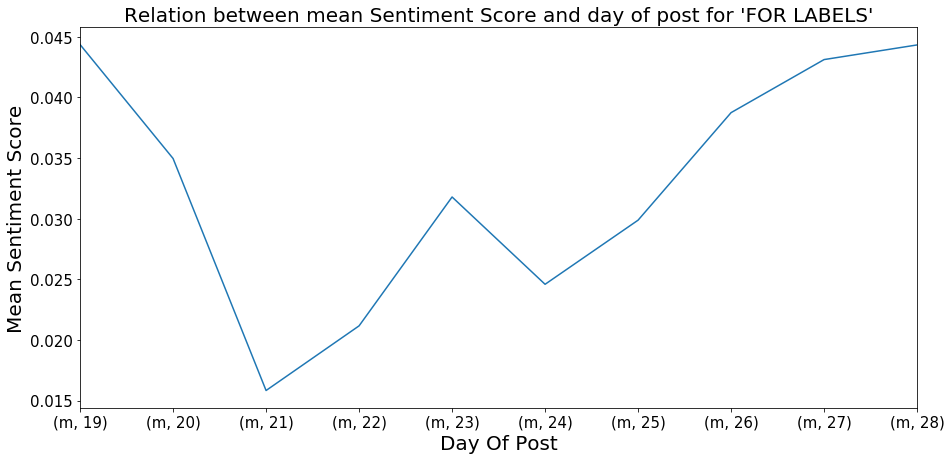

In [67]:
df_for=df1[df1['target']==1]
df_for['day']=df['date'].apply(lambda x :x[8:10])
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min1 = df_for.groupby(['day'])['sentiment_score'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Sentiment Score',fontsize=20)
ax.set_title("Relation between mean Sentiment Score and day of post for 'FOR LABELS'",fontsize=20)

ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
'''temp_min2 = df_for.groupby(['day'])['countnoun'].agg({'m': np.mean}).unstack().plot(ax=ax)
temp_min3 = df_for.groupby(['day'])['countverb'].agg({'m': np.mean}).unstack().plot(ax=ax)
temp_min4 = df_for.groupby(['day'])['countadj'].agg({'m': np.mean}).unstack().plot(ax=ax)'''



c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  


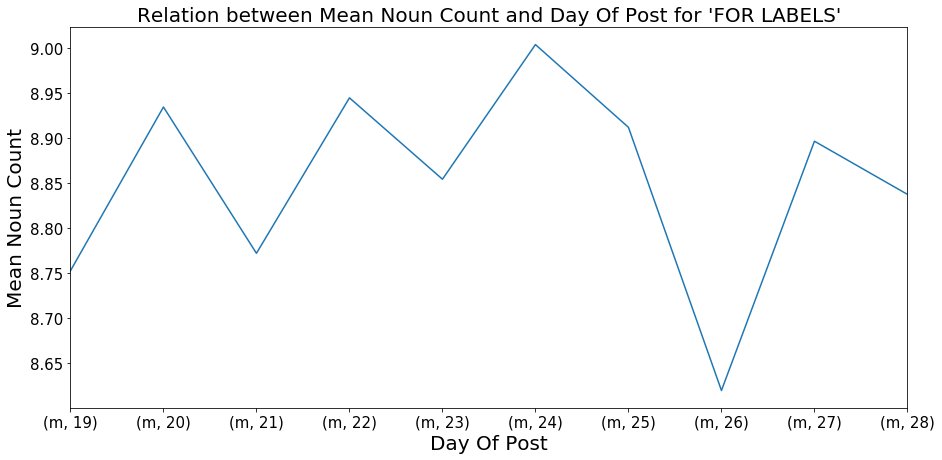

In [68]:
df_for=df1[df1['target']==1]
df_for['day']=df['date'].apply(lambda x :x[8:10])
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min2 = df_for.groupby(['day'])['countnoun'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Noun Count',fontsize=20)
ax.set_title("Relation between Mean Noun Count and Day Of Post for 'FOR LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  


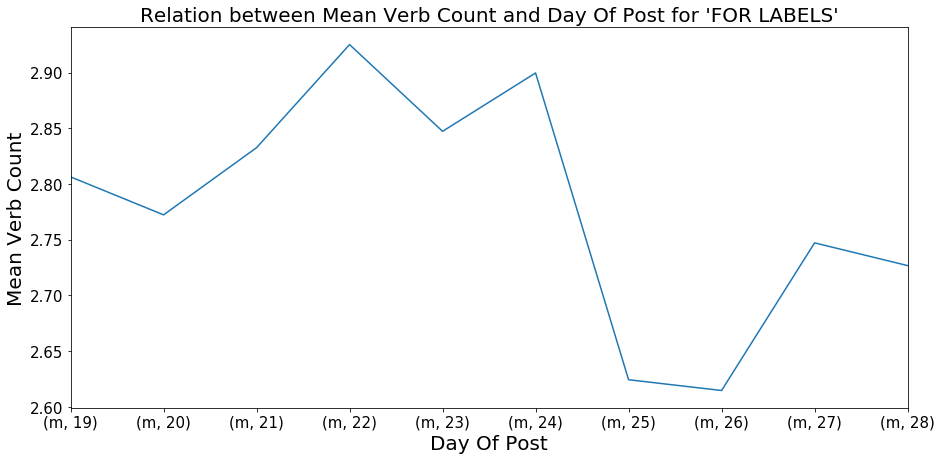

In [69]:
df_for=df1[df1['target']==1]
df_for['day']=df['date'].apply(lambda x :x[8:10])
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min3 = df_for.groupby(['day'])['countverb'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Verb Count',fontsize=20)
ax.set_title("Relation between Mean Verb Count and Day Of Post for 'FOR LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  


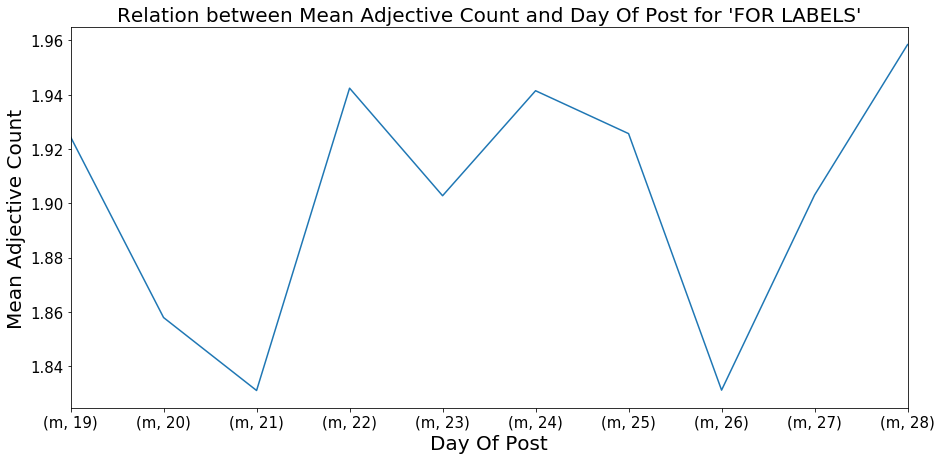

In [70]:
df_for=df1[df1['target']==1]
df_for['day']=df['date'].apply(lambda x :x[8:10])
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min3 = df_for.groupby(['day'])['countadj'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Adjective Count',fontsize=20)
ax.set_title("Relation between Mean Adjective Count and Day Of Post for 'FOR LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  


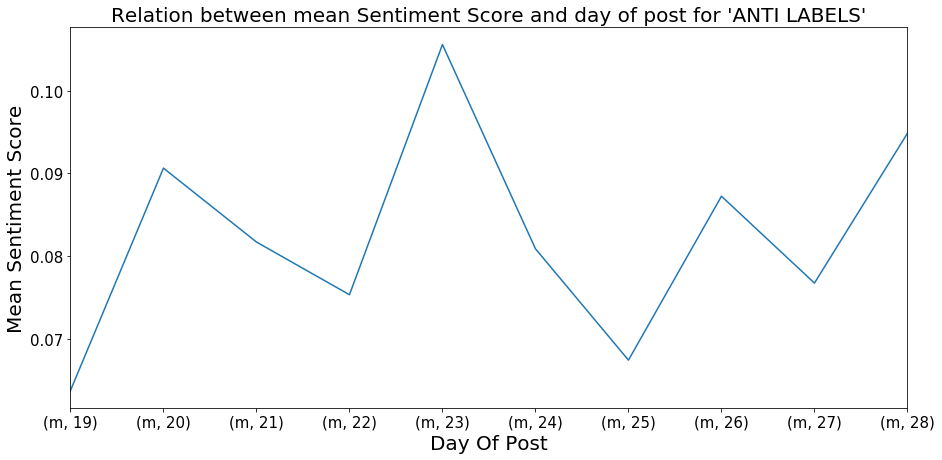

In [71]:
df_against=df1[df1['target']==0]
df_against['day']=df['date'].apply(lambda x :x[8:10])
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min1 = df_against.groupby(['day'])['sentiment_score'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Sentiment Score',fontsize=20)
ax.set_title("Relation between mean Sentiment Score and day of post for 'ANTI LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  after removing the cwd from sys.path.


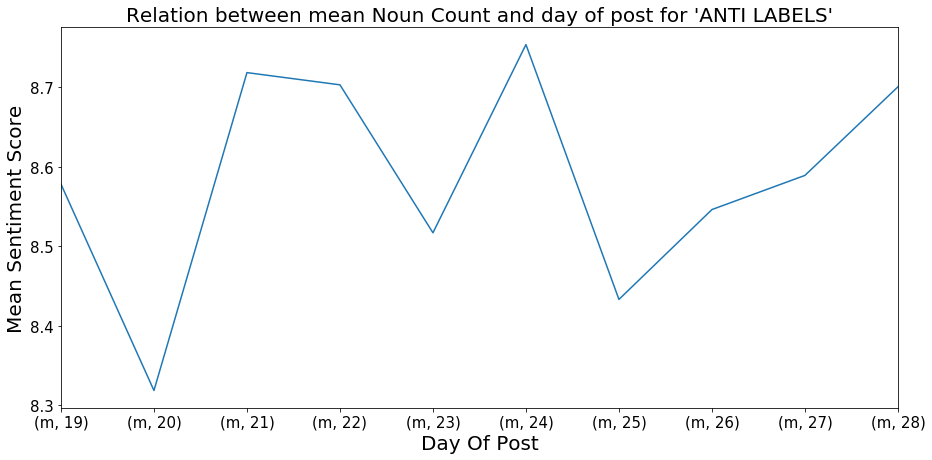

In [72]:
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min1 = df_against.groupby(['day'])['countnoun'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Sentiment Score',fontsize=20)
ax.set_title("Relation between mean Noun Count and day of post for 'ANTI LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  after removing the cwd from sys.path.


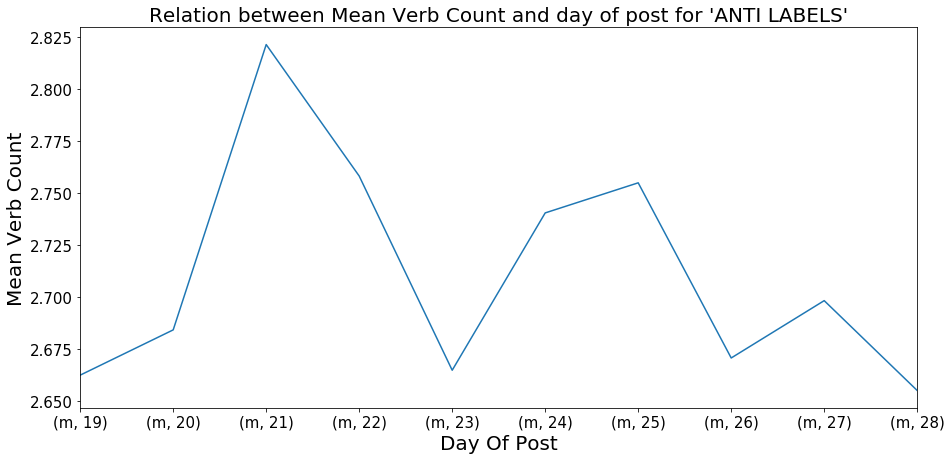

In [73]:
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min1 = df_against.groupby(['day'])['countverb'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Verb Count',fontsize=20)
ax.set_title("Relation between Mean Verb Count and day of post for 'ANTI LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)

  after removing the cwd from sys.path.


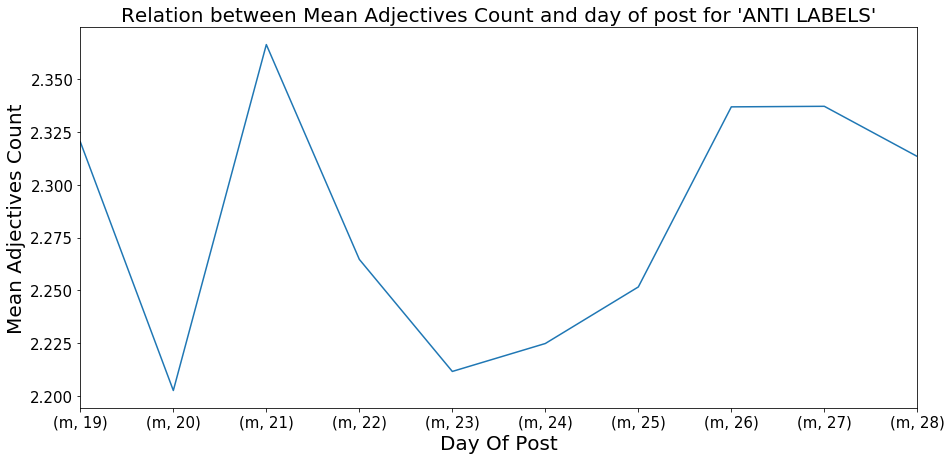

In [74]:
fig, ax = plt.subplots(figsize=(15,7))

#temp_min = df_for.groupby(['date'])['countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score'].agg({'mean_variation': np.mean}).unstack().plot(ax=ax)
temp_min1 = df_against.groupby(['day'])['countadj'].agg({'m': np.mean}).unstack().plot(ax=ax)
ax.set_xlabel('Day Of Post',fontsize=20)
ax.set_ylabel('Mean Adjectives Count',fontsize=20)
ax.set_title("Relation between Mean Adjectives Count and day of post for 'ANTI LABELS'",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

In [75]:
temp_min1 = df_for.groupby(['day'])['sentiment_score','countnoun','countverb','countadj'].agg({'m': np.mean}).unstack()
print (temp_min1)

                    day
m  sentiment_score  19     0.044357
                    20     0.034961
                    21     0.015826
                    22     0.021159
                    23     0.031787
                    24     0.024586
                    25     0.029875
                    26     0.038743
                    27     0.043119
                    28     0.044327
   countnoun        19     8.752747
                    20     8.934169
                    21     8.772093
                    22     8.944338
                    23     8.854167
                    24     9.003344
                    25     8.911641
                    26     8.620075
                    27     8.896290
                    28     8.837370
   countverb        19     2.806319
                    20     2.772205
                    21     2.832558
                    22     2.925144
                    23     2.847222
                    24     2.899666
                    25     2.624123
    

c:\users\dell\appdata\local\programs\python\python37\lib\site-packages\pandas\core\groupby\generic.py:1455: FutureWarning: using a dict with renaming is deprecated and will be removed
in a future version.

For column-specific groupby renaming, use named aggregation

    >>> df.groupby(...).agg(name=('column', aggfunc))

  return super().aggregate(arg, *args, **kwargs)


In [76]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import classification_report

df = pd.read_csv('f_a2.csv')
df.columns=['index','date','tweet','target']
df



,index,date,tweet,target
0,2,2019-09-23,rt chronovarience texas mass shooting survivor...,for
1,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,for
2,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,for
3,5,2019-09-25,arizona state representative jen longdon gunvi...,for
4,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,for
...,...,...,...,...
13678,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,against
13679,13681,2019-09-26,bought subscriptions amee awesome output impea...,for
13680,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,for
13681,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,against


In [77]:
flairs=['for','against']
cat = df.target

V = df.tweet

X_train, X_test, y_train, y_test = train_test_split( V, cat, test_size=0.3, random_state = 42)
print("Results of Random Forest")
from sklearn.ensemble import RandomForestClassifier
  
ranfor = Pipeline([('vect', CountVectorizer()),
                  ('tfidf', TfidfTransformer()),
                  ('clf', RandomForestClassifier(n_estimators = 1000, random_state = 42)),
                  ])

ranfor.fit(X_train, y_train)
y_pred = ranfor.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=flairs))

Results of Random Forest
accuracy 0.9527405602923265
              precision    recall  f1-score   support

         for       0.96      0.93      0.95      1935
     against       0.94      0.97      0.96      2170

    accuracy                           0.95      4105
   macro avg       0.95      0.95      0.95      4105
weighted avg       0.95      0.95      0.95      4105



In [78]:
acc_test=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, test_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', RandomForestClassifier(n_estimators = 100, random_state = 42)),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_test.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_test)    

accuracy 0.95836376917458
accuracy 0.9514066496163683
accuracy 0.9517661388550548
accuracy 0.9499451954694922
accuracy 0.9516223326512716
accuracy 0.9448233861144946
accuracy 0.9438354734314647
accuracy 0.9413537955604275
accuracy 0.928136419001218
[0.95836376917458, 0.9514066496163683, 0.9517661388550548, 0.9499451954694922, 0.9516223326512716, 0.9448233861144946, 0.9438354734314647, 0.9413537955604275, 0.928136419001218]


In [79]:
acc_train=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, train_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', RandomForestClassifier(n_estimators = 100, random_state = 42)),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_train.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_train)    

accuracy 0.928136419001218
accuracy 0.9413537955604275
accuracy 0.9438354734314647
accuracy 0.9448233861144946
accuracy 0.9516223326512716
accuracy 0.9499451954694922
accuracy 0.9517661388550548
accuracy 0.9514066496163683
accuracy 0.95836376917458
[0.928136419001218, 0.9413537955604275, 0.9438354734314647, 0.9448233861144946, 0.9516223326512716, 0.9499451954694922, 0.9517661388550548, 0.9514066496163683, 0.95836376917458]


In [80]:
acc_log_test=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, test_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', LogisticRegression(solver='lbfgs', multi_class='auto')),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_log_test.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_log_test) 

accuracy 0.9620160701241782
accuracy 0.9612714651077823
accuracy 0.9624847746650427
accuracy 0.9610887833394227
accuracy 0.9590762934814382
accuracy 0.9548112058465287
accuracy 0.9530222361415597
accuracy 0.9503060199141318
accuracy 0.9386926512383272
[0.9620160701241782, 0.9612714651077823, 0.9624847746650427, 0.9610887833394227, 0.9590762934814382, 0.9548112058465287, 0.9530222361415597, 0.9503060199141318, 0.9386926512383272]


In [81]:
acc_svm_test=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, test_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', svm.SVC(kernel='linear')),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_svm_test.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_svm_test) 

accuracy 0.9656683710737765
accuracy 0.9663865546218487
accuracy 0.964190012180268
accuracy 0.964011691633175
accuracy 0.9614147909967846
accuracy 0.9577344701583435
accuracy 0.9539617914187285
accuracy 0.9503973691422307
accuracy 0.9404790905399919
[0.9656683710737765, 0.9663865546218487, 0.964190012180268, 0.964011691633175, 0.9614147909967846, 0.9577344701583435, 0.9539617914187285, 0.9503973691422307, 0.9404790905399919]


In [82]:
acc_log_train=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, train_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', LogisticRegression(solver='lbfgs', multi_class='auto')),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_log_train.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_log_train)    

accuracy 0.9386926512383272
accuracy 0.9503060199141318
accuracy 0.9530222361415597
accuracy 0.9548112058465287
accuracy 0.9590762934814382
accuracy 0.9610887833394227
accuracy 0.9624847746650427
accuracy 0.9612714651077823
accuracy 0.9620160701241782
[0.9386926512383272, 0.9503060199141318, 0.9530222361415597, 0.9548112058465287, 0.9590762934814382, 0.9610887833394227, 0.9624847746650427, 0.9612714651077823, 0.9620160701241782]


In [83]:
cat = df.target

V = df.tweet

acc_svm_train=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, train_size=(i+1)/10, random_state = 42)

    svtrain = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', svm.SVC(kernel='linear')),
                      ])

    svtrain.fit(X_train, y_train)
    y_pred = svtrain.predict(X_test)
    acc_svm_train.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_svm_train)

accuracy 0.9404790905399919
accuracy 0.9503973691422307
accuracy 0.9539617914187285
accuracy 0.9577344701583435
accuracy 0.9614147909967846
accuracy 0.964011691633175
accuracy 0.964190012180268
accuracy 0.9663865546218487
accuracy 0.9656683710737765
[0.9404790905399919, 0.9503973691422307, 0.9539617914187285, 0.9577344701583435, 0.9614147909967846, 0.964011691633175, 0.964190012180268, 0.9663865546218487, 0.9656683710737765]


In [84]:
acc_k_train=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, train_size=(i+1)/10, random_state = 42)

    svtrain = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', KNeighborsClassifier(n_neighbors=3)),
                      ])

    svtrain.fit(X_train, y_train)
    y_pred = svtrain.predict(X_test)
    acc_k_train.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_k_train)

accuracy 0.7875761266747868
accuracy 0.8089887640449438
accuracy 0.8255559035389916
accuracy 0.8375152253349574
accuracy 0.8456591639871383
accuracy 0.8569601753744976
accuracy 0.8591961023142509
accuracy 0.866642309097552
accuracy 0.8736303871439006
[0.7875761266747868, 0.8089887640449438, 0.8255559035389916, 0.8375152253349574, 0.8456591639871383, 0.8569601753744976, 0.8591961023142509, 0.866642309097552, 0.8736303871439006]


In [85]:
acc_k_test=[]
for i in range(9):
    X_train, X_test, y_train, y_test = train_test_split( V, cat, test_size=(i+1)/10, random_state = 42)

    ranfor = Pipeline([('vect', CountVectorizer()),
                      ('tfidf', TfidfTransformer()),
                      ('clf', KNeighborsClassifier(n_neighbors=3)),
                      ])

    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    acc_k_test.append(accuracy_score(y_pred, y_test))
    print('accuracy %s' % accuracy_score(y_pred, y_test))
print (acc_k_test) 

accuracy 0.8736303871439006
accuracy 0.866642309097552
accuracy 0.8591961023142509
accuracy 0.8569601753744976
accuracy 0.8456591639871383
accuracy 0.8375152253349574
accuracy 0.8255559035389916
accuracy 0.8089887640449438
accuracy 0.7875761266747868
[0.8736303871439006, 0.866642309097552, 0.8591961023142509, 0.8569601753744976, 0.8456591639871383, 0.8375152253349574, 0.8255559035389916, 0.8089887640449438, 0.7875761266747868]


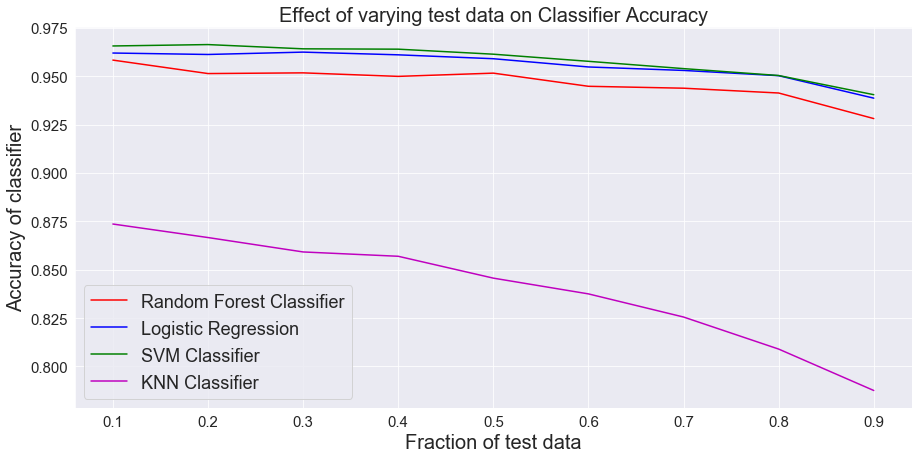

In [86]:
import matplotlib.pyplot as plt
import numpy as np

x = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
y1=acc_test
y2=acc_log_test
y3=acc_svm_test
y4=acc_k_test
sns.set_style("darkgrid")

fig, ax = plt.subplots(figsize=(15,7))

plt.plot(x,y1,'r-',label='Random Forest Classifier')
plt.plot(x,y2,'b-',label='Logistic Regression')
plt.plot(x,y3,'g-',label='SVM Classifier')
plt.plot(x,y4,'m-',label='KNN Classifier')


ax.legend( prop={'size': 18})

ax.set_xlabel('Fraction of test data',fontsize=20)
ax.set_ylabel('Accuracy of classifier',fontsize=20)
ax.set_title("Effect of varying test data on Classifier Accuracy",fontsize=20)

ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)



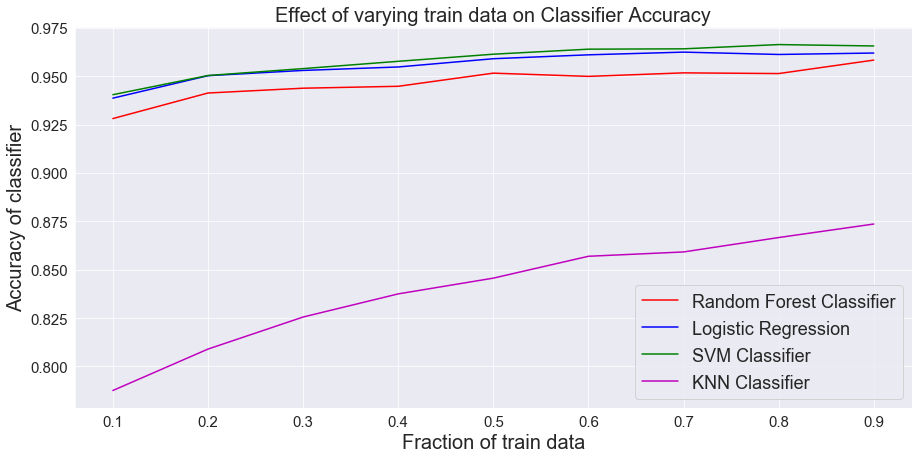

In [87]:
import matplotlib.pyplot as plt
import numpy as np

x = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
y1=acc_train
y2=acc_log_train
y3=acc_svm_train
y4=acc_k_train
sns.set_style("darkgrid")

fig, ax = plt.subplots(figsize=(15,7))

plt.plot(x,y1,'r-',label='Random Forest Classifier')
plt.plot(x,y2,'b-',label='Logistic Regression')
plt.plot(x,y3,'g-',label='SVM Classifier')
plt.plot(x,y4,'m-',label='KNN Classifier')

ax.legend( prop={'size': 18})

ax.set_xlabel('Fraction of train data',fontsize=20)
ax.set_ylabel('Accuracy of classifier',fontsize=20)
ax.set_title("Effect of varying train data on Classifier Accuracy",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)



In [88]:
df1 = pd.read_csv('f_a3.csv')
df1.columns=['index','date','tweet','countnoun','countverb','countadj','countadp','countadv','countnum','countaux','countconj','countdet','countintj','countpart','countpron','countpropn','countpunct','countsconj','countx','sentiment_score','target']  
df1

,index,date,tweet,countnoun,countverb,countadj,countadp,countadv,countnum,countaux,...,countdet,countintj,countpart,countpron,countpropn,countpunct,countsconj,countx,sentiment_score,target
0,3,2019-09-27,time hear elite wealthy democrat guncontrol re...,11,3,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0.750000,1
1,4,2019-09-24,olofsdotterk royarahmani nzambassadorus mars...,11,4,3,0,0,0,0,...,0,0,0,0,1,0,0,0,0.000000,1
2,5,2019-09-25,arizona state representative jen longdon gunvi...,16,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.150000,1
3,6,2019-09-20,kamalaharris lot senatemajldr senategop stup...,7,3,3,0,0,0,0,...,0,0,0,0,0,0,0,0,-0.487879,1
4,7,2019-09-26,ugh straight heart gopcomplicittraitors feels ...,10,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.200000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13677,13680,2019-09-27,reprochoiceau abortion mothers premeditated ...,8,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,0
13678,13681,2019-09-26,bought subscriptions amee awesome output impea...,9,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1.000000,1
13679,13682,2019-09-22,rt conserv_tribune homeowner retired los angel...,8,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000000,1
13680,13683,2019-09-20,rt timjdillon meghan mccain stands second amen...,7,2,2,1,0,0,0,...,0,0,0,0,0,0,0,1,0.000000,0


In [89]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_validate
clf = make_pipeline(TfidfVectorizer(), svm.SVC(kernel='linear'))

scores = cross_validate(clf, df1['tweet'], df1['target'], scoring=['accuracy'], cv=5, return_train_score=False)
print(scores)

{'fit_time': array([8.90718126, 8.91316843, 9.04581738, 8.73715186, 8.85532308]), 'score_time': array([1.62665296, 1.59772873, 1.66354942, 1.52492404, 1.80417442]), 'test_accuracy': array([0.96675192, 0.96054074, 0.96967483, 0.95942982, 0.96380256])}


In [90]:
scores

{'fit_time': array([8.90718126, 8.91316843, 9.04581738, 8.73715186, 8.85532308]),
 'score_time': array([1.62665296, 1.59772873, 1.66354942, 1.52492404, 1.80417442]),
 'test_accuracy': array([0.96675192, 0.96054074, 0.96967483, 0.95942982, 0.96380256])}

In [91]:
scores['fit_time']
time_arr=scores['fit_time']
print (time_arr)

[8.90718126 8.91316843 9.04581738 8.73715186 8.85532308]


In [92]:
scores['score_time']

array([1.62665296, 1.59772873, 1.66354942, 1.52492404, 1.80417442])

In [93]:
scores['test_accuracy']
accuracy_arr=scores['test_accuracy']
print (accuracy_arr)

[0.96675192 0.96054074 0.96967483 0.95942982 0.96380256]


In [94]:
print (arr)

NameError: name 'arr' is not defined

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_validate
clf = make_pipeline(TfidfVectorizer(), svm.SVC(kernel='linear'))

scores10 = cross_validate(clf, df1['tweet'], df1['target'], scoring=['accuracy'], cv=10, return_train_score=False)
print(scores10)

In [ ]:
scores10['test_accuracy']
time_arr10=scores10['test_accuracy']
print (time_arr10)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x1 = [1,2,3,4,5]
x2=  [1,2,3,4,5,6,7,8,9,10]
y1=accuracy_arr
y2=time_arr10
sns.set_style("darkgrid")

fig, ax = plt.subplots(figsize=(15,7))

plt.plot(x1,y1,'r-',label='5-Fold Classification')
plt.plot(x2,y2,'b-',label='10-Fold Classification')
ax.legend( prop={'size': 18})

ax.set_xlabel('Folds',fontsize=20)
ax.set_ylabel('Accuracy',fontsize=20)
ax.set_title("Effect of varying Folds on Accuracy",fontsize=20)
ax = plt.gca()
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
